In [2]:
import pandas as pd
import numpy as np
import glob
import os
import re
import sys 
import pickle
from tqdm import tqdm_notebook as tqdm
from matplotlib import pyplot as plt
import multiprocessing

In [3]:



# IN THE FOLLOWING, THERE IS THE TRAINING PART OF THE GENETIC ALGORITHM, WHICH IS BASED ON THE DATASET UJIINDOORLOC 1 #




In [4]:
file = open('./dataset_processati/dataset_UJI1.pickle', 'rb')

dataframe = pickle.load(file)
file.close()

dataframe['floor_id'] = dataframe['floor_id'].astype('int8')
dataframe['building_id'] = dataframe['building_id'].astype('int8')
dataframe['coord_z'] = dataframe['coord_z'].astype('float32')
for col in [x for x in dataframe.columns if 'WAP' in x]:
    dataframe[col] = dataframe[col].astype('int16')



dataframe_train = dataframe[dataframe['set'] == 'training'].drop(columns=['set']) 
dataframe_test = dataframe[dataframe['set'] == 'test'].drop(columns=['set']) 

 
display(dataframe_train.head(5))

display(dataframe_train.dtypes)

display(dataframe_train.shape)


,WAP000,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,...,WAP515,WAP516,WAP517,WAP518,WAP519,coord_x,coord_y,coord_z,floor_id,building_id
0,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,-7541.2643,4.864921e+06,7.4,2,1
1,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,-7536.6212,4.864934e+06,7.4,2,1
2,100,100,100,100,100,100,100,-97,100,100,...,100,100,100,100,100,-7519.1524,4.864950e+06,7.4,2,1
3,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,-7524.5704,4.864934e+06,7.4,2,1
4,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,-7533.8962,4.864939e+06,7.4,2,1


WAP000           int16
WAP001           int16
WAP002           int16
WAP003           int16
WAP004           int16
                ...   
coord_x        float64
coord_y        float64
coord_z        float32
floor_id          int8
building_id       int8
Length: 525, dtype: object

(19861, 525)

In [5]:
# The idea is as follows.
# The genetic algorithm will try to find the best possible combination of the classical metrics, to optimize a given objective.
# In order to evaluate the fitness function without going in overfitting, at each generation a different set of points is considered.
# The number of points considered at each generation, as well as the total number of generations and the total number of distinct sets can be customized in the next cell.
# For instance, the algorithm may run for 50 generations using 10 different random sets each composed of 400 points.

In [6]:
import sys
import os

num_generations = 500 # number of generations 

max_samp_per_set = 100 # upper bound to the number of samples/points to consider in the datasets at each generation of the evolutionary algorithm, to determine the fitness function of the individuals (100 points correspond to 4950 distinct pairwise distances)

num_whole_sets_fitness = 30 # how many "whole" sets to use to calculate the training fitness 
num_building_sets_fitness = 30 # how many "same building" sets to use to calculate the training fitness 
num_floor_sets_fitness = 30 # how many "same floor" sets to use to calculate the training fitness 

num_whole_sets_validation = 30 # how many "whole" sets to use to calculate the validation fitness 
num_building_sets_validation = 30 # how many "same building" sets to use to calculate the validation fitness 
num_floor_sets_validation = 30 # how many "same floor"  sets to use to calculate the validation fitness 

rotation_frequency = 1 # after how many generations to resample the training sets used for fitness calculations

num_whole_sets = 4000 # how many sets to generate having the points sampled from the whole scenario (used both for training and validation)
num_building_sets = 4000 # how many sets to generate having the points sampled from a same building (used both for training and validation)
num_floor_sets = 4000 # how many sets to generate having the points sampled from a same floor (used both for training and validation)

perc_validation_set = 0.1 # percentage of the total number of generated sets that will be used for the validation of the algorithm during the training phase (e.g., 0.1 means that, over 4000 "same building" sets, 400 will be used for validation purposes)

AP_NULL_PLACEHOLDER = 100 # value to be considered as null RSS in the fingerprint columns (used for normalization purposes)
epsilon = sys.float_info.epsilon # value added to all our training and test data in order to avoid an all-zero input

num_parallel_evals = os.cpu_count() - 1 # how many individuals to evaluate at the same time
print("Using", num_parallel_evals, "cores to evaluate the individuals")

remove_fully_different = False # remove all couples that do not share any AP when training the genetic algorithm

Using 63 cores to evaluate the individuals


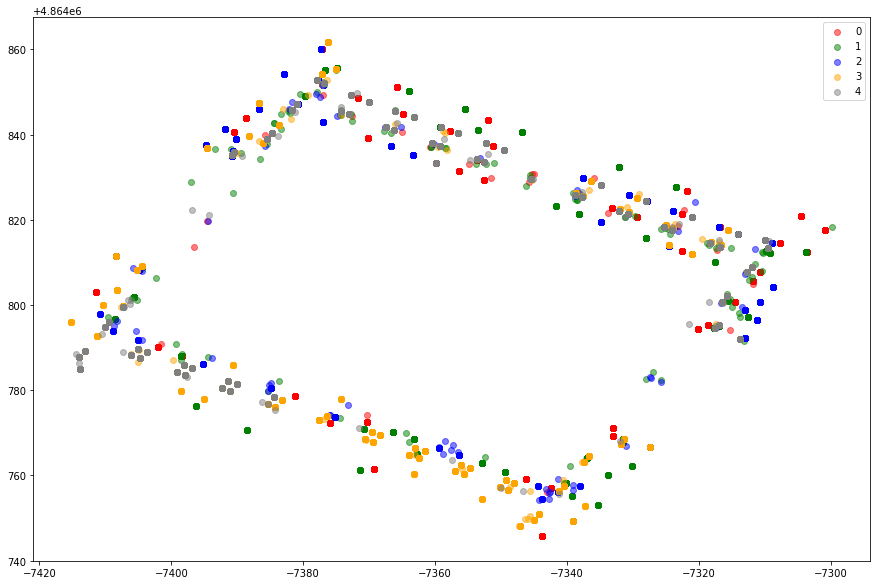

In [7]:
plt.figure(figsize=(15, 10))
colori = ['red', 'green', 'blue', 'orange', 'grey']
building_index = dataframe_train.groupby(['building_id'])['coord_z'].nunique().idxmax()
floors = np.unique(dataframe_train[dataframe_train['building_id'] == building_index]['floor_id'])
num_floors = len(floors)
for i, floor in enumerate(floors):
    prova = dataframe[(dataframe['building_id'] == building_index) & (dataframe['floor_id'] == floor)][['coord_x', 'coord_y']]
    plt.scatter(prova['coord_x'], prova['coord_y'], color=colori[i], alpha=0.5, label=i)
plt.legend()
plt.show()

In [8]:
# Normalization function

from math import e
from math import exp


    
# We assume that the min value is -110
# While this is indeed true for UJI1 (which reaches -104), the values in the other datasets will be truncated (it does not make much of a difference)
def normalize_zero_to_one(df, min_value=110):
    df_cp = df.copy()

    columns_to_keep = [elem for elem in list(df_cp.columns) if 'WAP' in elem]
    df_cp[columns_to_keep] = df_cp[columns_to_keep].replace(AP_NULL_PLACEHOLDER, np.nan).astype('double')
    df_cp[columns_to_keep] = (df_cp[columns_to_keep] + min_value)
    df_cp[columns_to_keep] = df_cp[columns_to_keep].fillna(0) / min_value
        
    return df_cp
    


In [9]:
import warnings

warnings.filterwarnings('ignore')


In [10]:
# Definition of classical metrics

import fnmatch


def cartesian_product_basic(left, right):
    return(left.assign(key=1).merge(right.assign(key=1), on='key', suffixes=['_a','_b']).drop('key', 1))



# it calculates the Euclidean 3D spatial distance
# INPUT: a dataframe with 4 columns, with the 2 pairs of x,y coordinates of the couples of points to consider
# OUTPUT: the array of calculated distances
def spat_dist_3D(df):
    return np.linalg.norm(np.asarray((df[['coord_x_a','coord_y_a', 'coord_z_a']]))-np.asarray((df[['coord_x_b', 'coord_y_b', 'coord_z_b']])), axis=1)




# Next, the definition of the metrics over fingerprints follows

def euclidean_fp(df):
    lst = list(df.columns)
    return np.linalg.norm(np.asarray((df[fnmatch.filter(lst, 'WAP*a')]))-np.asarray((df[fnmatch.filter(lst, 'WAP*b')])), axis=1)

    
def cosine(df):
    temp = np.concatenate((np.expand_dims(np.asarray(df[fnmatch.filter(df.columns, 'WAP*a')]), axis=1), 
               np.expand_dims(np.asarray(df[fnmatch.filter(df.columns, 'WAP*b')]), axis=1)), 
               axis=1)
    return 1 - np.sum(np.prod(temp, axis=1), axis=1) / np.prod(np.linalg.norm(temp, axis=2), axis=1)


def matusita(df):
    # sqrt(sum((sqrt(p) - sqrt(q)).^2));
    temp = np.concatenate((np.expand_dims(np.asarray(df[fnmatch.filter(df.columns, 'WAP*a')]), axis=1), 
                       np.expand_dims(np.asarray(df[fnmatch.filter(df.columns, 'WAP*b')]), axis=1)), 
                       axis=1)
    return np.sqrt(np.sum(np.power(np.diff(np.sqrt(temp), axis=1), 2), axis=2))
    





# Helper function to be used in the multiprocessing
def call_function_on_df(function_in, df_in):
    return function_in(df_in)


functions_list = [spat_dist_3D, euclidean_fp, cosine, matusita] # leave tha Euclidean 3D distance in the first position of the list

In [11]:
# Now we have to pre-calculate all metric distances between the points in the dataset

# First of all, let us normalize the datasets
dataframe_train_normalized = normalize_zero_to_one(dataframe_train, min_value=110)
dataframe_test_normalized = normalize_zero_to_one(dataframe_test, min_value=110)

In [12]:
# Now we have to randomly generate the sets used by the genetic algorithm and, for each one of them, calculate the distance metrics for each couple of points.
# Generating the sets may take hours.
# THIS CELL ALSO DELETES PREVIOSLY DEFINED SETS. USE WITH CAUTION.




assert False, 'This is used as a failsafe measure. Delete this instruction to execute the cell content.'




# Delete previously defined fitness sets
import os
import glob
files = glob.glob('./sets_bi_objective/training_*')
for f in files:
    os.remove(f)
    

# Prepare both kinds of datasets: those with all the couples and those with only couples with at least a common AP
for substr in ['all_', 'common_']:

    from multiprocessing import Pool
    from tqdm.notebook import tqdm
    import pickle
    import random
    random.seed(42)


    # Generating the whole sets for training and validation purposes
    pbar = tqdm(total = num_whole_sets)
    for i in range(num_whole_sets):
        num_samples = min(max_samp_per_set, len(dataframe_train_normalized))
        random_samples = random.sample(range(len(dataframe_train_normalized)), num_samples)
        merged_df = cartesian_product_basic(dataframe_train_normalized.iloc[random_samples].reset_index(), 
                                            dataframe_train_normalized.iloc[random_samples].reset_index())

        # disregarding rows that compare and element with itself
        len_before = len(merged_df)
        merged_df = merged_df[merged_df['index_a'] < merged_df['index_b']] # strictly less so to remove duplicate rows
        assert len(merged_df) == (len_before - max_samp_per_set) - (len_before - max_samp_per_set)/2    


        # If you want to remove all couples with no APs in common...
        if substr == 'common_':
            df = merged_df.copy()
            temp = np.concatenate((np.expand_dims(np.asarray(df[fnmatch.filter(df.columns, 'WAP*a')]), axis=1), 
                           np.expand_dims(np.asarray(df[fnmatch.filter(df.columns, 'WAP*b')]), axis=1)), 
                           axis=1)
            temp = np.argwhere(np.sum(np.prod(temp, axis=1), axis=1)).flatten()
            merged_df = merged_df.iloc[list(temp)]


        # Determining the distances between each couple of observations: euclidean 3D distance and the 3 considered fingerprint distances
        p = Pool(num_parallel_evals)
        metric_distances = p.starmap(call_function_on_df, [(metr_name, merged_df) for metr_name in functions_list])
        p.close()
        p.join()

        metric_distances = np.asarray([list(x.flatten()) for x in metric_distances]).T # here I have 4 metric results for each couple. The first one is the spatial distance.

        pickle_file = open('./sets_bi_objective/training_whole_' + substr + str(max_samp_per_set) + "_" + str(i), 'wb')
        pickle.dump(metric_distances, pickle_file)
        pickle_file.close()

        pbar.update(1)

    pbar.close()                 



    # Generating the building sets for training and validation purposes
    pbar = tqdm(total = num_building_sets)
    for i in range(num_building_sets):
        b_id = random.choice(list(np.unique(dataframe_train_normalized['building_id'].values)))
        num_samples = min(max_samp_per_set, len(dataframe_train_normalized[dataframe_train_normalized['building_id']==b_id]))
        random_samples = random.sample(range(dataframe_train_normalized[dataframe_train_normalized['building_id']==b_id].shape[0]), num_samples)
        merged_df = cartesian_product_basic(dataframe_train_normalized[dataframe_train_normalized['building_id']==b_id].iloc[random_samples].reset_index(), 
                                            dataframe_train_normalized[dataframe_train_normalized['building_id']==b_id].iloc[random_samples].reset_index())

        # elimino le righe che confrontano un sample con se stesso
        len_before = len(merged_df)
        merged_df = merged_df[merged_df['index_a'] < merged_df['index_b']] # minore stretto in quanto dobbiamo eliminare i doppioni 

        
        # If you want to remove all couples with no APs in common...
        if substr == 'common_':
            df = merged_df.copy()
            temp = np.concatenate((np.expand_dims(np.asarray(df[fnmatch.filter(df.columns, 'WAP*a')]), axis=1), 
                           np.expand_dims(np.asarray(df[fnmatch.filter(df.columns, 'WAP*b')]), axis=1)), 
                           axis=1)
            temp = np.argwhere(np.sum(np.prod(temp, axis=1), axis=1)).flatten()
            merged_df = merged_df.iloc[list(temp)]
        
        
        # Determining the distances between each couple of observations: euclidean 3D distance and the 3 considered fingerprint distances
        p = Pool(num_parallel_evals)
        metric_distances = p.starmap(call_function_on_df, [(metr_name, merged_df) for metr_name in functions_list])
        p.close()
        p.join()

        metric_distances = np.asarray([list(x.flatten()) for x in metric_distances]).T # here I have 4 metric results for each couple. The first one is the spatial distance.

        pickle_file = open('./sets_bi_objective/training_building_' + substr + str(max_samp_per_set) + "_" + str(i), 'wb')
        pickle.dump(metric_distances, pickle_file)
        pickle_file.close()

        pbar.update(1)

    pbar.close()    



    # Generating the floor sets for training and validation purposes
    pbar = tqdm(total = num_floor_sets)
    for i in range(num_floor_sets):
        b_id = random.choice(list(np.unique(dataframe_train_normalized['building_id'].values)))
        f_id = random.choice(list(np.unique(dataframe_train_normalized[dataframe_train_normalized['building_id']==b_id]['floor_id'].values)))
        num_samples = min(max_samp_per_set, len(dataframe_train_normalized[(dataframe_train_normalized['building_id']==b_id) & (dataframe_train_normalized['floor_id']==f_id)]))
        random_samples = random.sample(range(dataframe_train_normalized[(dataframe_train_normalized['building_id']==b_id) & (dataframe_train_normalized['floor_id']==f_id)].shape[0]), num_samples)
        merged_df = cartesian_product_basic(dataframe_train_normalized[(dataframe_train_normalized['building_id']==b_id) & (dataframe_train_normalized['floor_id']==f_id)].iloc[random_samples].reset_index(), 
                                            dataframe_train_normalized[(dataframe_train_normalized['building_id']==b_id) & (dataframe_train_normalized['floor_id']==f_id)].iloc[random_samples].reset_index())

        # elimino le righe che confrontano un sample con se stesso
        len_before = len(merged_df)
        merged_df = merged_df[merged_df['index_a'] < merged_df['index_b']] # minore stretto in quanto dobbiamo eliminare i doppioni 
        
        
        # If you want to remove all couples with no APs in common...
        if substr == 'common_':
            df = merged_df.copy()
            temp = np.concatenate((np.expand_dims(np.asarray(df[fnmatch.filter(df.columns, 'WAP*a')]), axis=1), 
                           np.expand_dims(np.asarray(df[fnmatch.filter(df.columns, 'WAP*b')]), axis=1)), 
                           axis=1)
            temp = np.argwhere(np.sum(np.prod(temp, axis=1), axis=1)).flatten()
            merged_df = merged_df.iloc[list(temp)]
            

        # Determining the distances between each couple of observations: euclidean 3D distance and the 3 considered fingerprint distances
        p = Pool(num_parallel_evals)
        metric_distances = p.starmap(call_function_on_df, [(metr_name, merged_df) for metr_name in functions_list])
        p.close()
        p.join()

        metric_distances = np.asarray([list(x.flatten()) for x in metric_distances]).T # here I have 4 metric results for each couple. The first one is the spatial distance.

        pickle_file = open('./sets_bi_objective/training_floor_' + substr + str(max_samp_per_set) + "_" + str(i), 'wb')
        pickle.dump(metric_distances, pickle_file)
        pickle_file.close()

        pbar.update(1)

    pbar.close()    



AssertionError: This is used as a failsafe measure. Delete this instruction to execute the cell content.

In [13]:

distance_thresholds = [0, 10] # distance threshold in meters defining the intervals that are going to be optimized in parallel by the genetic algorithm. 0 has always to be kept

cut_distance = 999 # maximum allowed distance, that will be considered by the genetic algorithm


In [14]:
# !pip install deap
# GA that tries to minimize the distance of the points (spatial_distance_3D, genetic_distance) from the optimal correlation line


# First some helper functions to speed up the application of a function over the rows of a numpy array
import multiprocessing
import numpy as np


# Now let us turn to the genetic algorithm 


import random
random.seed(42)

from deap import base
from deap import creator
from deap import tools
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from scipy.stats import pearsonr
from operator import attrgetter
from deap import gp
import operator
import itertools
from multiprocessing import Pool



# used to calculate the Pareto front of the population
def dominates(a, b):
    dominates = True
    different = False
    for i in range(len(distance_thresholds)):
        if not(a[i] >= b[i]):
            dominates = False
        if a[i] != b[i]:
            different = True
    return dominates and different
    
        

def parallel_extract_all_front(params): # reference fitness value and all fitnesses
    element_fitness = params[0]
    all_fitnesses = params[1]
    is_dominated = False
    for yfit in all_fitnesses:
        if dominates(yfit, element_fitness):
            is_dominated = True
            break
    return is_dominated



# Now define the genetic algorithm

creator.create("fitness", base.Fitness, weights=(1.0,)*len(distance_thresholds)) # minimize a single objective (-1) or maximize it (+1)

# The individual here is a prefix tree of mathematical expressions
# First, we have to define a primitive set of all possible mathematical operators, together with their arity
def my_sqrt(arg1):
    return np.nan_to_num(np.sqrt(arg1), nan = 0., posinf = 1., neginf = -1.)
def my_log(arg1):
    return np.nan_to_num(np.log(arg1), nan = 0., posinf = 1., neginf = -1.)
def my_abs(arg1):
    return np.nan_to_num(np.abs(arg1), nan = 0., posinf = 1., neginf = -1.)
def my_neg(arg1):
    return np.nan_to_num(np.negative(arg1), nan = 0., posinf = 1., neginf = -1.)
def my_repr(arg1):
    return np.nan_to_num(np.reciprocal(arg1, dtype=np.float64), nan = 0., posinf = 1., neginf = -1.)
def my_square(arg1):
    return np.nan_to_num(np.square(arg1), nan = 0., posinf = 1., neginf = -1.)
def my_add(arg1, arg2):
    return np.nan_to_num(np.add(arg1, arg2), nan = 0., posinf = 1., neginf = -1.)
def my_sub(arg1, arg2):
    return np.nan_to_num(np.subtract(arg1, arg2), nan = 0., posinf = 1., neginf = -1.)
def my_mul(arg1, arg2):
    return np.nan_to_num(np.multiply(arg1, arg2), nan = 0., posinf = 1., neginf = -1.)
def my_div(arg1, arg2):
    return np.nan_to_num(np.divide(arg1, arg2), nan = 0., posinf = 1., neginf = -1.)
def my_pow(arg1, arg2):
    return np.nan_to_num(np.power(arg1, arg2), nan = 0., posinf = 1., neginf = -1.)
def my_max(arg1, arg2):
    return np.nan_to_num(np.maximum(arg1, arg2), nan = 0., posinf = 1., neginf = -1.)
def my_min(arg1, arg2):
    return np.nan_to_num(np.minimum(arg1, arg2), nan = 0., posinf = 1., neginf = -1.)
def my_relu(arg1):
    return np.nan_to_num(np.maximum(arg1, 0), nan = 0., posinf = 1., neginf = -1.)
def my_sigmoid(arg1):
    return np.nan_to_num(1/(1 + np.exp(-arg1)), nan = 0., posinf = 1., neginf = -1.)
def my_sin(arg1):
    return np.nan_to_num(np.sin(arg1), nan = 0., posinf = 1., neginf = -1.)
def my_cos(arg1):
    return np.nan_to_num(np.cos(arg1), nan = 0., posinf = 1., neginf = -1.)


pset = gp.PrimitiveSet("MAIN", arity=len(functions_list)-1)
pset.addPrimitive(my_add, 2)
pset.addPrimitive(my_sub, 2)
pset.addPrimitive(my_mul, 2)
pset.addPrimitive(my_div, 2)
#pset.addPrimitive(my_relu, 1)
#pset.addPrimitive(my_sigmoid, 1)
pset.addPrimitive(my_pow, 2)
pset.addPrimitive(my_max, 2)
pset.addPrimitive(my_min, 2)
pset.addPrimitive(my_log, 1)
pset.addPrimitive(my_sqrt, 1)
pset.addPrimitive(my_square, 1)
pset.addPrimitive(my_abs, 1)
pset.addPrimitive(my_neg, 1)
pset.addPrimitive(my_repr, 1)
pset.addPrimitive(my_sin, 1)
pset.addPrimitive(my_cos, 1)


In [15]:
pset.addEphemeralConstant("my_weight_0", lambda: random.uniform(-10, 10))
pset.addTerminal(-1.)
pset.addTerminal(0.5)
pset.addTerminal(1.)
pset.addTerminal(2.)
pset.addTerminal(3.)

In [16]:
# Now create the Individual class
creator.create("Individual", gp.PrimitiveTree, fitness=creator.fitness, pset=pset)

toolbox = base.Toolbox() # this is a containr for all individuals, functions, operators, etc.

toolbox.register("expr", gp.genHalfAndHalf, pset=pset, min_=0, max_=6) # generator function to initialize the population individuals. "genHalfAndHalf" generates the trees in a list format, parameters: min_height, max_height
toolbox.register("individual", tools.initIterate, creator.Individual, toolbox.expr) # initializer for the elements of the population: a weight for each fingerprint distance function
toolbox.register("population", tools.initRepeat, list, toolbox.individual) # initializer for the population
toolbox.register("compile", gp.compile, pset=pset) # needed to compile the mathematical expressions


In [17]:
# Fitness functions for training and validation

random.seed(42)


# This function generates a random list of datasets to consider for fitness evaluation purposes
def getDatasetsNamesToEval(training_or_validation):
    if remove_fully_different:
        substr = 'common_'
    else:
        substr = 'all_'   
    list_dataset_names = []
    for kind_of_dataset in ['whole', 'building', 'floor']:
        
        
        if training_or_validation == 'training':
            if kind_of_dataset == 'whole':
                num_sets_custom = num_whole_sets_fitness
            elif kind_of_dataset == 'building':
                num_sets_custom = num_building_sets_fitness
            else:
                num_sets_custom = num_floor_sets_fitness 
        else:
            if kind_of_dataset == 'whole':
                num_sets_custom = num_whole_sets_validation
            elif kind_of_dataset == 'building':
                num_sets_custom = num_building_sets_validation
            else:
                num_sets_custom = num_floor_sets_validation                     
        
        
        candidate_sets = sorted(glob.glob("./sets_bi_objective/training_" + kind_of_dataset + "_" + substr + "*"))
        if training_or_validation == 'training':
            candidate_sets = candidate_sets[:int(len(candidate_sets)*(1 - perc_validation_set))] # first datasets to the training
        else:
            candidate_sets = candidate_sets[int(len(candidate_sets)*(1 - perc_validation_set)):] # last datasets to the validation
        candidate_sets = random.choices(candidate_sets, k=num_sets_custom)
        list_dataset_names.extend(candidate_sets)
        
    return list_dataset_names
    
    

    
    
function_dictionary = {} # used to memorize evaluations performed on the validation set (since the latter is fixed among iterations)
    
list_datasets = []

# Now we define the evaluation function for each individual 
def evalIndividual(params):  
    # Here we consider the number of fitness or validation sets for each case: whole, building, and floor    
    
    individual = params[0]
    training_or_validation = params[1]
    
    global list_datasets
    global function_dictionary
    
    if training_or_validation == 'validation' and str(individual) in function_dictionary:
        
        objs = function_dictionary[str(individual)]
        
    else:
     
        # Now you can calculate the fitness (i.e., Pearson correlation value) over the loaded datasets
        func = toolbox.compile(expr=individual)
        
        pearsons = [] # list of lists of pearson correlations
        
        for i in range(1, len(distance_thresholds)+1):
            
            pearsons_range = []
        
            for training_set in list_datasets:
                spatial_distances = training_set[:, 0]
                
                if i < len(distance_thresholds):
                    to_keep = (spatial_distances >= distance_thresholds[i-1]) & (spatial_distances < distance_thresholds[i]) 
                else:
                    to_keep = (spatial_distances >= distance_thresholds[i-1]) & (spatial_distances < cut_distance)

                genetic_distances = func(training_set[to_keep,1], training_set[to_keep,2], training_set[to_keep,3])
                if isinstance(genetic_distances, np.float64) or isinstance(genetic_distances, float):
                    # needed, since if for instance fun=abs(0.5852) I get only a single value as output
                    genetic_distances = [genetic_distances] * len(spatial_distances[to_keep])
                pearson_corr = np.corrcoef(spatial_distances[to_keep], genetic_distances)[0, 1]   
                if pearson_corr == 1 or np.isnan(pearson_corr):
                    pearson_corr = 0 # to solve possible strange cases caused by machine errors
                pearsons_range.append(pearson_corr)
                
            pearsons.append(pearsons_range)


            
        if training_or_validation == 'training':
            means = []
            for pear in pearsons:
                means.append([np.nanmean(pear[:num_whole_sets_fitness]), 
                               np.nanmean(pear[num_whole_sets_fitness:num_whole_sets_fitness+num_building_sets_fitness]), 
                               np.nanmean(pear[num_whole_sets_fitness+num_building_sets_fitness:])])
            weights_in = [len(pearsons[0][:num_whole_sets_fitness]), len(pearsons[0][num_whole_sets_fitness:num_whole_sets_fitness+num_building_sets_fitness]), len(pearsons[0][num_whole_sets_fitness+num_building_sets_fitness:])]
        else:
            means = []
            for pear in pearsons:
                means.append([np.nanmean(pear[:num_whole_sets_validation]), 
                                np.nanmean(pear[num_whole_sets_validation:num_whole_sets_validation+num_building_sets_validation]), 
                                np.nanmean(pear[num_whole_sets_validation+num_building_sets_validation:])])
            weights_in = [len(pearsons[0][:num_whole_sets_validation]), len(pearsons[0][num_whole_sets_validation:num_whole_sets_validation+num_building_sets_validation]), len(pearsons[0][num_whole_sets_validation+num_building_sets_validation:])]
            
            
            
        objs = []
        for mea in means:
            objs.append(np.average(mea, weights=weights_in))        
    
    
    return objs, str(individual)
      






    
# Calculates some cosine metric baseline results based on the validation set    
def get_baseline_metrics():
    
    global list_datasets
    
    pearsons = [] # list of lists of pearson correlations
    
    for i in range(1, len(distance_thresholds)+1):
            
        pearsons_range = []
    
        for training_set in list_datasets:
            spatial_distances = training_set[:, 0]

            if i < len(distance_thresholds):
                to_keep = (spatial_distances >= distance_thresholds[i-1]) & (spatial_distances < distance_thresholds[i]) 
            else:
                to_keep = (spatial_distances >= distance_thresholds[i-1]) & (spatial_distances < cut_distance)

            cosine_distance = training_set[to_keep, 2]
            pearson_corr = np.corrcoef(spatial_distances[to_keep], cosine_distance)[0, 1]   
            pearsons_range.append(pearson_corr)
            
        pearsons.append(pearsons_range)    
    
    
    means = []
    for pear in pearsons:
        means.append([np.nanmean(pear[:num_whole_sets_validation]), 
                        np.nanmean(pear[num_whole_sets_validation:num_whole_sets_validation+num_building_sets_validation]), 
                        np.nanmean(pear[num_whole_sets_validation+num_building_sets_validation:])])
    weights_in = [len(pearsons[0][:num_whole_sets_validation]), len(pearsons[0][num_whole_sets_validation:num_whole_sets_validation+num_building_sets_validation]), len(pearsons[0][num_whole_sets_validation+num_building_sets_validation:])]

    
    retvals = []
    for mea in means:
        retvals.append(np.average(mea, weights=weights_in))        
    
    return retvals
    
    
    
    
    
    
toolbox.register('expr_mut', gp.genFull, min_=0, max_=2)  
def random_mutation_operator(individual):
    num_muts = 5
    roll = random.random()
    if roll <= 1/num_muts:
        return gp.mutUniform(individual, expr=toolbox.expr_mut, pset=pset)
    elif roll <= 2/num_muts:
        return gp.mutInsert(individual, pset=pset)
    elif roll <= 3/num_muts:
        return gp.mutNodeReplacement(individual, pset=pset)
    elif roll <= 4/num_muts:
        return gp.mutEphemeral(individual, mode='one') # or 'all'
    else:
        return gp.mutShrink(individual)
    
    
    
    
    
# Now define the genetic operators
toolbox.register("evaluate", evalIndividual)
# NSGA-III requires a reference point set to guide the evolution into creating a uniform Pareto front in the objective space
reference_points = tools.uniform_reference_points(nobj=len(distance_thresholds), p=100)  
toolbox.register("select", tools.selNSGA3, ref_points=reference_points)
toolbox.register("mate", gp.cxOnePoint) # in-place operation
toolbox.register("mutate", random_mutation_operator) # in-place operation
toolbox.decorate("mate", gp.staticLimit(key=operator.attrgetter("height"), max_value=17))
toolbox.decorate("mutate", gp.staticLimit(key=operator.attrgetter("height"), max_value=17))

In [18]:
from multiprocessing import Pool
from pygmo import hypervolume as pyhv


random.seed(42)


# Finally, we define the main function in which the genetic algorithm will run
def main_genetic_function(MAXGEN, base_ind):
    global list_datasets
    global function_dictionary
    
    function_dictionary = {}
    
    list_training_hypervolume = []
    list_validation_hypervolume = []
    list_pareto_fronts = [] # wrt the validation set
    list_validation_fitnesses = []
    list_height_distribution = []
    list_used_primitives = []
    
    CXPB, MUTPB = 0.7, 0.3 # values with which initial crossover and mutation probabilities are defined
        
    pop_size = 1000 # population sizes
    
    
    # Variable keeping track of the number of generations
    g = 0 
    
    # Create the population
    pop = toolbox.population(n=pop_size)
    
    # Evaluate the entire population
    random.seed(base_ind)
    datasetList = getDatasetsNamesToEval('training') # generate a list of random datasets
    # Read the datasets
    for dataset_path in datasetList:
        file = open(dataset_path, 'rb')
        temp = pickle.load(file)
        temp = temp #+ epsilon
        file.close()
        list_datasets.append(temp)
    p = Pool(num_parallel_evals)
    map_results = p.map(toolbox.evaluate, zip(pop, ['training']*len(pop)))
    fitnesses = [x[0] for x in map_results]
    p.close()
    p.join()
    list_datasets = []
    for ind, fit in zip(pop, fitnesses):
        ind.fitness.values = fit
    
    
    
    p = Pool(num_parallel_evals)
    is_dom_list_train = p.map(parallel_extract_all_front, zip(fitnesses, [fitnesses]*len(fitnesses)))
    p.close()
    p.join()
    non_dom = [x.fitness.values for i, x in enumerate(pop) if not is_dom_list_train[i]]
    hv = pyhv([np.negative(np.asarray(x)) for x in non_dom])
    hv = hv.compute([1,]*len(distance_thresholds)) # ref point for the correlation is 1, since I have negated it
    print("Training   set hypervolume:", hv)
    list_training_hypervolume.append(hv)
        
    # Determine the validation fitnesses
    random.seed(0) # fix the random seed so you are sure to always generate the same list of validation datasets
    datasetList = getDatasetsNamesToEval('validation')
    # Read the datasets
    for dataset_path in datasetList:
        file = open(dataset_path, 'rb')
        temp = pickle.load(file)
        temp = temp #+ epsilon
        file.close()
        list_datasets.append(temp)
    p = Pool(num_parallel_evals)
    map_results = p.map(evalIndividual, zip(pop, ['validation']*len(pop)))
    validation_fitnesses = []
    for res in map_results:
        validation_fitnesses.append(res[0])
        function_dictionary[res[1]] = res[0]
    list_validation_fitnesses.append(validation_fitnesses)
    p.close()
    p.join()
    # Generate some baseline results on the whole validation set
    means_baseline = get_baseline_metrics()
    print(" > means_cosine", means_baseline)
    list_datasets = []
    
    
    
    p = Pool(num_parallel_evals)
    is_dom_list = p.map(parallel_extract_all_front, zip(validation_fitnesses, [validation_fitnesses]*len(validation_fitnesses)))
    p.close()
    p.join()
    non_dom = [x for i, x in enumerate(validation_fitnesses) if not is_dom_list[i]]
    hv = pyhv([np.negative(np.asarray(x)) for x in non_dom])
    hv = hv.compute([1,]*len(distance_thresholds)) # ref point for the correlation is 1, since I have negated it
    print("Validation set hypervolume:", hv)
    list_validation_hypervolume.append(hv)
    non_dom_els = [x for i, x in enumerate(pop) if not is_dom_list[i]]
    list_pareto_fronts.append(list(zip(non_dom_els, non_dom)))

    
    pop = toolbox.select(pop, len(pop))
    pop = list(map(toolbox.clone, pop))
    
    
    
    # Evolve the population
    # Begin the evolution
    while g < MAXGEN:
        
        used_primitives = {'my_add':0, 'my_sub':0, 'my_mul':0, 'my_div':0, 'my_relu':0, 'my_sigmoid':0, 
                           'my_pow':0, 'my_max':0, 'my_min':0, 'my_log':0, 'my_sqrt':0, 'my_square':0, 
                           'my_abs':0, 'my_neg':0, 'my_repr':0, 'my_sin':0, 'my_cos':0} # keeps track of the number of individuals that use each primitive in the population
        
        for x in pop:
            if 'my_add' in str(x):
                used_primitives['my_add'] += 1
            if 'my_sub' in str(x):
                used_primitives['my_sub'] += 1
            if 'my_mul' in str(x):
                used_primitives['my_mul'] += 1
            if 'my_div' in str(x):
                used_primitives['my_div'] += 1
            if 'my_relu' in str(x):
                used_primitives['my_relu'] += 1
            if 'my_sigmoid' in str(x):
                used_primitives['my_sigmoid'] += 1
            if 'my_pow' in str(x):
                used_primitives['my_pow'] += 1
            if 'my_max' in str(x):
                used_primitives['my_max'] += 1
            if 'my_min' in str(x):
                used_primitives['my_min'] += 1
            if 'my_log' in str(x):
                used_primitives['my_log'] += 1
            if 'my_sqrt' in str(x):
                used_primitives['my_sqrt'] += 1
            if 'my_square' in str(x):
                used_primitives['my_square'] += 1
            if 'my_abs' in str(x):
                used_primitives['my_abs'] += 1
            if 'my_neg' in str(x):
                used_primitives['my_neg'] += 1
            if 'my_repr' in str(x):
                used_primitives['my_repr'] += 1
            if 'my_sin' in str(x):
                used_primitives['my_sin'] += 1
            if 'my_cos' in str(x):
                used_primitives['my_cos'] += 1
                
        list_used_primitives.append(used_primitives)
        
        tree_heights = [x.height for x in pop]
        list_height_distribution.append(tree_heights)
        
        fig = plt.figure(figsize=(30, 15))
        if len(distance_thresholds) <= 3:
            if len(distance_thresholds) == 3:
                ax = fig.add_subplot(221, projection='3d')
                ax.scatter([x[0] for x in non_dom], [x[1] for x in non_dom], [x[2] for x in non_dom], label="non dominated")
                ax.scatter(means_baseline[0], means_baseline[1], means_baseline[2], label='baseline', marker='x', color='orange')
                ax.set_xlabel("Obj 1")
                ax.set_ylabel("Obj 2")
                ax.set_zlabel("Obj 3")
                ax.legend(loc='upper right')
                ax.title.set_text("Current front")
            elif len(distance_thresholds) == 2:
                ax = fig.add_subplot(221)
                ax.scatter([x[0] for x in non_dom], [x[1] for x in non_dom], label="non dominated")
                ax.scatter(means_baseline[0], means_baseline[1], label='baseline', marker='x', color='orange')
                ax.set_xlabel("Obj 1")
                ax.set_ylabel("Obj 2")
                ax.legend(loc='upper right')
                ax.title.set_text("Current front")
        ax = fig.add_subplot(222)
        ax.plot(list_validation_hypervolume)
        ax.title.set_text("Validation hypervolume history")
        ax = fig.add_subplot(223)
        ax.title.set_text("Tree sizes")
        ax.hist(tree_heights)
        ax = fig.add_subplot(224)
        ax.title.set_text("Frequency of primitives")
        pr_labels = list(used_primitives.keys())
        pr_fract = np.asarray(list(used_primitives.values())) / pop_size
        ax.bar(pr_labels, pr_fract)
        plt.show()
        
        
         
        # Early stopping conditions
        hypervolume_window = 100
        hypervolume_increase_threshold = 0.001
        prev_hv_estop_val = 0 # minimum hypervolume incremenet that must be witnessed

        if g % hypervolume_window == 0:
            if list_validation_hypervolume[g] >= prev_hv_estop_val + hypervolume_increase_threshold:
                print(list_validation_hypervolume[g], prev_hv_estop_val)
                prev_hv_estop_val = list_validation_hypervolume[g]
            else:
                print("Stopping due to low difference in fitness increase.", list_validation_hypervolume[g], prev_hv_estop_val)
                break  
        
        
        
        # A new generation
        g = g + 1
        print("-- Generation %i --" % g)
        random.seed(base_ind + g // rotation_frequency) # this allows to change the training sets every rotation_frequency generations
                
        
              
        # Clone the selected individuals: this ensures that we don’t use a reference to the individuals but a completely independent instance
        offspring = list(map(toolbox.clone, pop))
        # Apply crossover and mutation on the offspring
        for i in range(1, len(offspring), 2): 
        # need to do in this way to enforce the staticLimit with the decorator (since it does not modify in-place, but returns the solutions)
        # Normally, the individuals modified inplace are the same as the ones returned except when using decoration. In fact, it is recommended in every situation to use the returned individuals to avoid confusion.
            if random.random() < CXPB:
                offspring[i-1], offspring[i] = toolbox.mate(offspring[i-1], offspring[i])
        for mutant in offspring:
            if random.random() < MUTPB / (g+1)**(1/2):
                mutant = toolbox.mutate(mutant)[0] 
        
        
        
        # Evaluate the individuals with an invalid fitness
        # Since we are changing the training set at each generation, let us mark all as invalid, not just those modified by the genetic operators
        for ind in offspring:
            del ind.fitness.values
        datasetList = getDatasetsNamesToEval('training')
        # Read the datasets
        for dataset_path in datasetList:
            file = open(dataset_path, 'rb')
            temp = pickle.load(file)
            temp = temp #+ epsilon
            file.close()
            list_datasets.append(temp)
        p = Pool(num_parallel_evals)
        map_results = p.map(toolbox.evaluate, zip(offspring, ['training']*len(offspring)))
        fitnesses = [x[0] for x in map_results]
        p.close()
        p.join()     
        for ind, fit in zip(offspring, fitnesses):
            ind.fitness.values = fit
        
        # I need also to re-evaluate the old population according to the new training data, in order to apply the selection operator onto pop + offspring # AGGIUNTO DOPO L'ARTICOLO
        for ind in pop:
            del ind.fitness.values
        p = Pool(num_parallel_evals)
        map_results = p.map(toolbox.evaluate, zip(pop, ['training']*len(pop)))
        fitnesses = [x[0] for x in map_results]
        p.close()
        p.join()     
        list_datasets = []
        for ind, fit in zip(pop, fitnesses):
            ind.fitness.values = fit        
        
        
        # Select the next generation individuals, having the same size as the previous generation
        offspring = toolbox.select(pop + offspring, len(pop))
        offspring = list(map(toolbox.clone, offspring))
        
        # Finally, replace the old population by the offspring, composed of some elements of the old population and some new elements
        pop[:] = offspring
        
        
     
        # Calculate hypervolume wrt the training set
        fitnesses = [x.fitness.values for x in pop]
        p = Pool(num_parallel_evals)
        is_dom_list_train = p.map(parallel_extract_all_front, zip(fitnesses, [fitnesses]*len(fitnesses)))
        p.close()
        p.join()
        non_dom = [x.fitness.values for i, x in enumerate(pop) if not is_dom_list_train[i]]
        hv = pyhv([np.negative(np.asarray(x)) for x in non_dom])
        hv = hv.compute([1,]*len(distance_thresholds)) # ref point for the correlation is 1, since I have negated it
        print("Training   set hypervolume:", hv)
        list_training_hypervolume.append(hv)
                
        # Determine the validation fitnesses
        random.seed(0) # note that also here we fix the seed for the validation sets
        datasetList = getDatasetsNamesToEval('validation')
        # Read the datasets
        for dataset_path in datasetList:
            file = open(dataset_path, 'rb')
            temp = pickle.load(file)
            temp = temp #+ epsilon
            file.close()
            list_datasets.append(temp)
        p = Pool(num_parallel_evals)
        map_results = p.map(evalIndividual, zip(pop, ['validation']*len(pop)))
        validation_fitnesses = []
        for res in map_results:
            validation_fitnesses.append(res[0])
            function_dictionary[res[1]] = res[0] 
        list_validation_fitnesses.append(validation_fitnesses)
        p.close()
        p.join()
        list_datasets = []
                
        # Calculate hypervolume wrt the validation set
        p = Pool(num_parallel_evals)
        is_dom_list = p.map(parallel_extract_all_front, zip(validation_fitnesses, [validation_fitnesses]*len(validation_fitnesses)))
        p.close()
        p.join()
        non_dom = [x for i, x in enumerate(validation_fitnesses) if not is_dom_list[i]]
        hv = pyhv([np.negative(np.asarray(x)) for x in non_dom])
        hv = hv.compute([1,]*len(distance_thresholds)) # ref point for the correlation is 1, since I have negated it
        print("Validation set hypervolume:", hv)
        list_validation_hypervolume.append(hv)
        non_dom_els = [x for i, x in enumerate(pop) if not is_dom_list[i]]
        non_dom_els = list(map(toolbox.clone, non_dom_els))
        list_pareto_fronts.append(list(zip(non_dom_els, non_dom)))
        
                
    return list_training_hypervolume, list_validation_hypervolume, list_pareto_fronts, list_height_distribution, list_used_primitives, means_baseline


In [19]:
import warnings

warnings.filterwarnings('ignore') # needed, for otherwise we would get flooded by warning messages related to the calculation of the meta-distances encoded by the individuals


  0%|          | 0/1 [00:00<?, ?it/s]

>>>> Iteration: 0
Training   set hypervolume: 2.2241876374399974
 > means_cosine [0.29664256417686996, 0.622585904745369]
Validation set hypervolume: 2.210031727832691


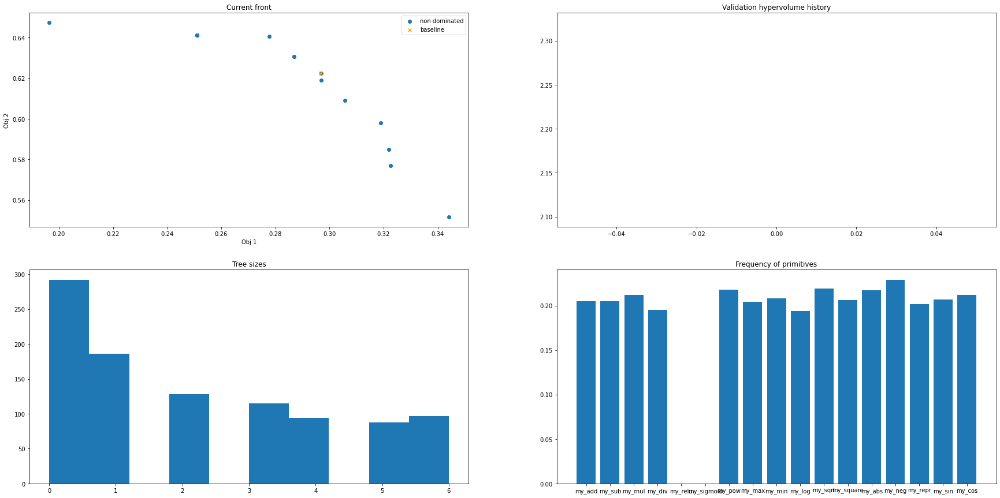

2.210031727832691 0
-- Generation 1 --
Training   set hypervolume: 2.2186641801598896
Validation set hypervolume: 2.2129356577959665


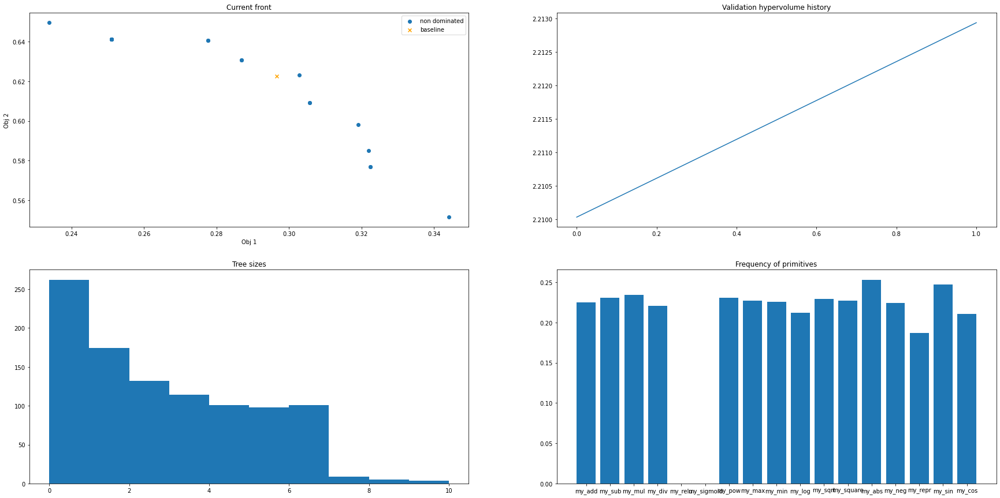

-- Generation 2 --
Training   set hypervolume: 2.185223095719768
Validation set hypervolume: 2.2130455135394485


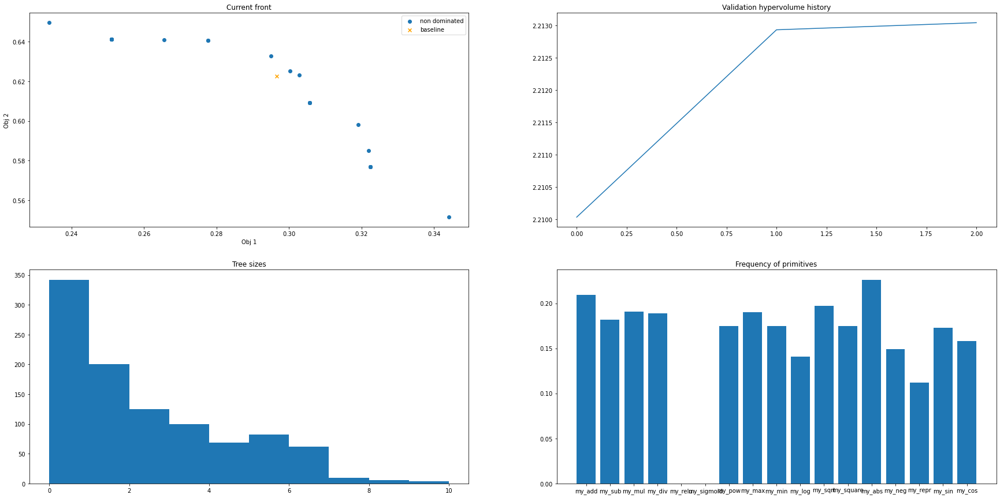

-- Generation 3 --
Training   set hypervolume: 2.279756428217975
Validation set hypervolume: 2.213279227202262


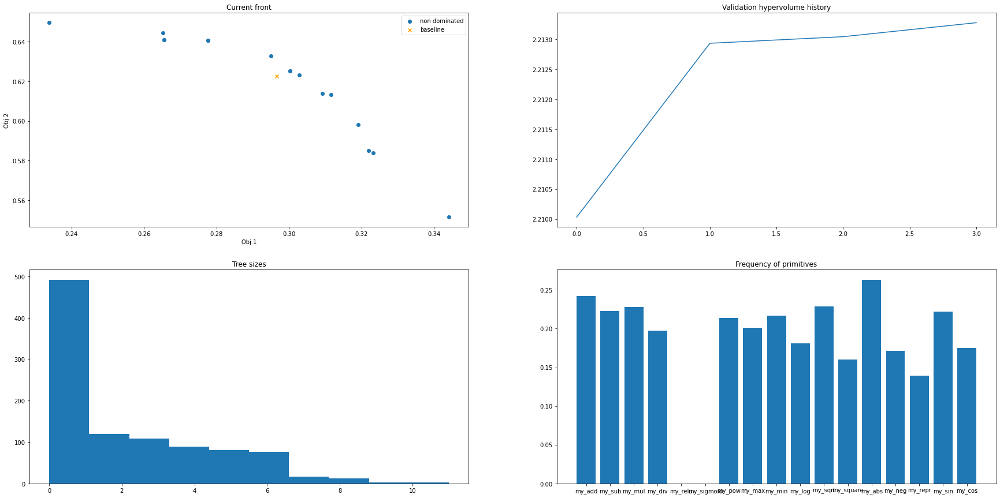

-- Generation 4 --
Training   set hypervolume: 2.227466985804252
Validation set hypervolume: 2.2163940967687275


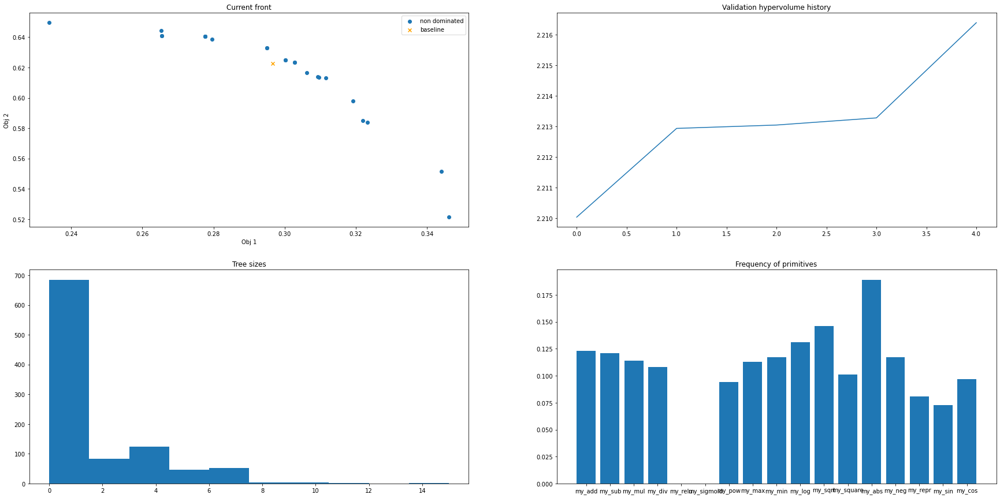

-- Generation 5 --
Training   set hypervolume: 2.2481725260875773
Validation set hypervolume: 2.2166834723551707


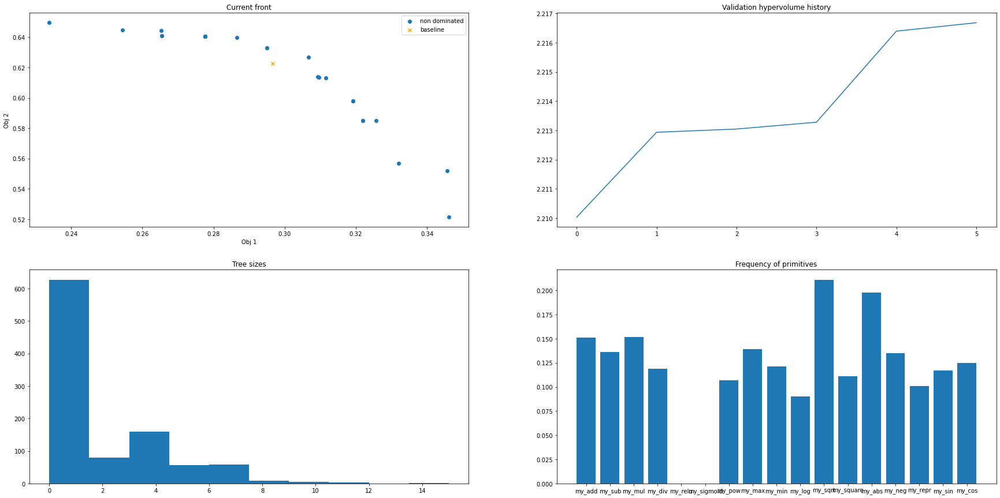

-- Generation 6 --
Training   set hypervolume: 2.221910591490165
Validation set hypervolume: 2.2167616591867563


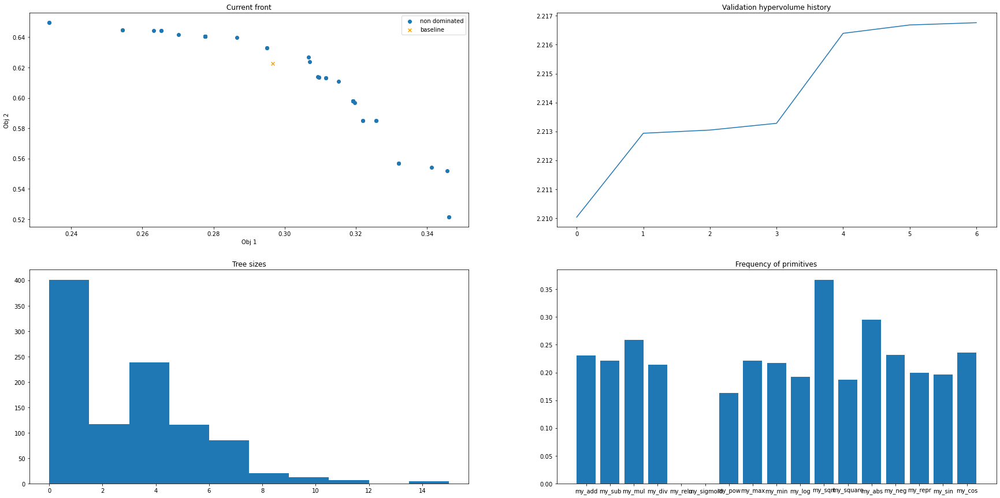

-- Generation 7 --
Training   set hypervolume: 2.2435969923021837
Validation set hypervolume: 2.2192118932733216


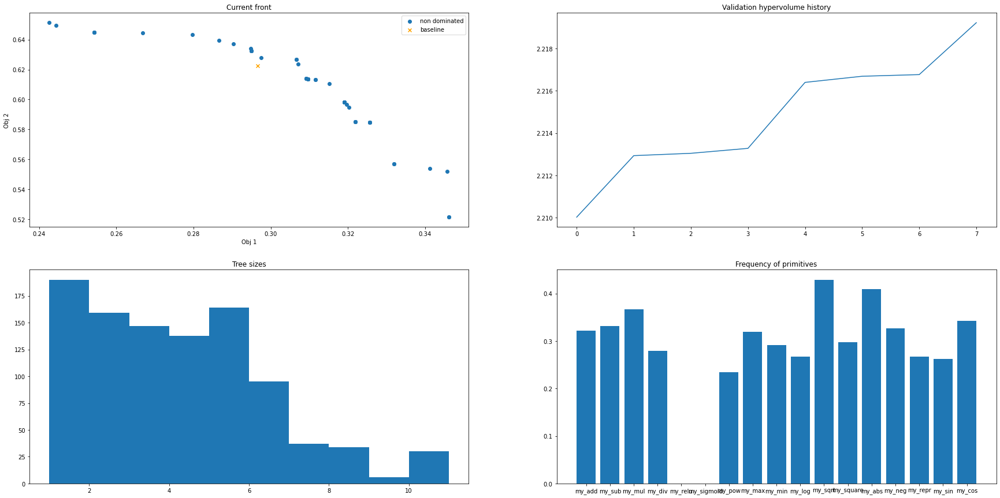

-- Generation 8 --
Training   set hypervolume: 2.2081255882390973
Validation set hypervolume: 2.2196270877177278


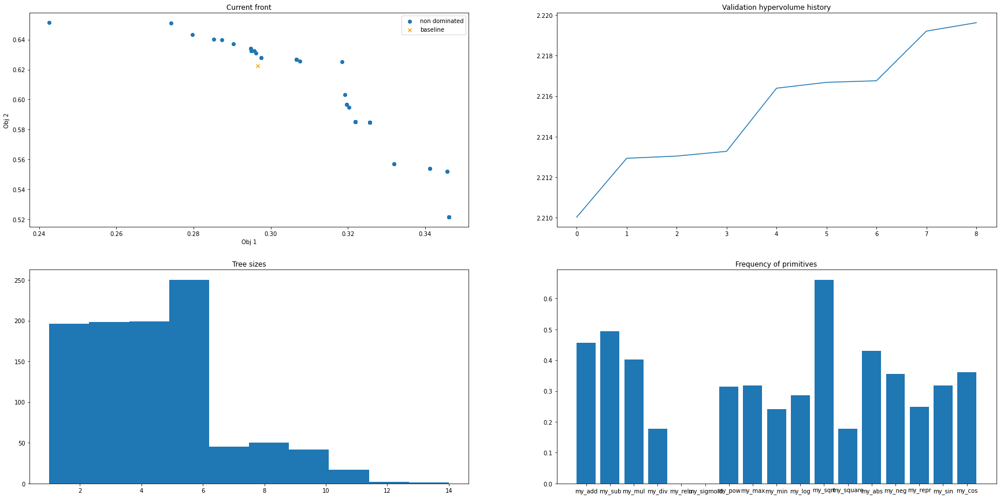

-- Generation 9 --
Training   set hypervolume: 2.2170042460474515
Validation set hypervolume: 2.228186033592784


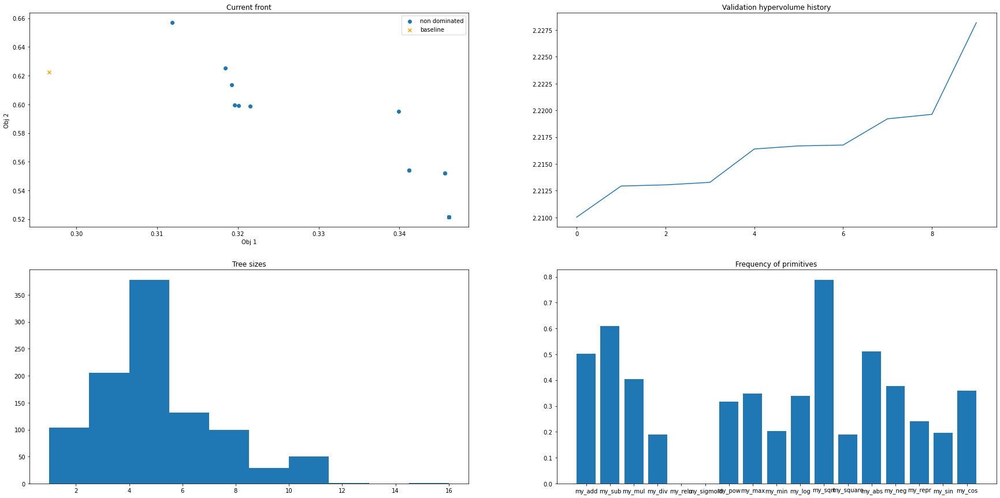

-- Generation 10 --
Training   set hypervolume: 2.2239778905160423
Validation set hypervolume: 2.228356675899877


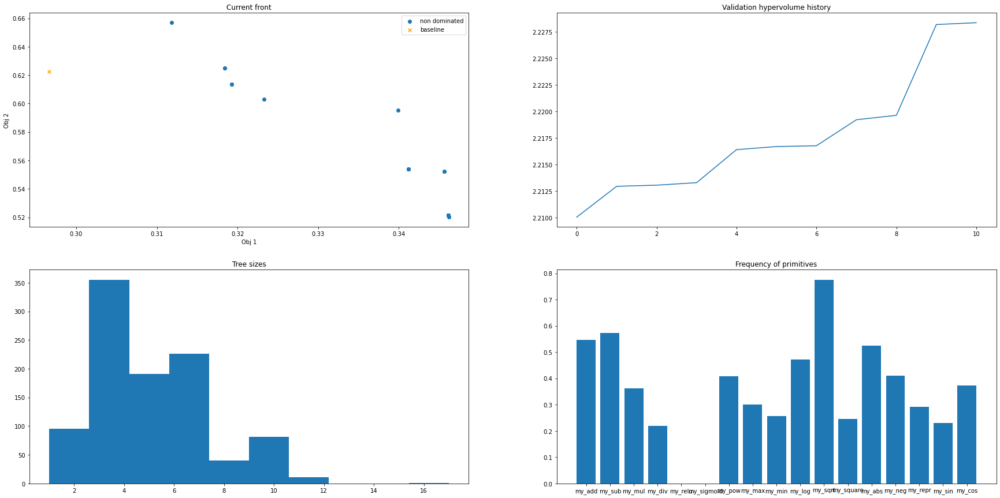

-- Generation 11 --
Training   set hypervolume: 2.2744432190771975
Validation set hypervolume: 2.229122595843682


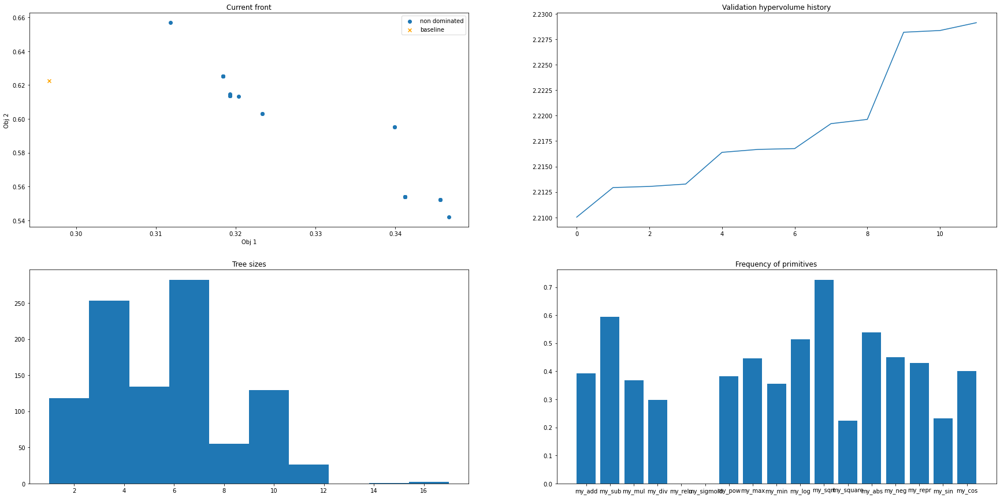

-- Generation 12 --
Training   set hypervolume: 2.208866083126469
Validation set hypervolume: 2.2310372265385996


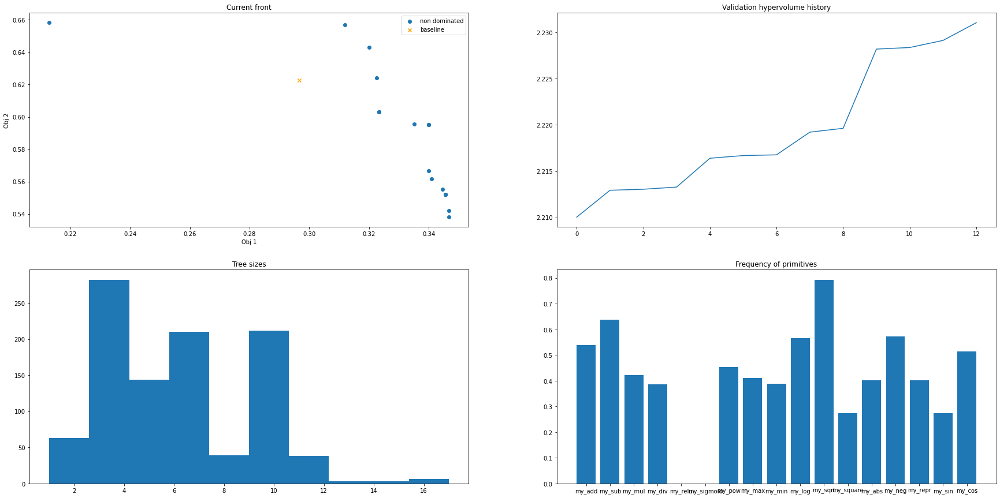

-- Generation 13 --
Training   set hypervolume: 2.2875189661110147
Validation set hypervolume: 2.2345037826265575


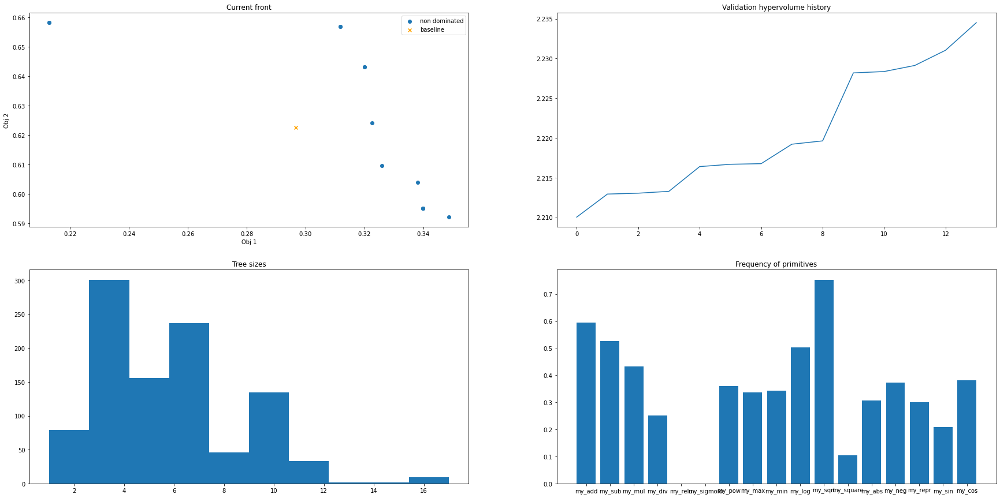

-- Generation 14 --
Training   set hypervolume: 2.283877977145179
Validation set hypervolume: 2.2347372105156675


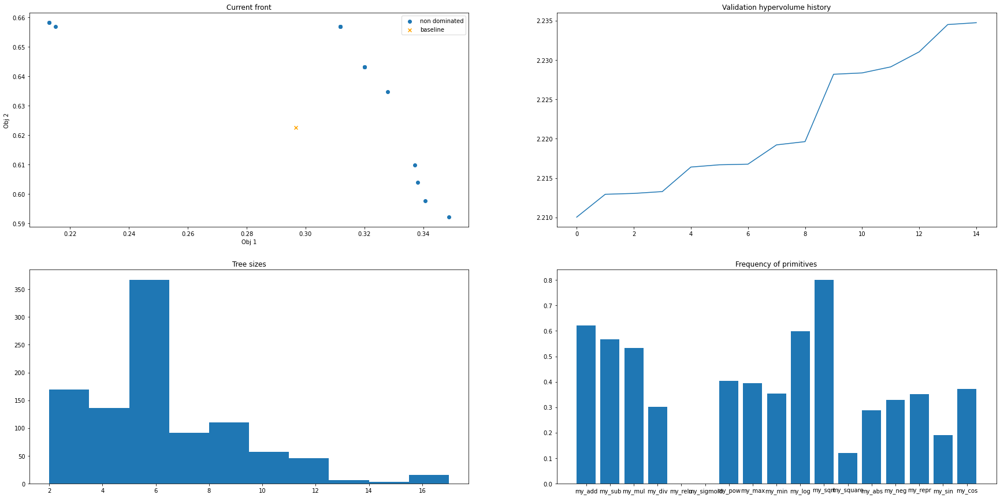

-- Generation 15 --
Training   set hypervolume: 2.249364587983797
Validation set hypervolume: 2.236710267220837


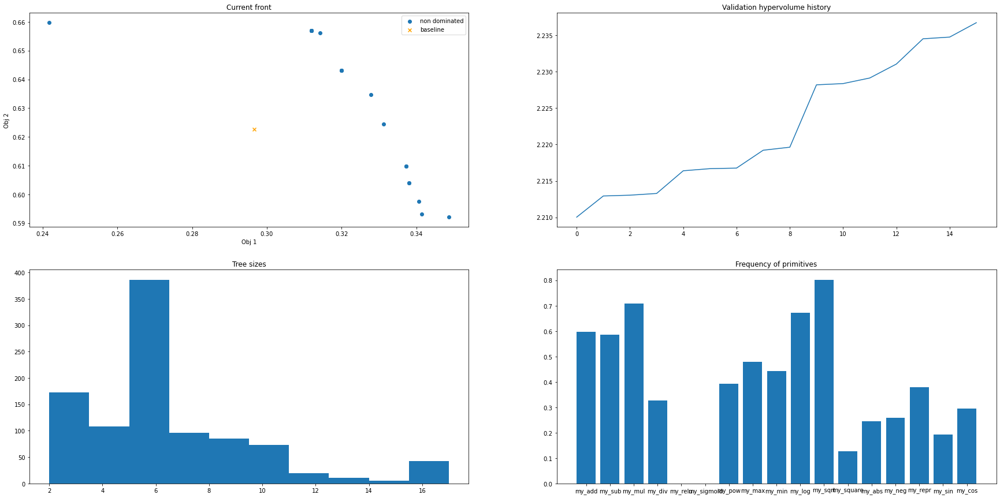

-- Generation 16 --
Training   set hypervolume: 2.2575255066075277
Validation set hypervolume: 2.236769854154981


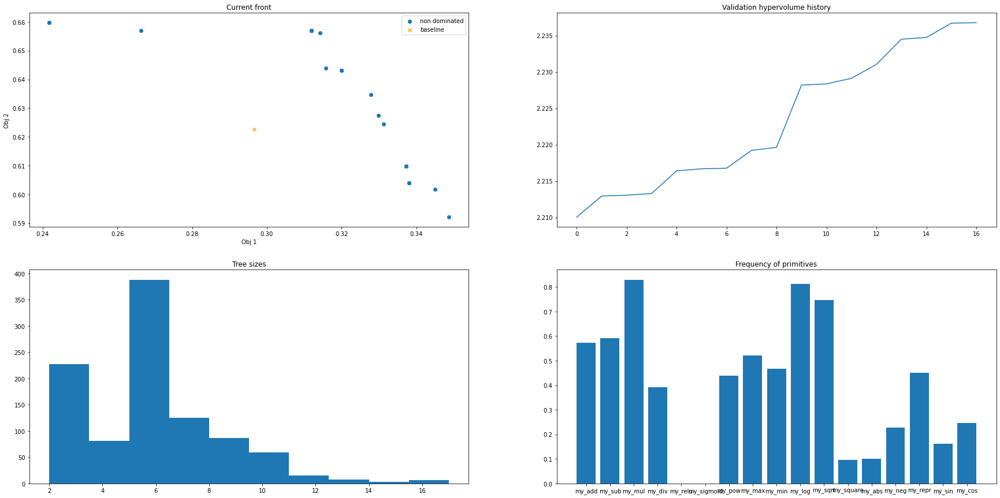

-- Generation 17 --
Training   set hypervolume: 2.2478520989373565
Validation set hypervolume: 2.246319291180092


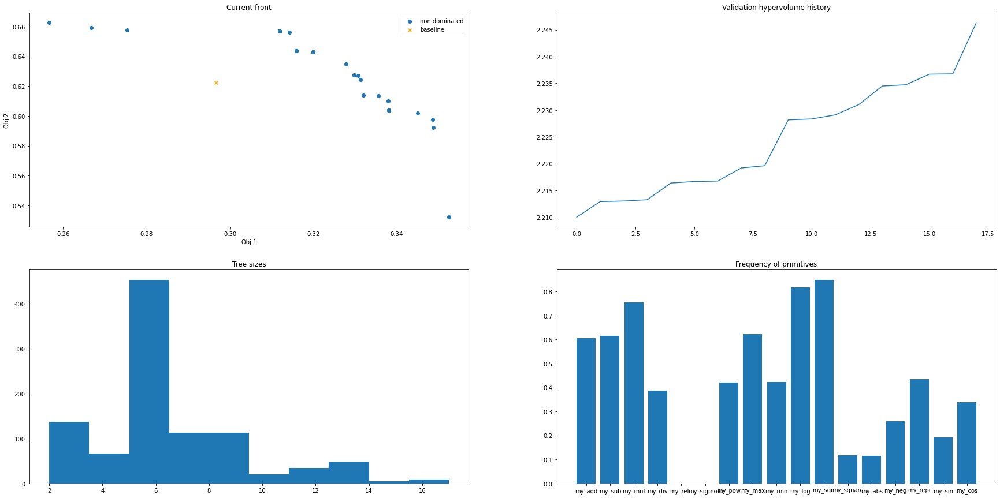

-- Generation 18 --
Training   set hypervolume: 2.245462118800153
Validation set hypervolume: 2.2464730039033265


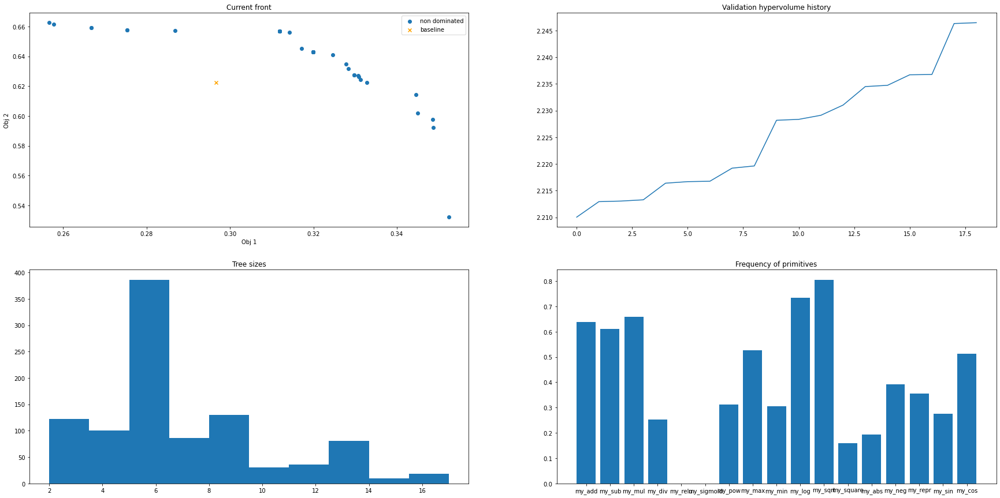

-- Generation 19 --
Training   set hypervolume: 2.2673604305096386
Validation set hypervolume: 2.246653146801898


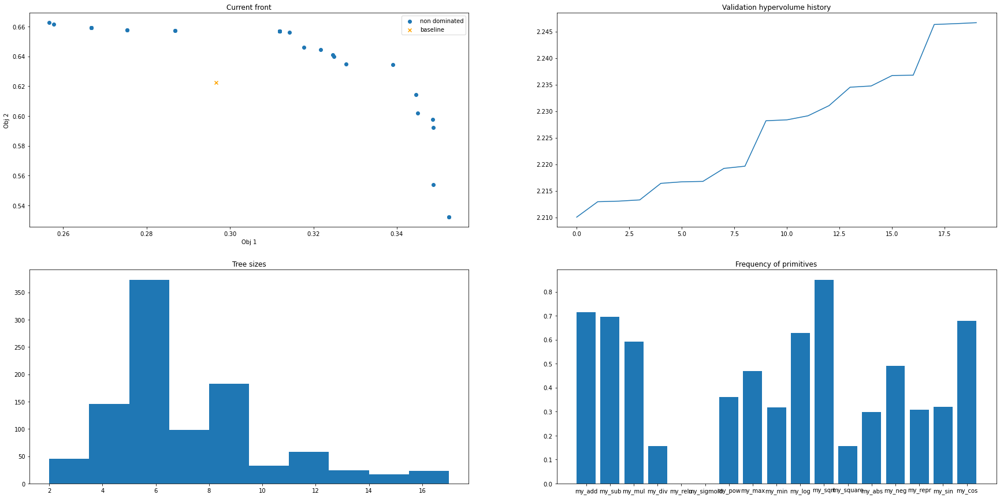

-- Generation 20 --
Training   set hypervolume: 2.2577489690762333
Validation set hypervolume: 2.246842577761638


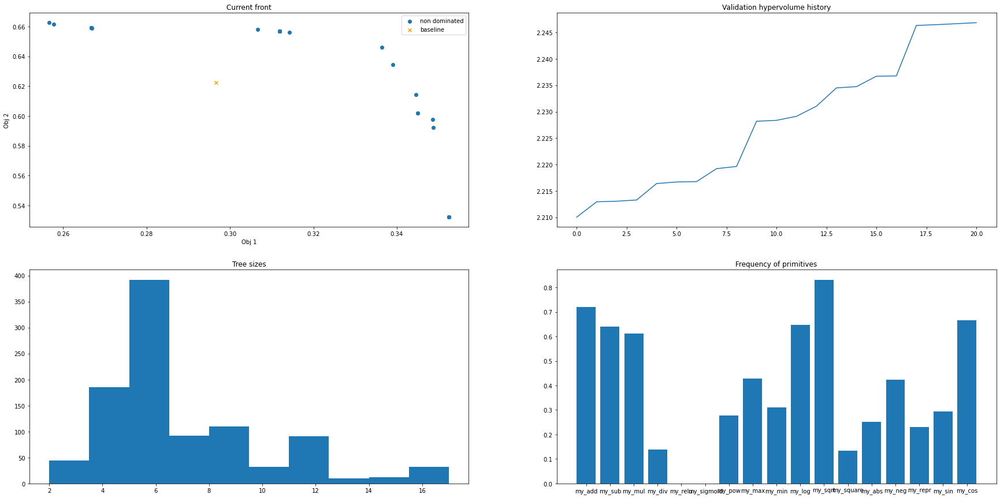

-- Generation 21 --
Training   set hypervolume: 2.2412427450208607
Validation set hypervolume: 2.24685321585758


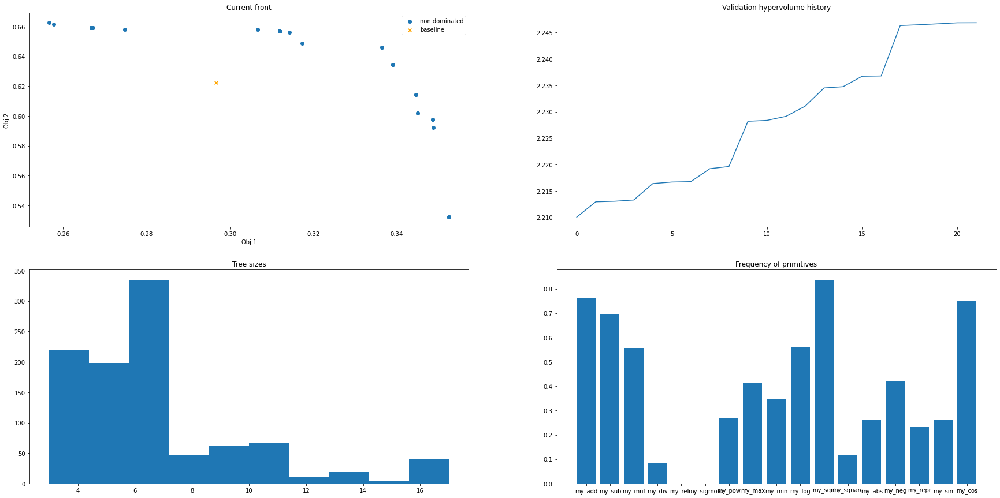

-- Generation 22 --
Training   set hypervolume: 2.2774969299983017
Validation set hypervolume: 2.2475368214301046


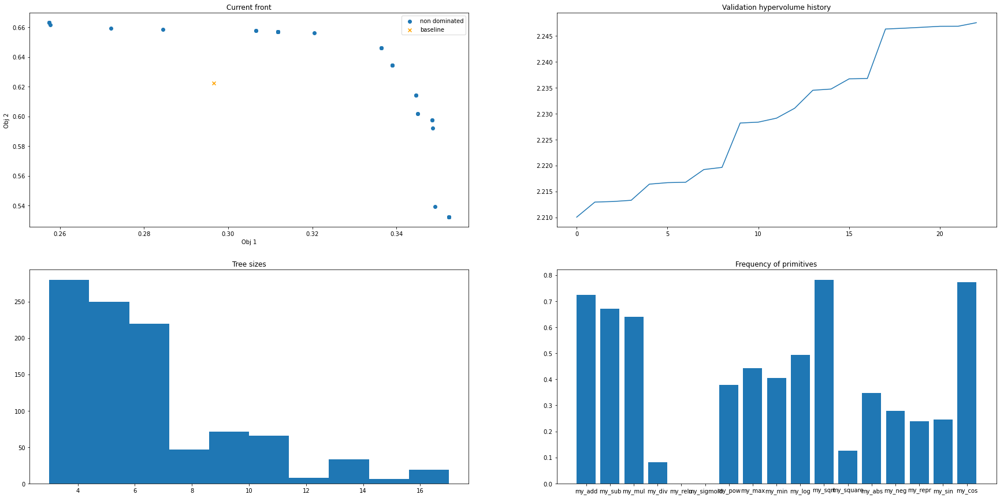

-- Generation 23 --
Training   set hypervolume: 2.2577557943977102
Validation set hypervolume: 2.247689516542495


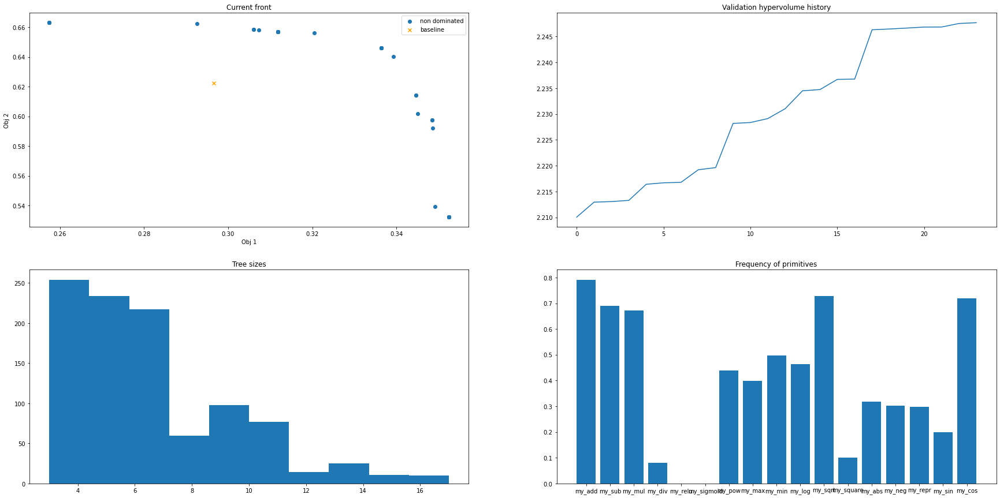

-- Generation 24 --
Training   set hypervolume: 2.312261730447577
Validation set hypervolume: 2.2478096496727624


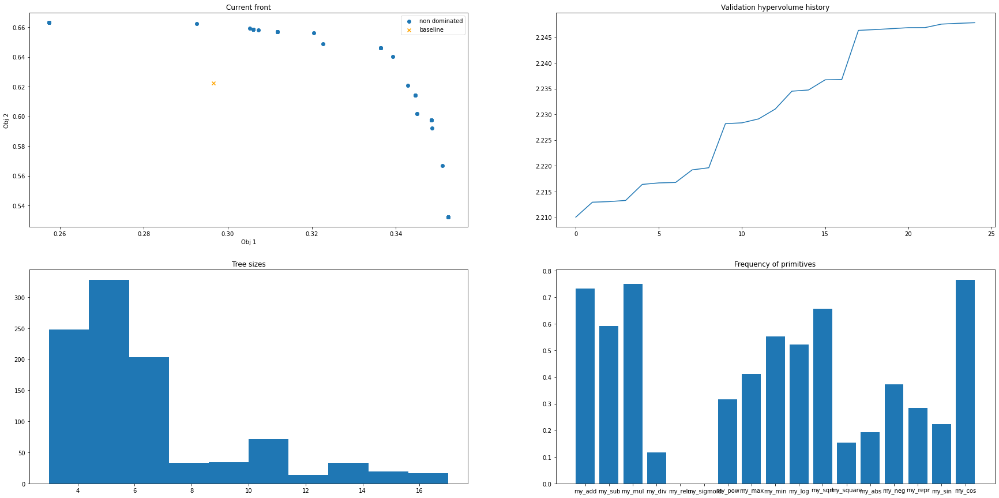

-- Generation 25 --
Training   set hypervolume: 2.233384481221619
Validation set hypervolume: 2.250745410023153


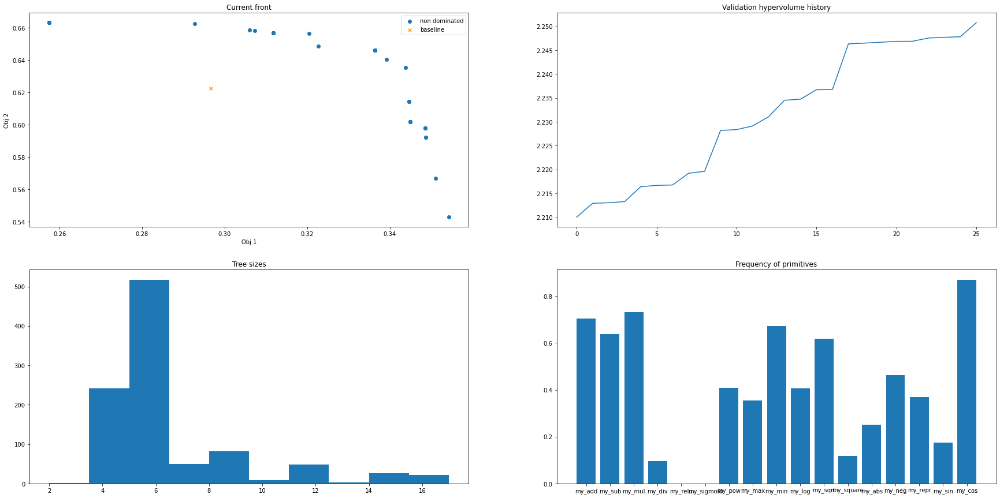

-- Generation 26 --
Training   set hypervolume: 2.242538237666172
Validation set hypervolume: 2.2509265073151914


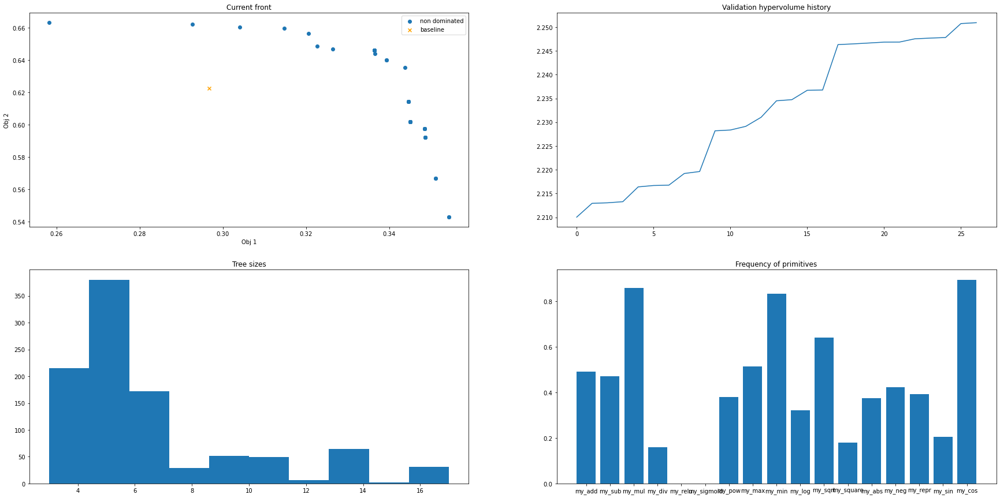

-- Generation 27 --
Training   set hypervolume: 2.2629937154728585
Validation set hypervolume: 2.250958066509521


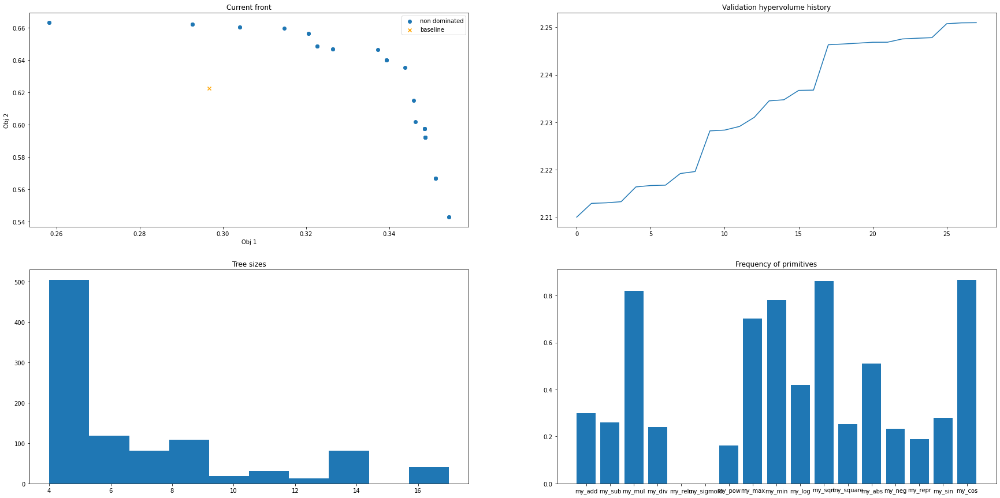

-- Generation 28 --
Training   set hypervolume: 2.2274595881098738
Validation set hypervolume: 2.2605058267090232


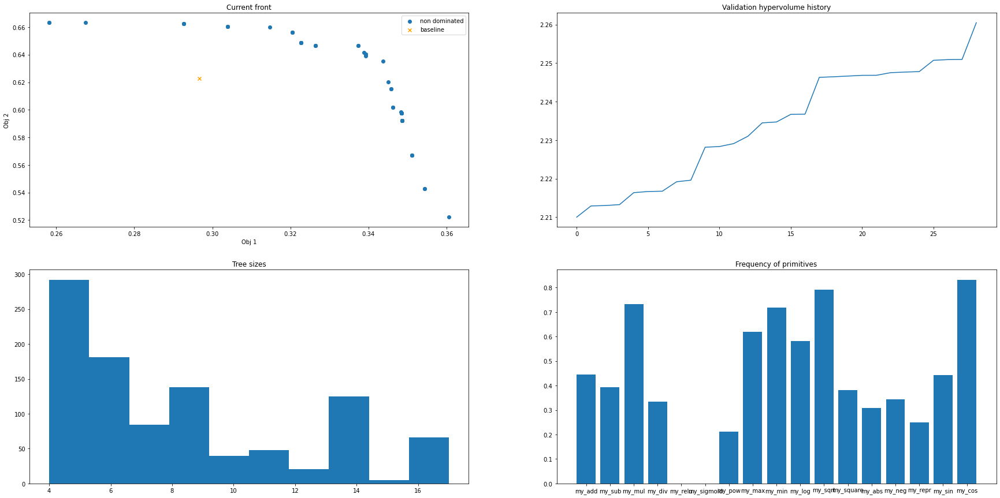

-- Generation 29 --
Training   set hypervolume: 2.252830836358485
Validation set hypervolume: 2.26083352152569


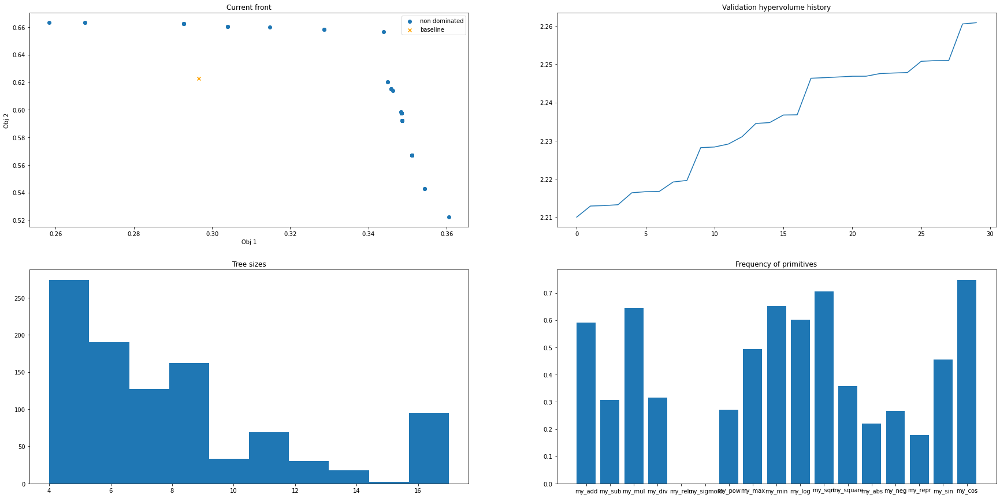

-- Generation 30 --
Training   set hypervolume: 2.2819929682557447
Validation set hypervolume: 2.262722694725934


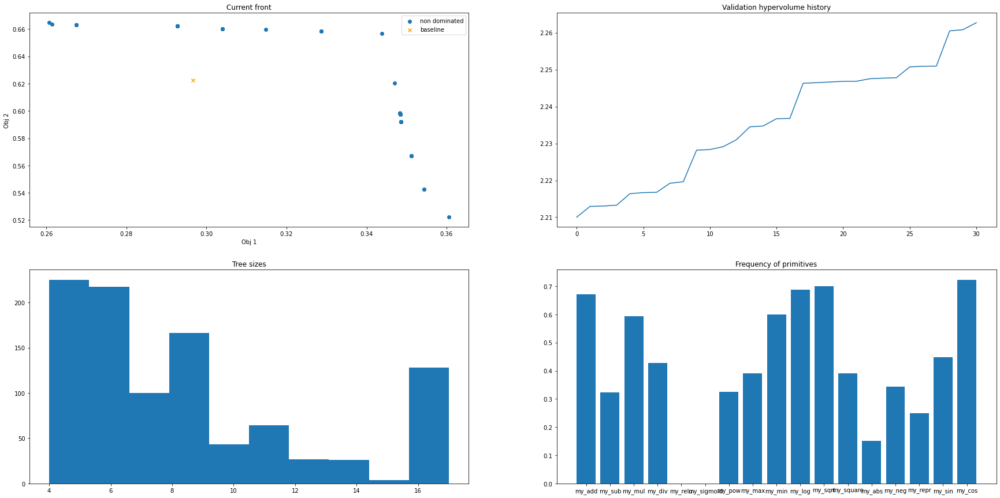

-- Generation 31 --
Training   set hypervolume: 2.35111468894032
Validation set hypervolume: 2.2627436001880548


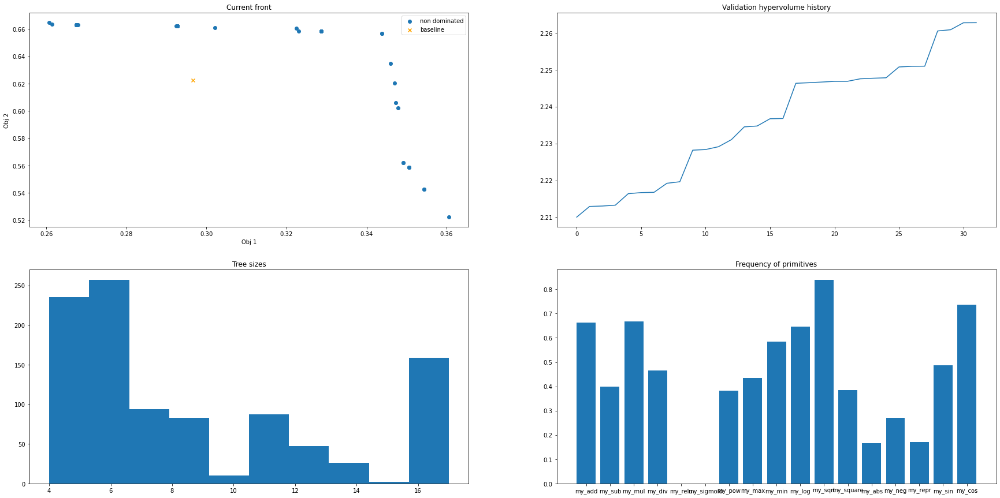

-- Generation 32 --
Training   set hypervolume: 2.278036086099223
Validation set hypervolume: 2.262795914099872


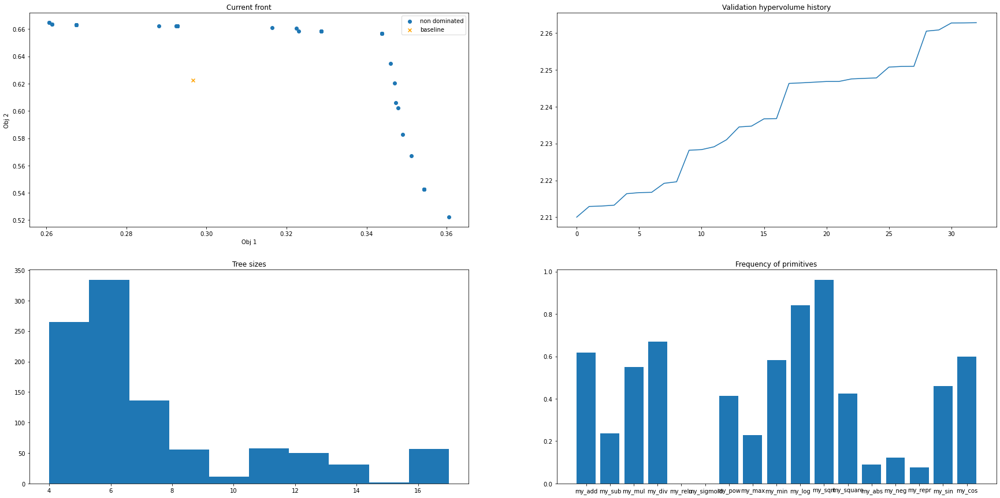

-- Generation 33 --
Training   set hypervolume: 2.2300049152387738
Validation set hypervolume: 2.2628428258457998


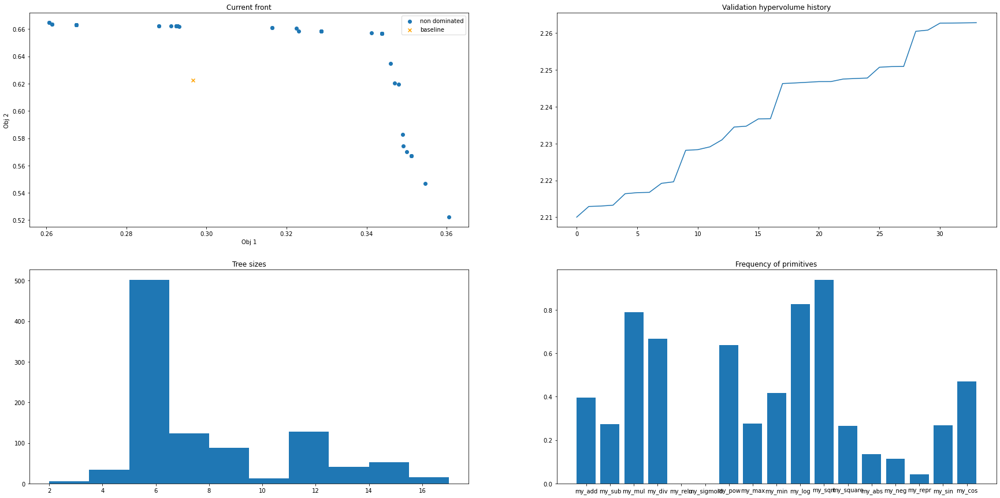

-- Generation 34 --
Training   set hypervolume: 2.271376343054519
Validation set hypervolume: 2.2629122031014433


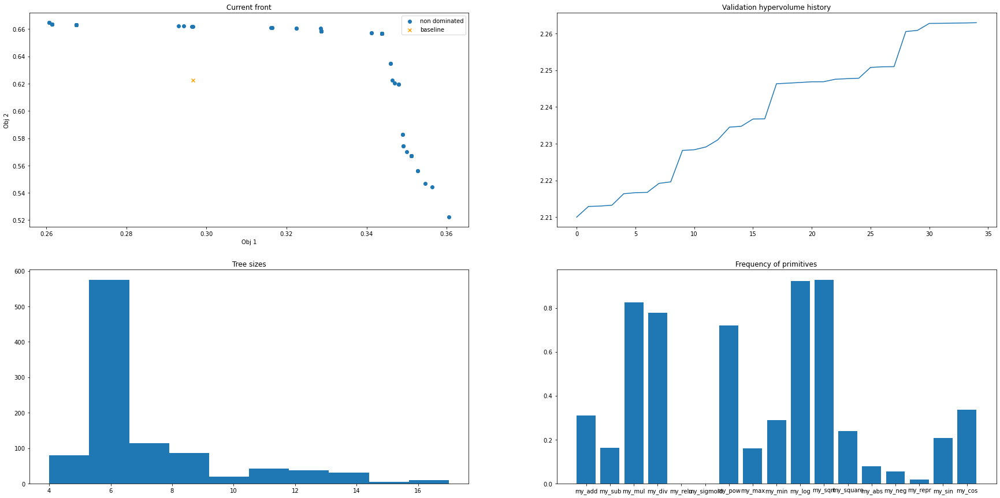

-- Generation 35 --
Training   set hypervolume: 2.239861134777061
Validation set hypervolume: 2.26349605292115


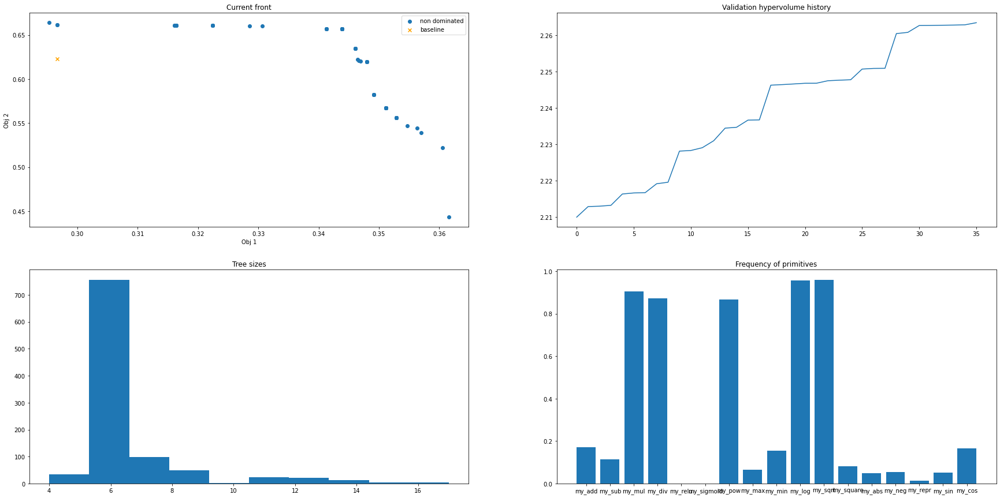

-- Generation 36 --
Training   set hypervolume: 2.2575011237668408
Validation set hypervolume: 2.263768218257904


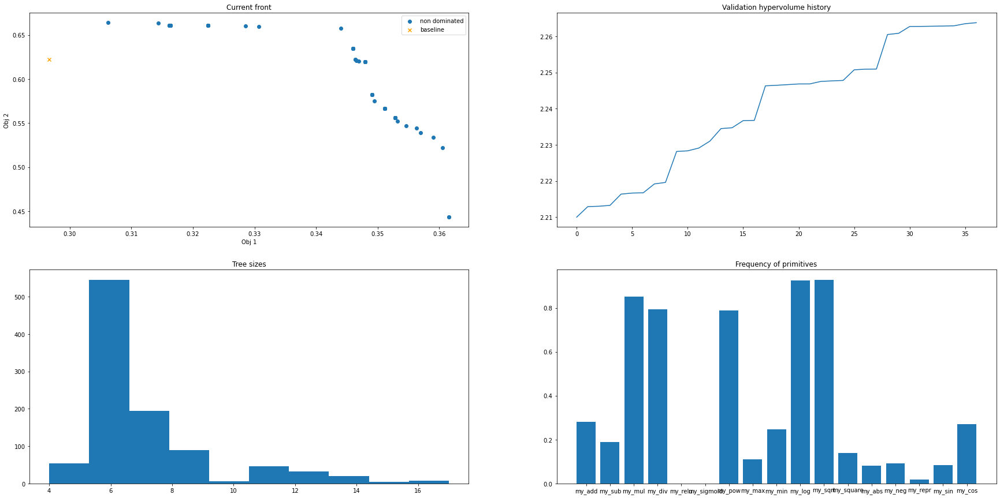

-- Generation 37 --
Training   set hypervolume: 2.2848701464146455
Validation set hypervolume: 2.2637952090047624


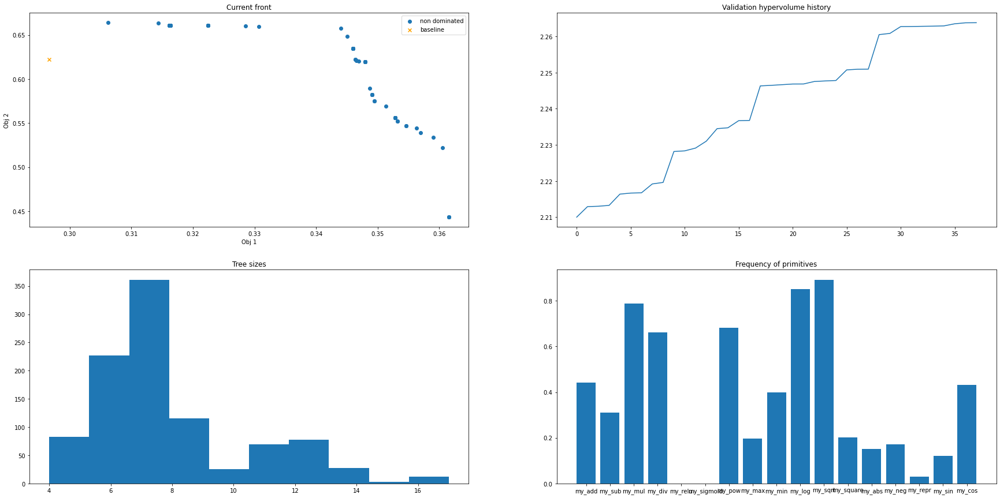

-- Generation 38 --
Training   set hypervolume: 2.256126091978355
Validation set hypervolume: 2.2647757247104305


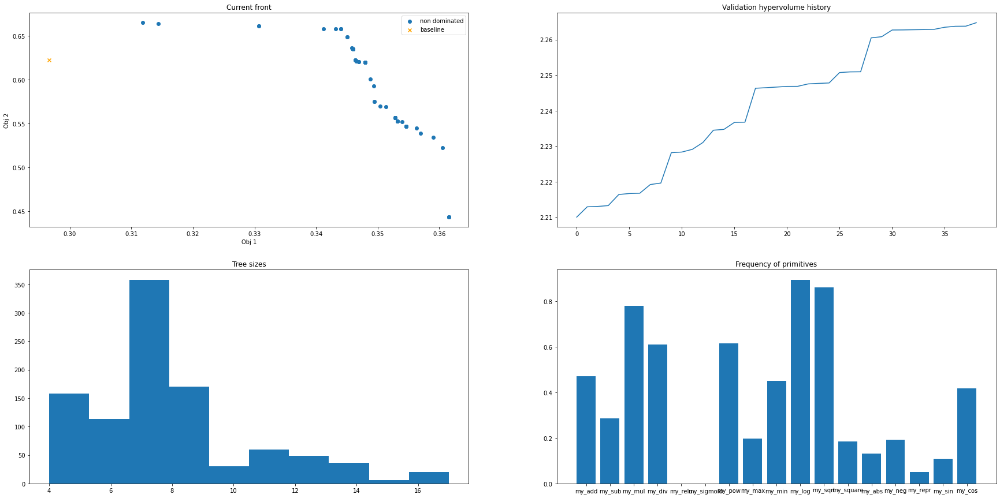

-- Generation 39 --
Training   set hypervolume: 2.283044159923411
Validation set hypervolume: 2.265459818903672


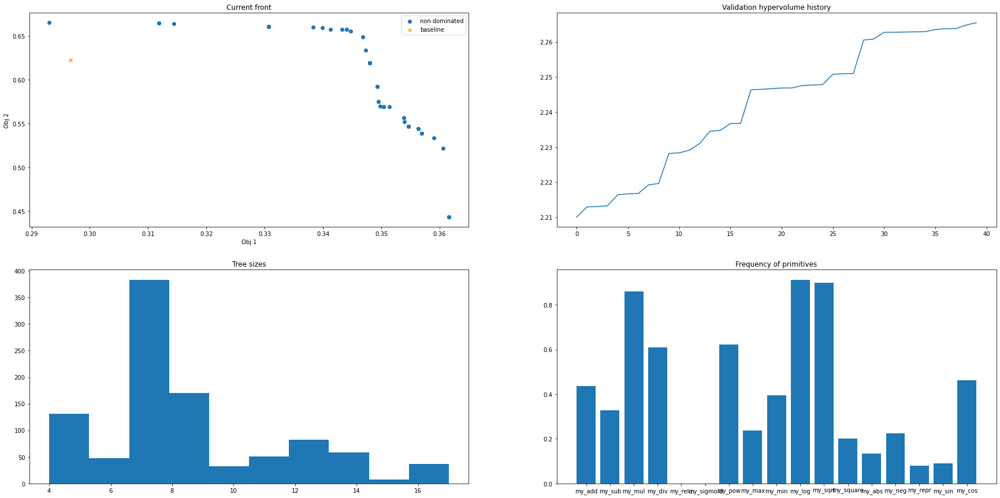

-- Generation 40 --
Training   set hypervolume: 2.319289258727952
Validation set hypervolume: 2.266203816748243


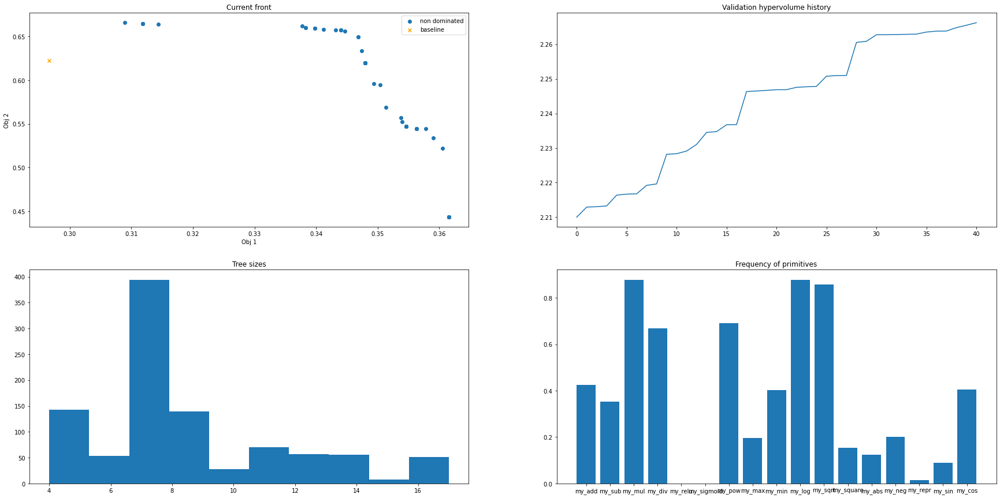

-- Generation 41 --
Training   set hypervolume: 2.2427493909383025
Validation set hypervolume: 2.266902835798859


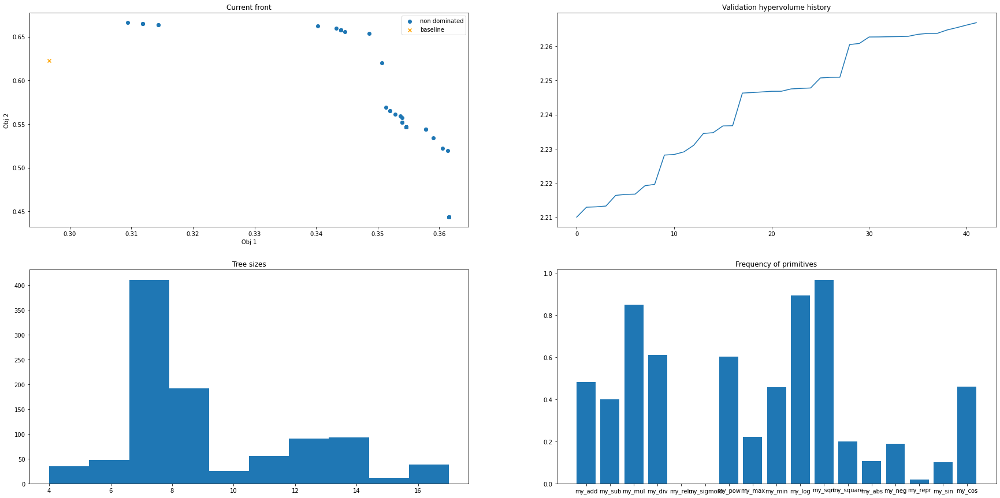

-- Generation 42 --
Training   set hypervolume: 2.249106130487083
Validation set hypervolume: 2.266980620405661


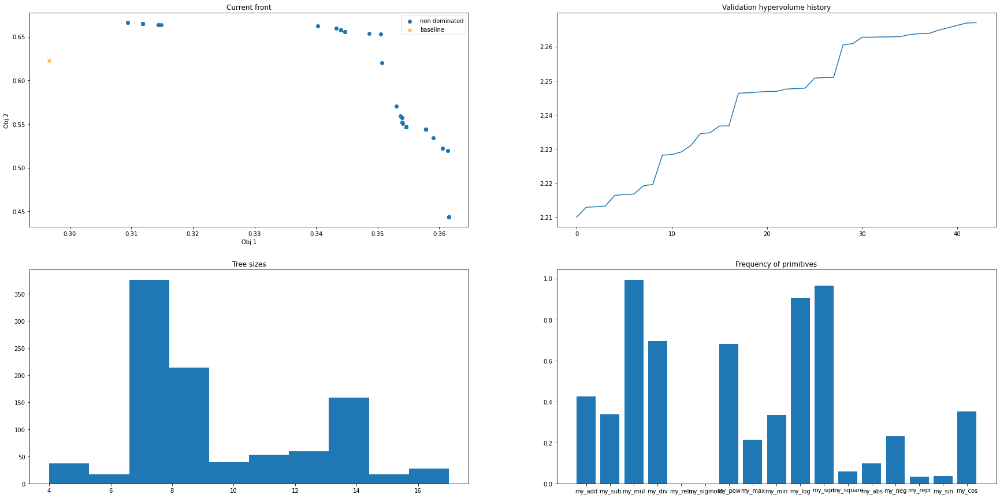

-- Generation 43 --
Training   set hypervolume: 2.3219057428476995
Validation set hypervolume: 2.267068004144876


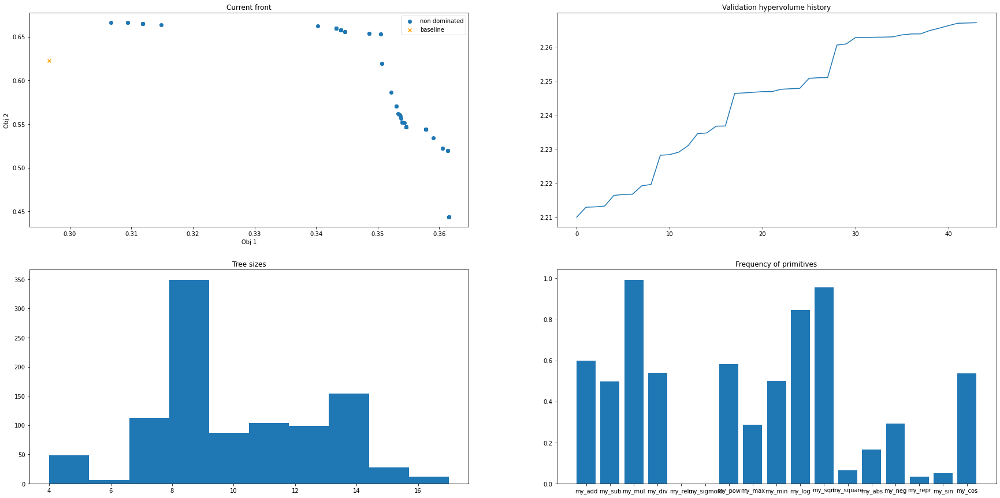

-- Generation 44 --
Training   set hypervolume: 2.2783163825667425
Validation set hypervolume: 2.2670725354691887


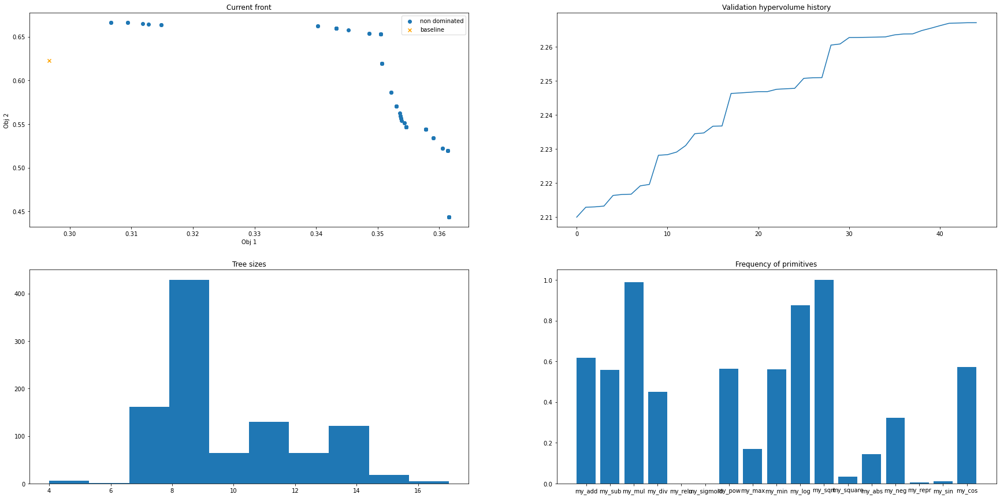

-- Generation 45 --
Training   set hypervolume: 2.255709158002162
Validation set hypervolume: 2.2714098755650847


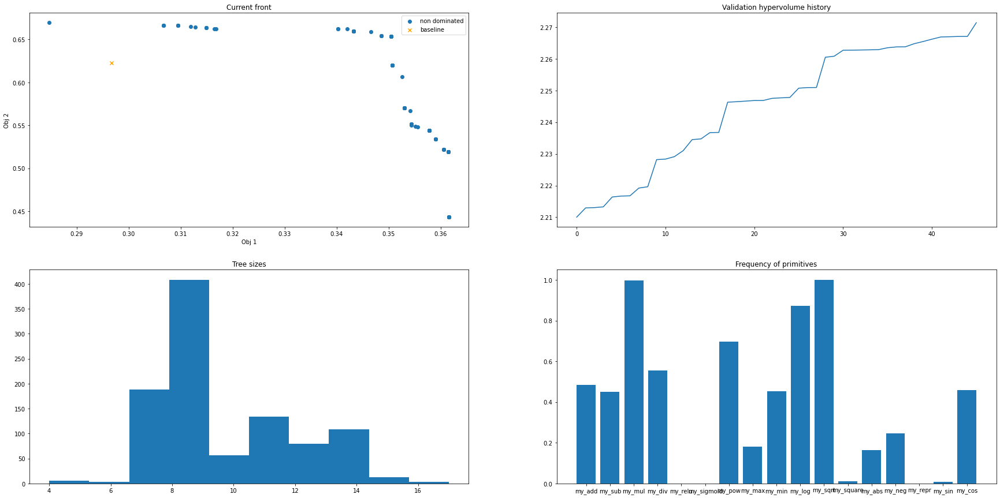

-- Generation 46 --
Training   set hypervolume: 2.268441396827281
Validation set hypervolume: 2.271500484790256


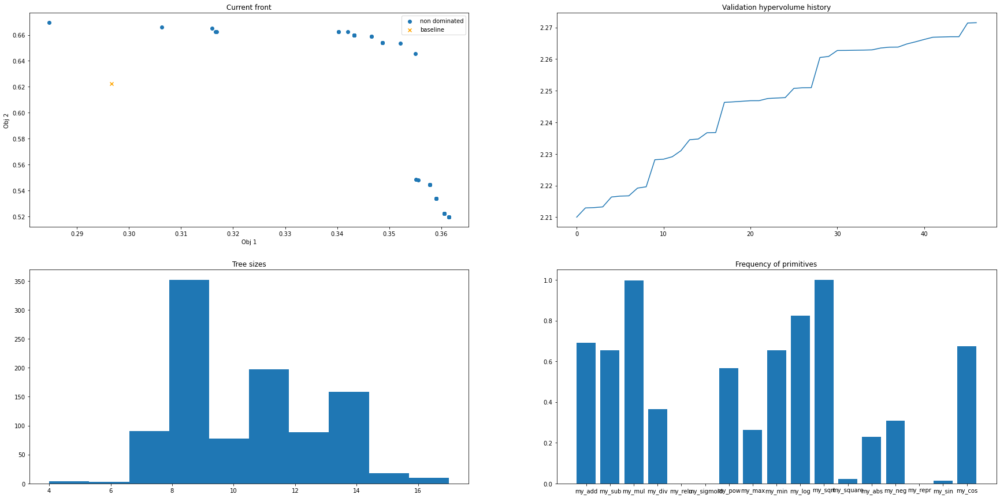

-- Generation 47 --
Training   set hypervolume: 2.266807247530096
Validation set hypervolume: 2.2715117608238398


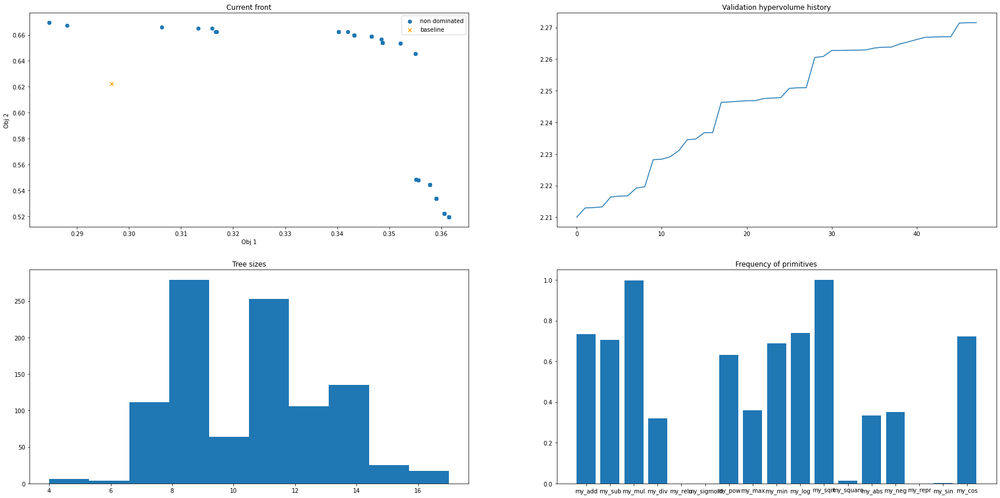

-- Generation 48 --
Training   set hypervolume: 2.307454907632808
Validation set hypervolume: 2.2716401004873057


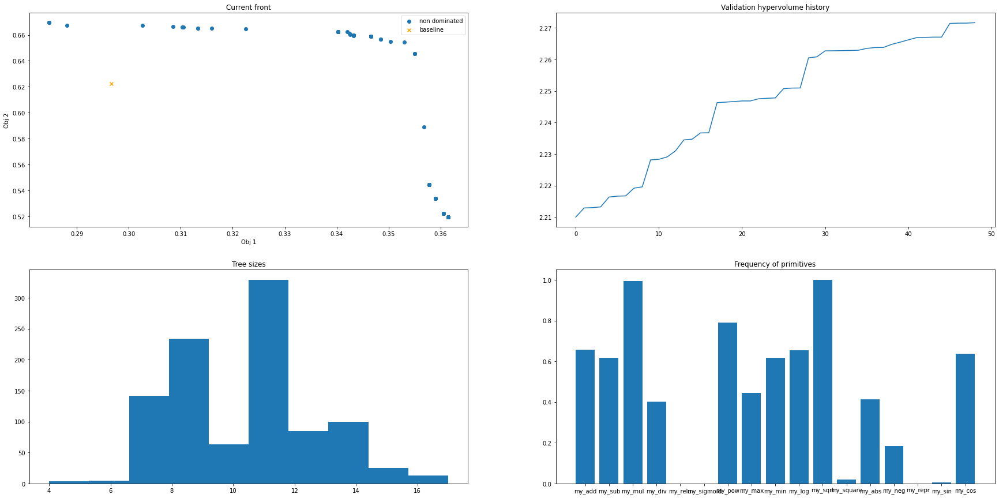

-- Generation 49 --
Training   set hypervolume: 2.3032418993033286
Validation set hypervolume: 2.271669460724285


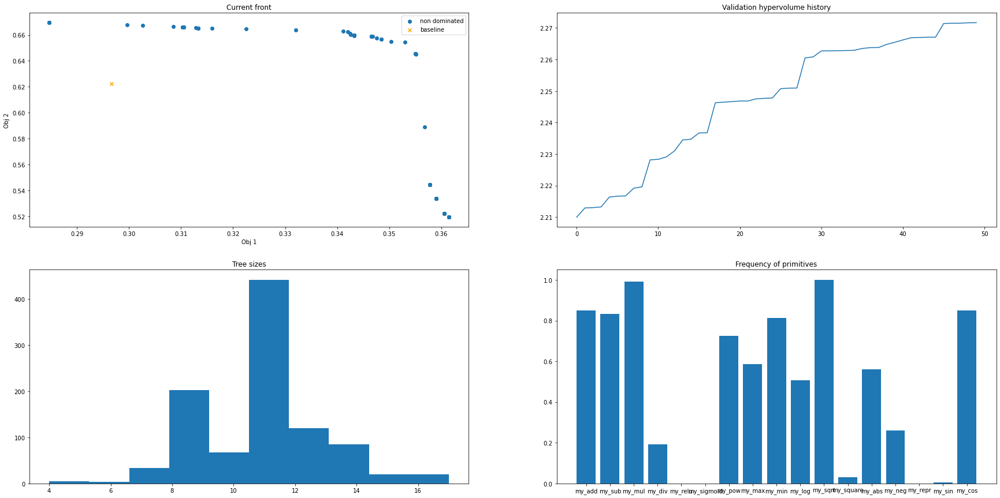

-- Generation 50 --
Training   set hypervolume: 2.311598402087753
Validation set hypervolume: 2.271718738210929


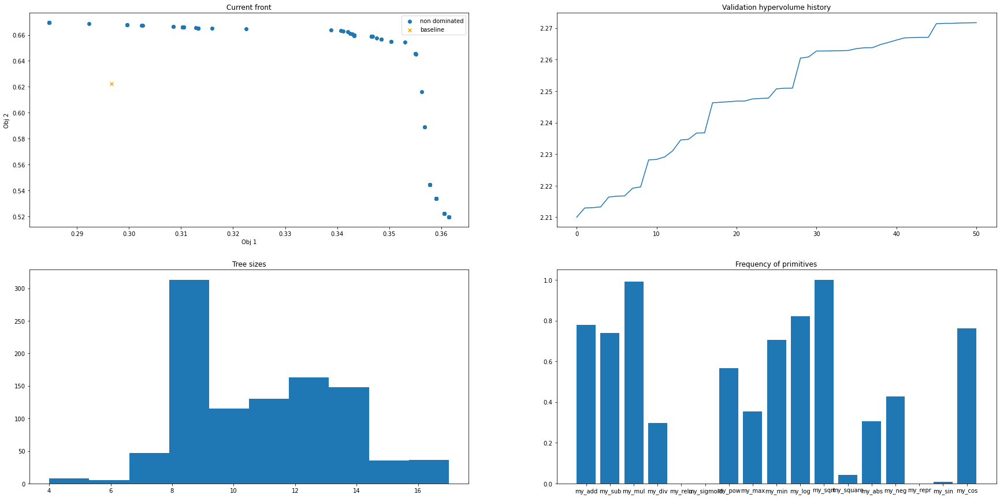

-- Generation 51 --
Training   set hypervolume: 2.3416360278127057
Validation set hypervolume: 2.2717100916810837


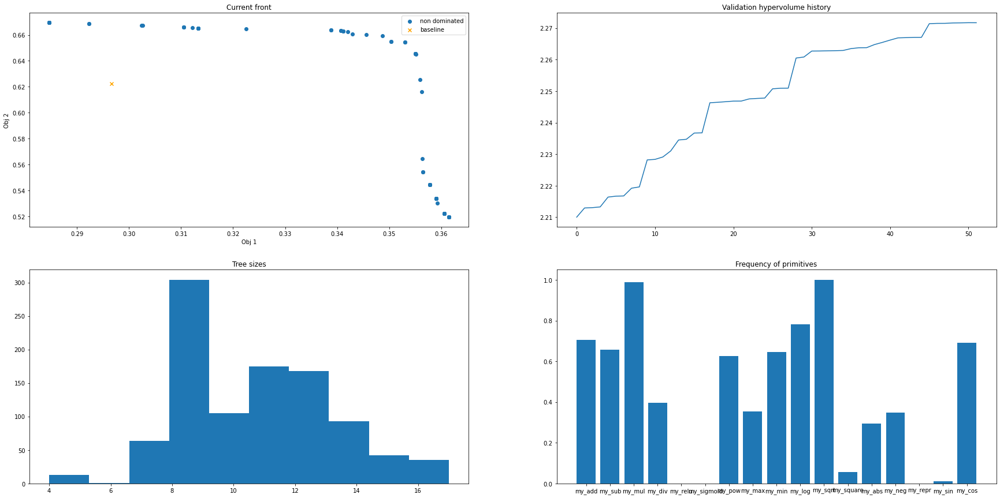

-- Generation 52 --
Training   set hypervolume: 2.2784381443994057
Validation set hypervolume: 2.271754549415597


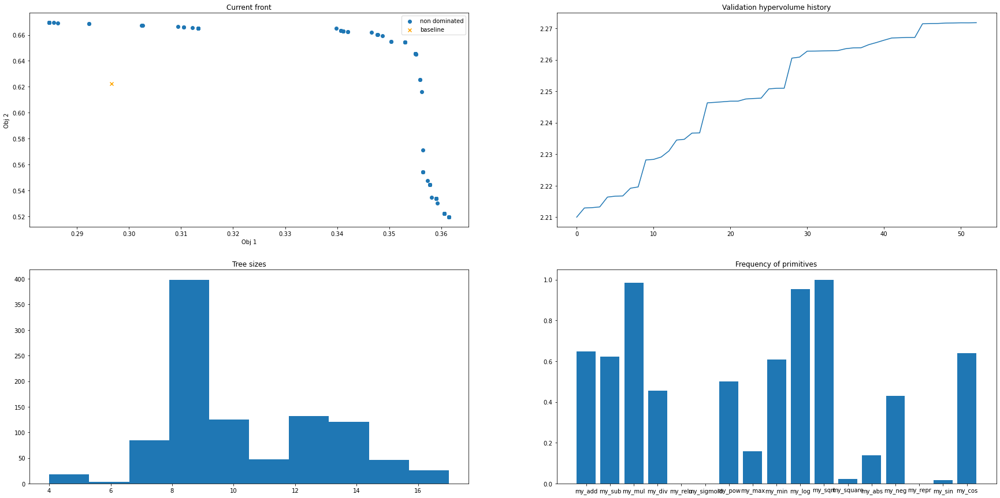

-- Generation 53 --
Training   set hypervolume: 2.2958294002336386
Validation set hypervolume: 2.2752027034912703


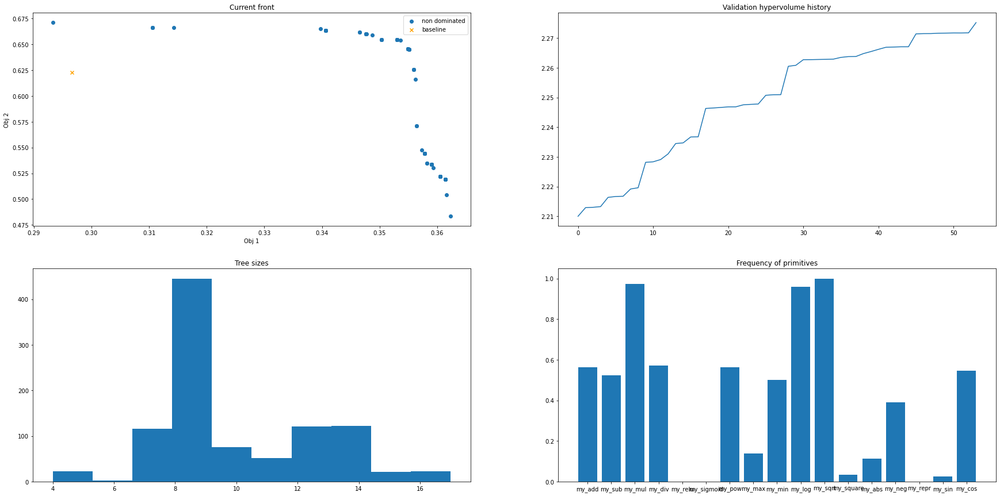

-- Generation 54 --
Training   set hypervolume: 2.308736847081556
Validation set hypervolume: 2.27579272254097


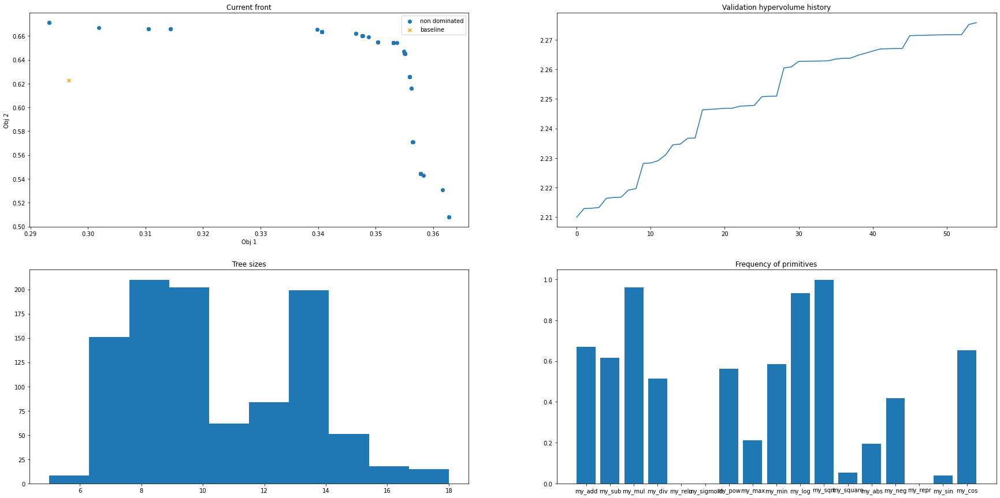

-- Generation 55 --
Training   set hypervolume: 2.275454391004585
Validation set hypervolume: 2.2742544725980514


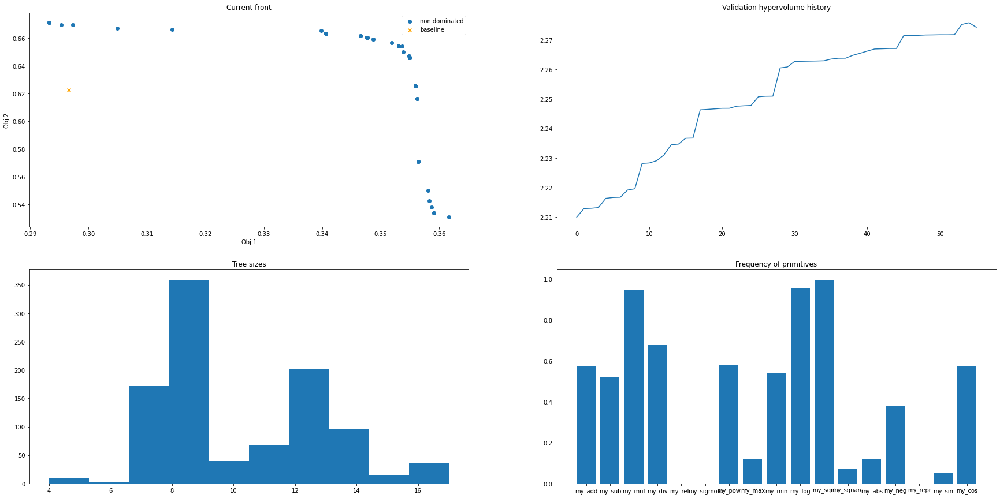

-- Generation 56 --
Training   set hypervolume: 2.2679768191717042
Validation set hypervolume: 2.2758637632176435


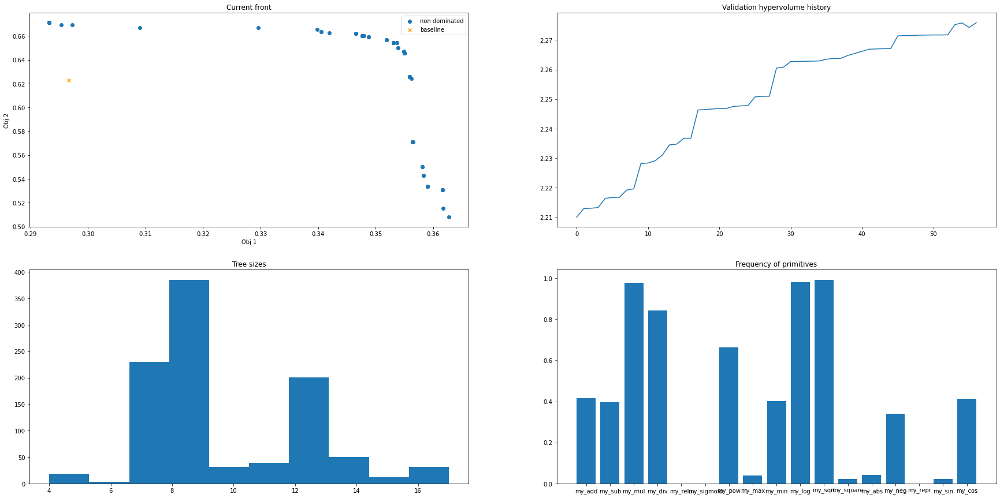

-- Generation 57 --
Training   set hypervolume: 2.254035391649101
Validation set hypervolume: 2.2765570554721157


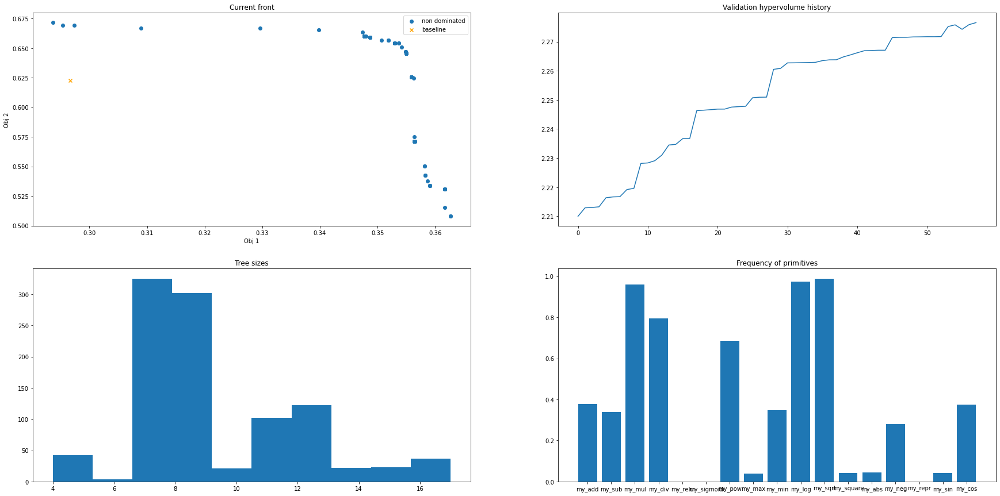

-- Generation 58 --
Training   set hypervolume: 2.258162752302822
Validation set hypervolume: 2.2765635357432834


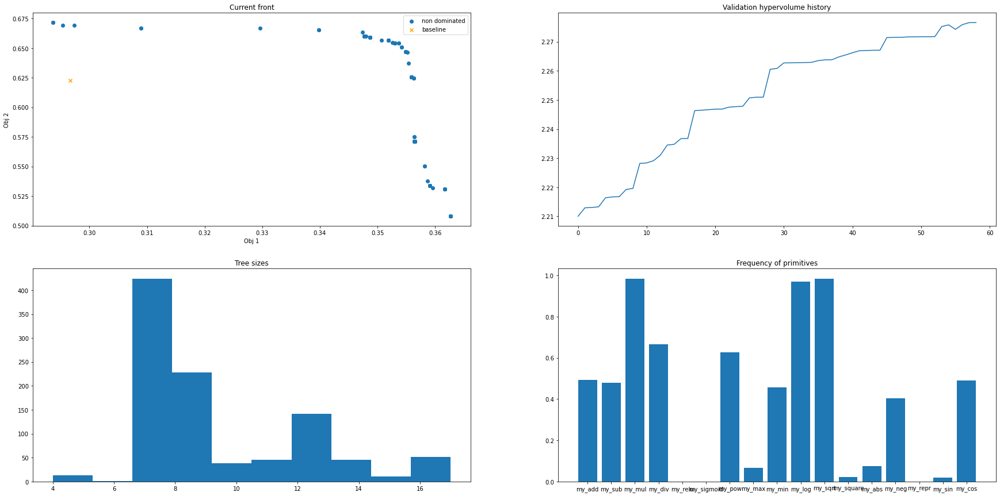

-- Generation 59 --
Training   set hypervolume: 2.2869383669092858
Validation set hypervolume: 2.276604347597226


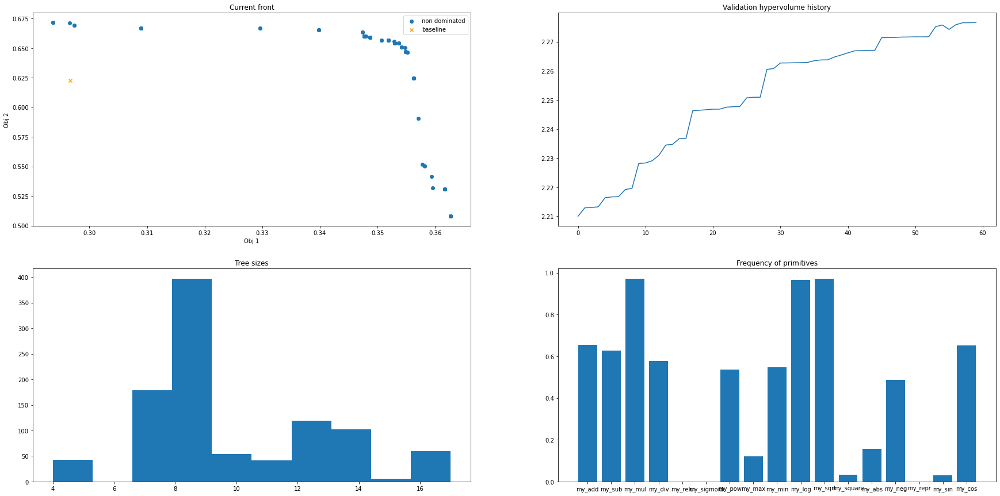

-- Generation 60 --
Training   set hypervolume: 2.3222733503132558
Validation set hypervolume: 2.2767326934083054


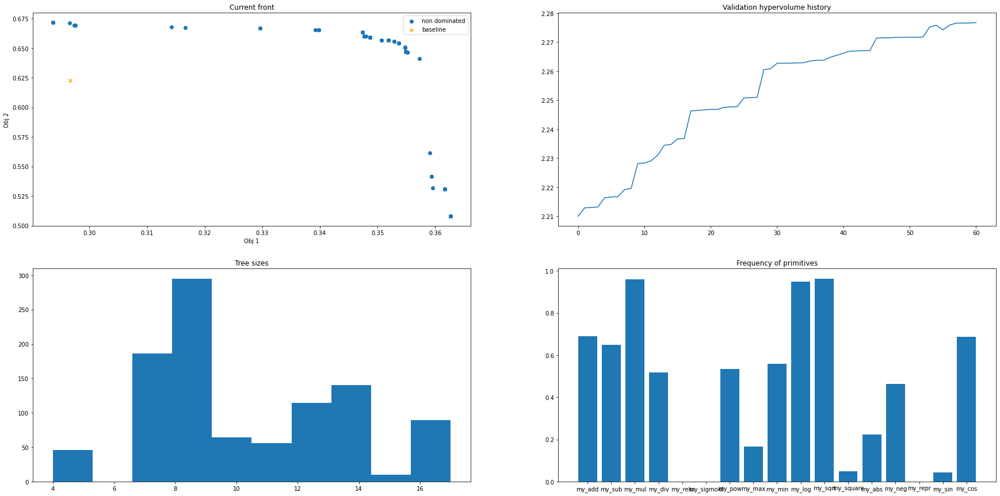

-- Generation 61 --
Training   set hypervolume: 2.2850126877011387
Validation set hypervolume: 2.2768128241859715


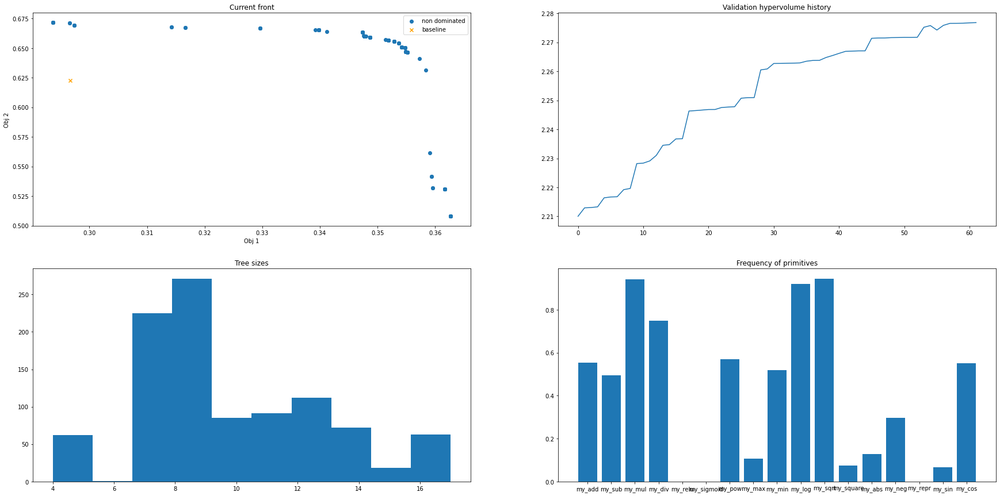

-- Generation 62 --
Training   set hypervolume: 2.268080344619972
Validation set hypervolume: 2.2774776741476064


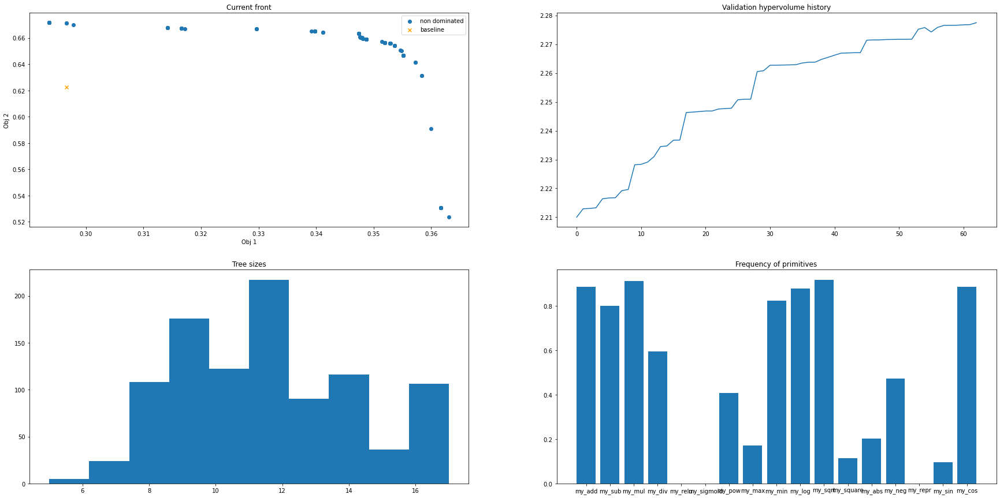

-- Generation 63 --
Training   set hypervolume: 2.2726586724137254
Validation set hypervolume: 2.2800404960722287


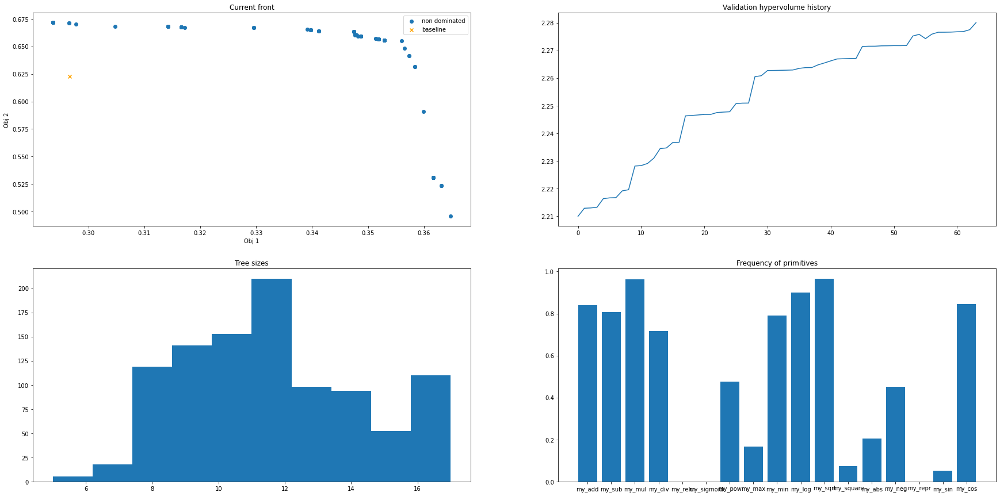

-- Generation 64 --
Training   set hypervolume: 2.2822534730213855
Validation set hypervolume: 2.2800600456061773


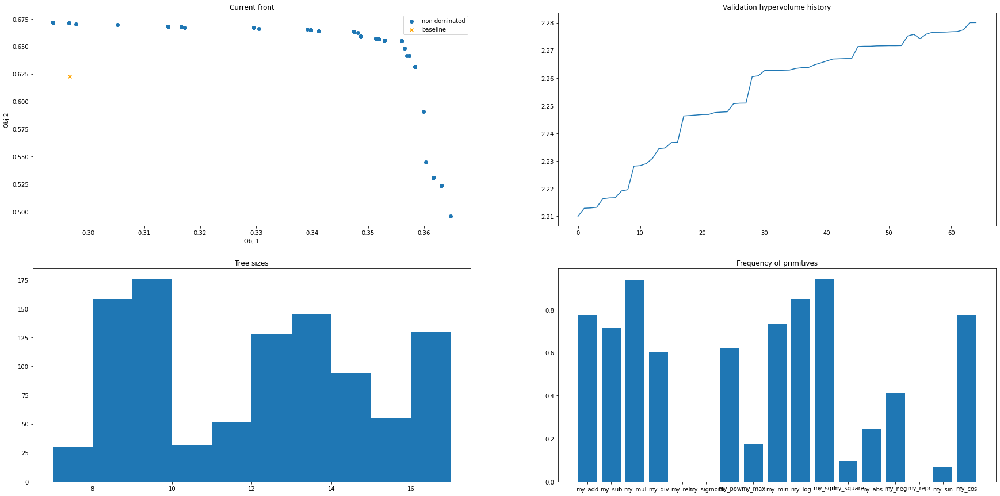

-- Generation 65 --
Training   set hypervolume: 2.317437943546901
Validation set hypervolume: 2.2800864268046963


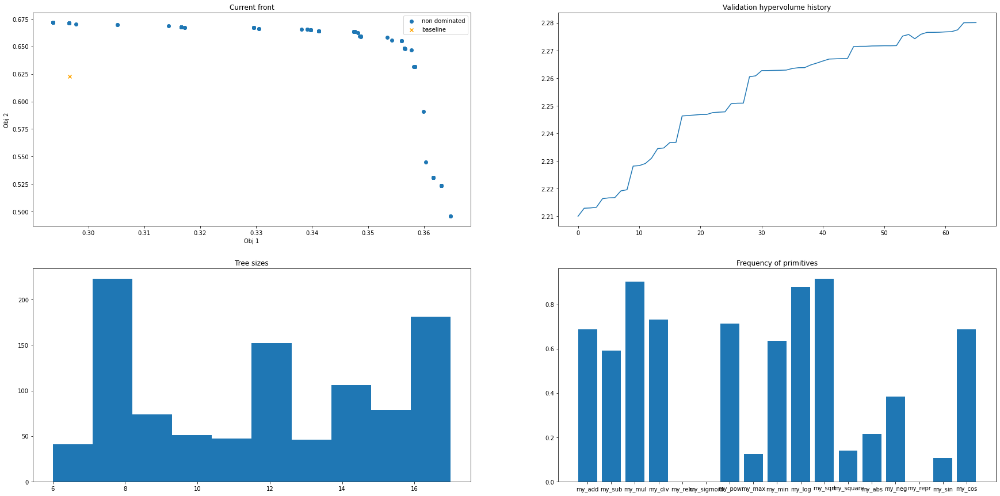

-- Generation 66 --
Training   set hypervolume: 2.3161504878107184
Validation set hypervolume: 2.280108010261975


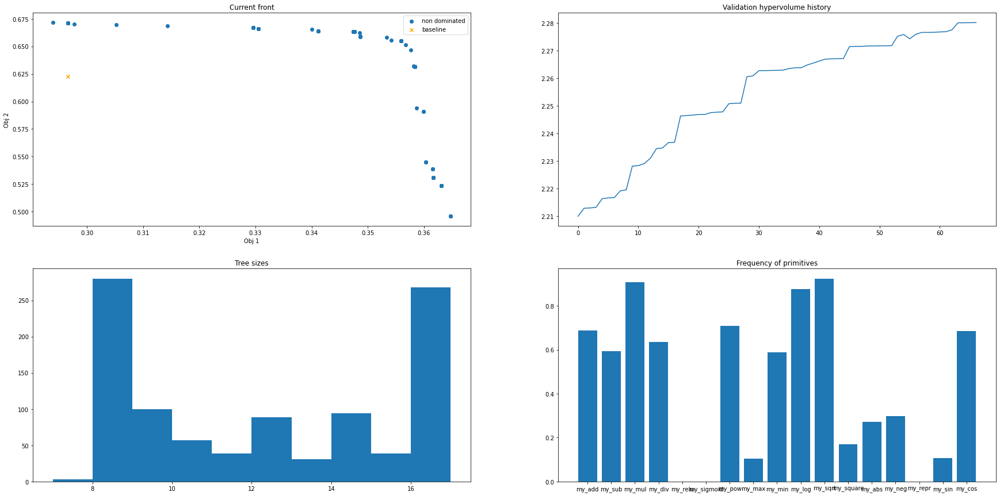

-- Generation 67 --
Training   set hypervolume: 2.2937111800750776
Validation set hypervolume: 2.280173859382352


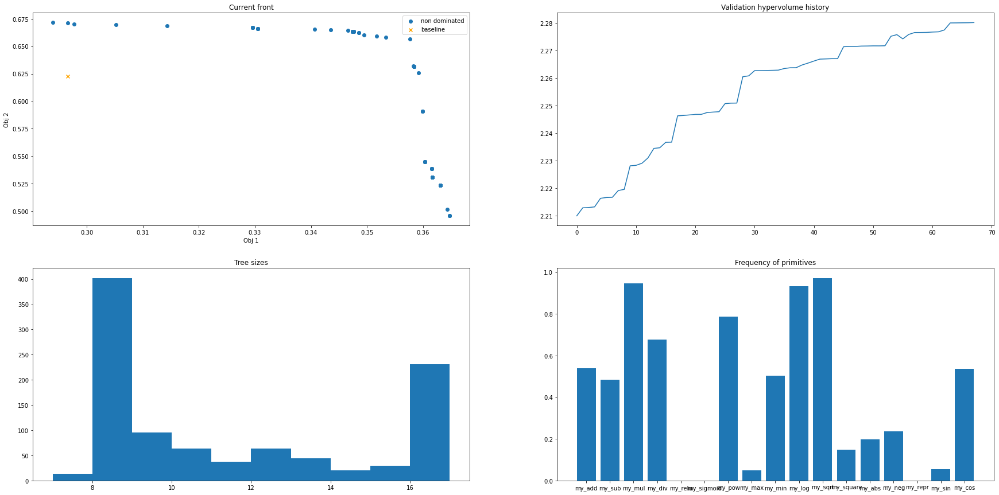

-- Generation 68 --
Training   set hypervolume: 2.318989210628464
Validation set hypervolume: 2.280196336859881


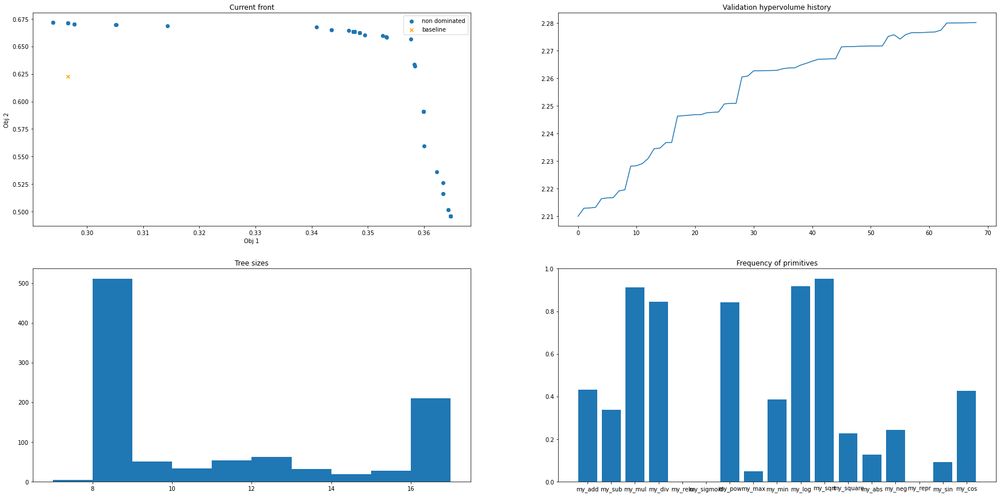

-- Generation 69 --
Training   set hypervolume: 2.3166417699820974
Validation set hypervolume: 2.2805954900899286


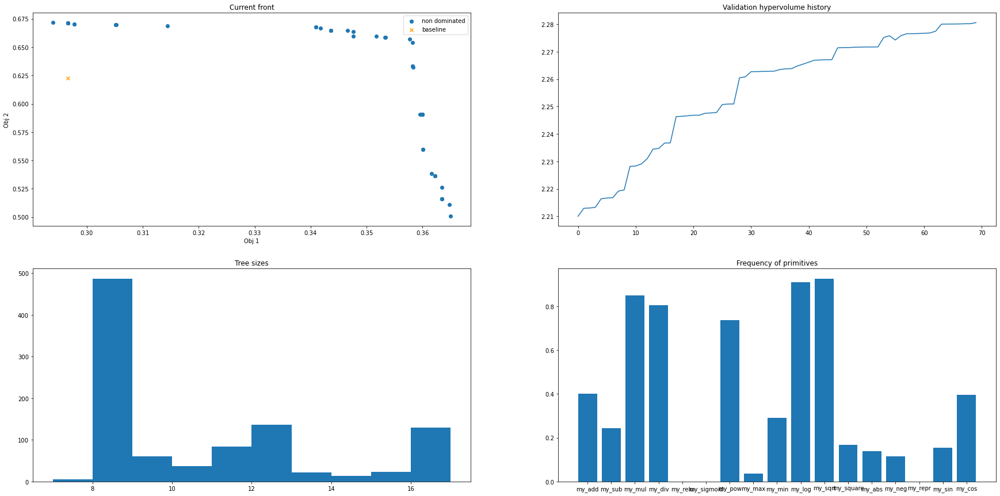

-- Generation 70 --
Training   set hypervolume: 2.292311020409543
Validation set hypervolume: 2.2805965998762425


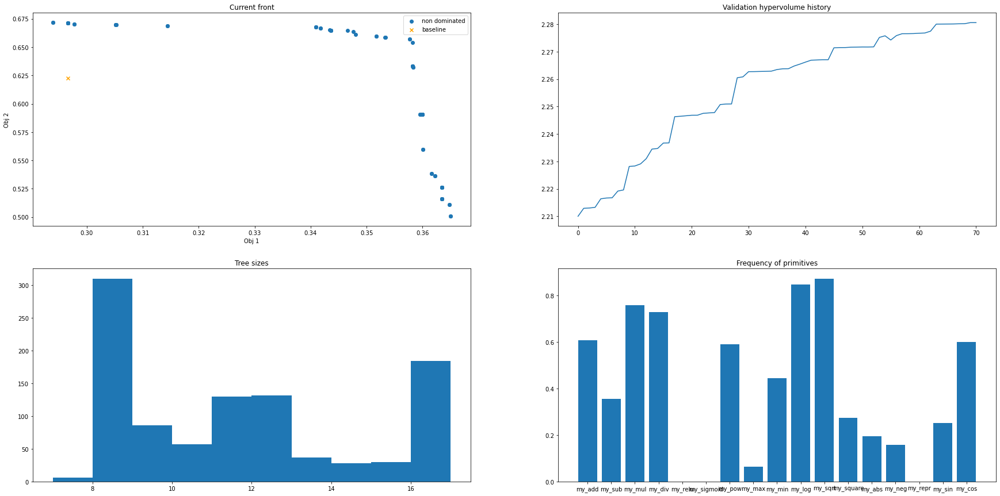

-- Generation 71 --
Training   set hypervolume: 2.3066752868062954
Validation set hypervolume: 2.28059173144391


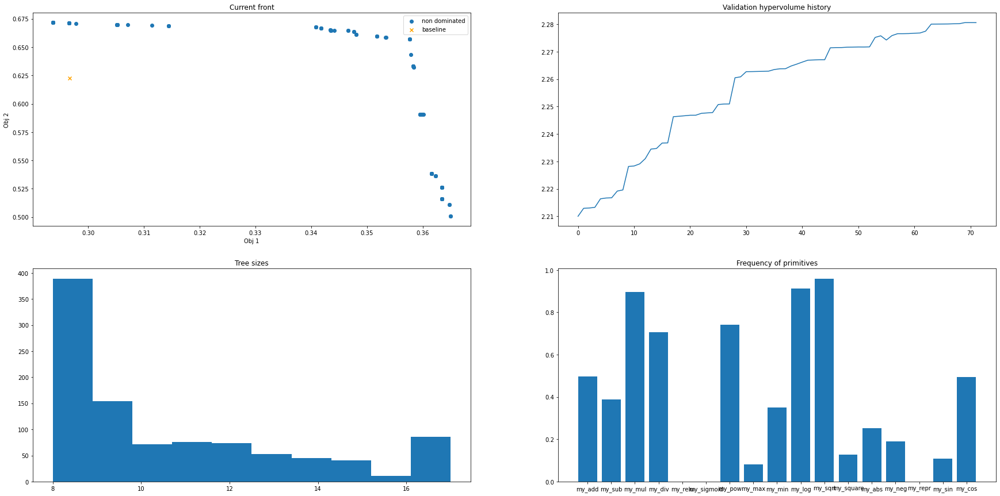

-- Generation 72 --
Training   set hypervolume: 2.273062332963445
Validation set hypervolume: 2.2806328325459644


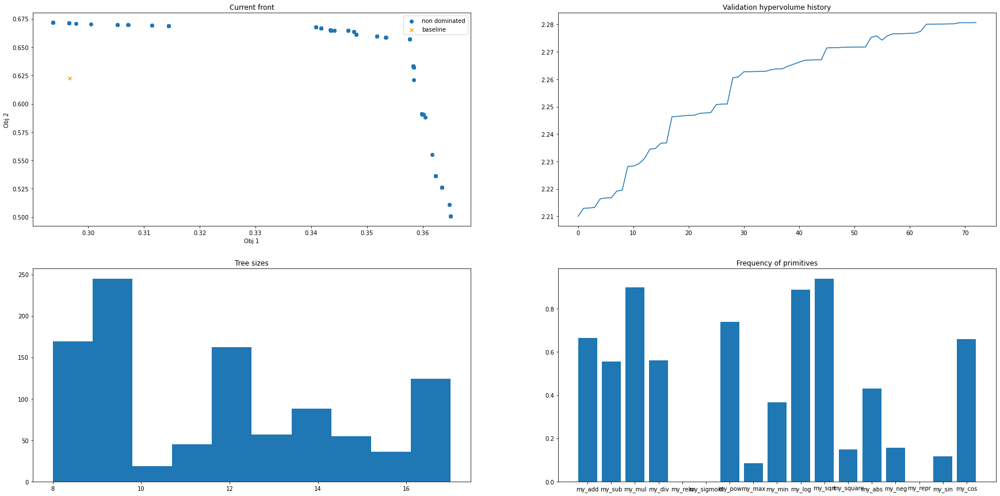

-- Generation 73 --
Training   set hypervolume: 2.2981362229065376
Validation set hypervolume: 2.280705100266479


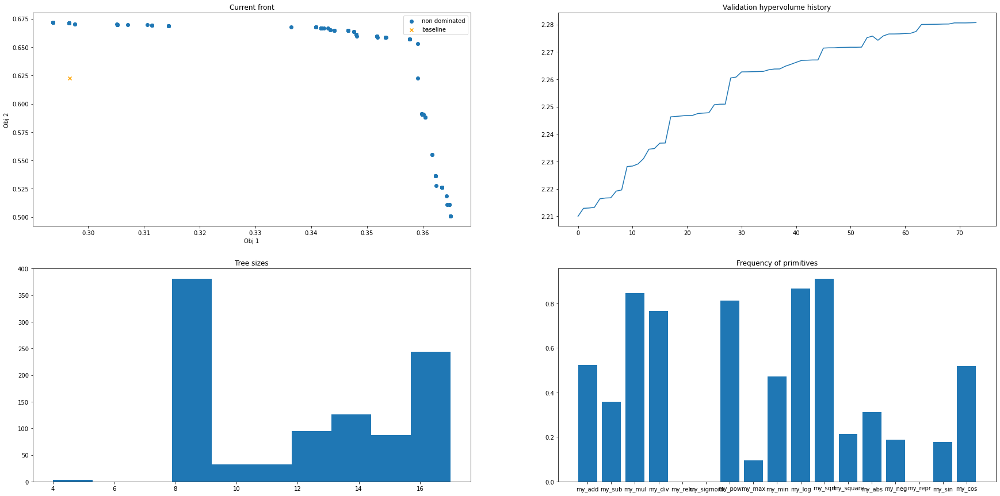

-- Generation 74 --
Training   set hypervolume: 2.267492945516358
Validation set hypervolume: 2.2796351210274763


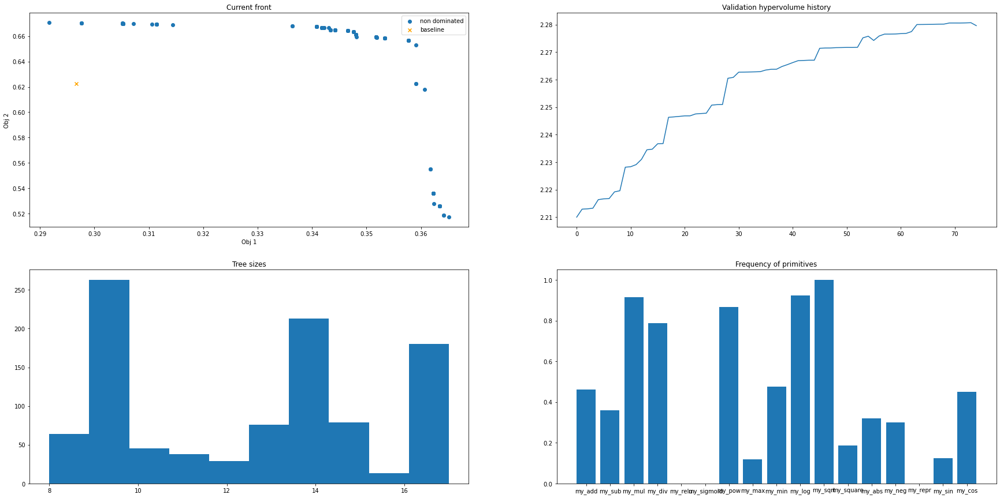

-- Generation 75 --
Training   set hypervolume: 2.3306258008019523
Validation set hypervolume: 2.27962544105183


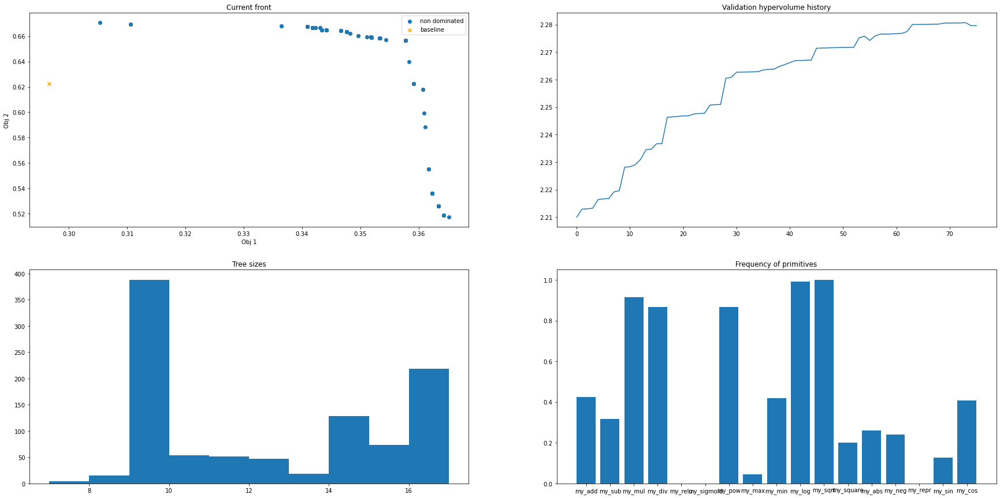

-- Generation 76 --
Training   set hypervolume: 2.3083714803902704
Validation set hypervolume: 2.279447778441076


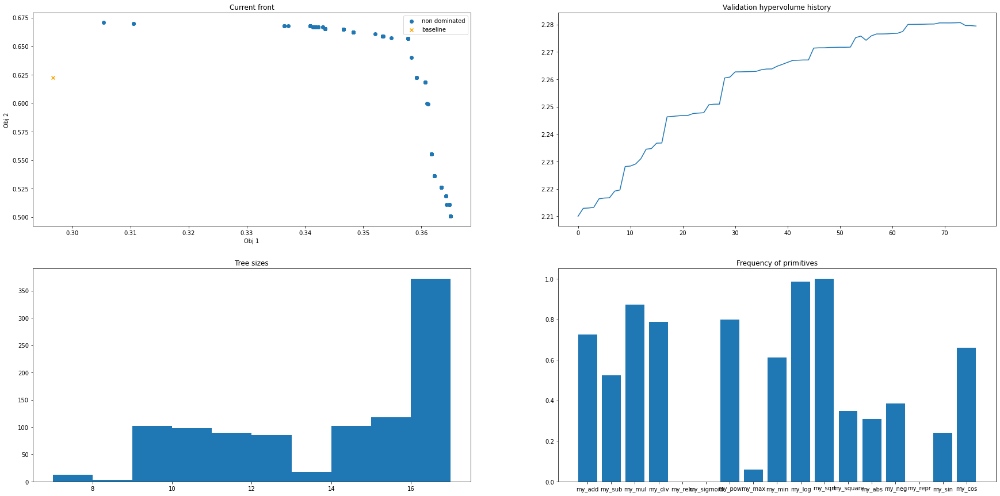

-- Generation 77 --
Training   set hypervolume: 2.2339094004927844
Validation set hypervolume: 2.280824114287853


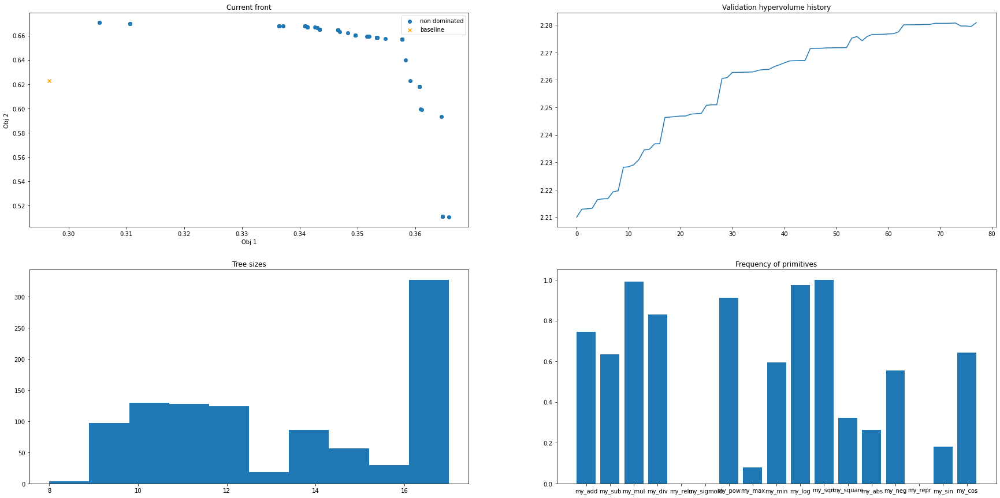

-- Generation 78 --
Training   set hypervolume: 2.283757081317347
Validation set hypervolume: 2.280897478701459


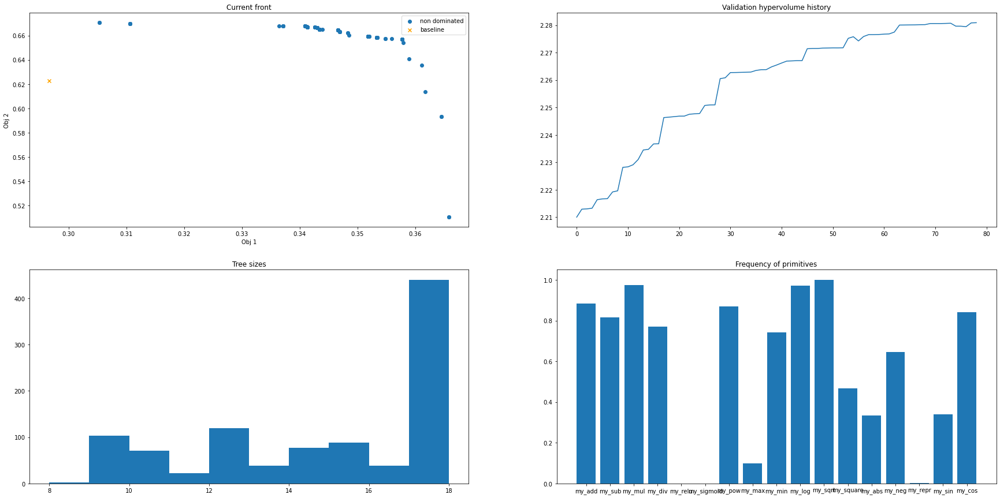

-- Generation 79 --
Training   set hypervolume: 2.279579368264789
Validation set hypervolume: 2.2809377707722875


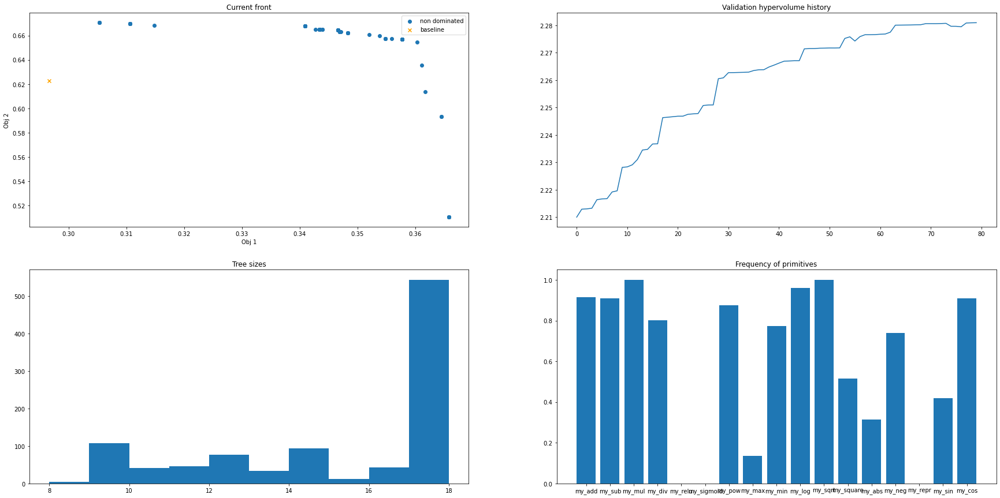

-- Generation 80 --
Training   set hypervolume: 2.285418239060851
Validation set hypervolume: 2.280968548767767


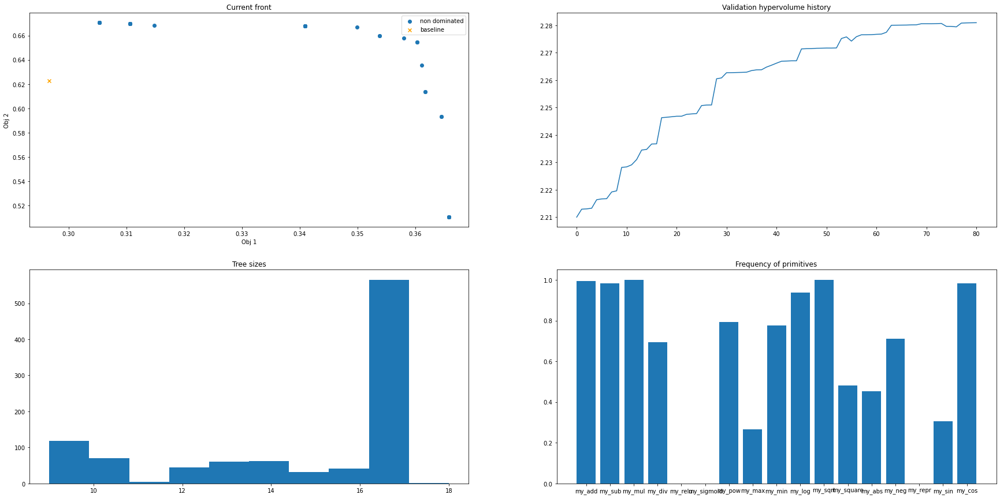

-- Generation 81 --
Training   set hypervolume: 2.2946231660044343
Validation set hypervolume: 2.2817082670383395


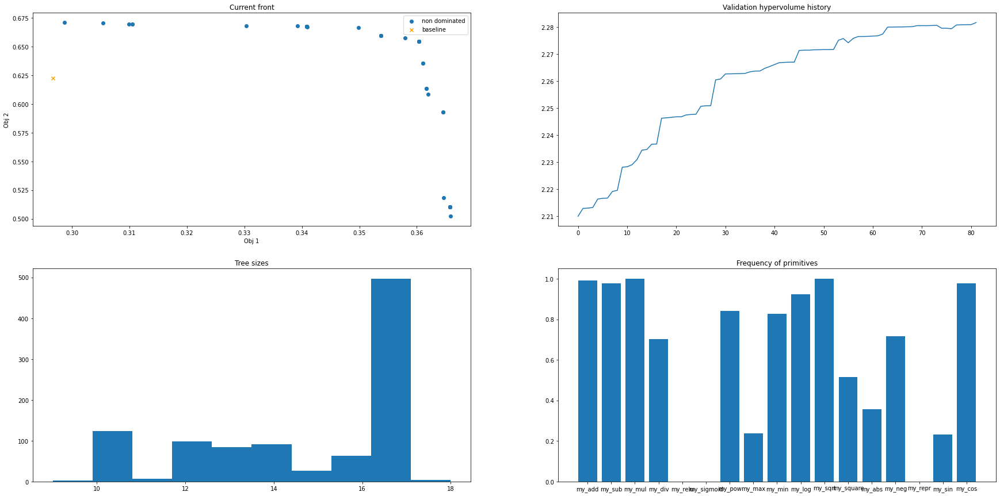

-- Generation 82 --
Training   set hypervolume: 2.2904045298121876
Validation set hypervolume: 2.2817053163490777


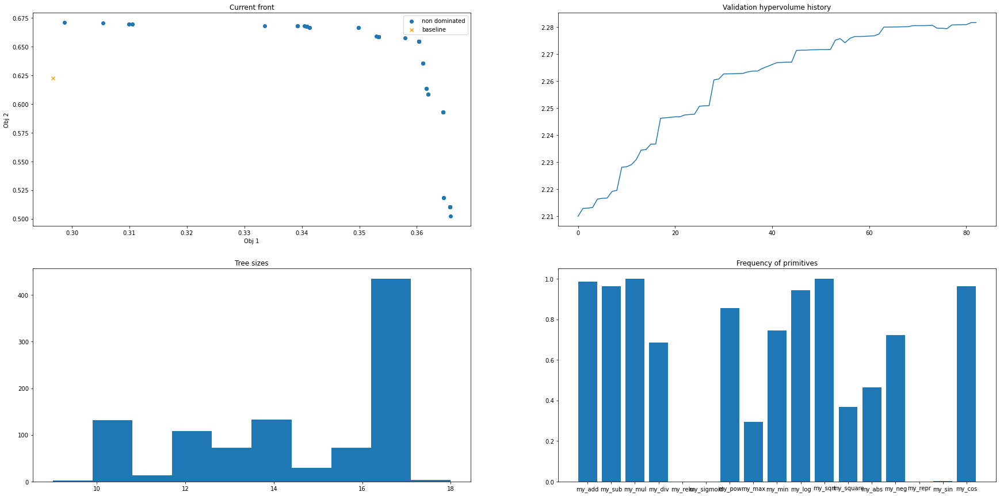

-- Generation 83 --
Training   set hypervolume: 2.269668834570587
Validation set hypervolume: 2.28184328582543


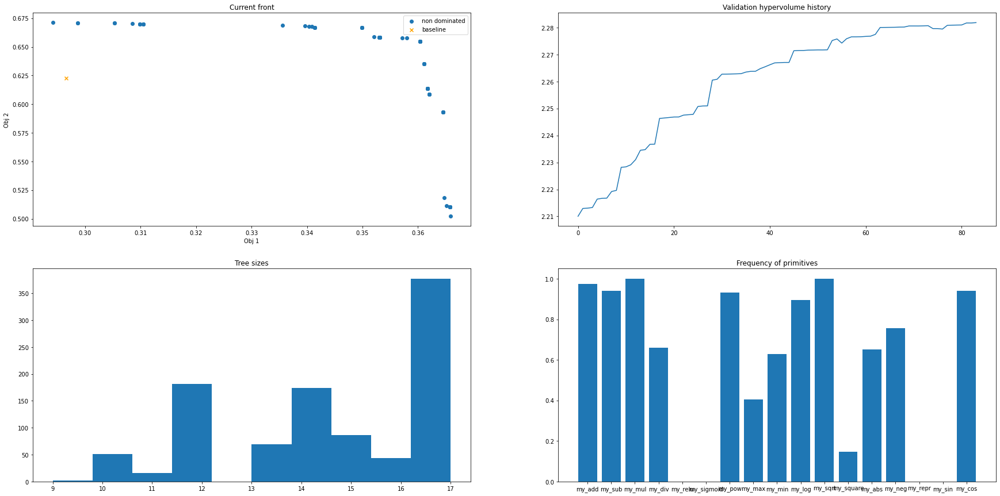

-- Generation 84 --
Training   set hypervolume: 2.311675196530838
Validation set hypervolume: 2.282376156057807


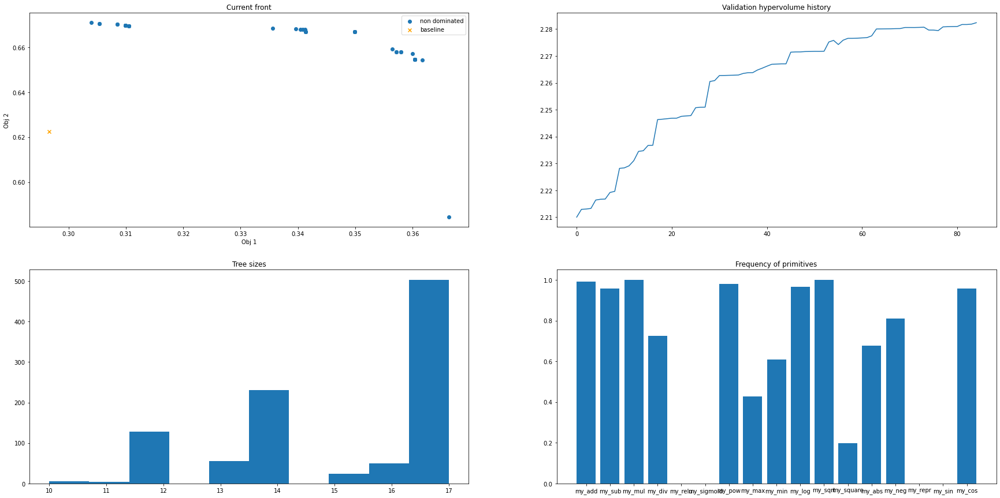

-- Generation 85 --
Training   set hypervolume: 2.285260422062447
Validation set hypervolume: 2.282462341407732


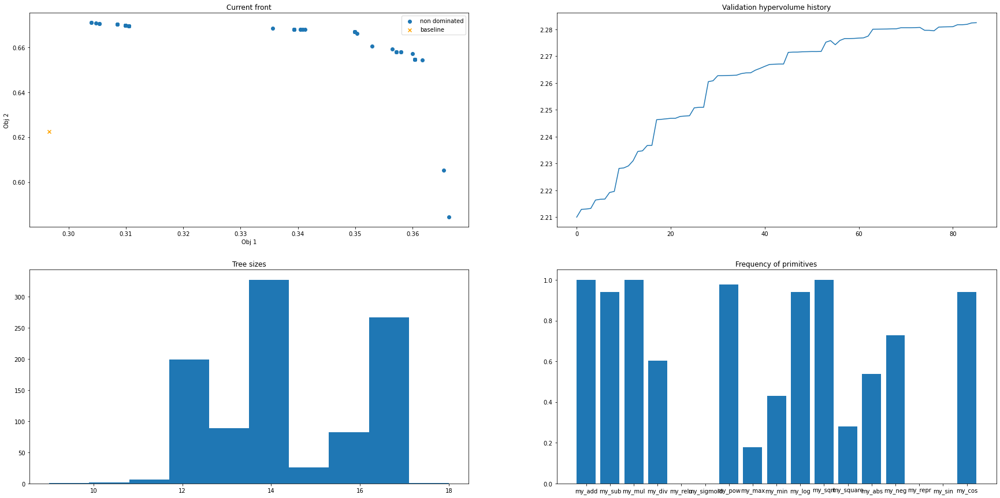

-- Generation 86 --
Training   set hypervolume: 2.2944927458105133
Validation set hypervolume: 2.2816674793189726


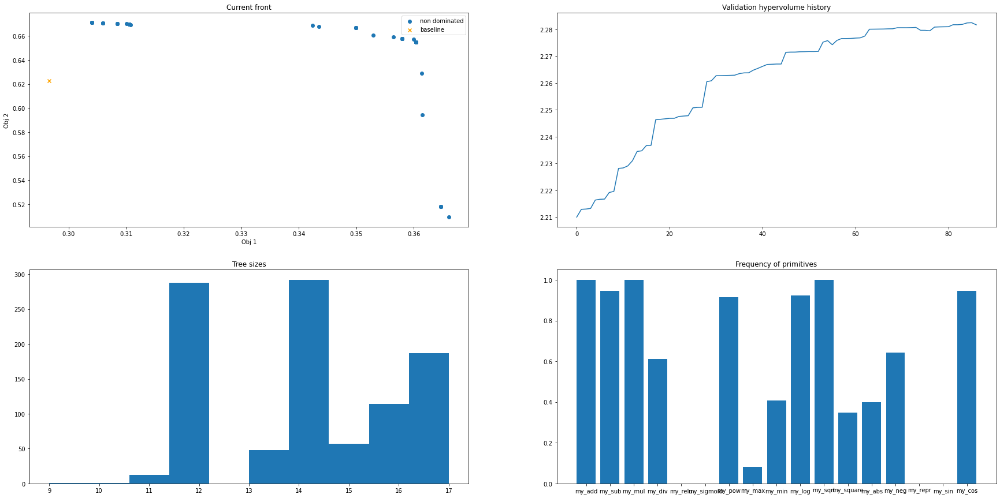

-- Generation 87 --
Training   set hypervolume: 2.271486191911669
Validation set hypervolume: 2.281595253090272


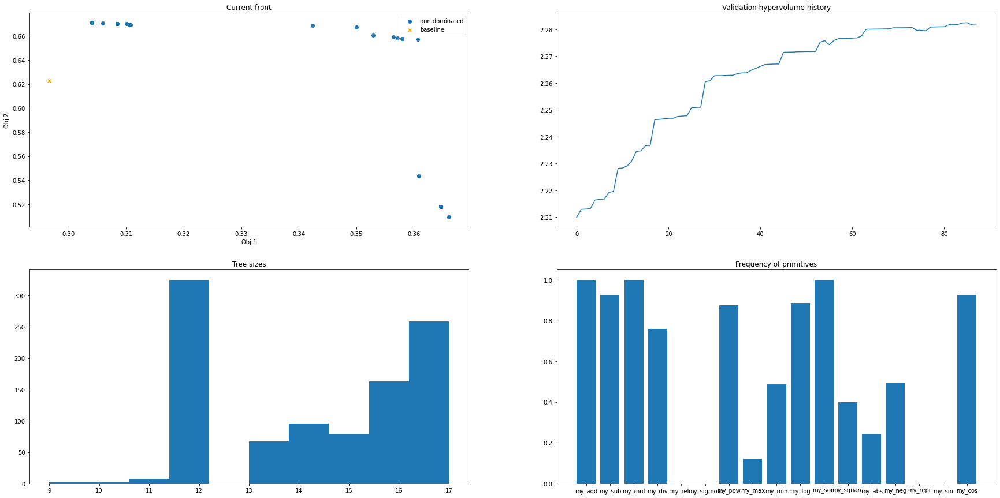

-- Generation 88 --
Training   set hypervolume: 2.2907896492957915
Validation set hypervolume: 2.2817967944318363


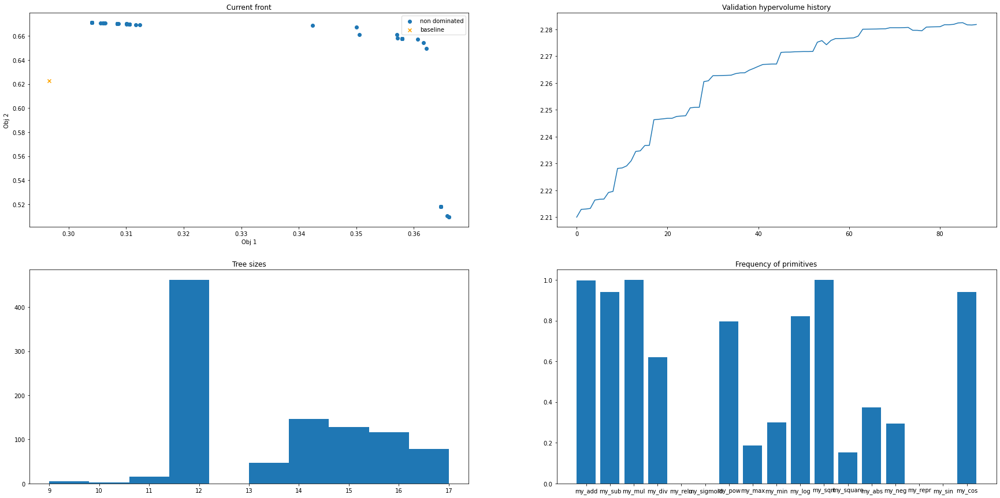

-- Generation 89 --
Training   set hypervolume: 2.2981971106799346
Validation set hypervolume: 2.2818455800117503


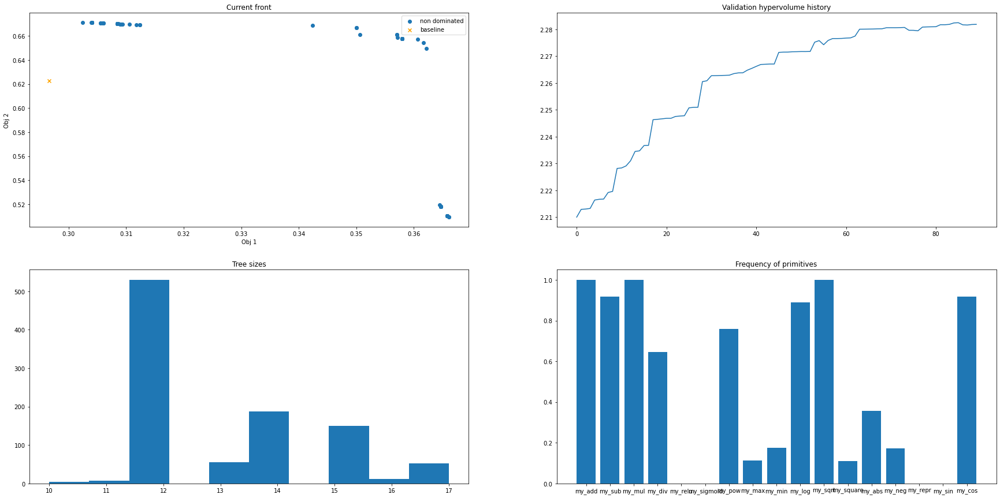

-- Generation 90 --
Training   set hypervolume: 2.353152059705559
Validation set hypervolume: 2.281846653729577


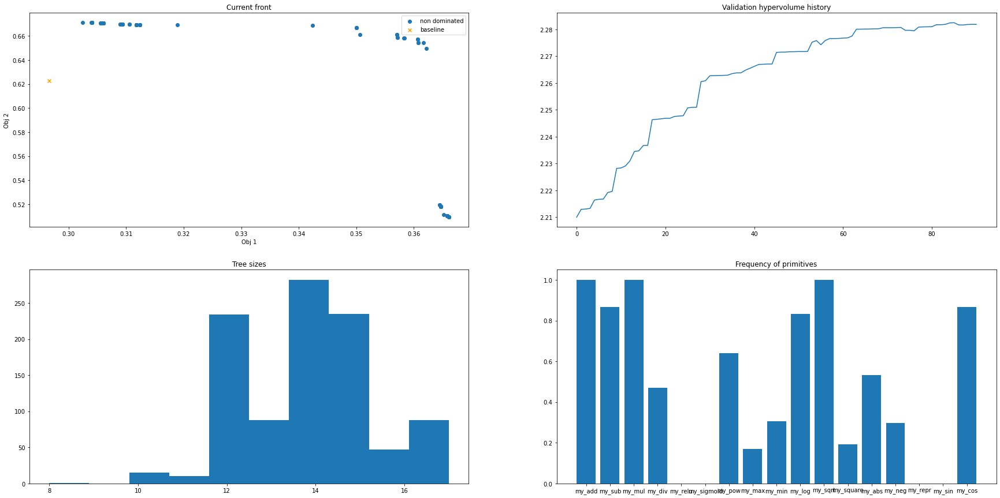

-- Generation 91 --
Training   set hypervolume: 2.2639335546587573
Validation set hypervolume: 2.283282048156155


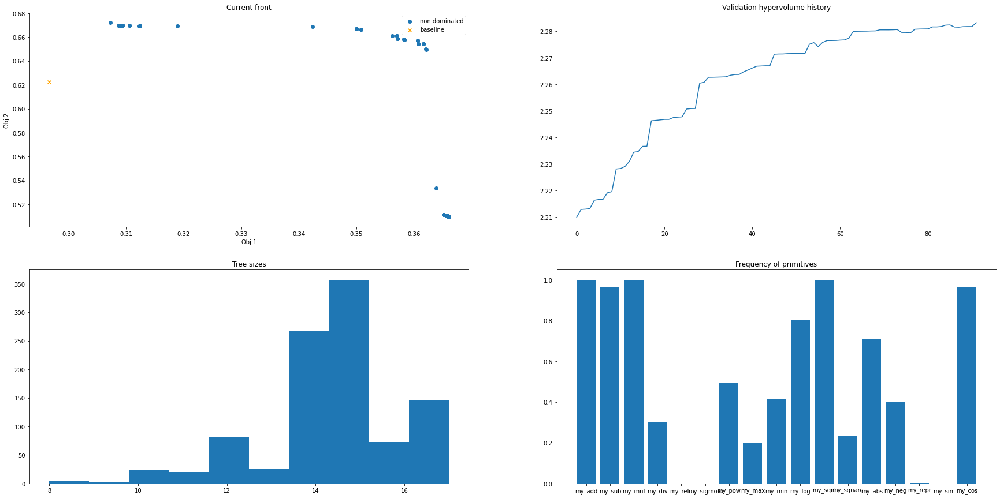

-- Generation 92 --
Training   set hypervolume: 2.290457169157129
Validation set hypervolume: 2.2832696662330063


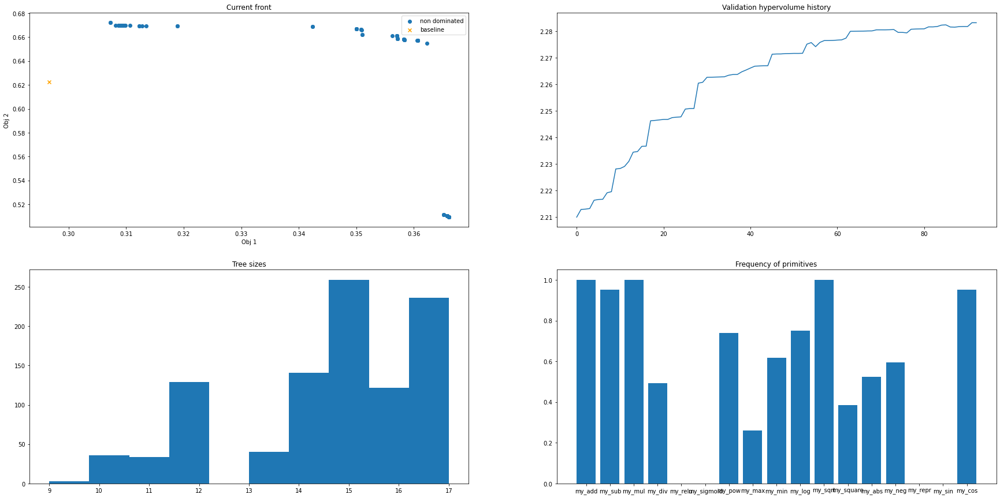

-- Generation 93 --
Training   set hypervolume: 2.316269984111616
Validation set hypervolume: 2.283274817163697


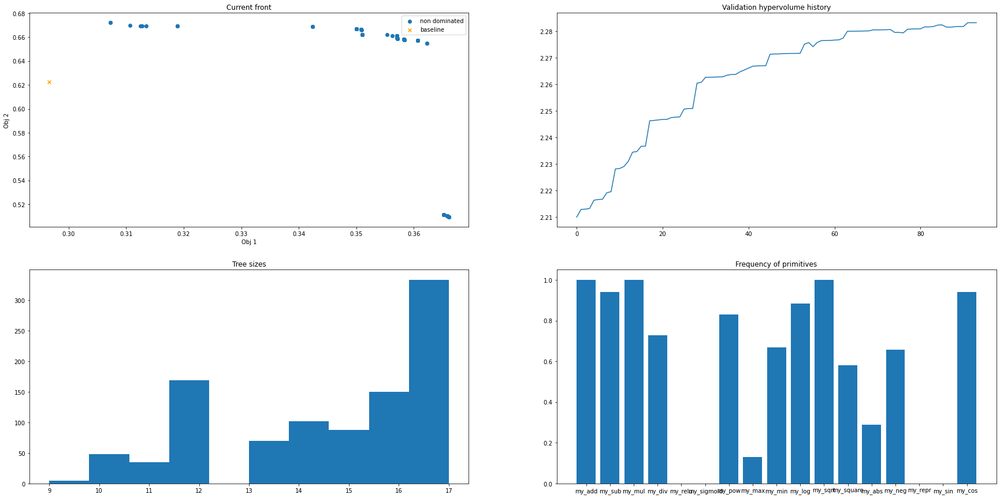

-- Generation 94 --
Training   set hypervolume: 2.2936045270970813
Validation set hypervolume: 2.277897733241136


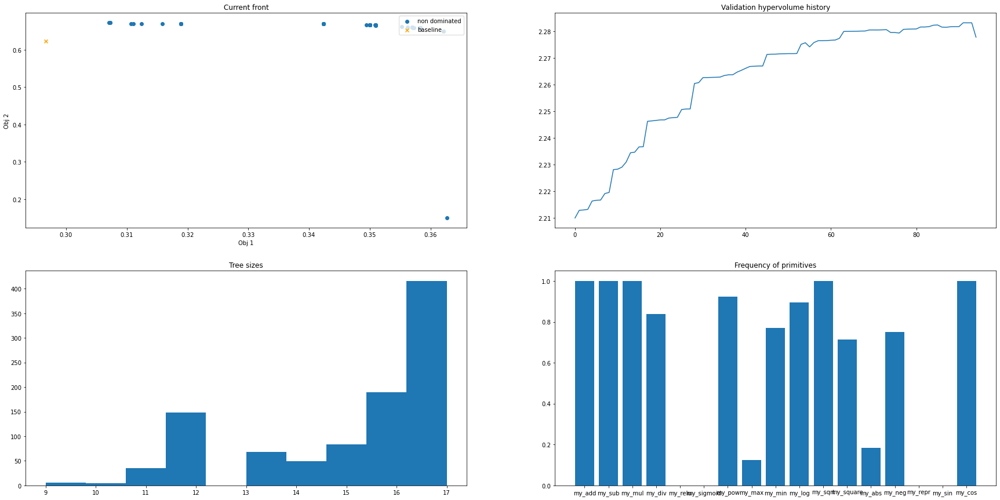

-- Generation 95 --
Training   set hypervolume: 2.323251692270142
Validation set hypervolume: 2.277937915032439


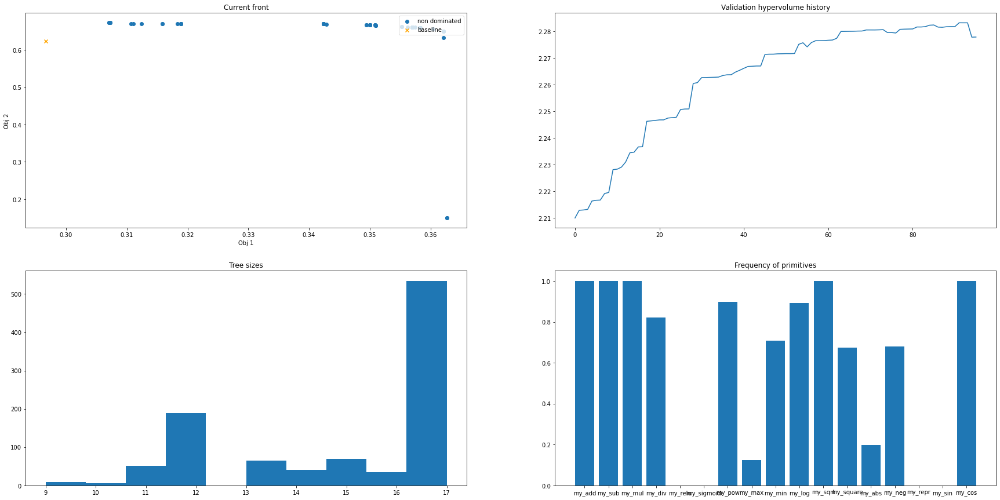

-- Generation 96 --
Training   set hypervolume: 2.291338691297687
Validation set hypervolume: 2.277902321163677


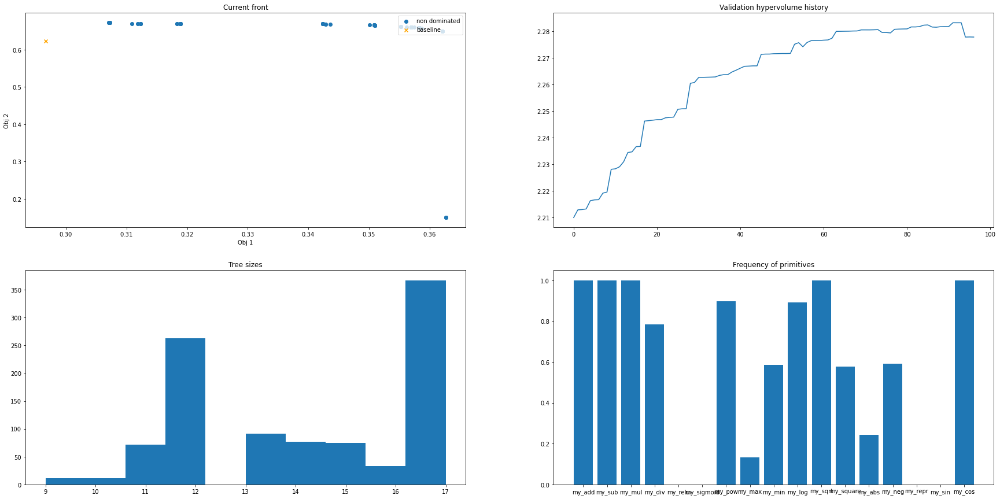

-- Generation 97 --
Training   set hypervolume: 2.3332888604007906
Validation set hypervolume: 2.2805474473431597


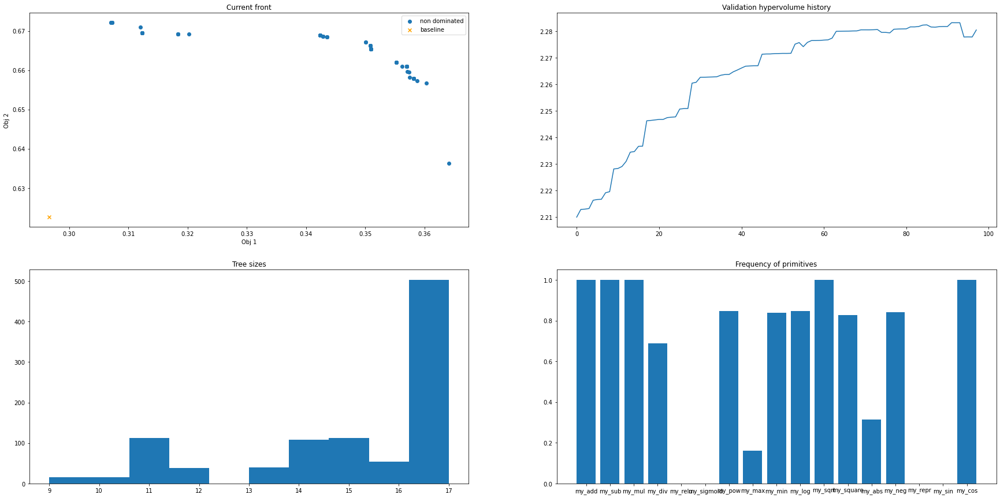

-- Generation 98 --
Training   set hypervolume: 2.2925883572848
Validation set hypervolume: 2.280509513620399


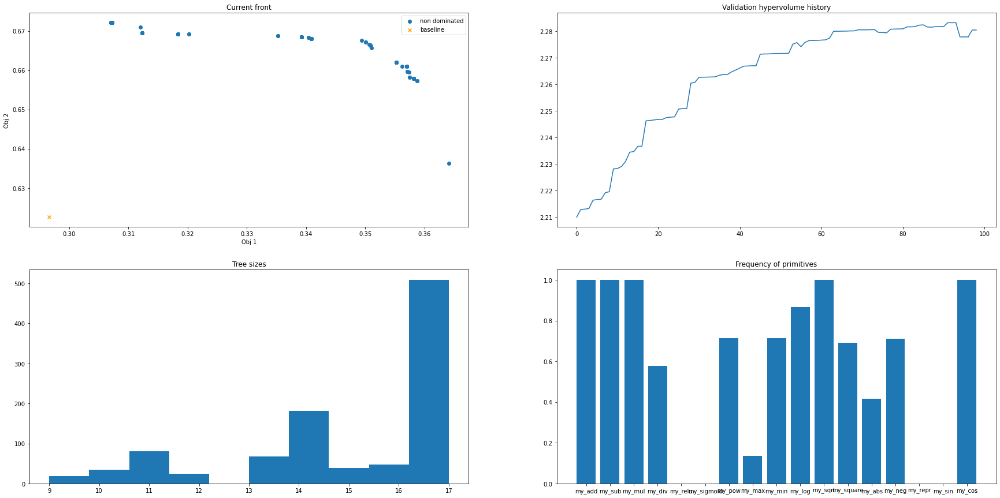

-- Generation 99 --
Training   set hypervolume: 2.308421749868936
Validation set hypervolume: 2.280552984503765


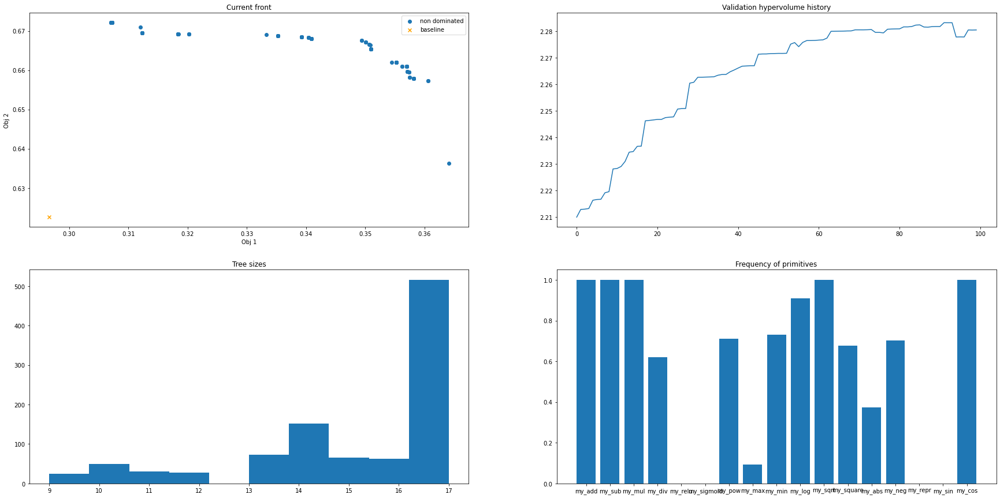

-- Generation 100 --
Training   set hypervolume: 2.274076583669245
Validation set hypervolume: 2.2805830017815523


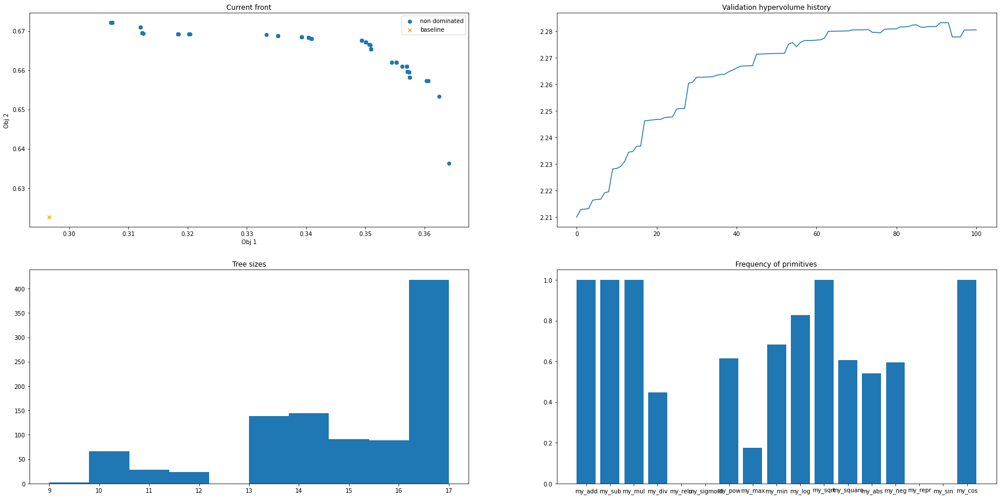

2.2805830017815523 0
-- Generation 101 --
Training   set hypervolume: 2.3315565597839414
Validation set hypervolume: 2.2805879115448757


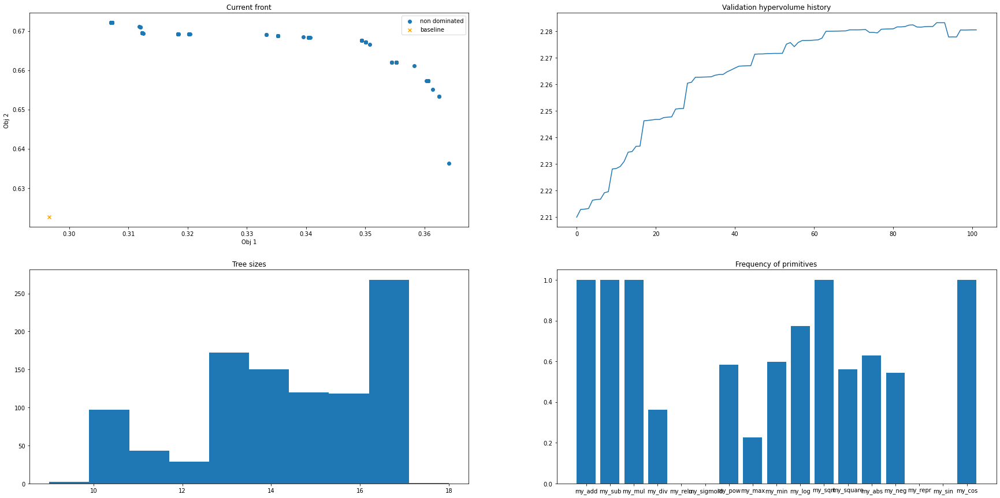

-- Generation 102 --
Training   set hypervolume: 2.3068396653114247
Validation set hypervolume: 2.2805905939555937


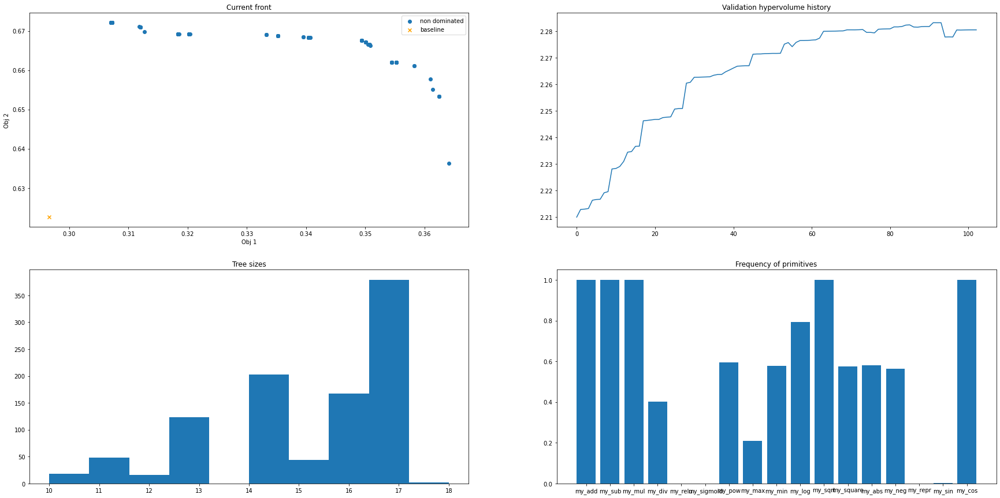

-- Generation 103 --
Training   set hypervolume: 2.2938775005560825
Validation set hypervolume: 2.281431145175451


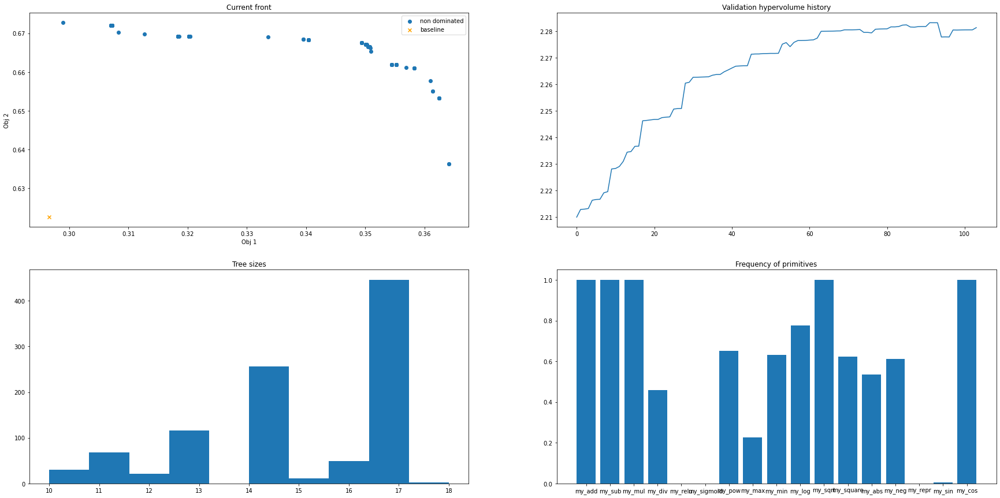

-- Generation 104 --
Training   set hypervolume: 2.277907257106131
Validation set hypervolume: 2.281737622502092


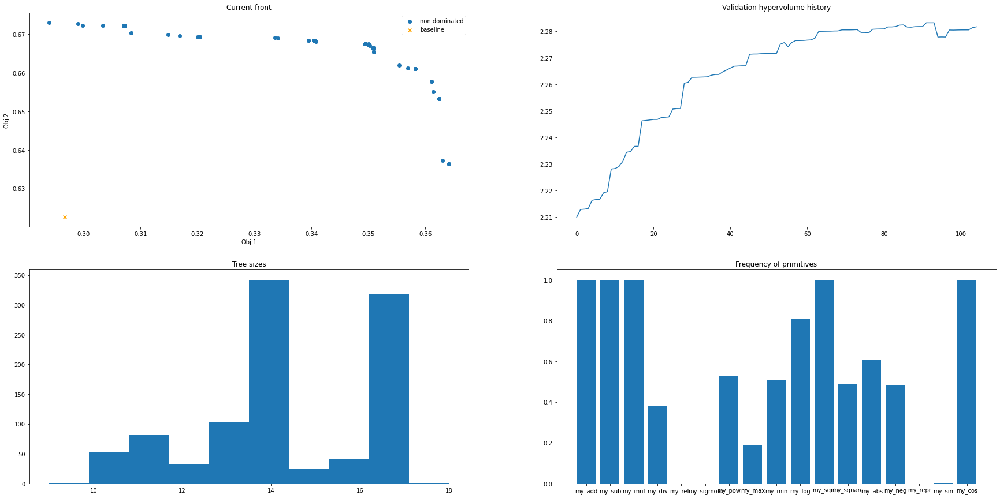

-- Generation 105 --
Training   set hypervolume: 2.29395557059999
Validation set hypervolume: 2.282439084772435


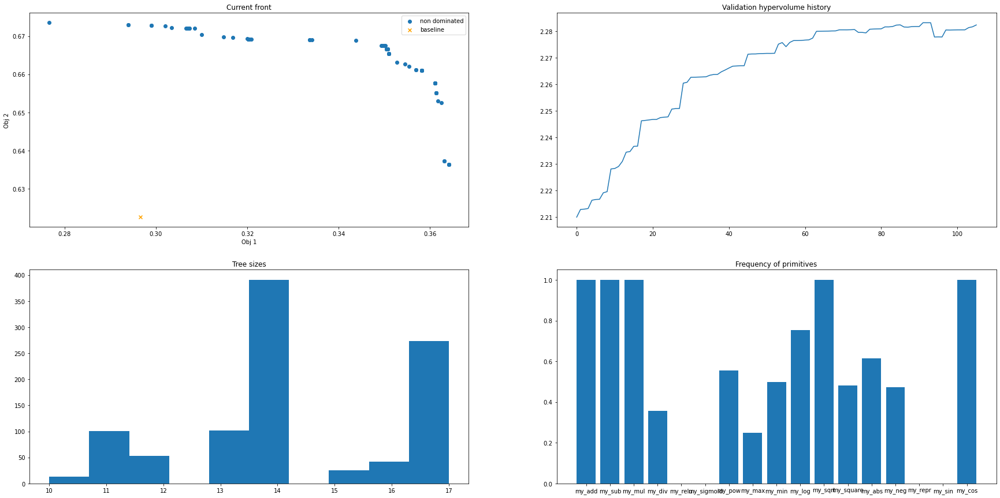

-- Generation 106 --
Training   set hypervolume: 2.325847051603693
Validation set hypervolume: 2.2824458804341785


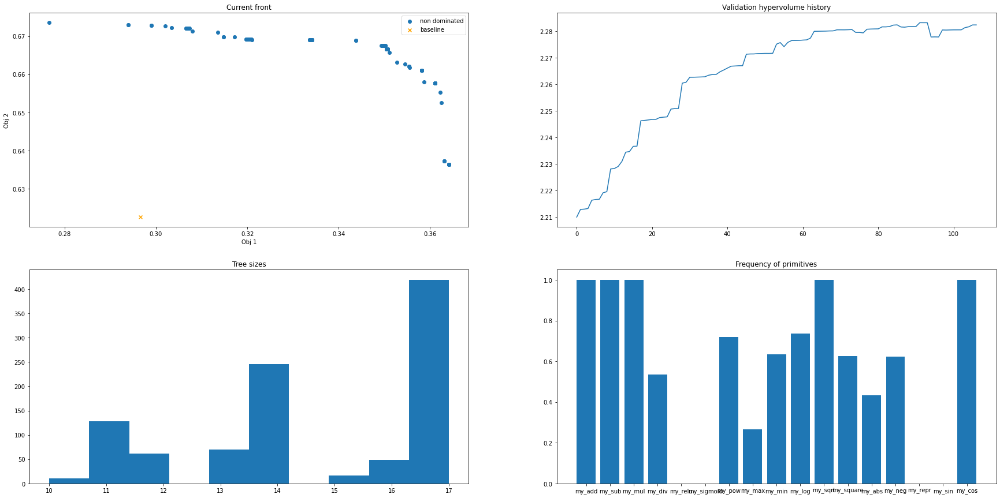

-- Generation 107 --
Training   set hypervolume: 2.2988895890509307
Validation set hypervolume: 2.281731784587759


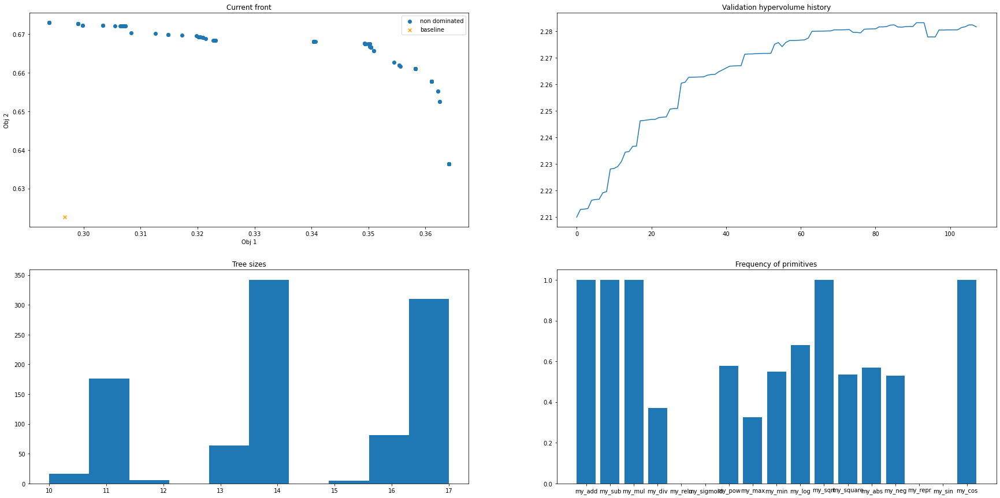

-- Generation 108 --
Training   set hypervolume: 2.252342996074207
Validation set hypervolume: 2.2858029238704005


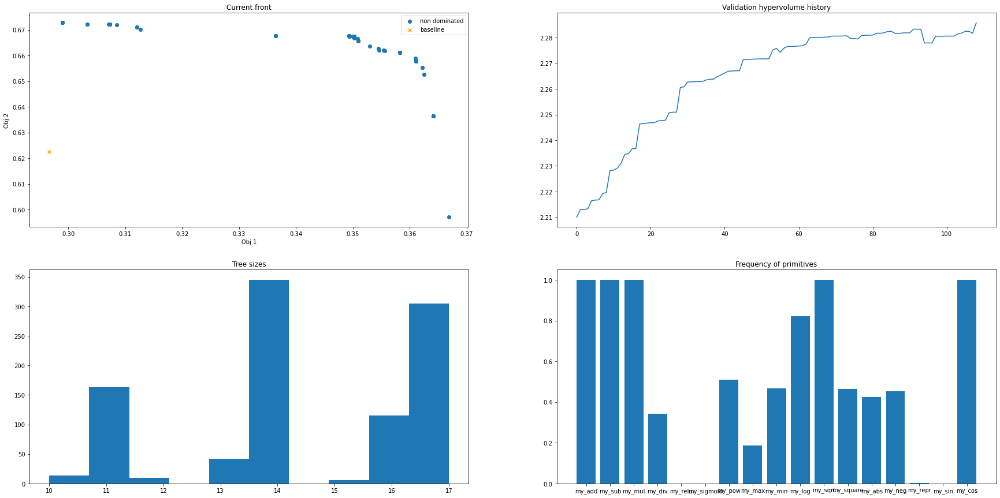

-- Generation 109 --
Training   set hypervolume: 2.316297778293302
Validation set hypervolume: 2.2856858580097548


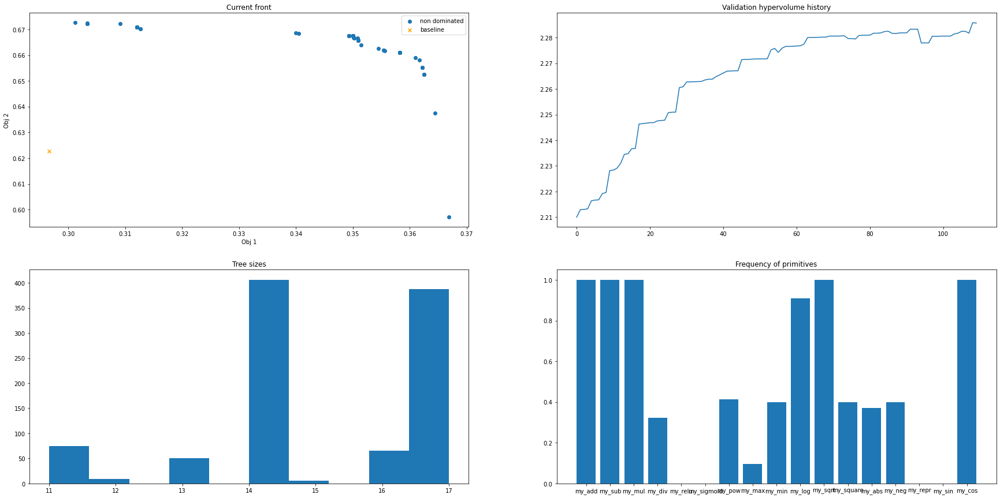

-- Generation 110 --
Training   set hypervolume: 2.301549754660547
Validation set hypervolume: 2.286081350689579


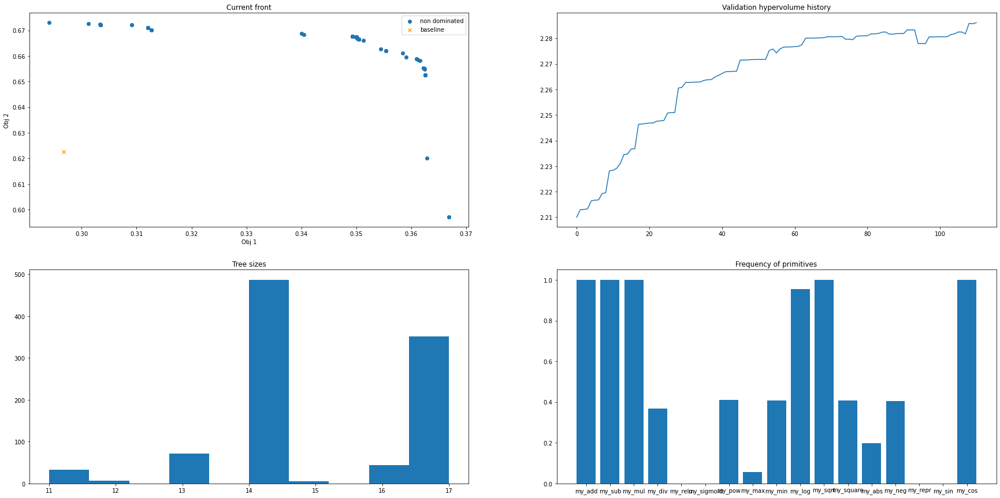

-- Generation 111 --
Training   set hypervolume: 2.294018267115355
Validation set hypervolume: 2.2860858232730923


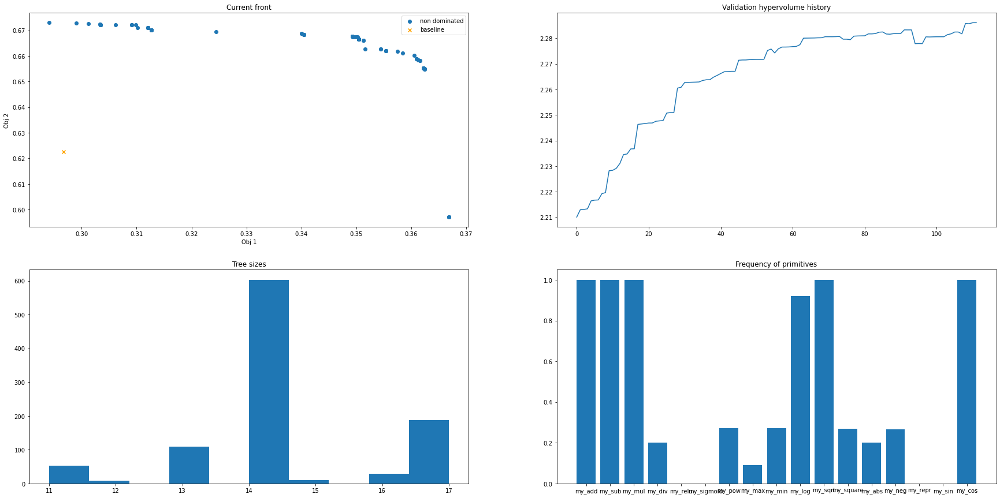

-- Generation 112 --
Training   set hypervolume: 2.295464688684334
Validation set hypervolume: 2.28579067064988


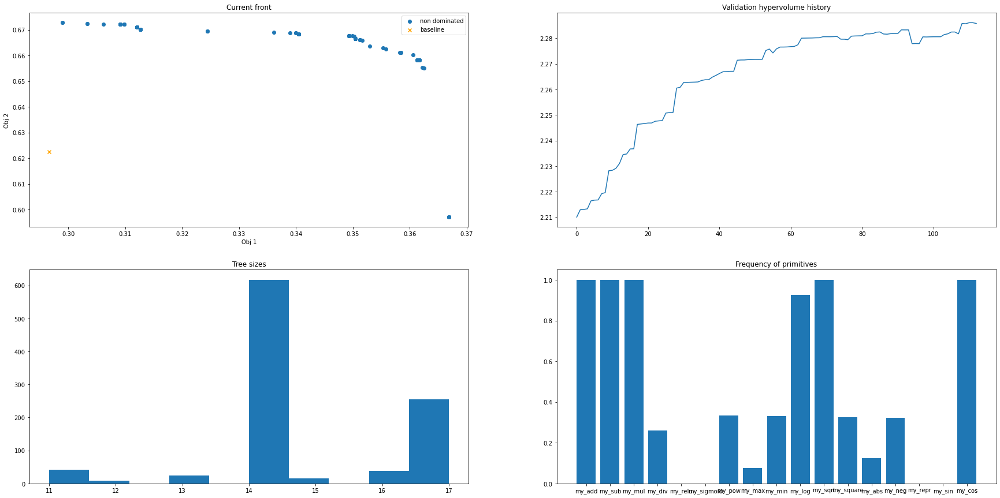

-- Generation 113 --
Training   set hypervolume: 2.2659012206068545
Validation set hypervolume: 2.2857179797566274


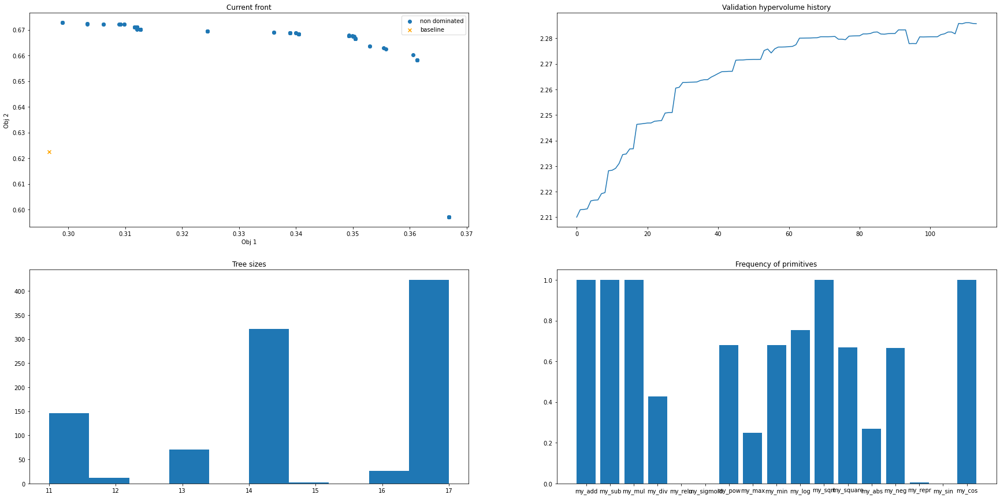

-- Generation 114 --
Training   set hypervolume: 2.2757086214432207
Validation set hypervolume: 2.2862541800947023


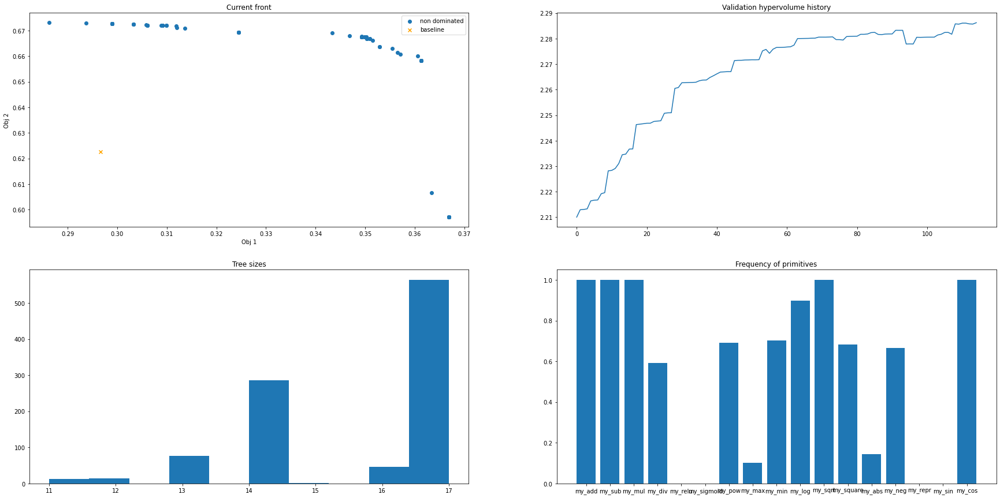

-- Generation 115 --
Training   set hypervolume: 2.3033863064788913
Validation set hypervolume: 2.2870189706926296


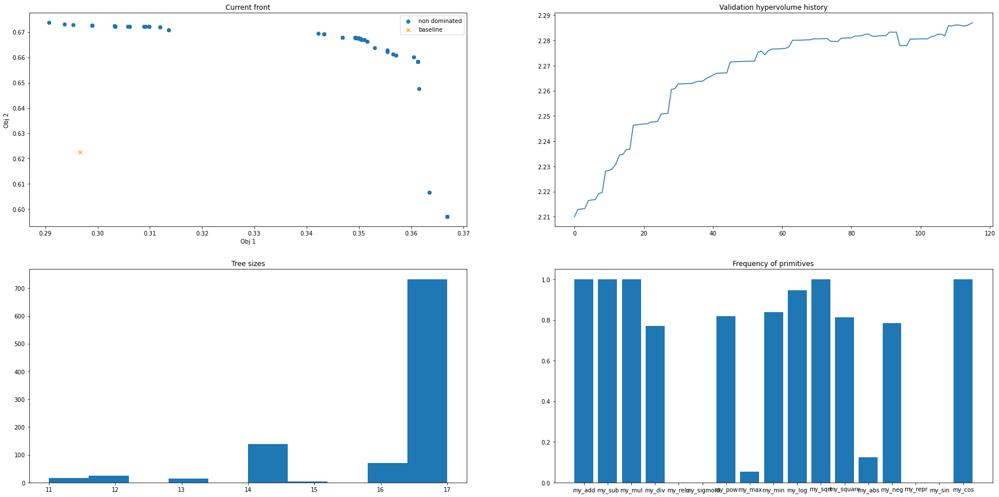

-- Generation 116 --
Training   set hypervolume: 2.28944164466754
Validation set hypervolume: 2.287033349430354


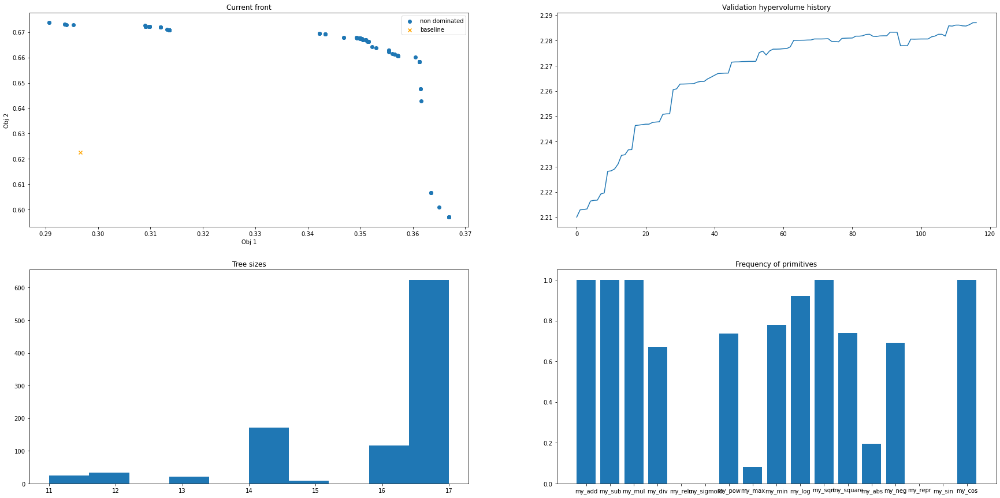

-- Generation 117 --
Training   set hypervolume: 2.3266474908011263
Validation set hypervolume: 2.287035873630287


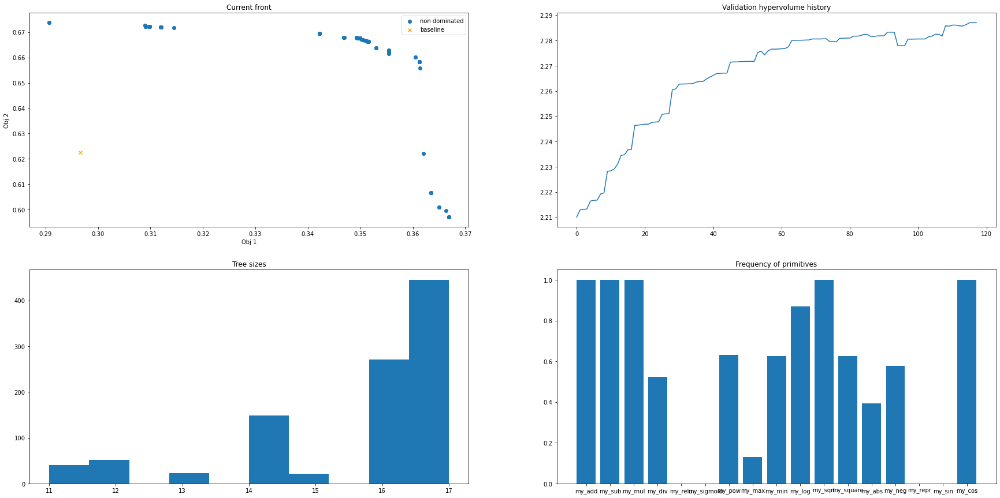

-- Generation 118 --
Training   set hypervolume: 2.2714361830502985
Validation set hypervolume: 2.2870229459497478


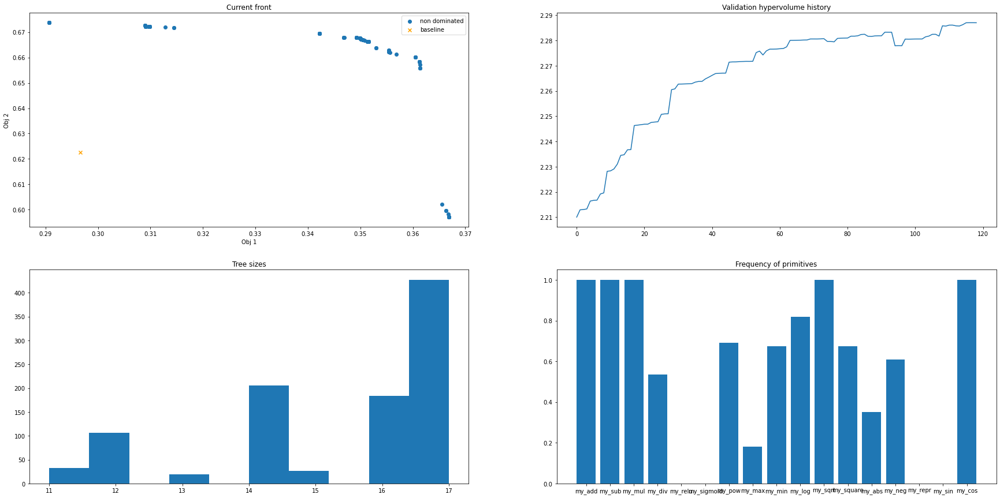

-- Generation 119 --
Training   set hypervolume: 2.2568812297109697
Validation set hypervolume: 2.2872113250917536


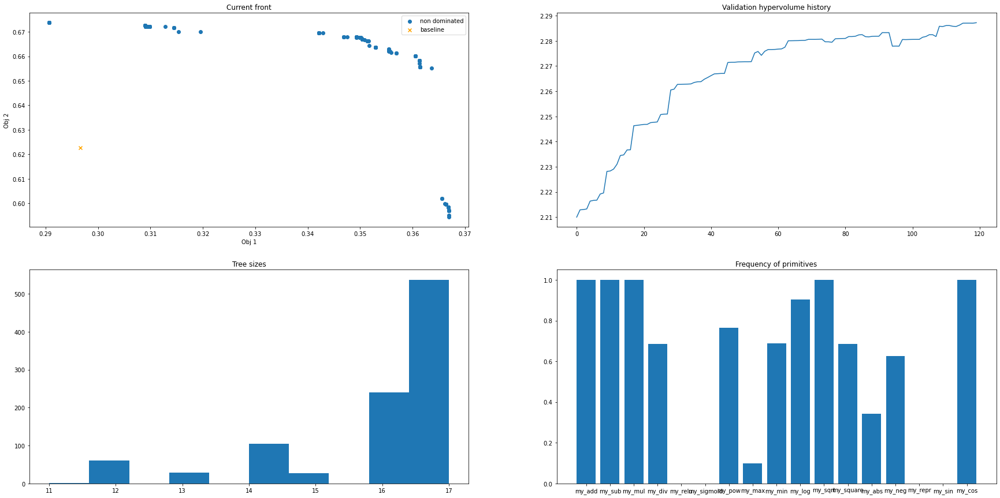

-- Generation 120 --
Training   set hypervolume: 2.273423826354952
Validation set hypervolume: 2.2872153863692204


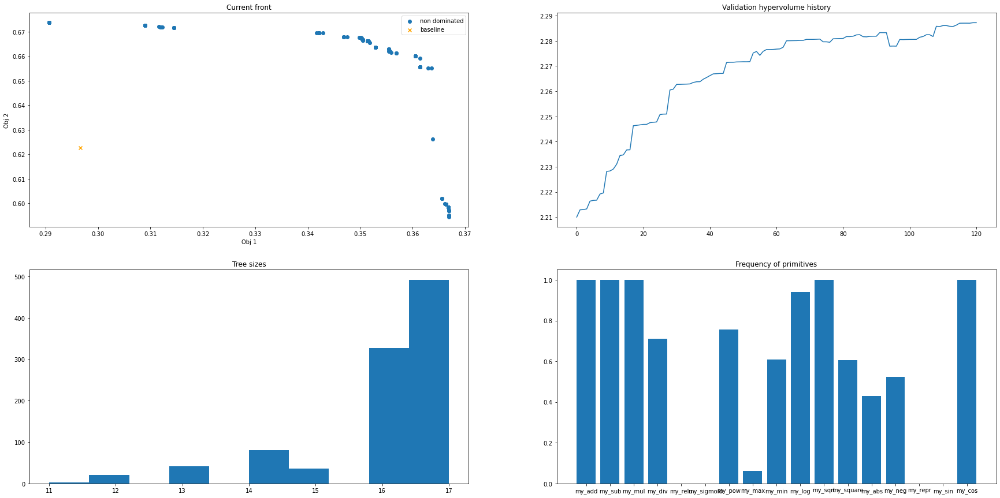

-- Generation 121 --
Training   set hypervolume: 2.298544063068968
Validation set hypervolume: 2.287850338929914


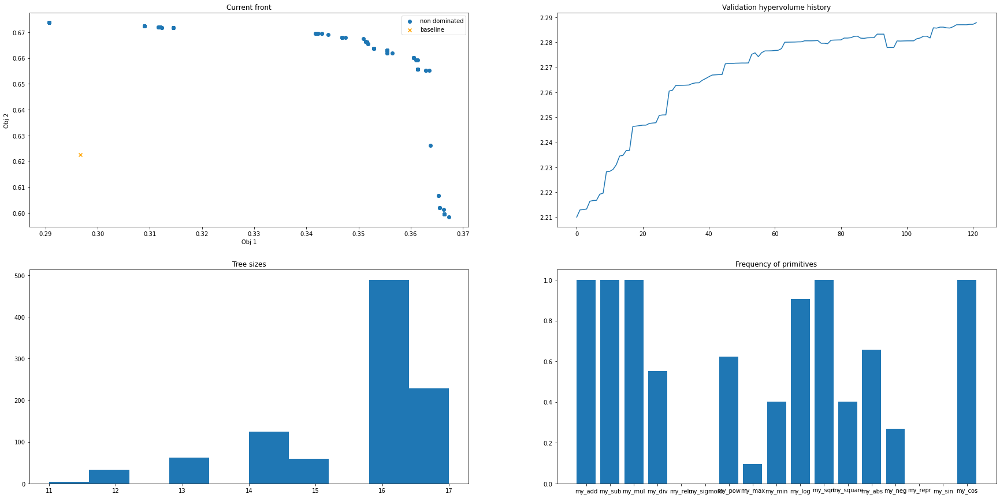

-- Generation 122 --
Training   set hypervolume: 2.2946167351165756
Validation set hypervolume: 2.287852752854667


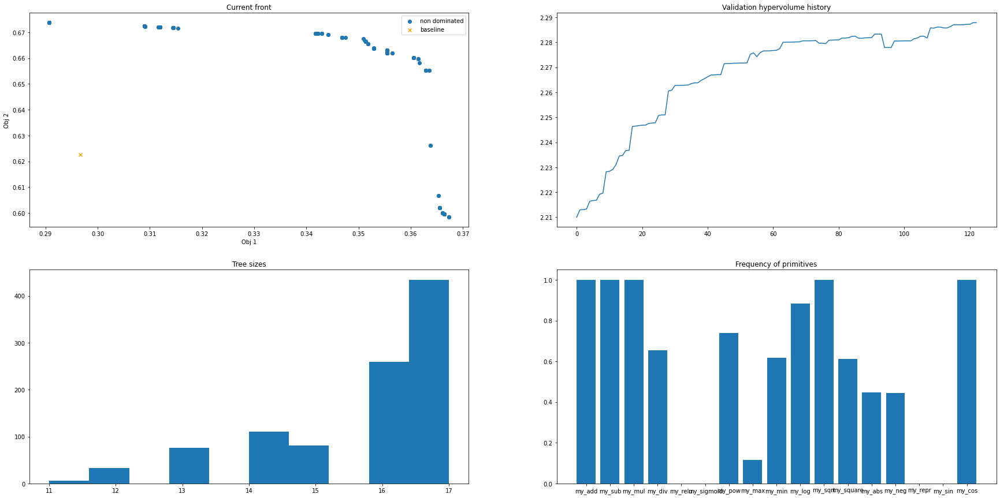

-- Generation 123 --
Training   set hypervolume: 2.2813984205241535
Validation set hypervolume: 2.287877496968424


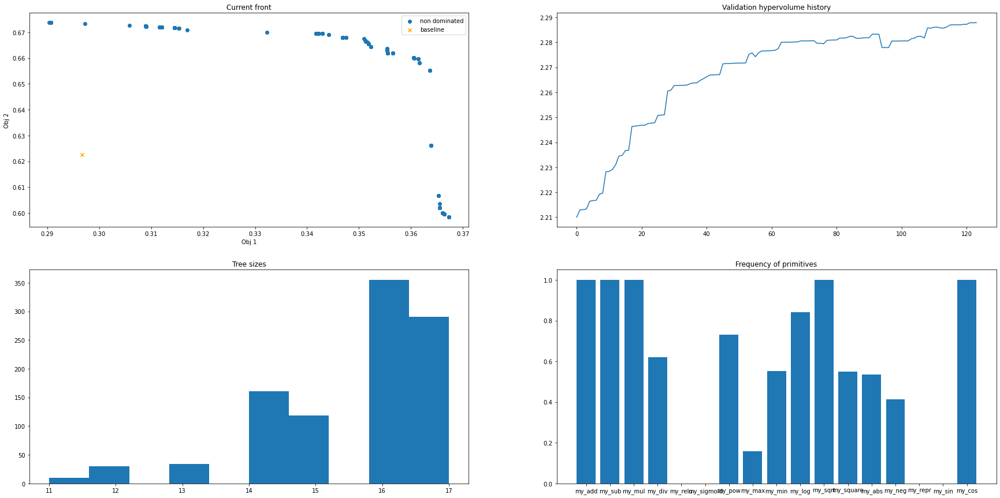

-- Generation 124 --
Training   set hypervolume: 2.3439124725962177
Validation set hypervolume: 2.2878476134069126


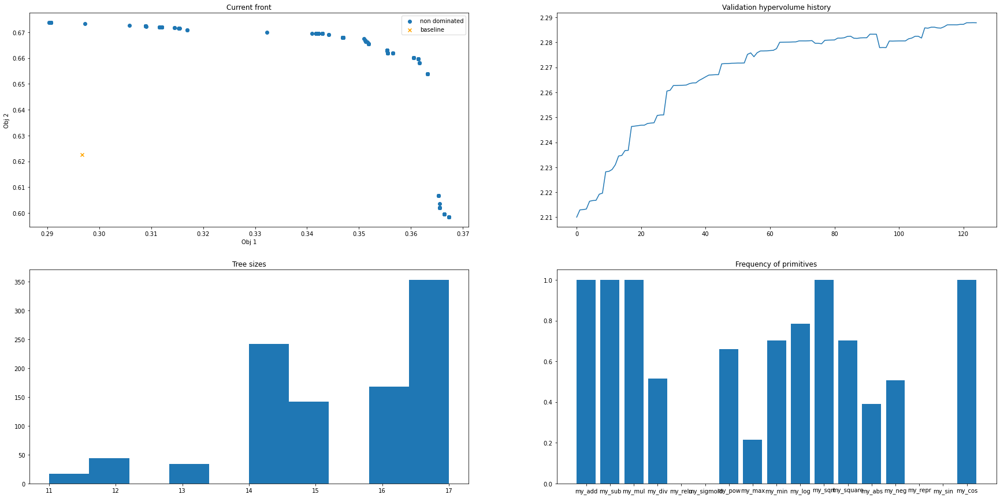

-- Generation 125 --
Training   set hypervolume: 2.2774862585808093
Validation set hypervolume: 2.2882011501903694


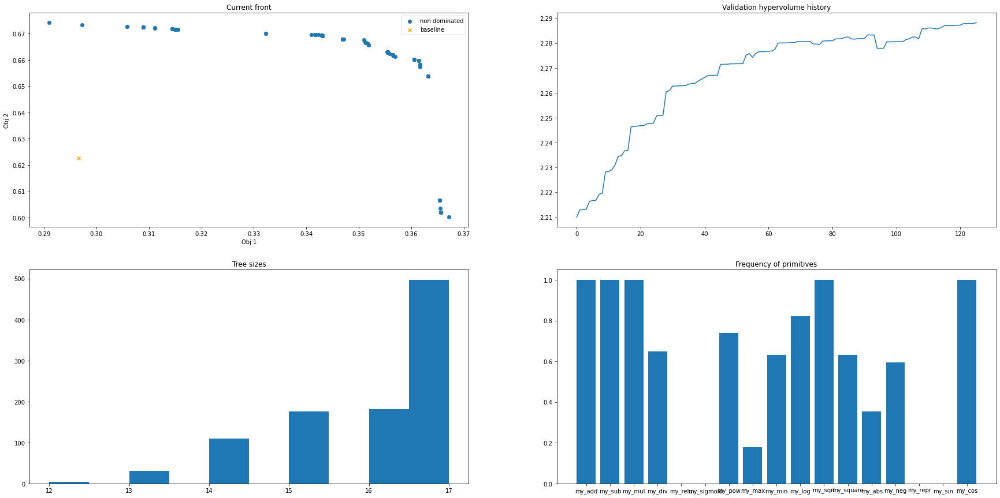

-- Generation 126 --
Training   set hypervolume: 2.315824826377955
Validation set hypervolume: 2.288205272140701


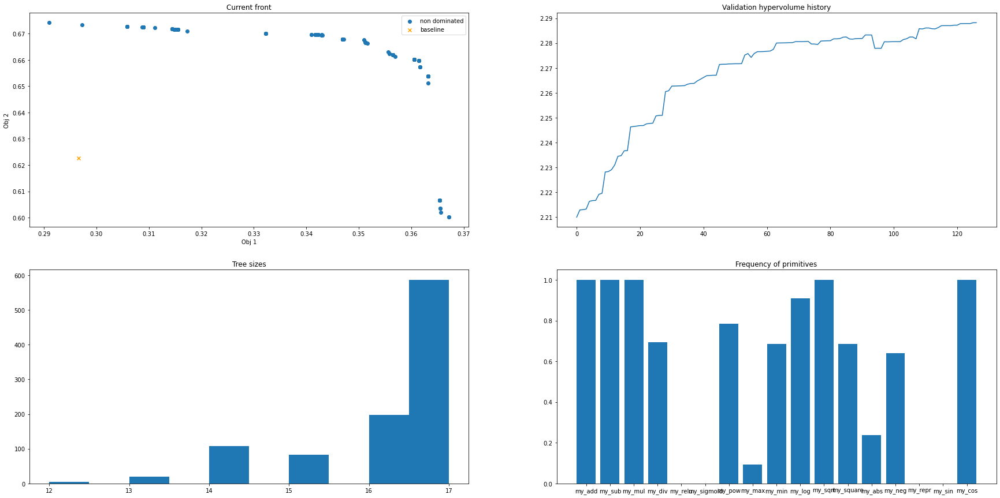

-- Generation 127 --
Training   set hypervolume: 2.2985662700450242
Validation set hypervolume: 2.288201506043863


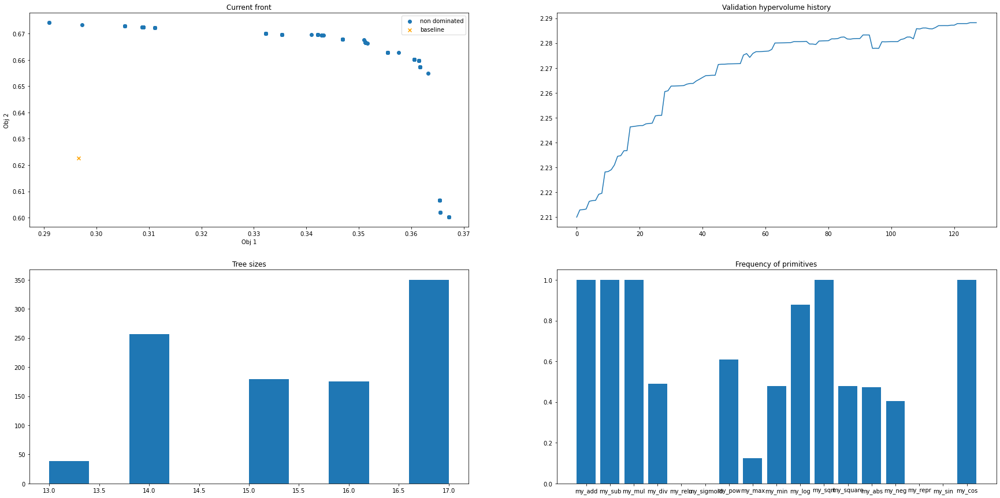

-- Generation 128 --
Training   set hypervolume: 2.288380671610122
Validation set hypervolume: 2.288248735161872


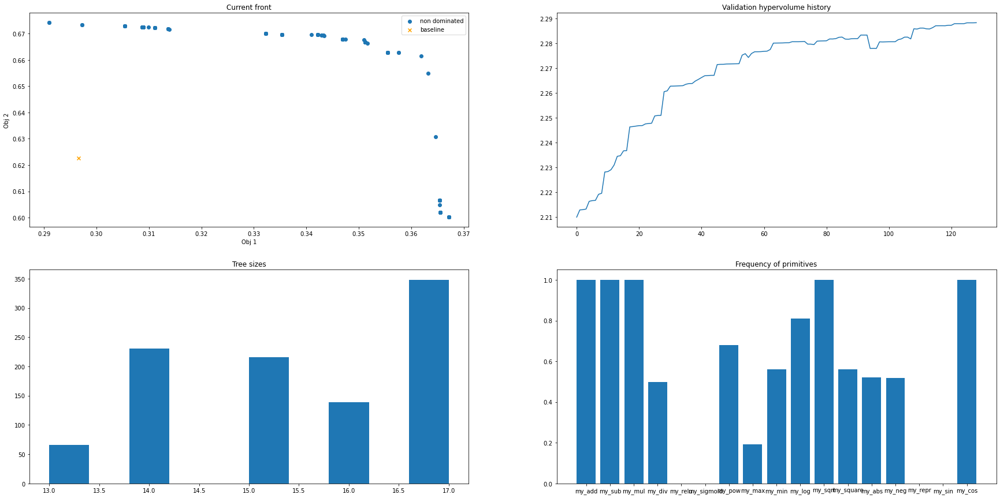

-- Generation 129 --
Training   set hypervolume: 2.3225635684515935
Validation set hypervolume: 2.2879812257646326


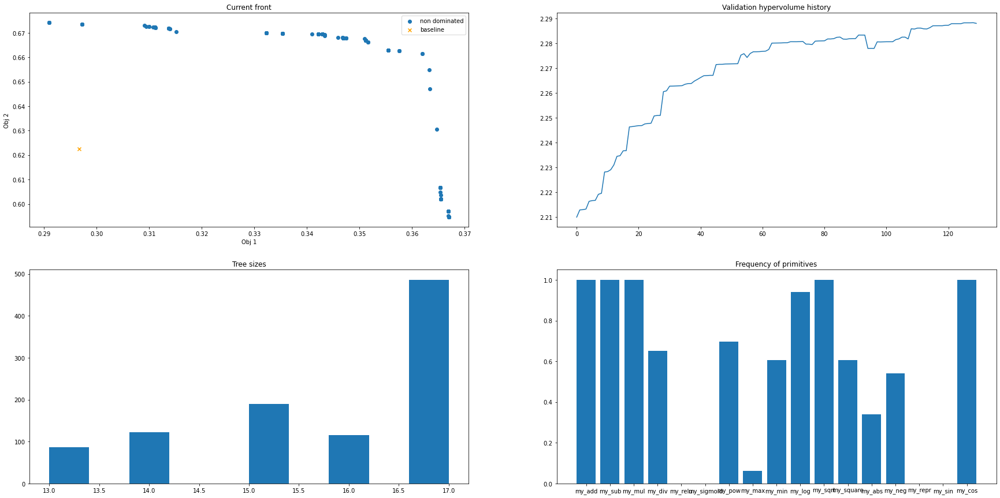

-- Generation 130 --
Training   set hypervolume: 2.323721374959166
Validation set hypervolume: 2.287065061543096


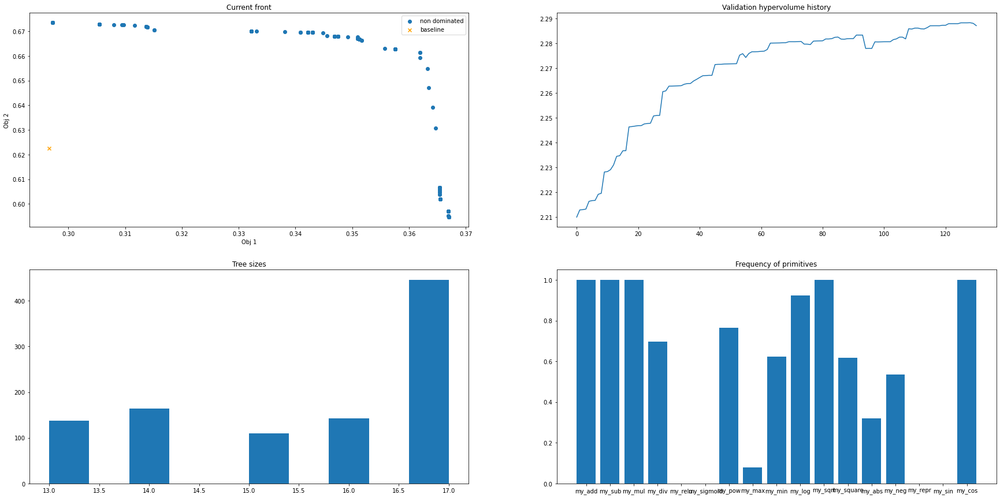

-- Generation 131 --
Training   set hypervolume: 2.3097336215152513
Validation set hypervolume: 2.28646709413464


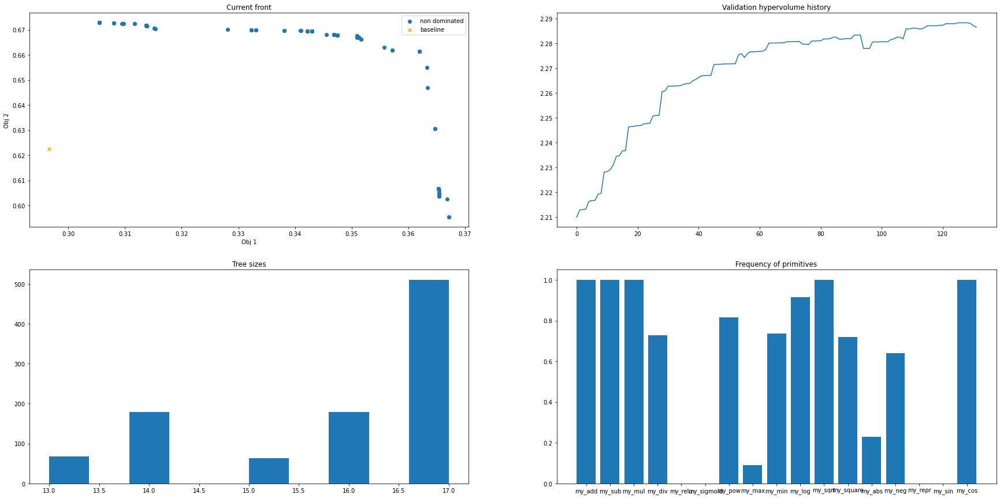

-- Generation 132 --
Training   set hypervolume: 2.326858431615168
Validation set hypervolume: 2.2859616320556935


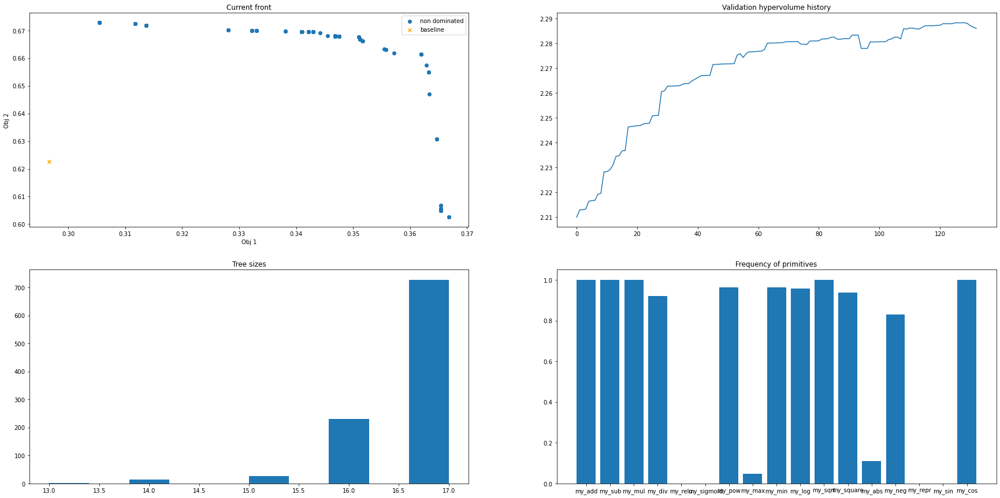

-- Generation 133 --
Training   set hypervolume: 2.286562387586323
Validation set hypervolume: 2.2859595644133535


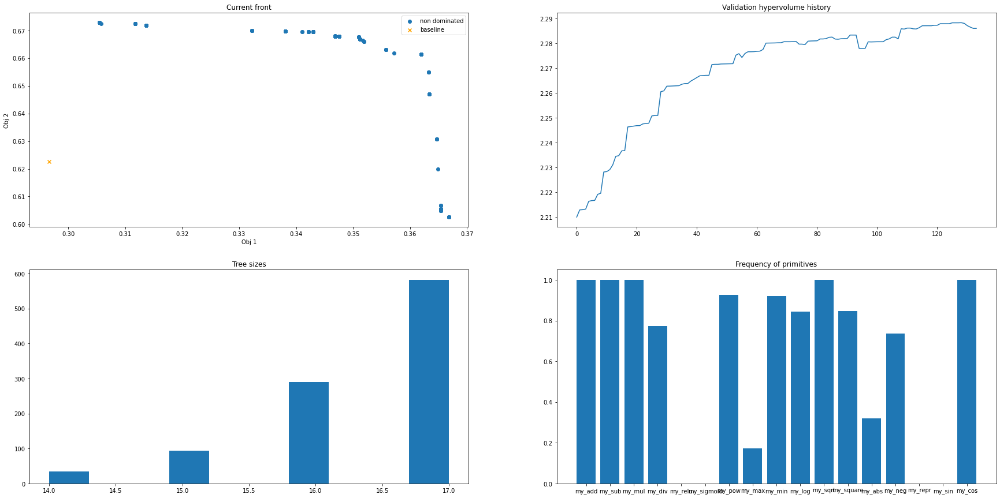

-- Generation 134 --
Training   set hypervolume: 2.3146038241466176
Validation set hypervolume: 2.288114716366045


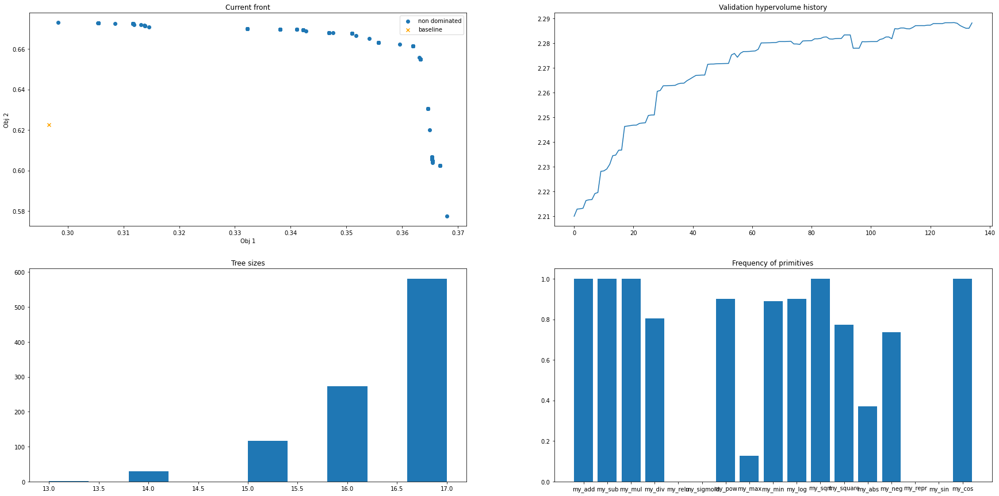

-- Generation 135 --
Training   set hypervolume: 2.293177544189985
Validation set hypervolume: 2.2882660234227274


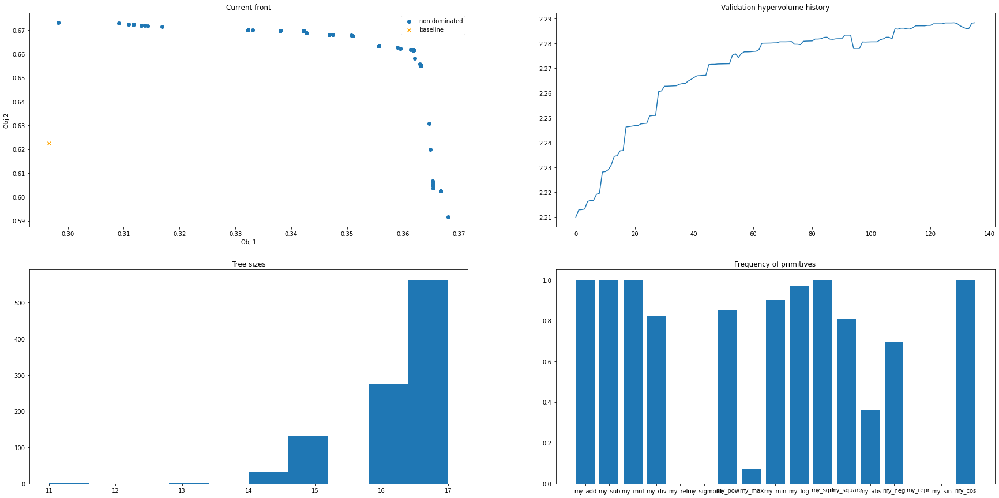

-- Generation 136 --
Training   set hypervolume: 2.2824883814806105
Validation set hypervolume: 2.2870417291831124


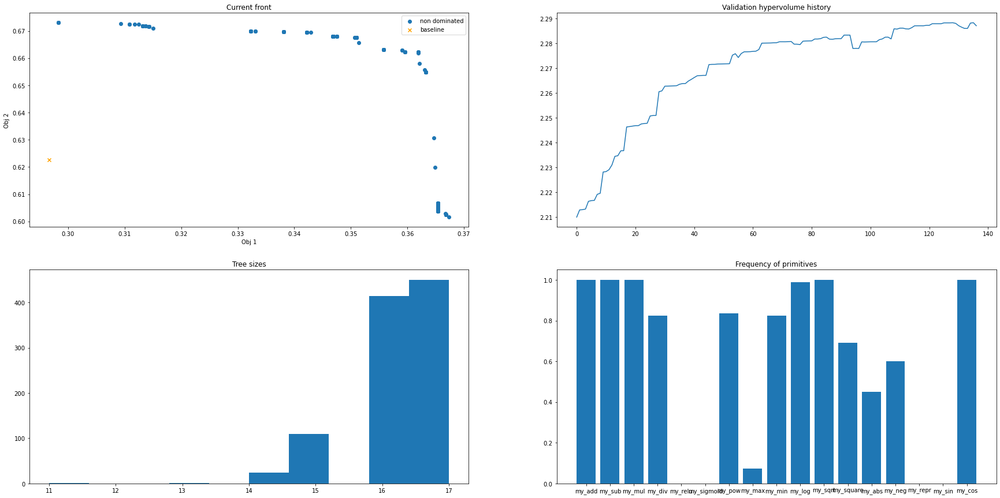

-- Generation 137 --
Training   set hypervolume: 2.2667780321410387
Validation set hypervolume: 2.2885343304846817


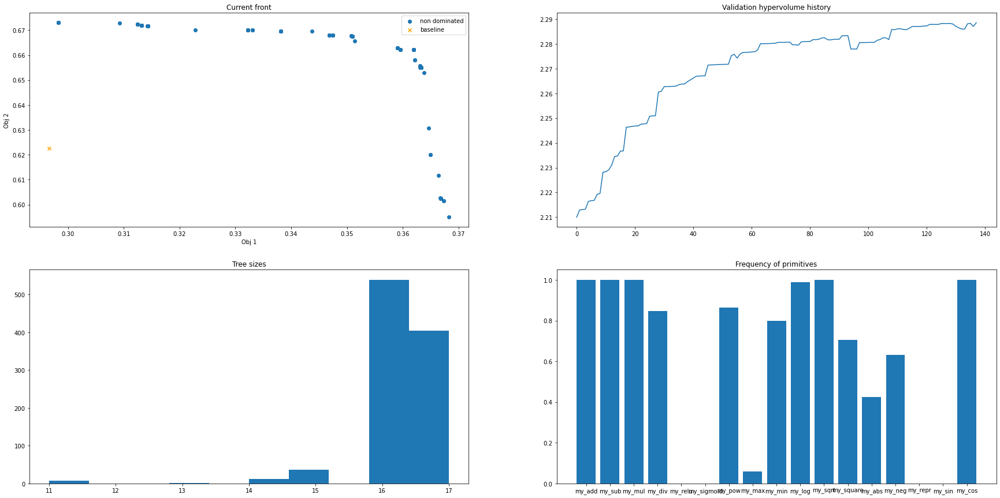

-- Generation 138 --
Training   set hypervolume: 2.2912801645904204
Validation set hypervolume: 2.288303384855358


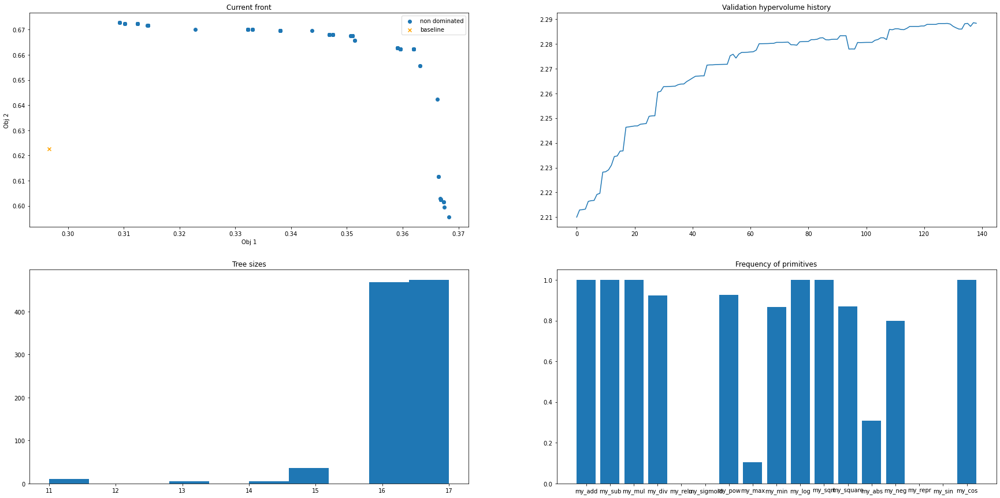

-- Generation 139 --
Training   set hypervolume: 2.3207335509036113
Validation set hypervolume: 2.2883068862218026


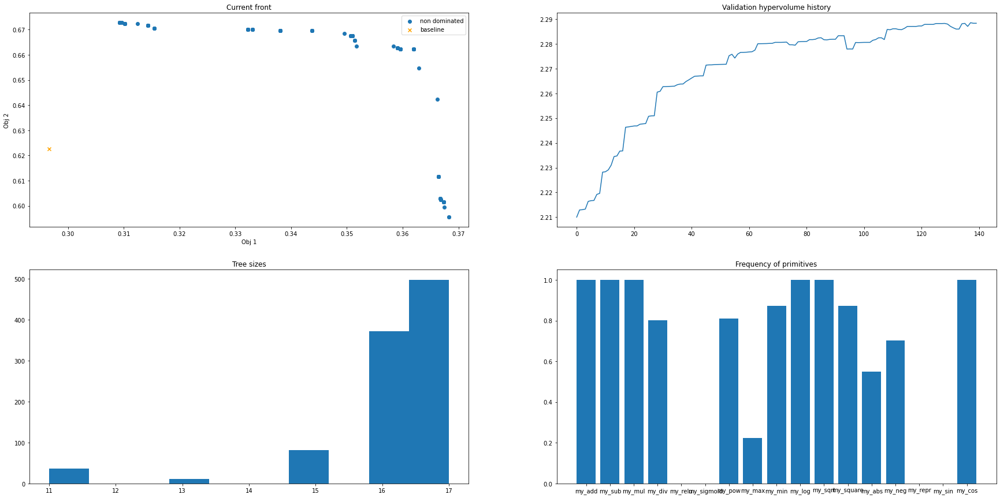

-- Generation 140 --
Training   set hypervolume: 2.2731133600334292
Validation set hypervolume: 2.2889871903138985


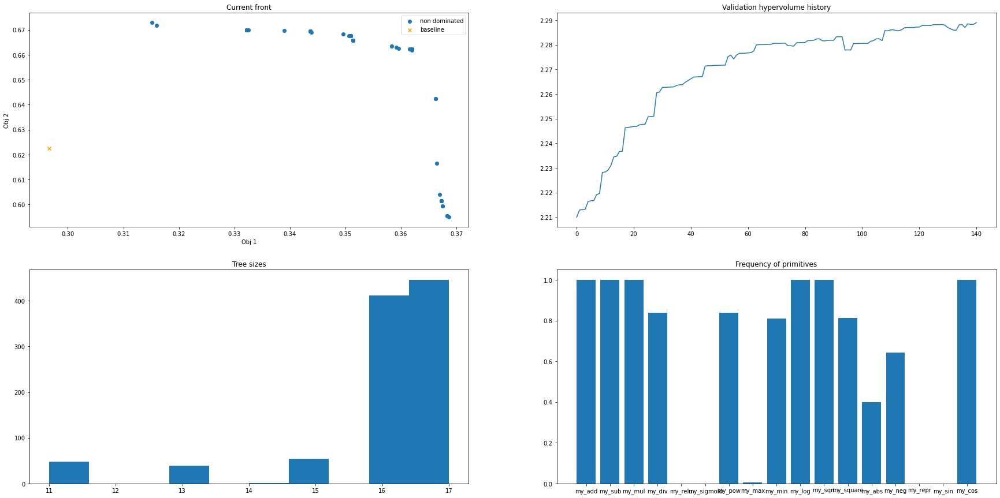

-- Generation 141 --
Training   set hypervolume: 2.356258644778121
Validation set hypervolume: 2.2890261450880818


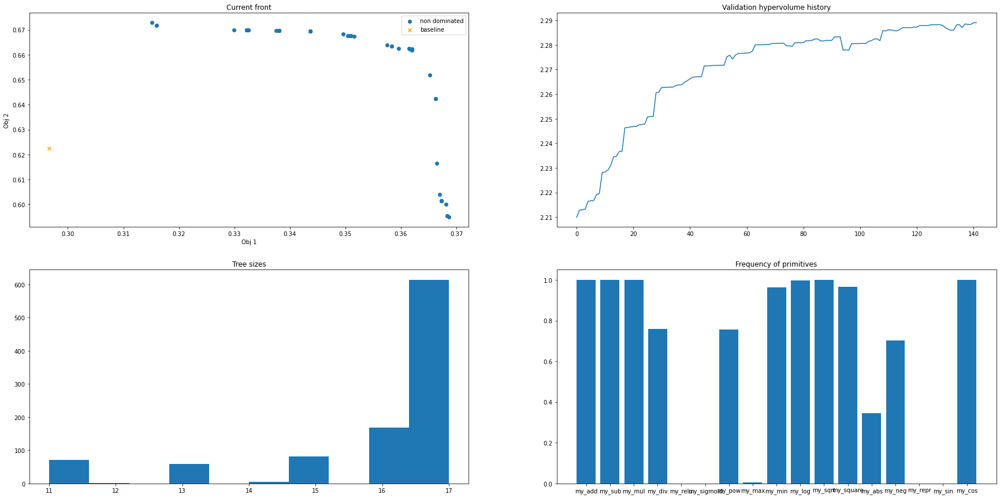

-- Generation 142 --
Training   set hypervolume: 2.2621987253776465
Validation set hypervolume: 2.289293949810372


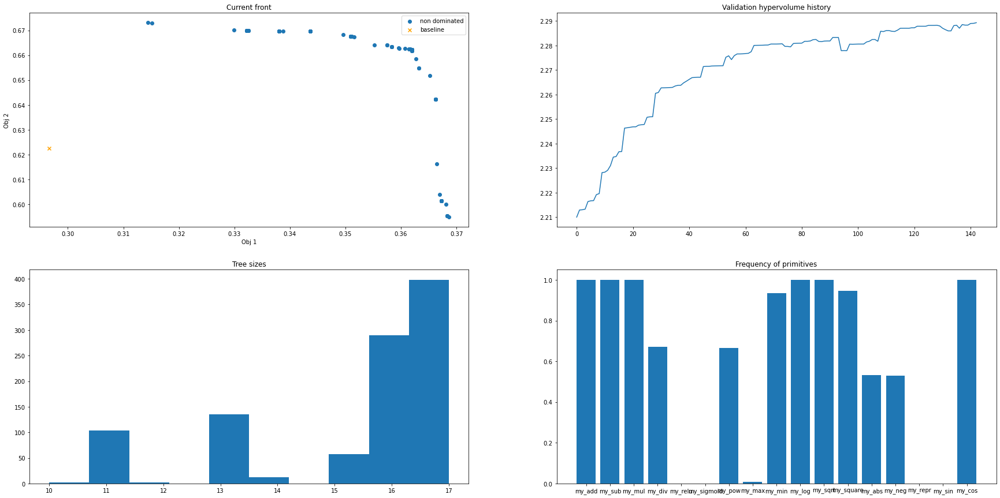

-- Generation 143 --
Training   set hypervolume: 2.304342234074638
Validation set hypervolume: 2.2886439271871355


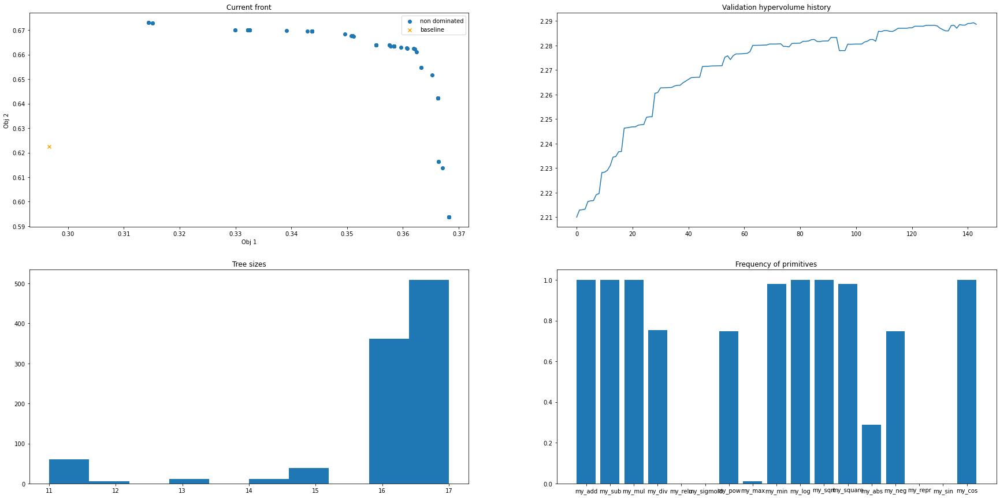

-- Generation 144 --
Training   set hypervolume: 2.2919174416159516
Validation set hypervolume: 2.288639607762282


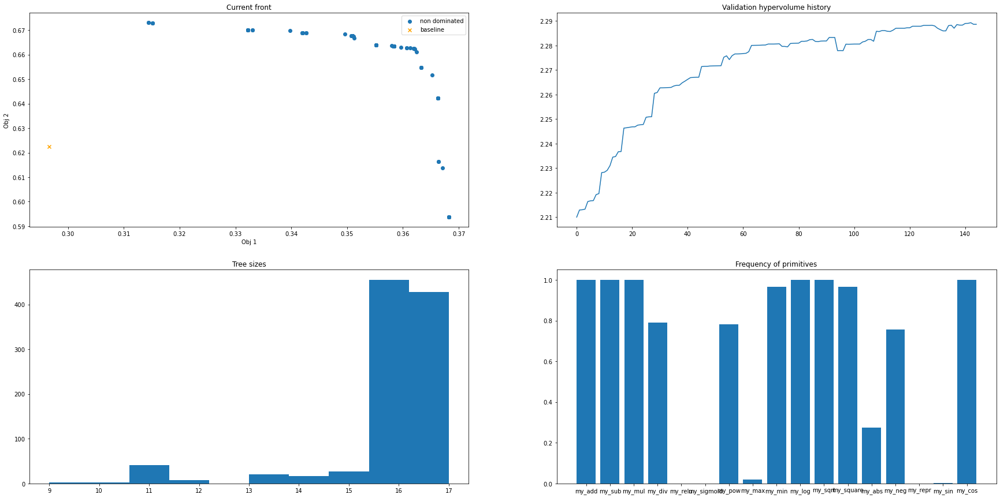

-- Generation 145 --
Training   set hypervolume: 2.3125115938671876
Validation set hypervolume: 2.288684763952865


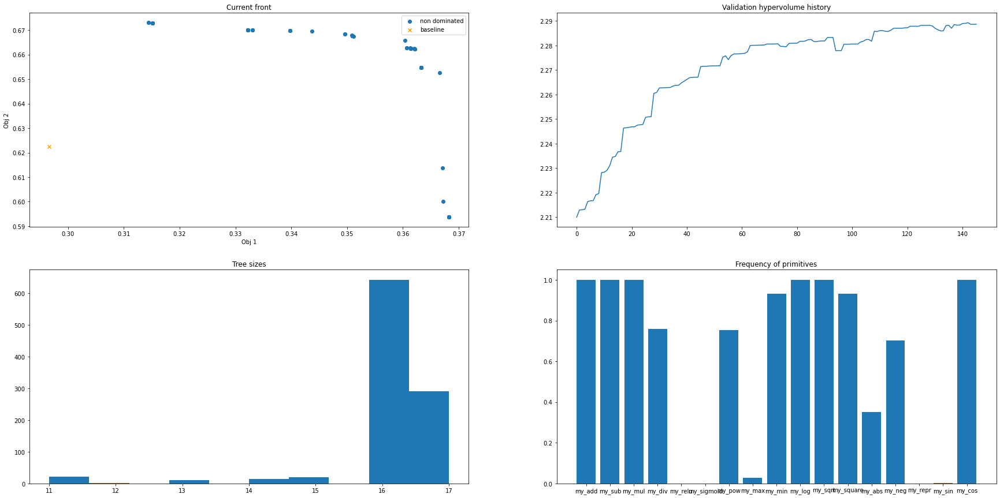

-- Generation 146 --
Training   set hypervolume: 2.31813868541543
Validation set hypervolume: 2.2886966959080612


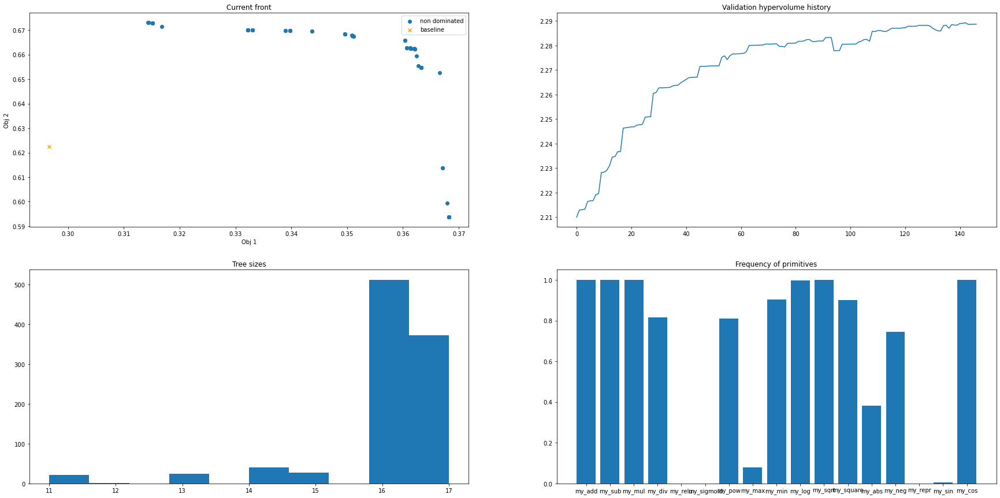

-- Generation 147 --
Training   set hypervolume: 2.26699340946776
Validation set hypervolume: 2.288674537820943


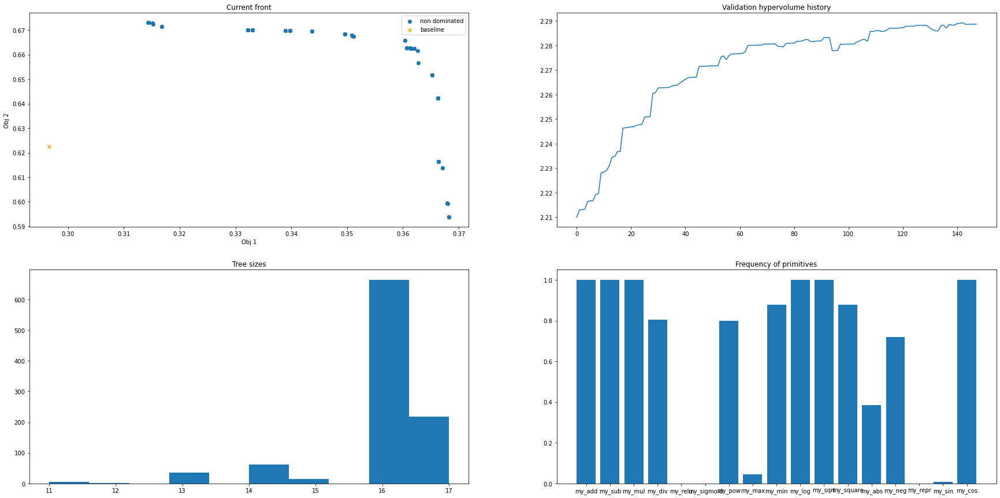

-- Generation 148 --
Training   set hypervolume: 2.2918102839303893
Validation set hypervolume: 2.2886797516296595


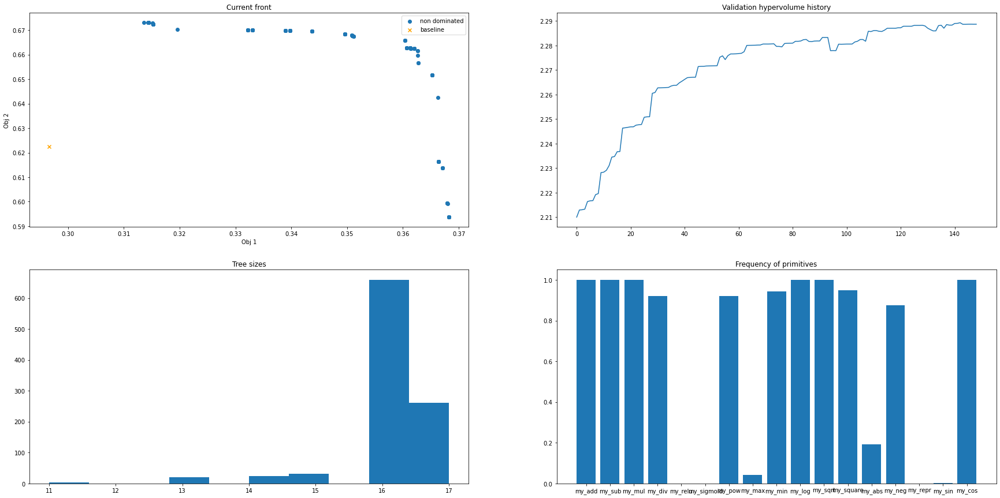

-- Generation 149 --
Training   set hypervolume: 2.32195722887119
Validation set hypervolume: 2.2890628273352913


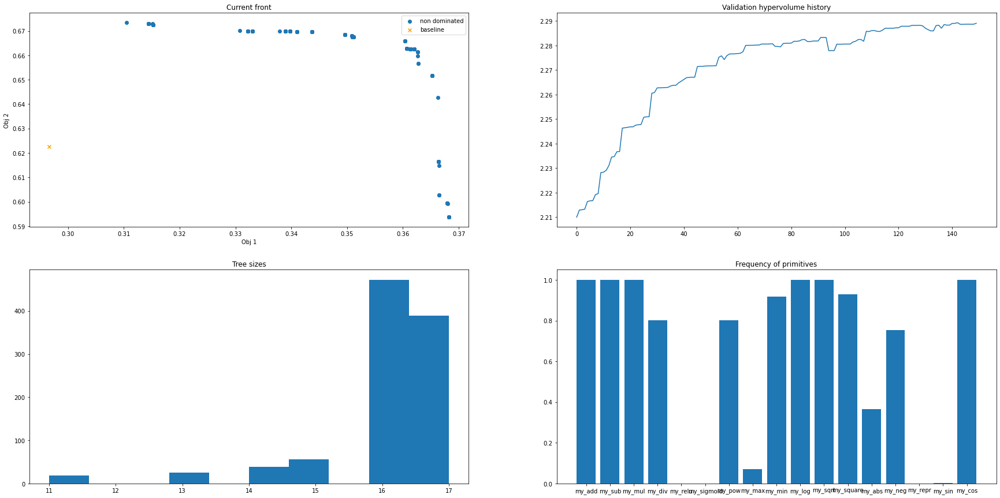

-- Generation 150 --
Training   set hypervolume: 2.2683016427671823
Validation set hypervolume: 2.2890893972012405


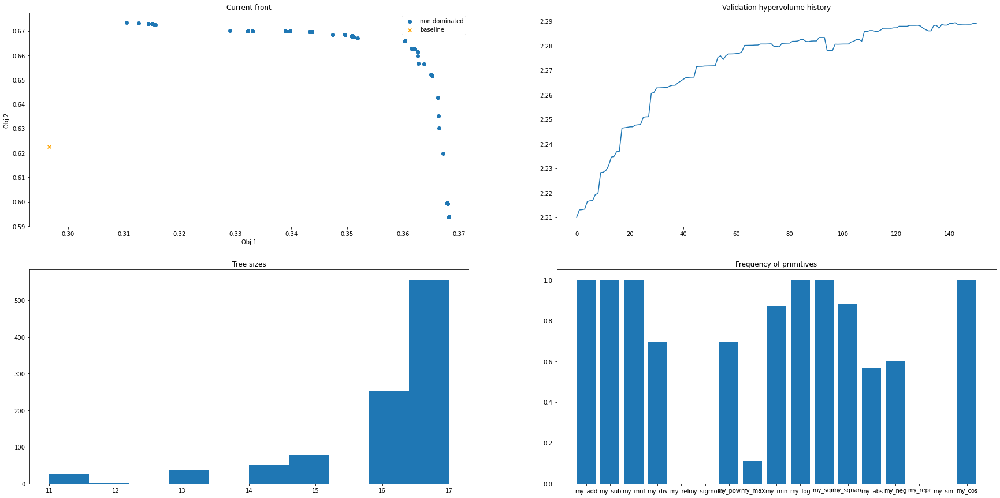

-- Generation 151 --
Training   set hypervolume: 2.3150978376751272
Validation set hypervolume: 2.2900942794311567


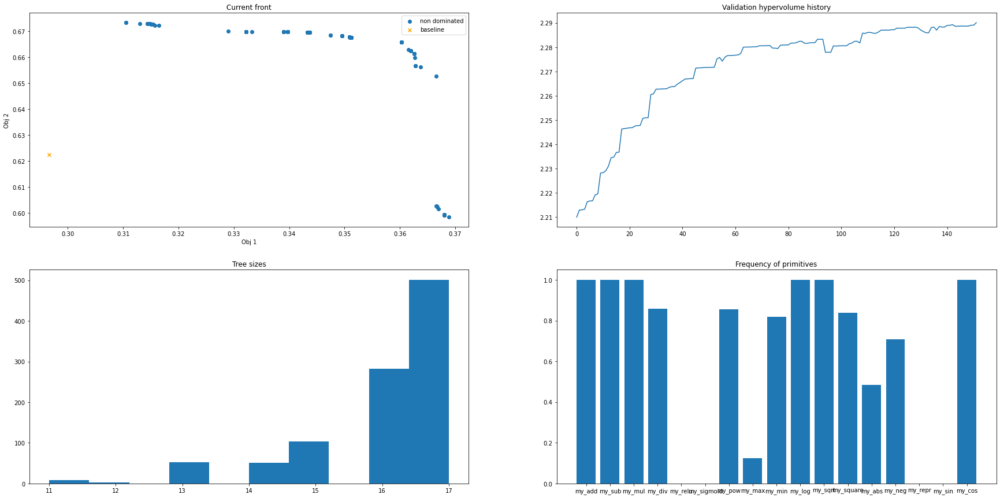

-- Generation 152 --
Training   set hypervolume: 2.3035259447972107
Validation set hypervolume: 2.290103263202394


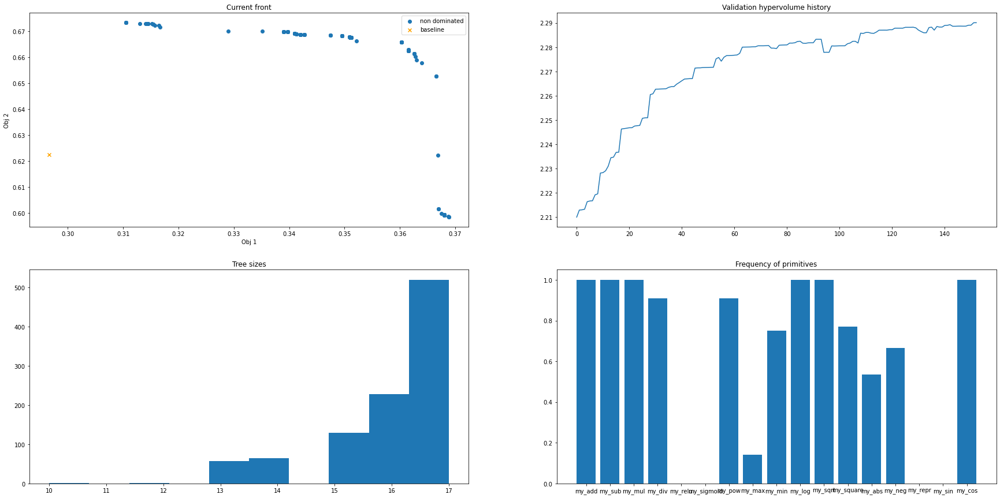

-- Generation 153 --
Training   set hypervolume: 2.2968658363170453
Validation set hypervolume: 2.290896973333526


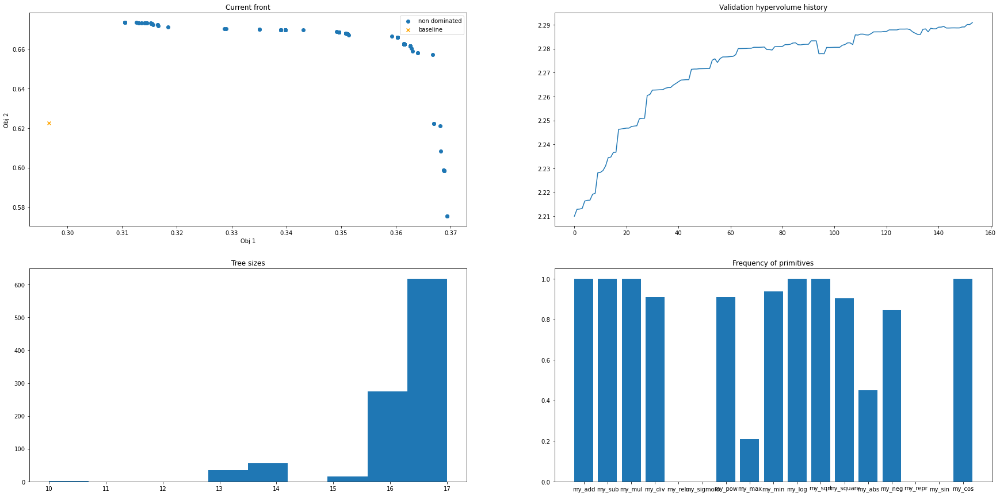

-- Generation 154 --
Training   set hypervolume: 2.2988092919069034
Validation set hypervolume: 2.290896799836772


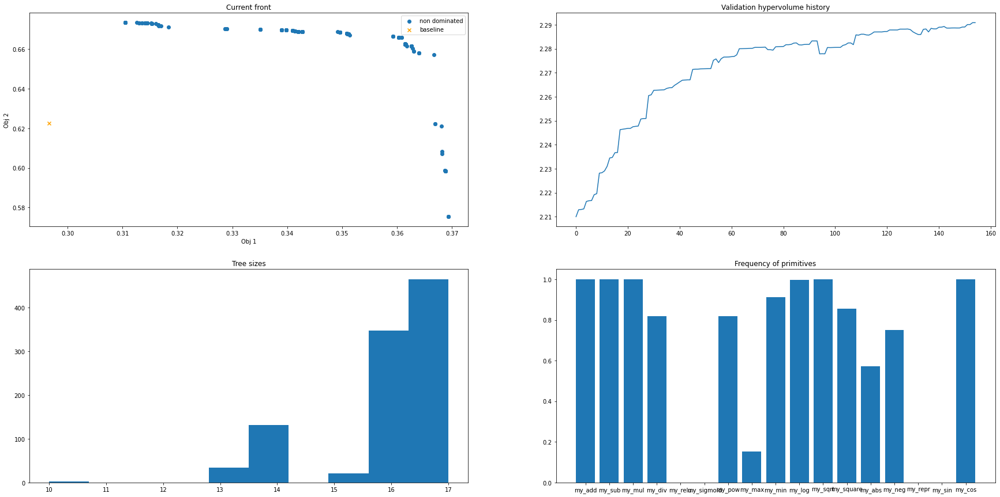

-- Generation 155 --
Training   set hypervolume: 2.31403359984553
Validation set hypervolume: 2.290881123404016


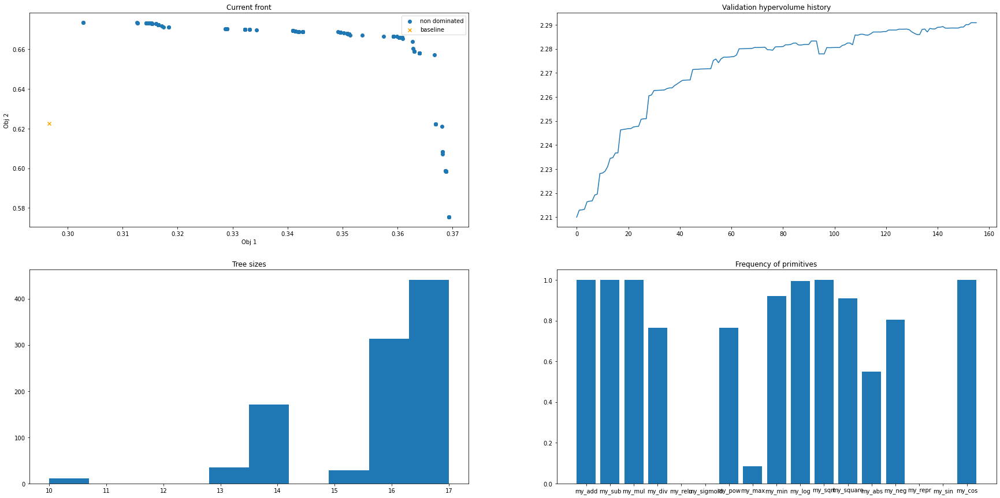

-- Generation 156 --
Training   set hypervolume: 2.299527426976712
Validation set hypervolume: 2.290877541273713


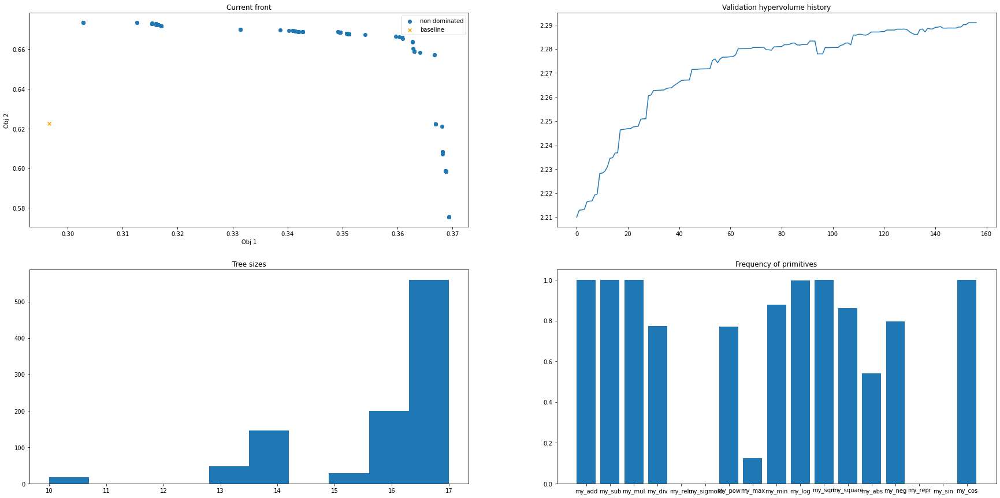

-- Generation 157 --
Training   set hypervolume: 2.293851581660786
Validation set hypervolume: 2.2902741055985847


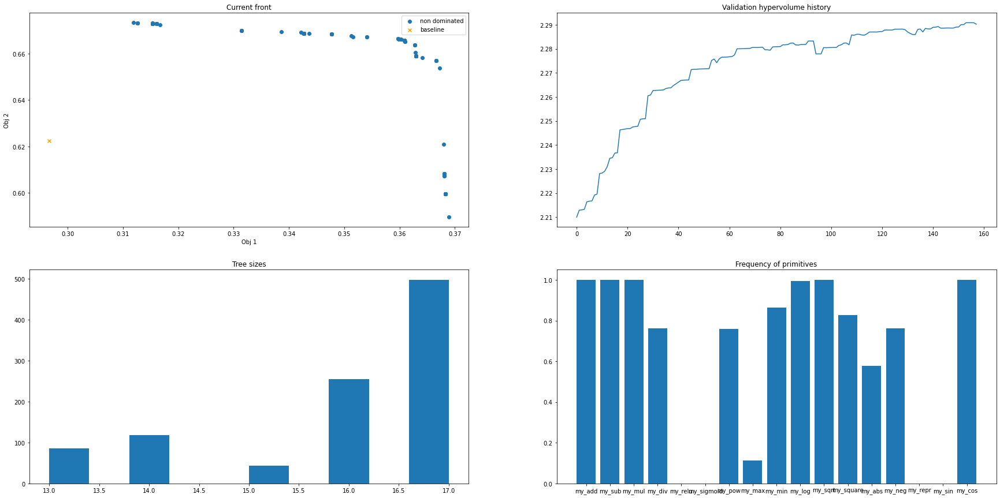

-- Generation 158 --
Training   set hypervolume: 2.336166872948743
Validation set hypervolume: 2.290471277145886


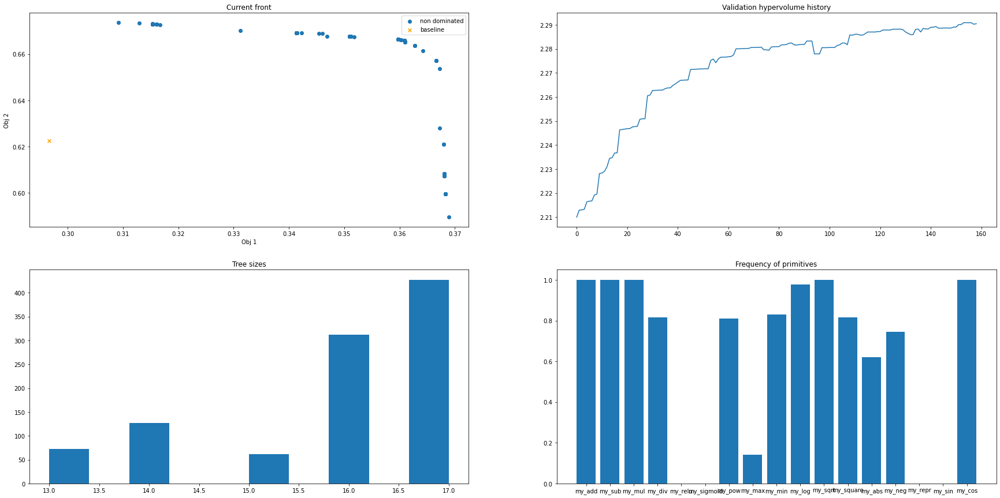

-- Generation 159 --
Training   set hypervolume: 2.318831887199027
Validation set hypervolume: 2.289435117184476


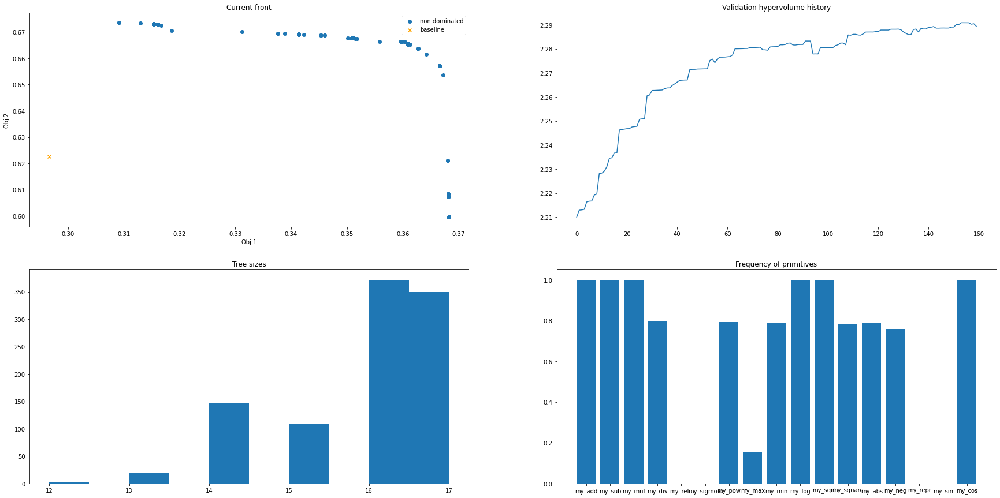

-- Generation 160 --
Training   set hypervolume: 2.3176866031483208
Validation set hypervolume: 2.2894404644317037


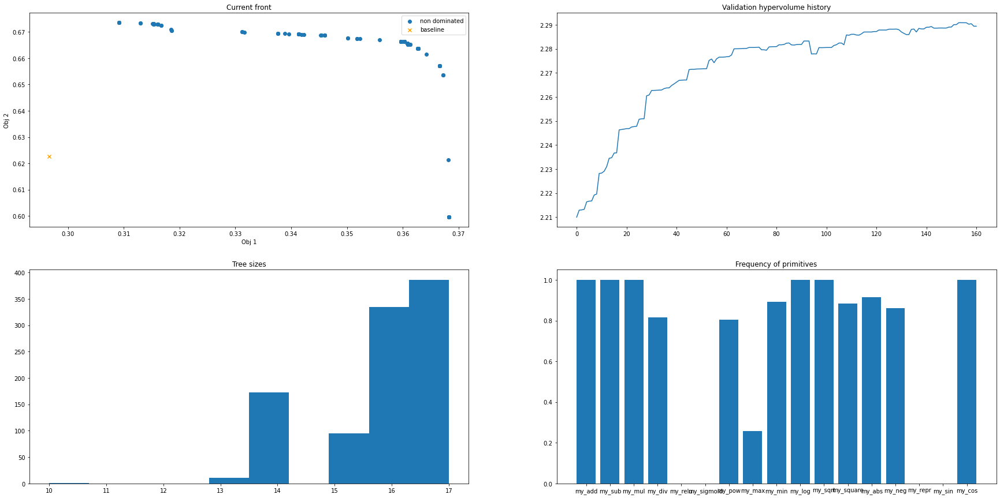

-- Generation 161 --
Training   set hypervolume: 2.278598300930656
Validation set hypervolume: 2.289438459566284


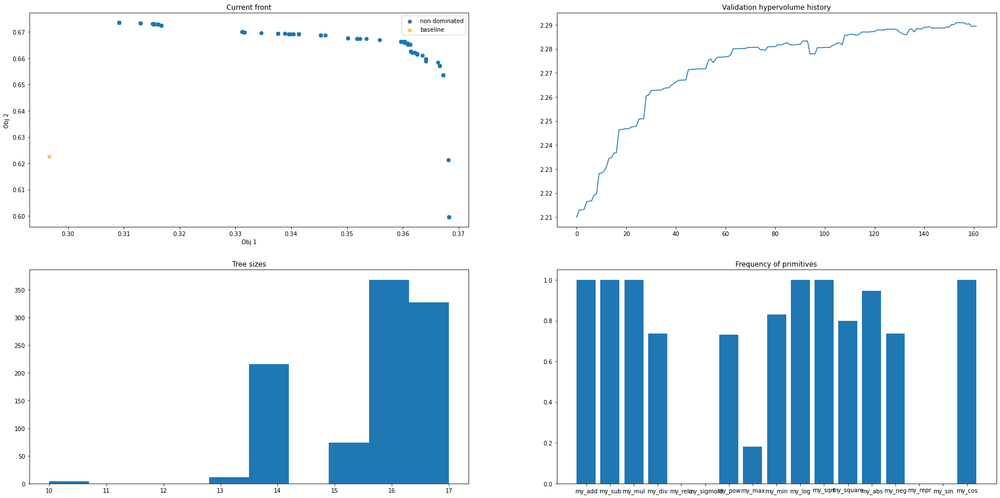

-- Generation 162 --
Training   set hypervolume: 2.2634384292616114
Validation set hypervolume: 2.2892044356391783


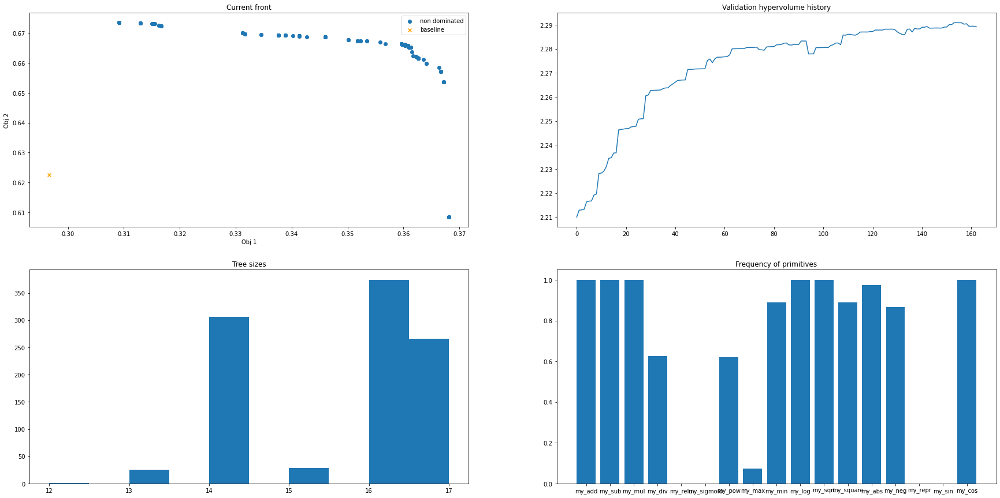

-- Generation 163 --
Training   set hypervolume: 2.2849992078499217
Validation set hypervolume: 2.2892082266358313


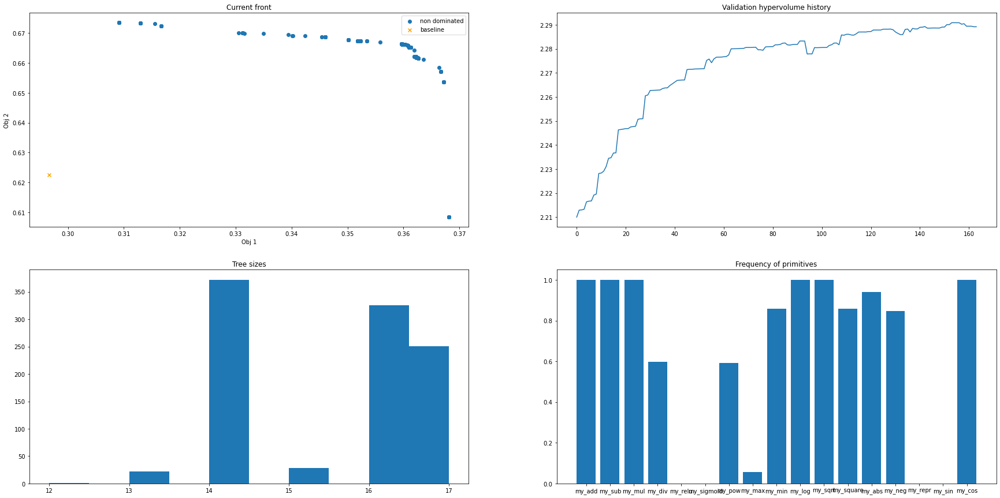

-- Generation 164 --
Training   set hypervolume: 2.3100886756135917
Validation set hypervolume: 2.289211975827195


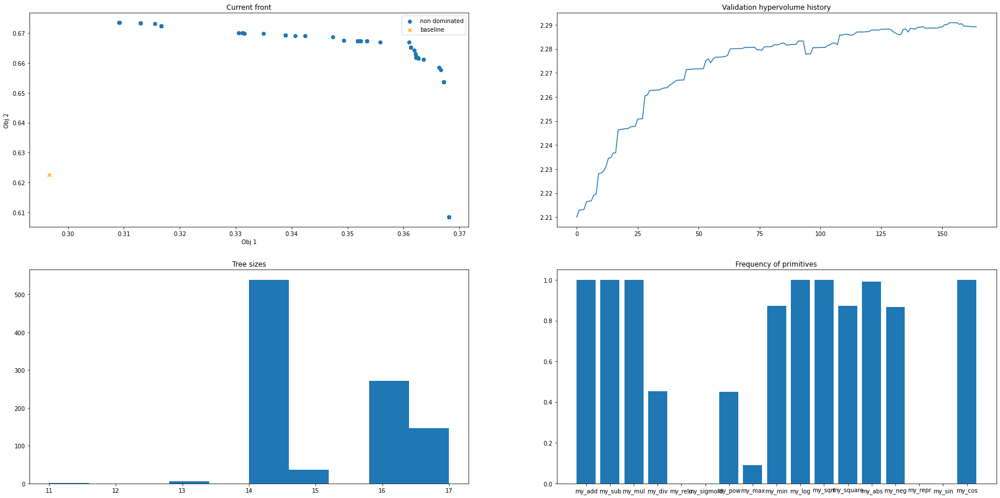

-- Generation 165 --
Training   set hypervolume: 2.3413497546108504
Validation set hypervolume: 2.28926290653394


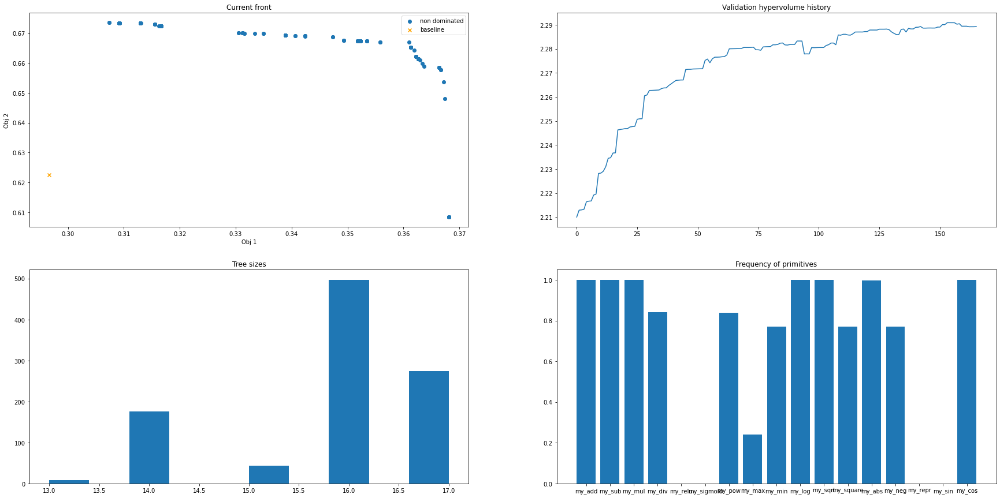

-- Generation 166 --
Training   set hypervolume: 2.3184382816974867
Validation set hypervolume: 2.288328470305185


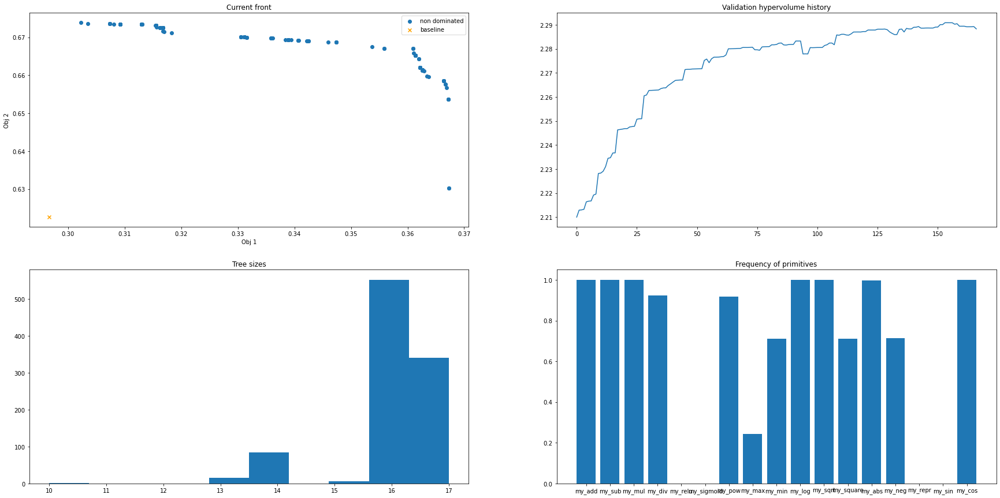

-- Generation 167 --
Training   set hypervolume: 2.310150083515434
Validation set hypervolume: 2.2919448000239084


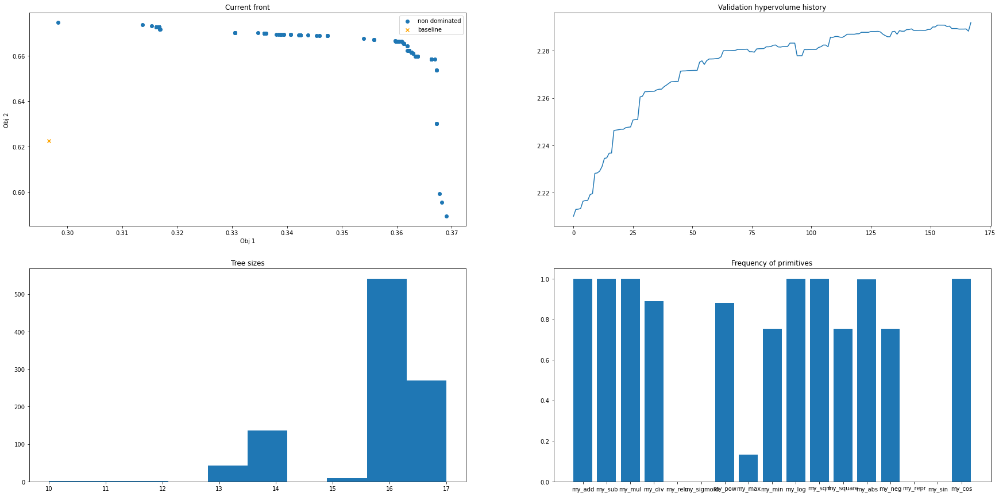

-- Generation 168 --
Training   set hypervolume: 2.31361258732702
Validation set hypervolume: 2.291940783772912


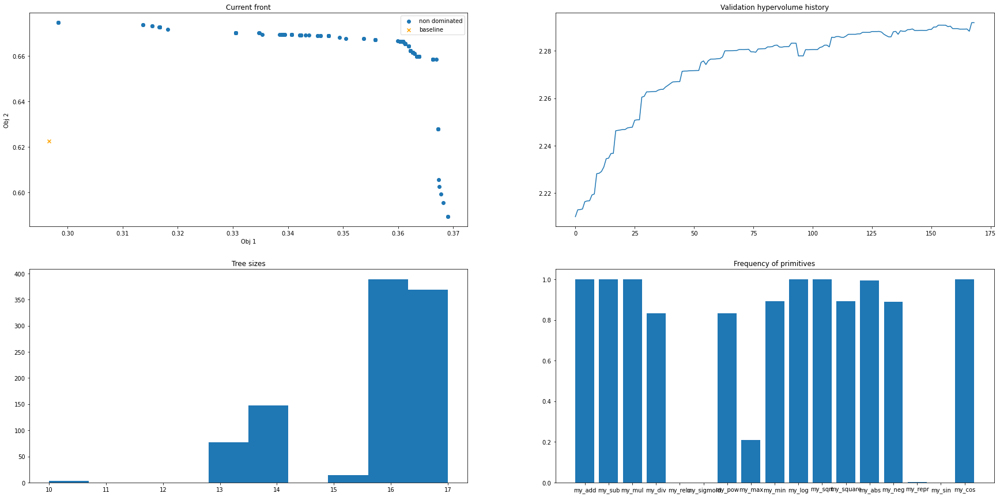

-- Generation 169 --
Training   set hypervolume: 2.34107127886895
Validation set hypervolume: 2.291930598005537


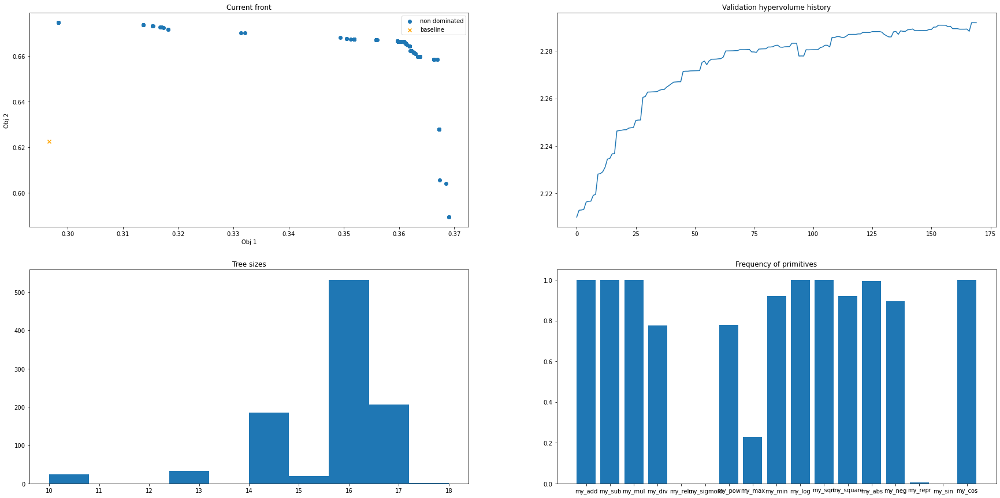

-- Generation 170 --
Training   set hypervolume: 2.3266204201753076
Validation set hypervolume: 2.292661269561213


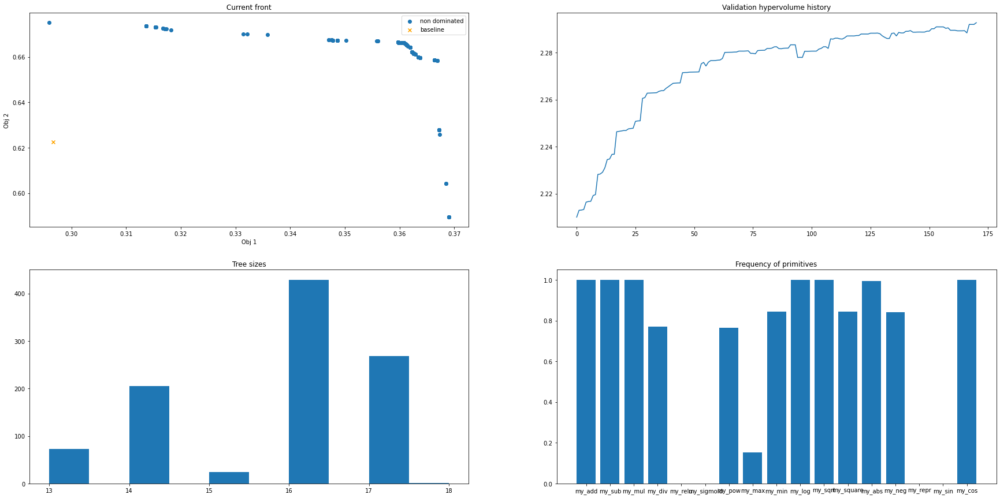

-- Generation 171 --
Training   set hypervolume: 2.2793921503034698
Validation set hypervolume: 2.2926672093669467


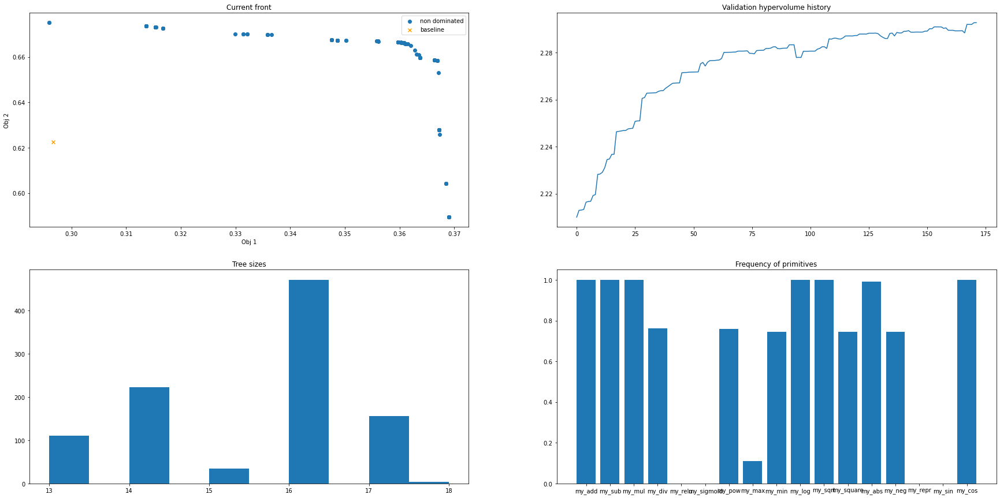

-- Generation 172 --
Training   set hypervolume: 2.290188783630235
Validation set hypervolume: 2.2926681666347677


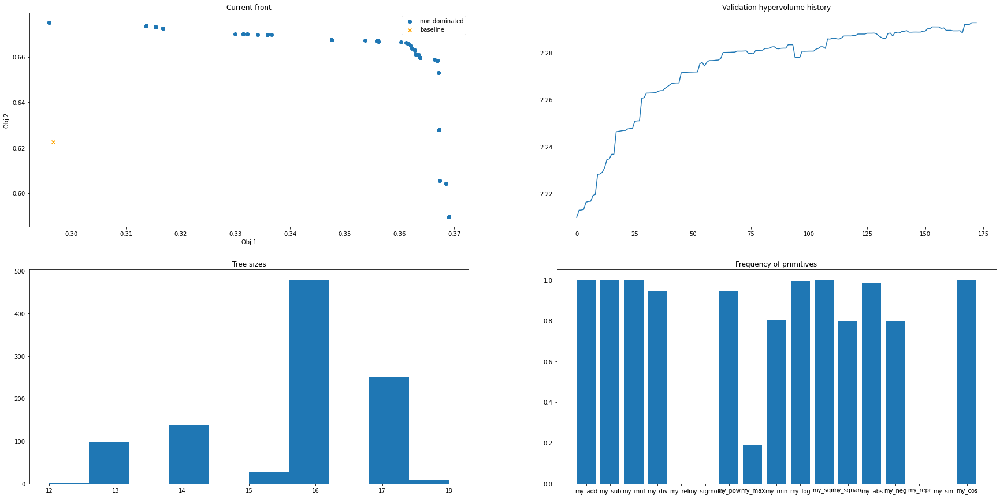

-- Generation 173 --
Training   set hypervolume: 2.274016646921929
Validation set hypervolume: 2.2935398169618213


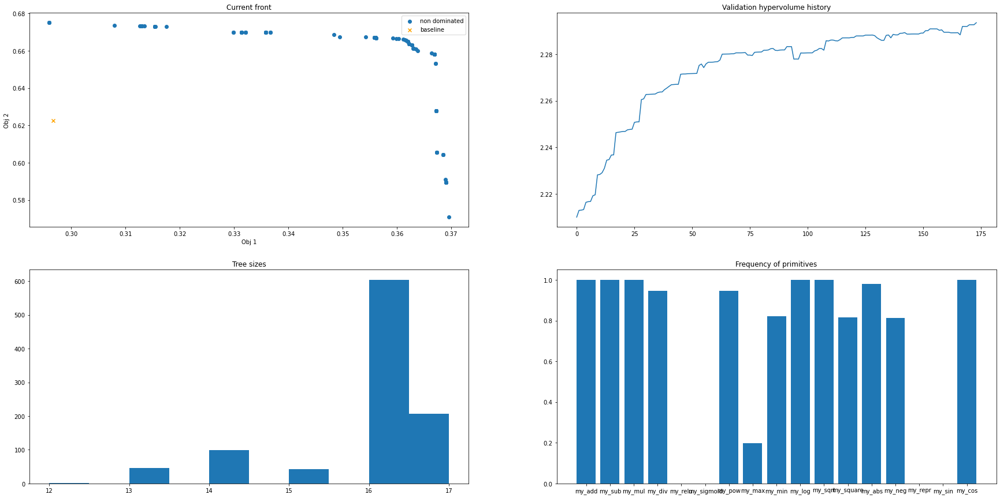

-- Generation 174 --
Training   set hypervolume: 2.3546174230894596
Validation set hypervolume: 2.2929118111635205


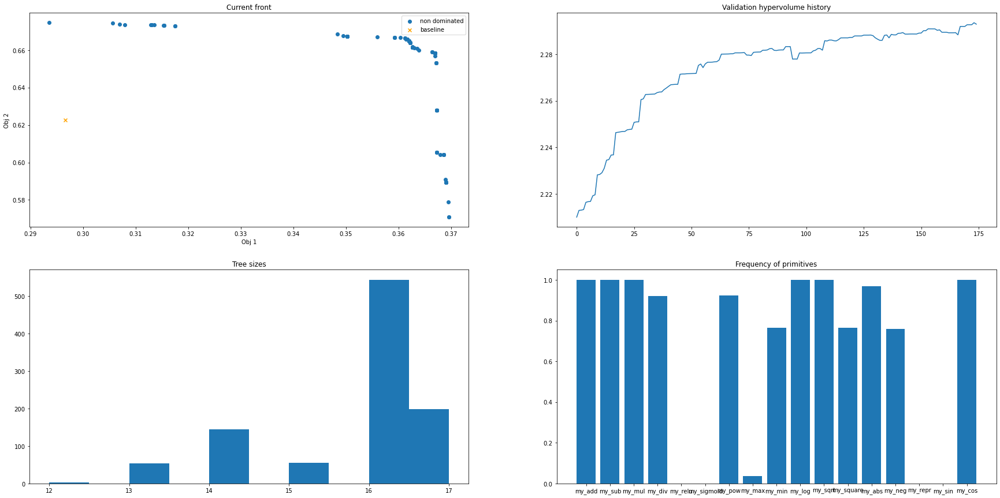

-- Generation 175 --
Training   set hypervolume: 2.3311960806146654
Validation set hypervolume: 2.2929086811240595


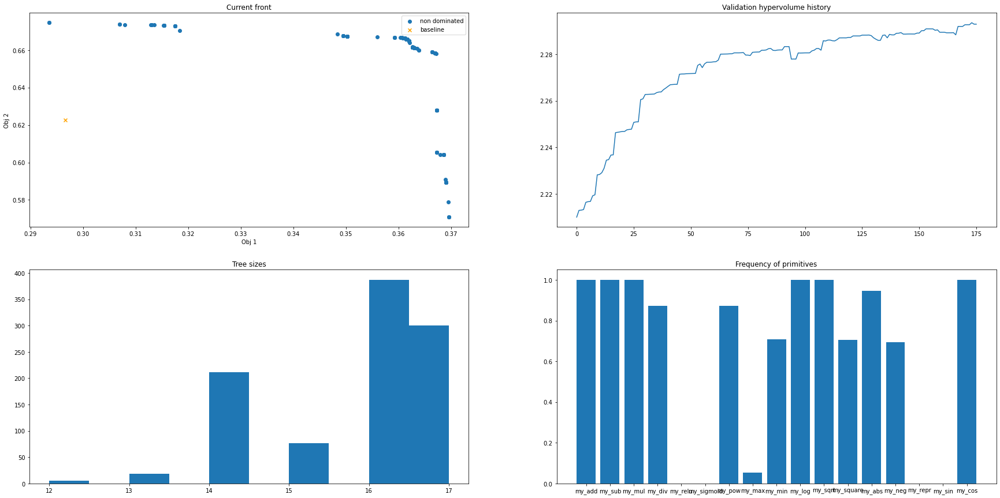

-- Generation 176 --
Training   set hypervolume: 2.3043789553606118
Validation set hypervolume: 2.29291188540938


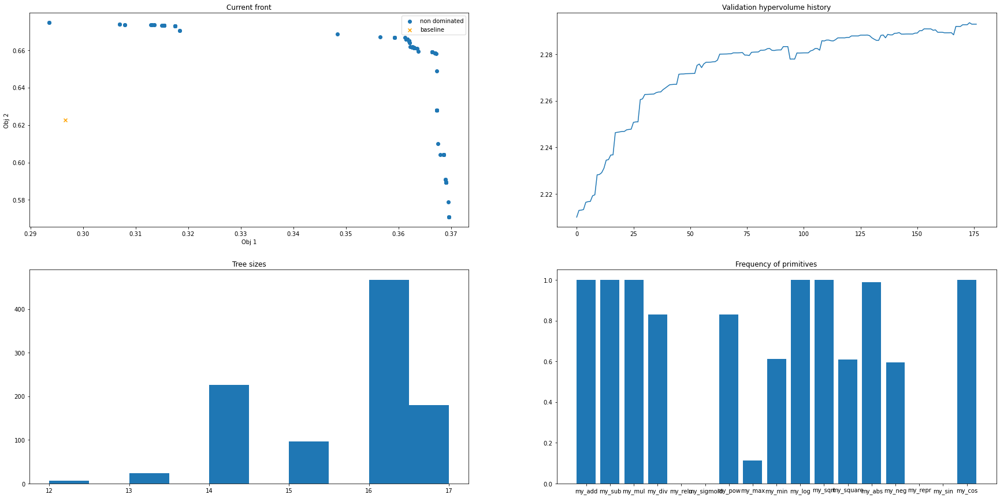

-- Generation 177 --
Training   set hypervolume: 2.2998985733236803
Validation set hypervolume: 2.29291274427665


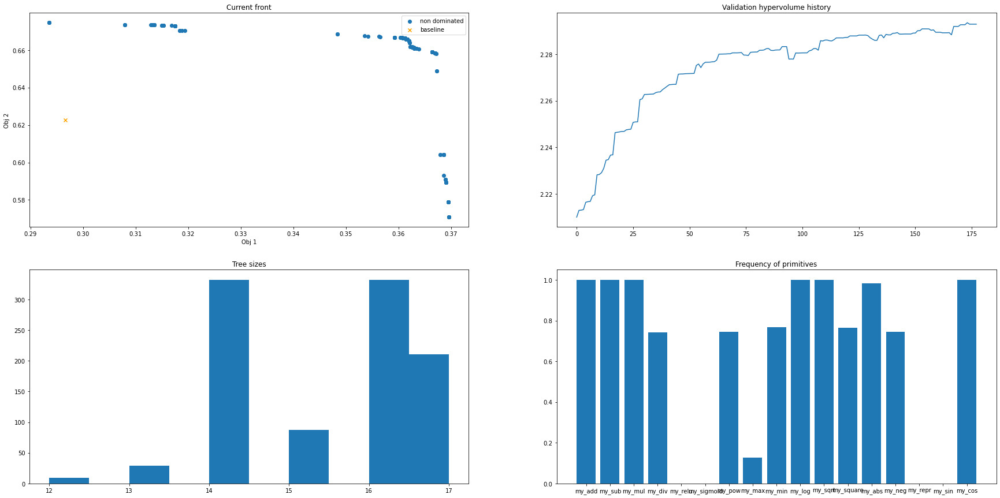

-- Generation 178 --
Training   set hypervolume: 2.298855824793325
Validation set hypervolume: 2.2942501550508467


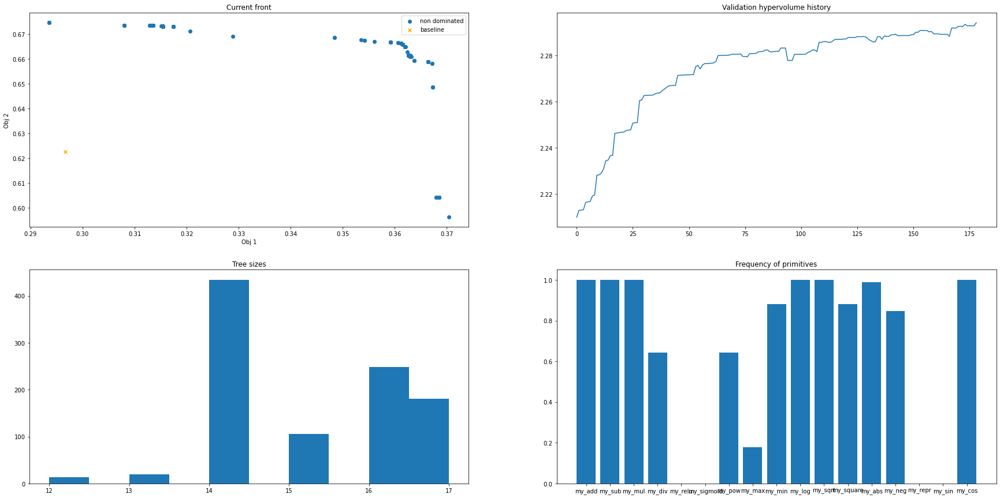

-- Generation 179 --
Training   set hypervolume: 2.3013434522527954
Validation set hypervolume: 2.2942522589617513


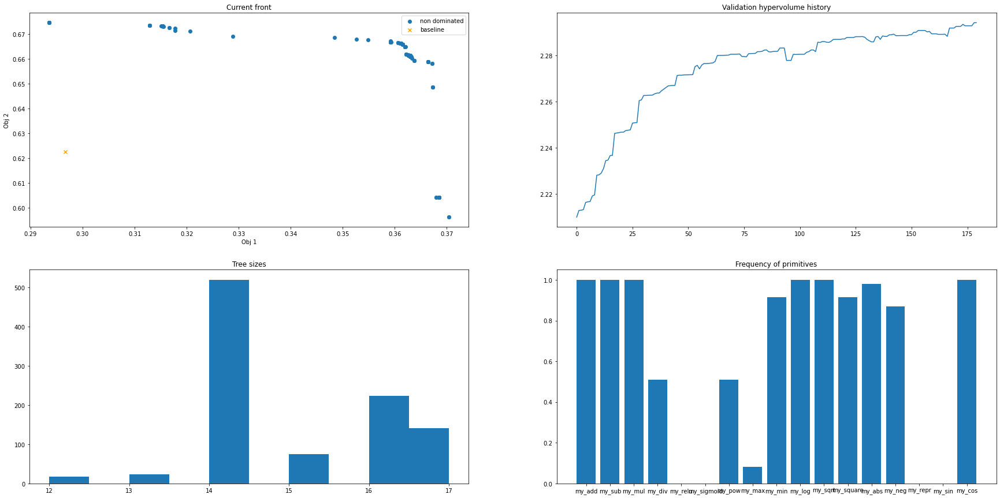

-- Generation 180 --
Training   set hypervolume: 2.2968823957645794
Validation set hypervolume: 2.294254127299988


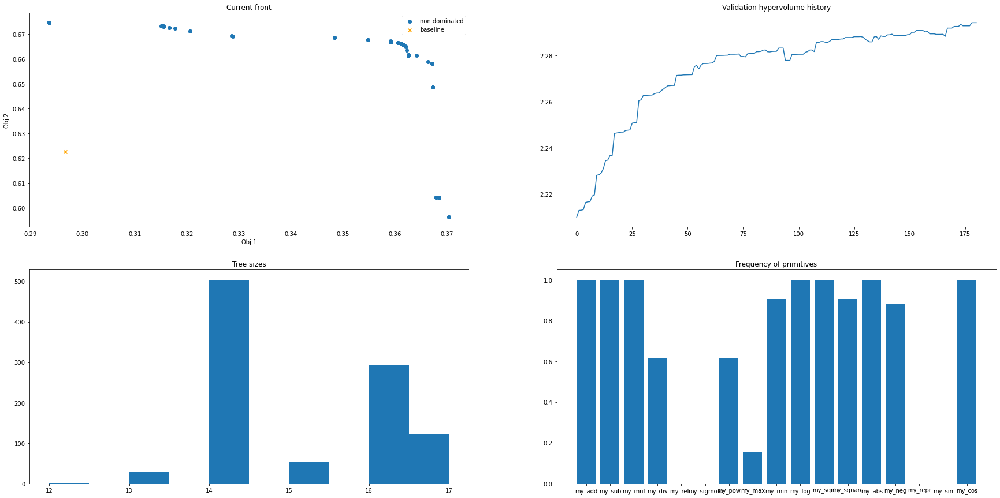

-- Generation 181 --
Training   set hypervolume: 2.337424511404517
Validation set hypervolume: 2.2942610426795493


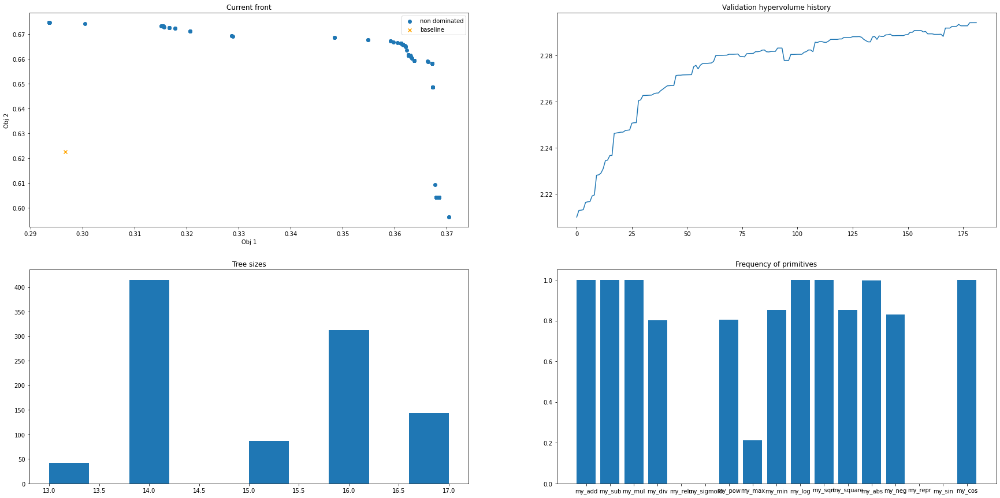

-- Generation 182 --
Training   set hypervolume: 2.3201883874752705
Validation set hypervolume: 2.294310707196267


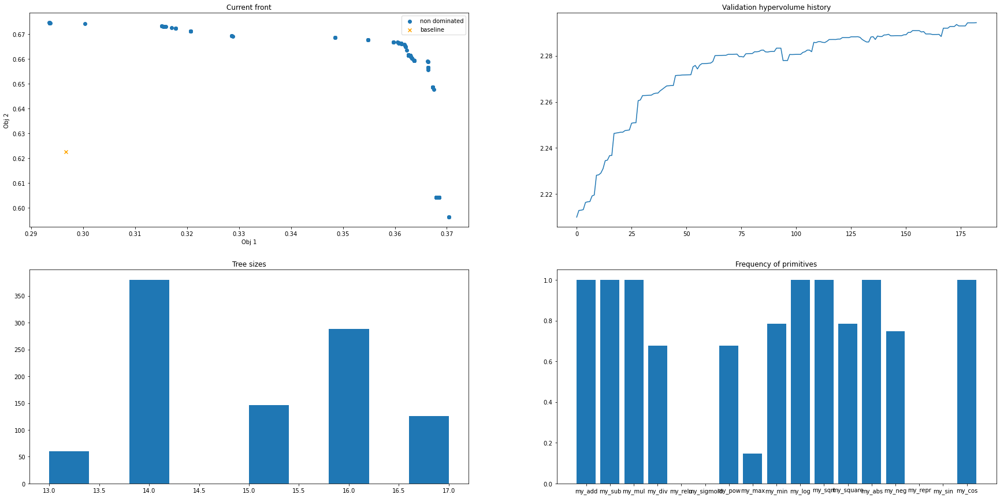

-- Generation 183 --
Training   set hypervolume: 2.3270901030173645
Validation set hypervolume: 2.2943158097629013


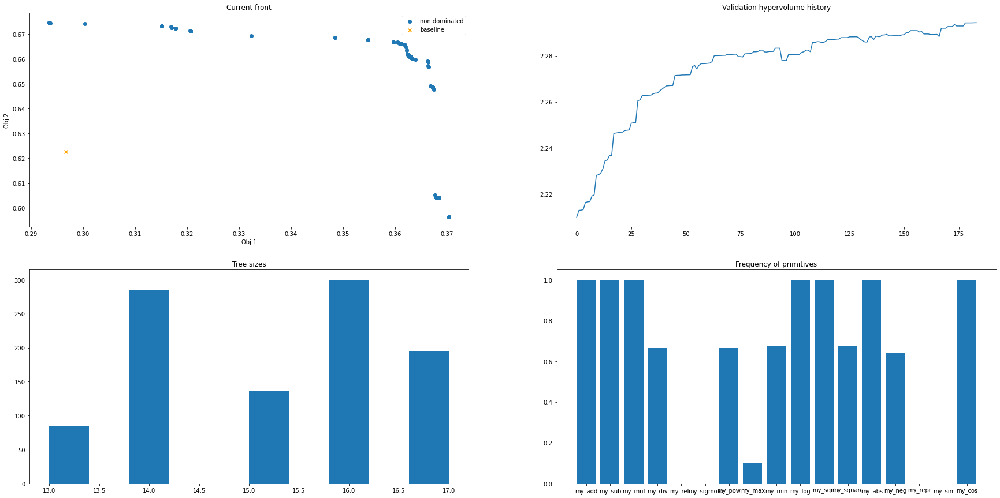

-- Generation 184 --
Training   set hypervolume: 2.3351577071645053
Validation set hypervolume: 2.294306538103349


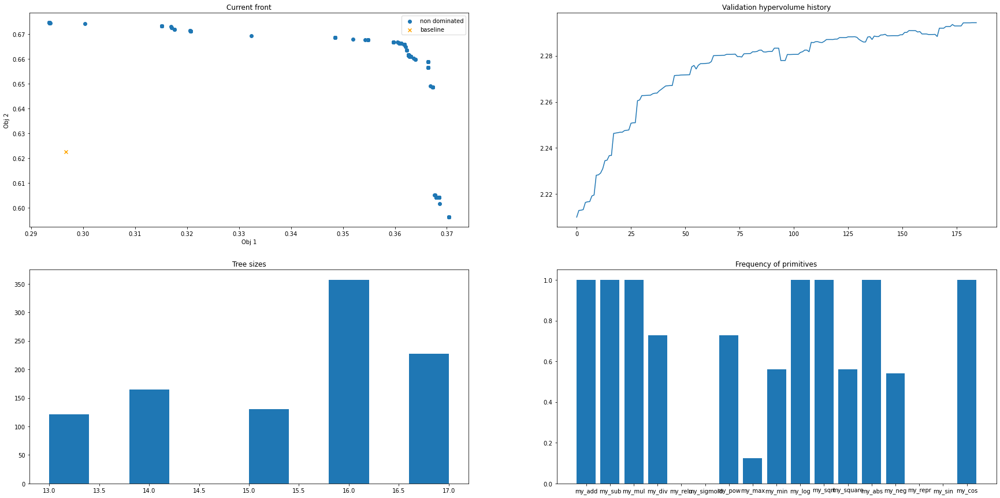

-- Generation 185 --
Training   set hypervolume: 2.2990319543911952
Validation set hypervolume: 2.2943091860379043


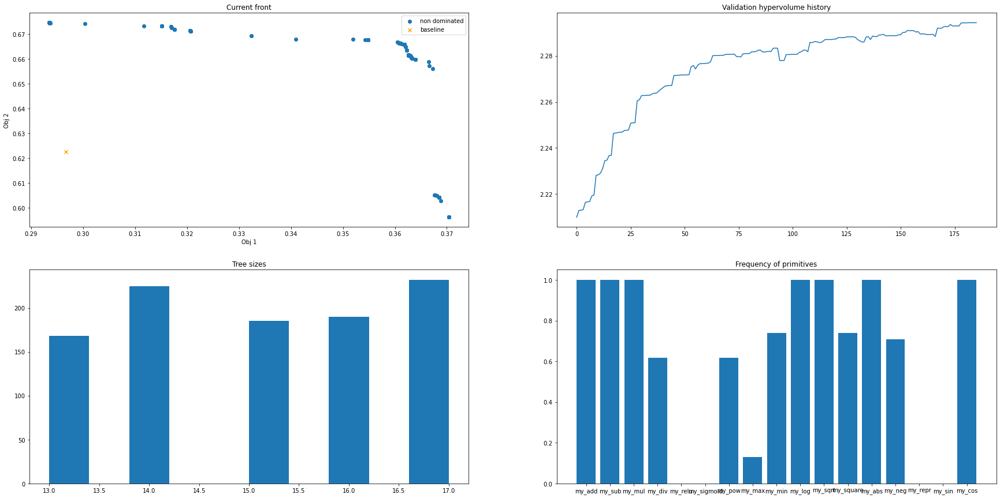

-- Generation 186 --
Training   set hypervolume: 2.3277425297046603
Validation set hypervolume: 2.294307907705887


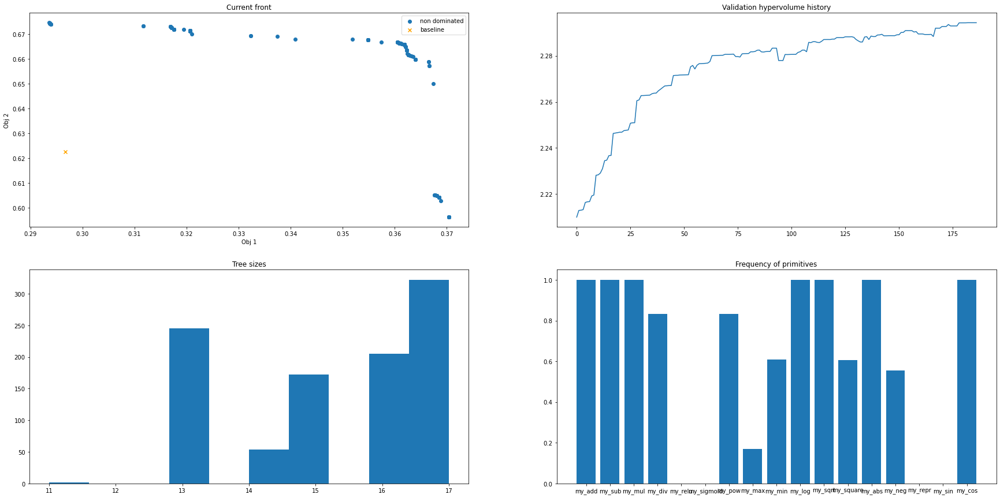

-- Generation 187 --
Training   set hypervolume: 2.2692474561680513
Validation set hypervolume: 2.294628449880252


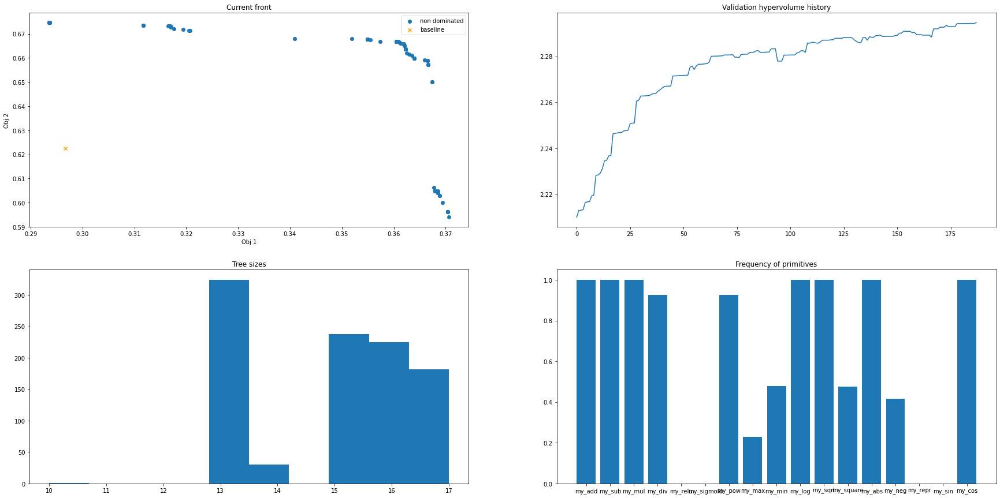

-- Generation 188 --
Training   set hypervolume: 2.359452669854293
Validation set hypervolume: 2.295387755656324


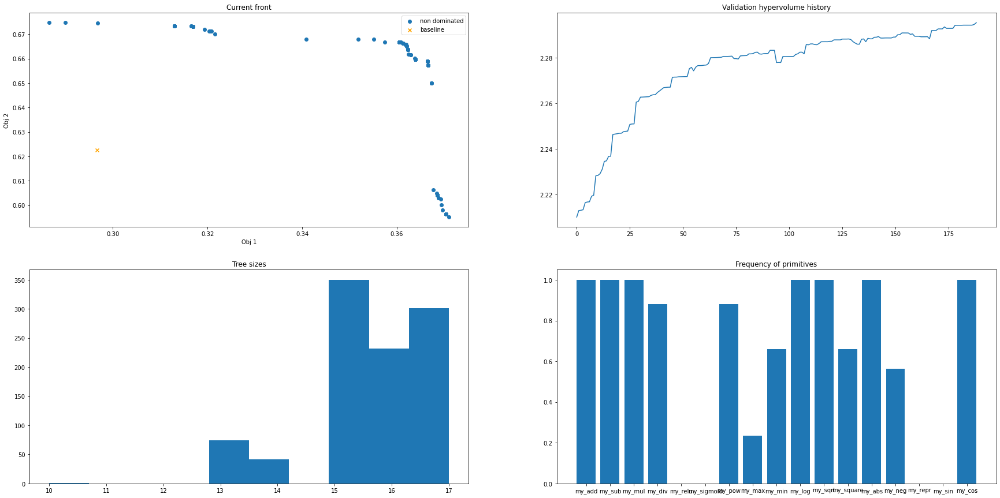

-- Generation 189 --
Training   set hypervolume: 2.3060943013056137
Validation set hypervolume: 2.2952363720720776


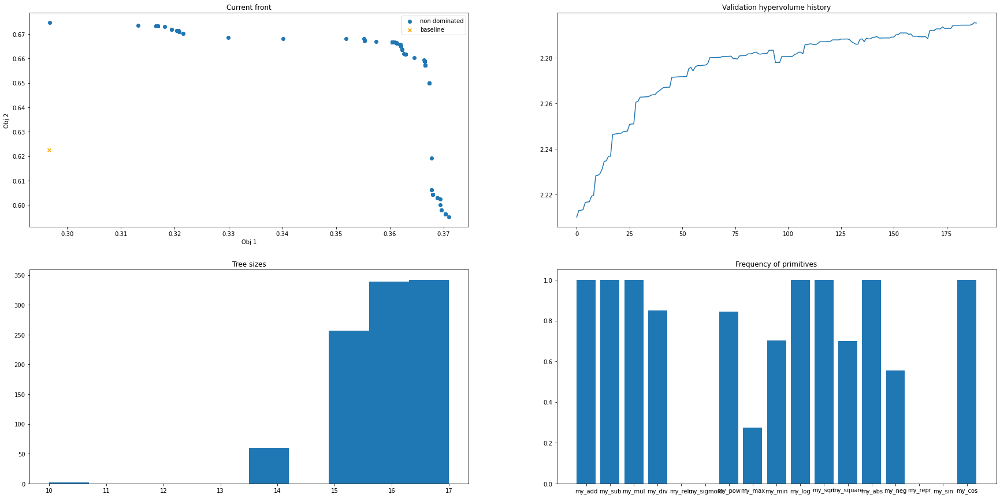

-- Generation 190 --
Training   set hypervolume: 2.2405030538581623
Validation set hypervolume: 2.2952263259812886


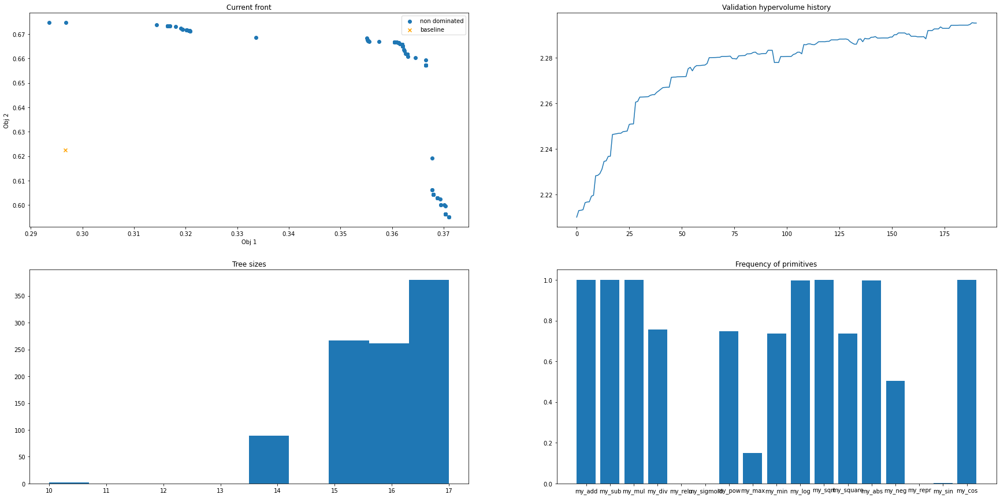

-- Generation 191 --
Training   set hypervolume: 2.28764109544871
Validation set hypervolume: 2.296192719542555


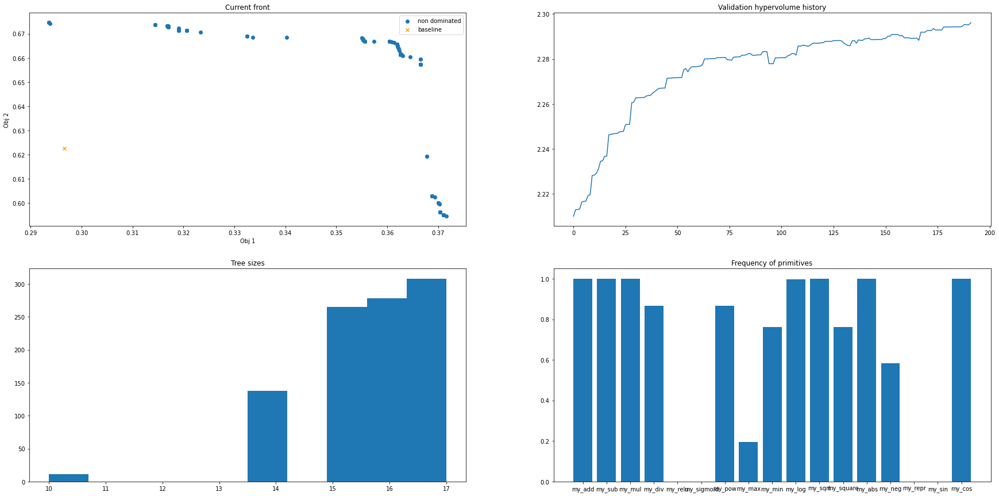

-- Generation 192 --
Training   set hypervolume: 2.3022492003720916
Validation set hypervolume: 2.295244673465339


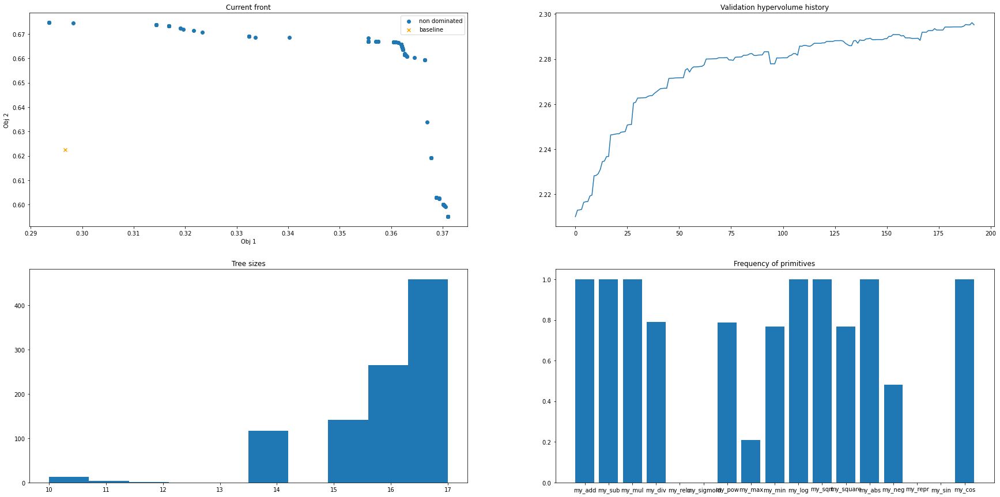

-- Generation 193 --
Training   set hypervolume: 2.288334577352161
Validation set hypervolume: 2.2940477697433588


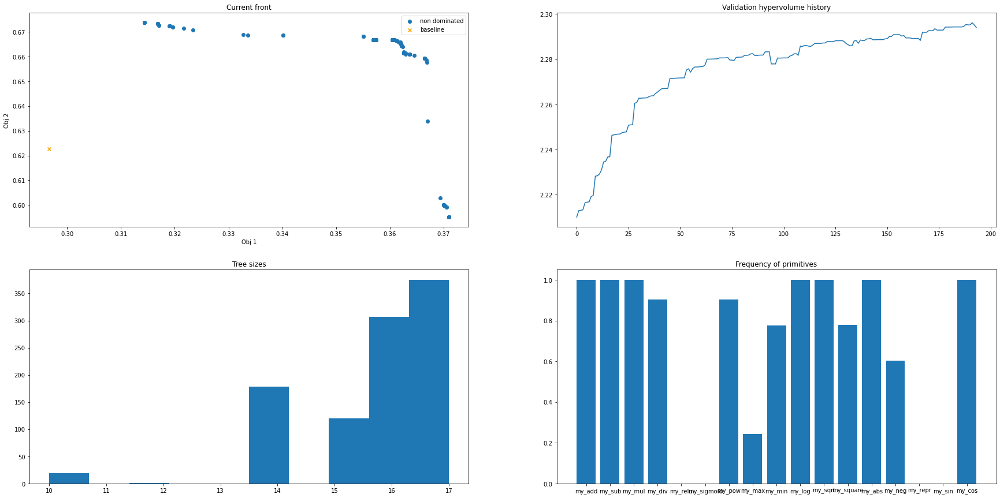

-- Generation 194 --
Training   set hypervolume: 2.2400276769807466
Validation set hypervolume: 2.294235557859092


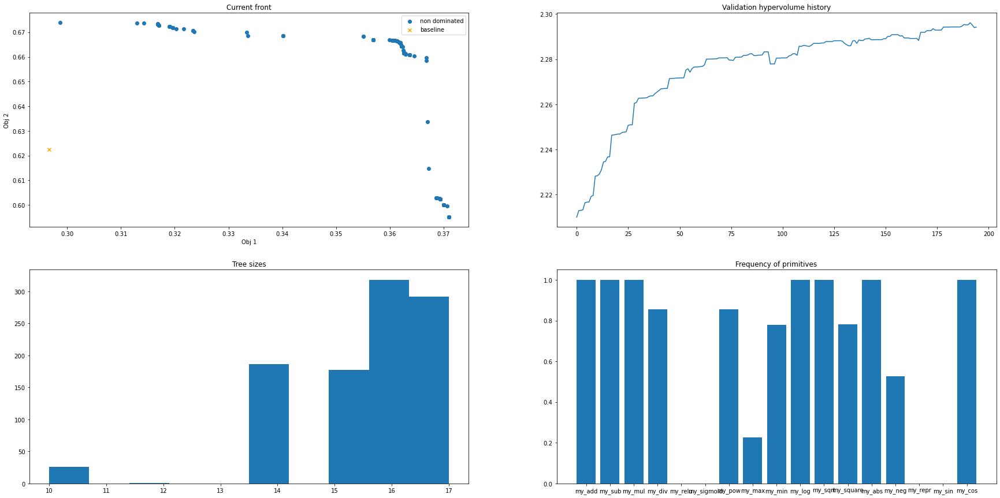

-- Generation 195 --
Training   set hypervolume: 2.311624833358023
Validation set hypervolume: 2.29410891184478


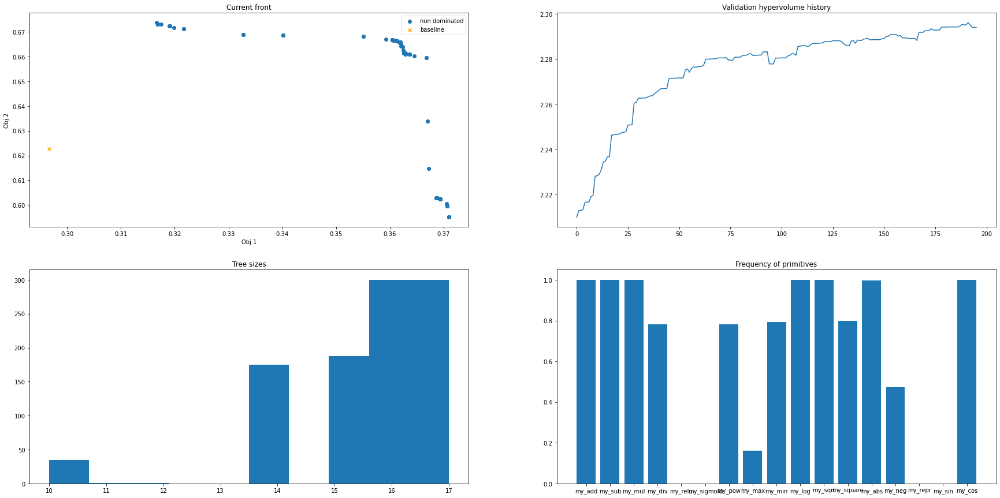

-- Generation 196 --
Training   set hypervolume: 2.314466775503055
Validation set hypervolume: 2.2941130028623182


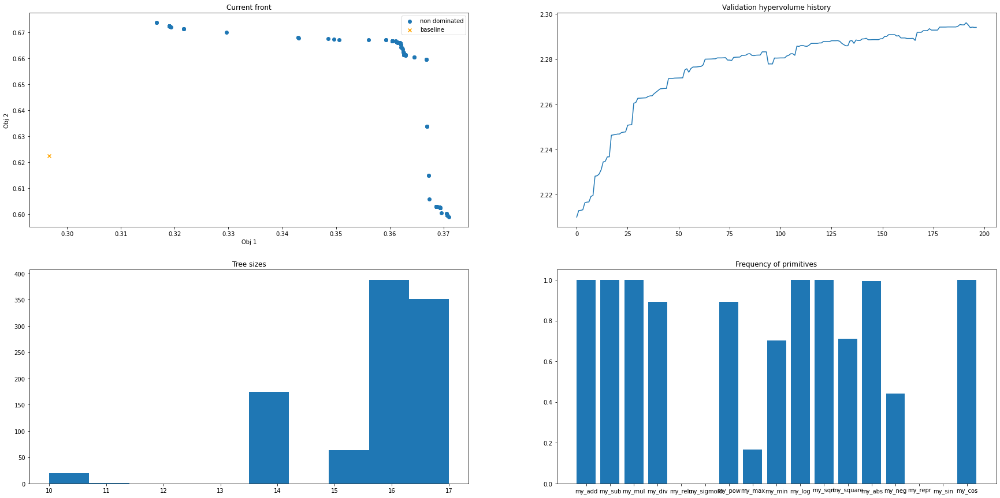

-- Generation 197 --
Training   set hypervolume: 2.3287687225562435
Validation set hypervolume: 2.294121237270443


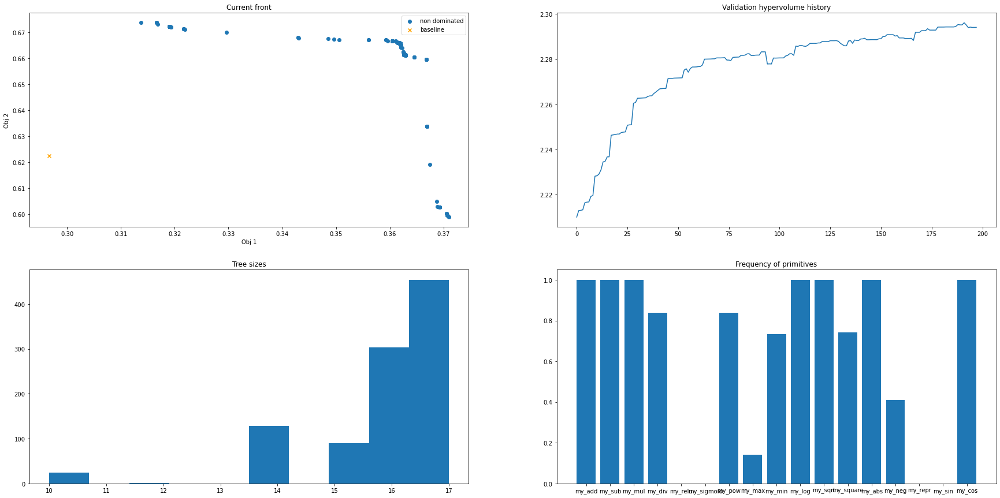

-- Generation 198 --
Training   set hypervolume: 2.2558540465000587
Validation set hypervolume: 2.2948489701384354


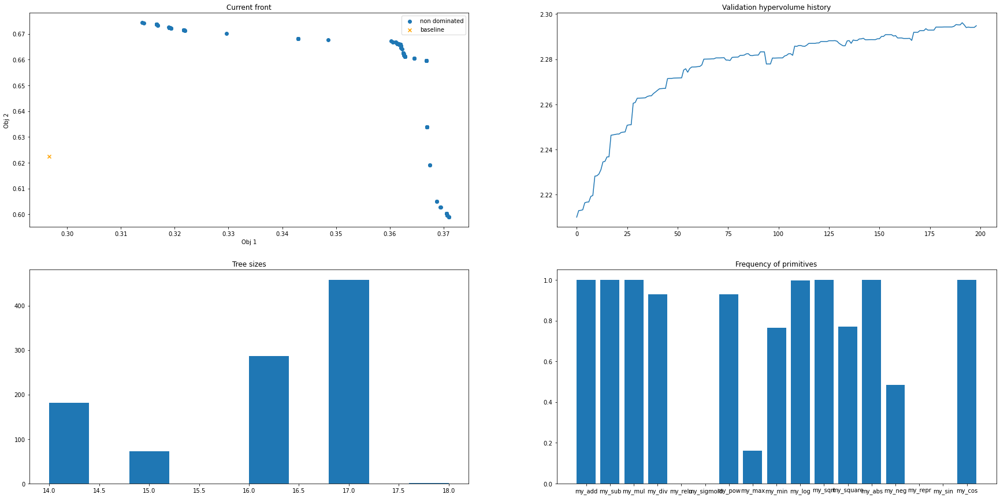

-- Generation 199 --
Training   set hypervolume: 2.3334517500478364
Validation set hypervolume: 2.2948570683058667


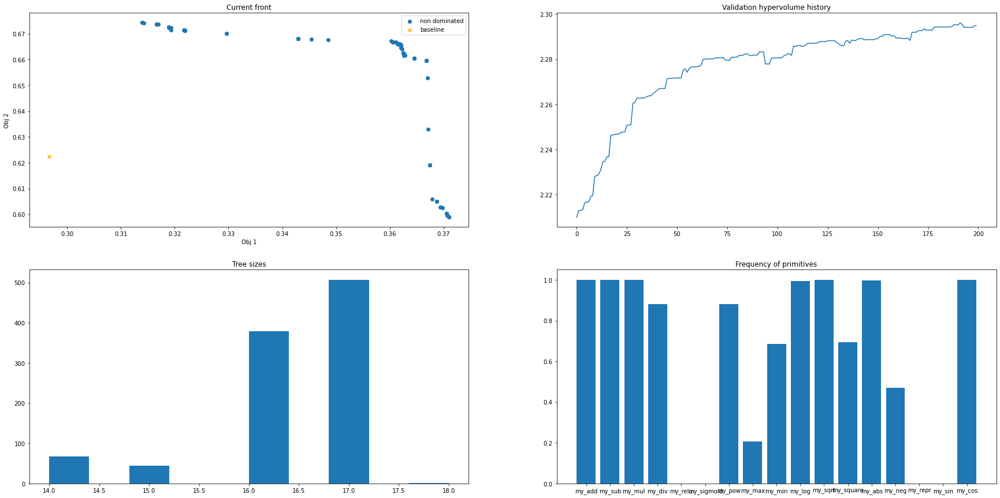

-- Generation 200 --
Training   set hypervolume: 2.317499500081028
Validation set hypervolume: 2.294861798889887


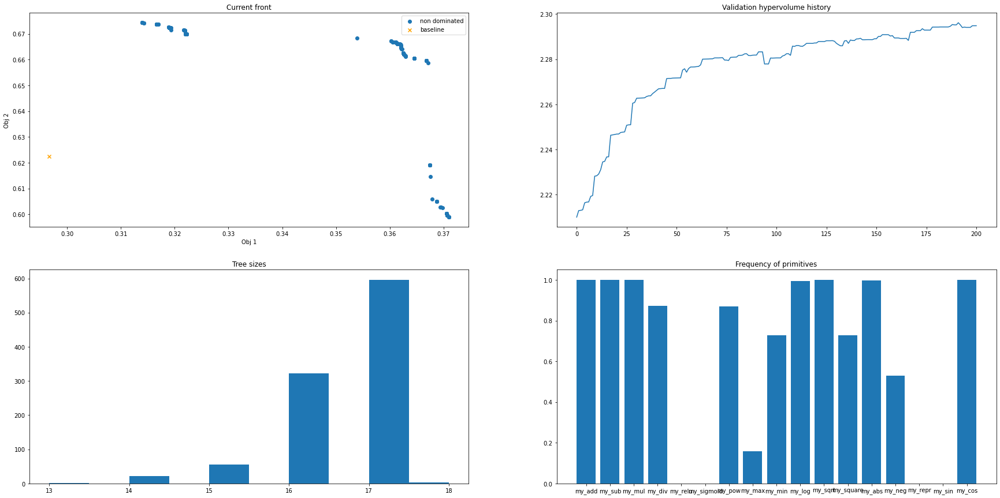

2.294861798889887 0
-- Generation 201 --
Training   set hypervolume: 2.3169553014270976
Validation set hypervolume: 2.2943442223456962


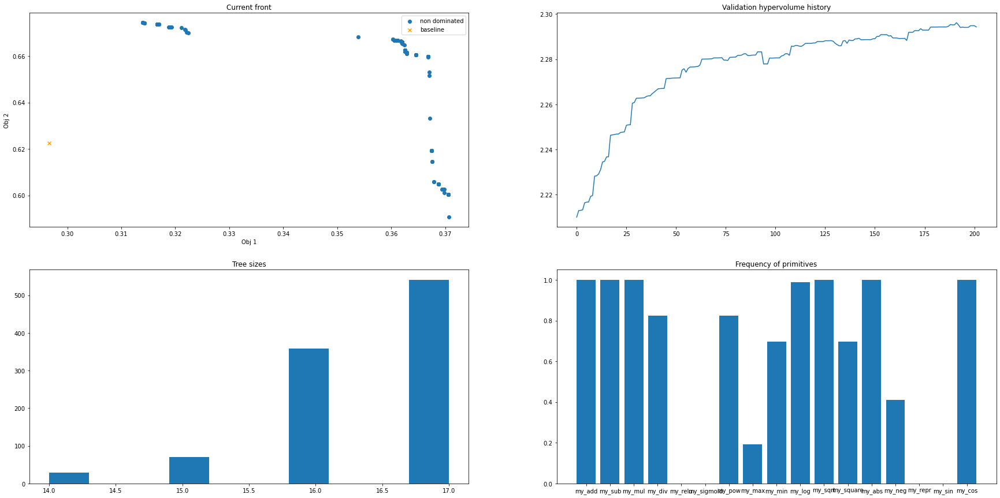

-- Generation 202 --
Training   set hypervolume: 2.334991681313872
Validation set hypervolume: 2.2943442778430336


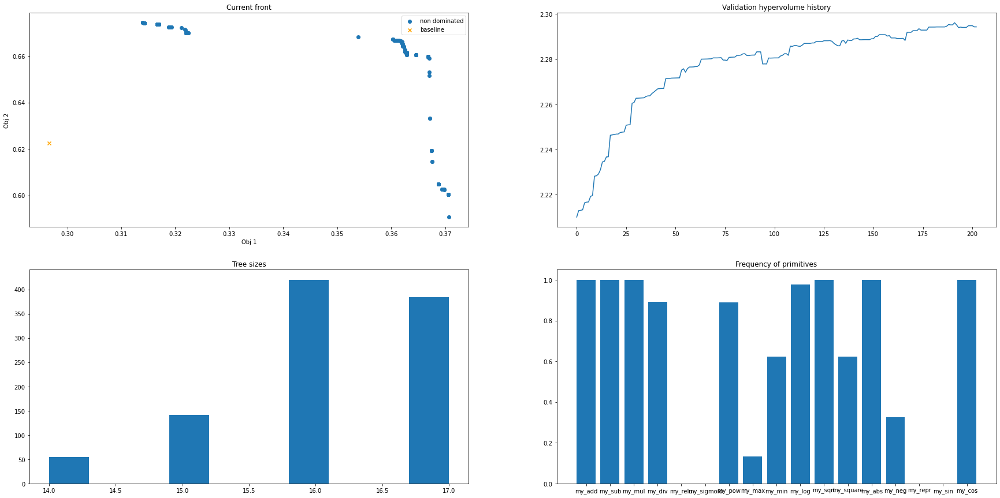

-- Generation 203 --
Training   set hypervolume: 2.3286362414935775
Validation set hypervolume: 2.294236493865109


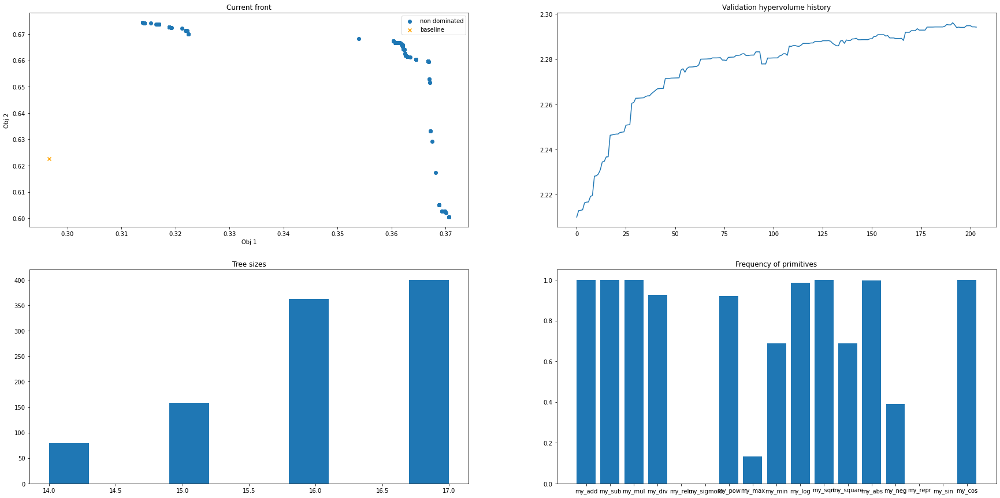

-- Generation 204 --
Training   set hypervolume: 2.314552313756663
Validation set hypervolume: 2.2952827820854


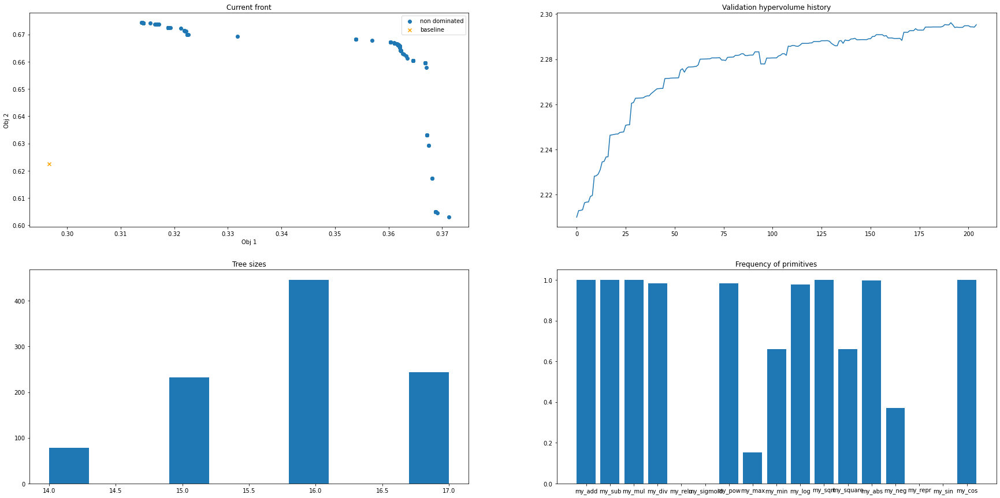

-- Generation 205 --
Training   set hypervolume: 2.32682989815706
Validation set hypervolume: 2.295294844768003


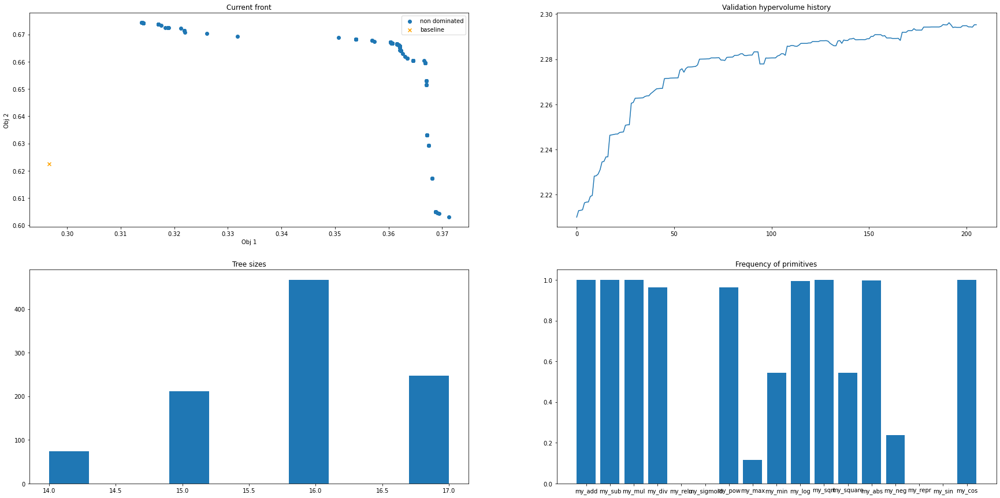

-- Generation 206 --
Training   set hypervolume: 2.3411326802966714
Validation set hypervolume: 2.2956403596497728


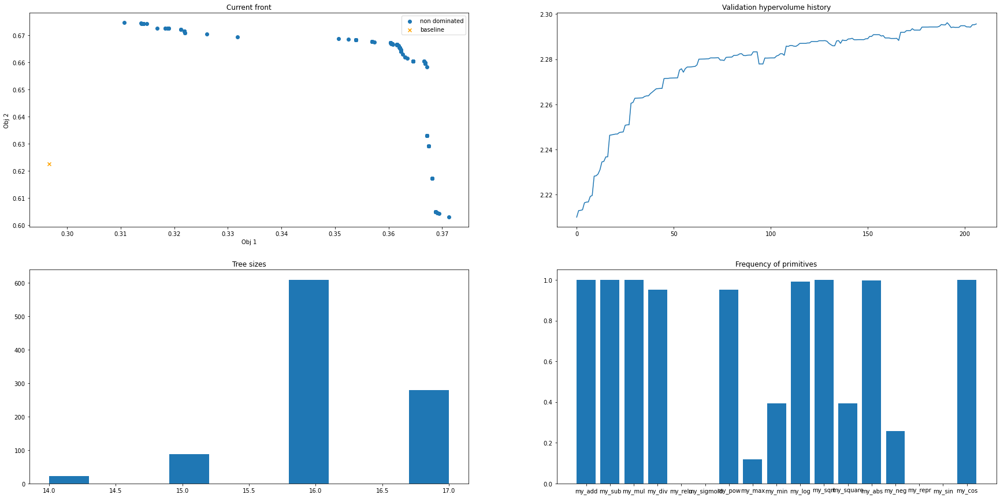

-- Generation 207 --
Training   set hypervolume: 2.307590828718153
Validation set hypervolume: 2.295937899718858


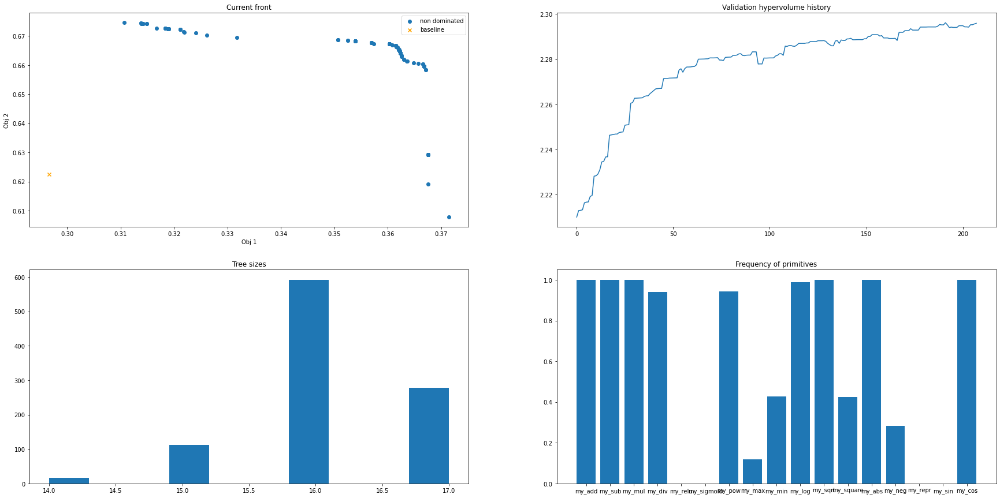

-- Generation 208 --
Training   set hypervolume: 2.3358484095048277
Validation set hypervolume: 2.295955942151573


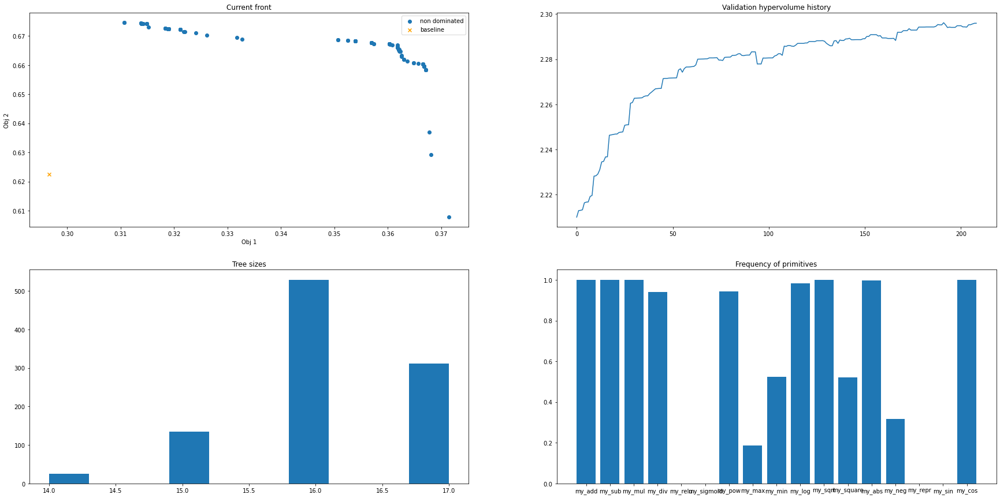

-- Generation 209 --
Training   set hypervolume: 2.2949147678264405
Validation set hypervolume: 2.2959482477340254


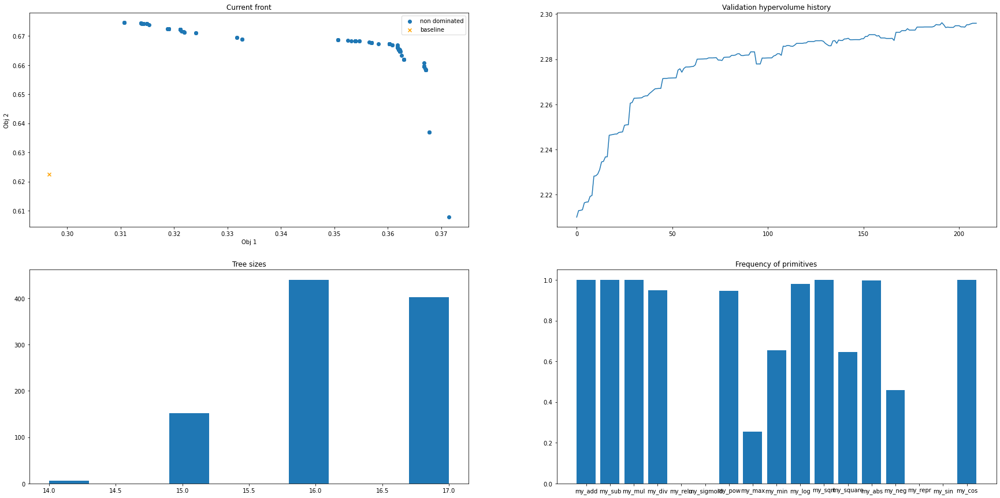

-- Generation 210 --
Training   set hypervolume: 2.326379238903135
Validation set hypervolume: 2.29629844905917


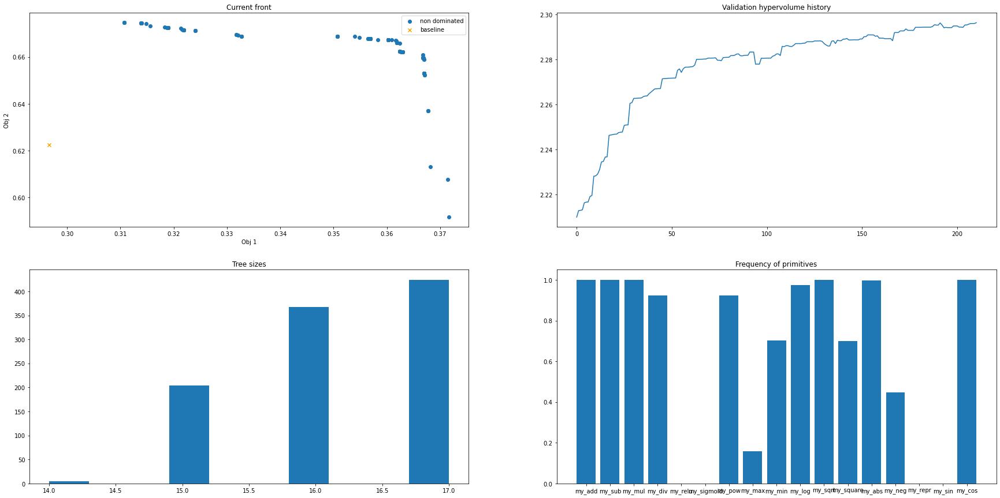

-- Generation 211 --
Training   set hypervolume: 2.307702418567734
Validation set hypervolume: 2.2962983557299195


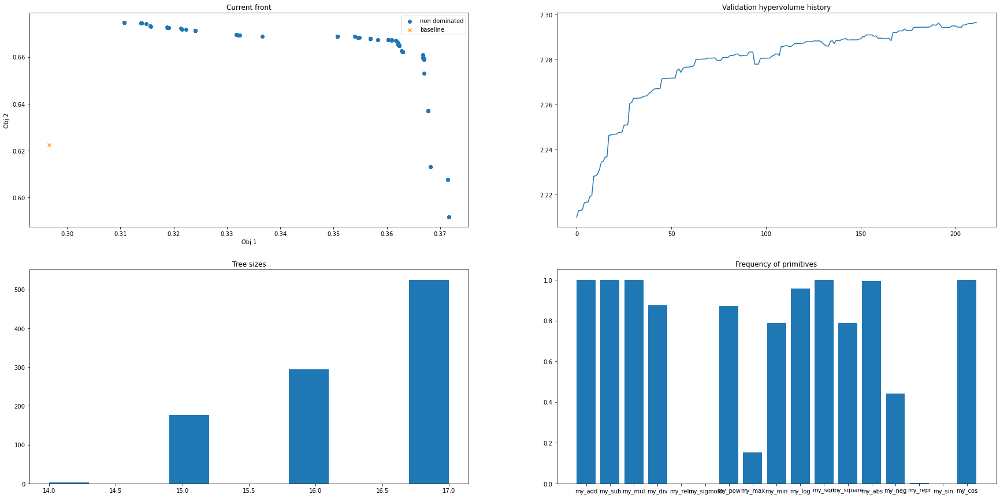

-- Generation 212 --
Training   set hypervolume: 2.331600392122767
Validation set hypervolume: 2.2963083523001964


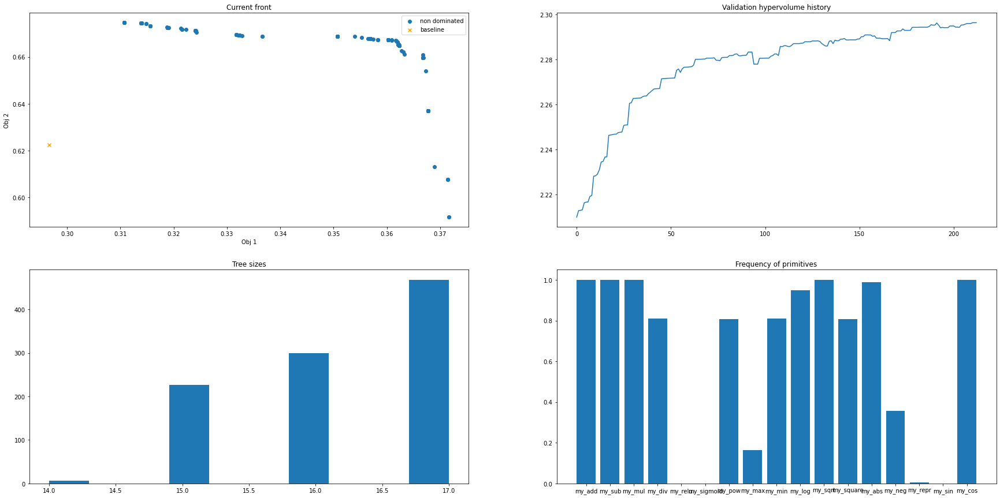

-- Generation 213 --
Training   set hypervolume: 2.3006130339936774
Validation set hypervolume: 2.2959660121289485


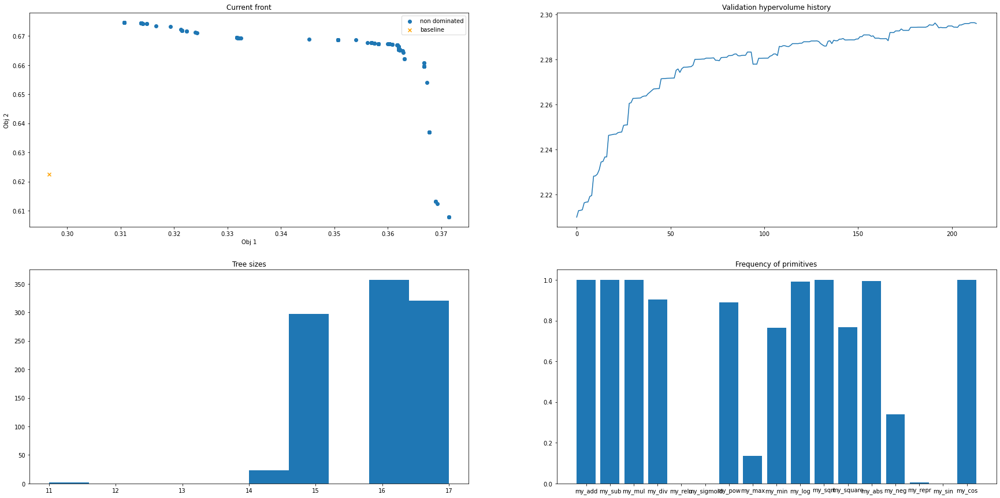

-- Generation 214 --
Training   set hypervolume: 2.2986637017735343
Validation set hypervolume: 2.2969134356122605


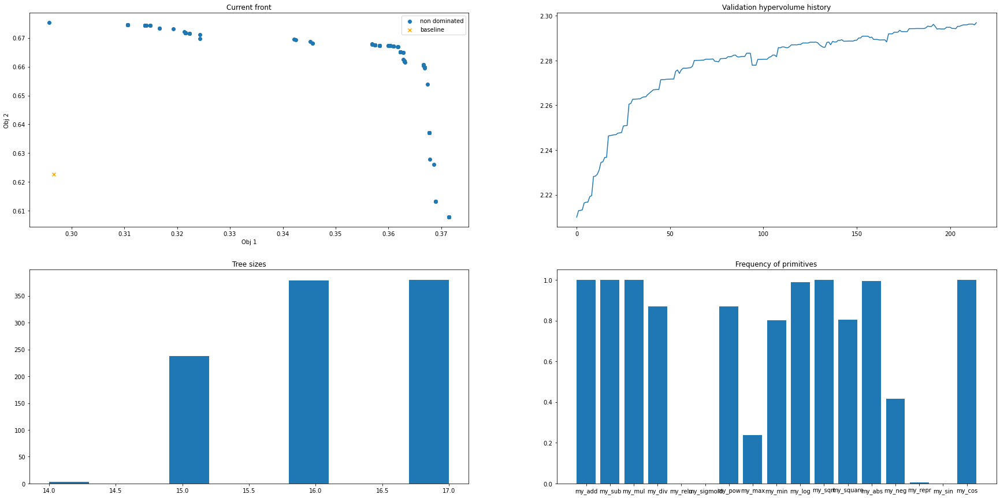

-- Generation 215 --
Training   set hypervolume: 2.2696737701212815
Validation set hypervolume: 2.2969524858581716


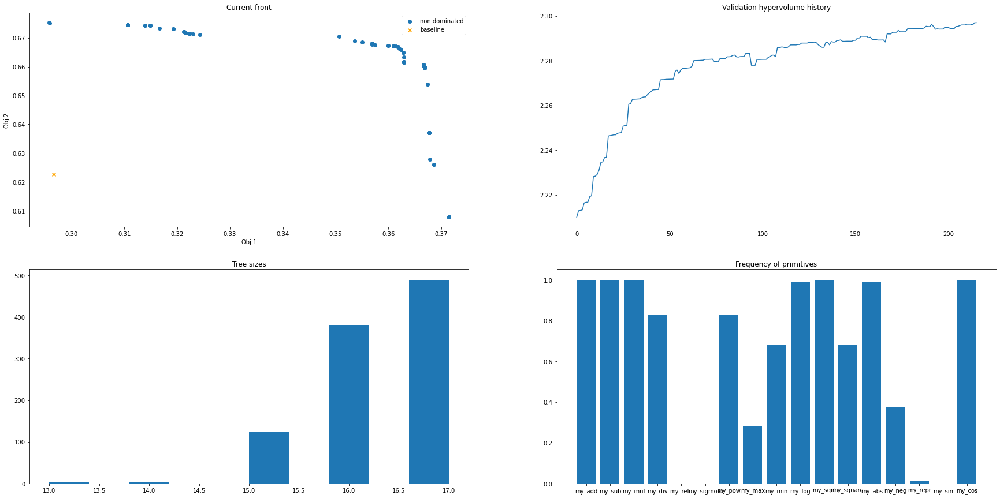

-- Generation 216 --
Training   set hypervolume: 2.327053769345313
Validation set hypervolume: 2.2969519960002347


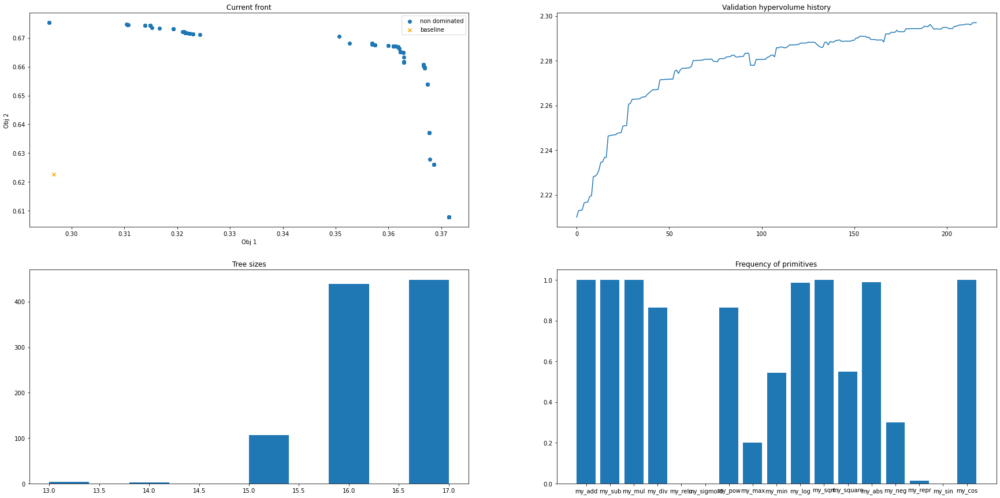

-- Generation 217 --
Training   set hypervolume: 2.2909040880541
Validation set hypervolume: 2.296477197374414


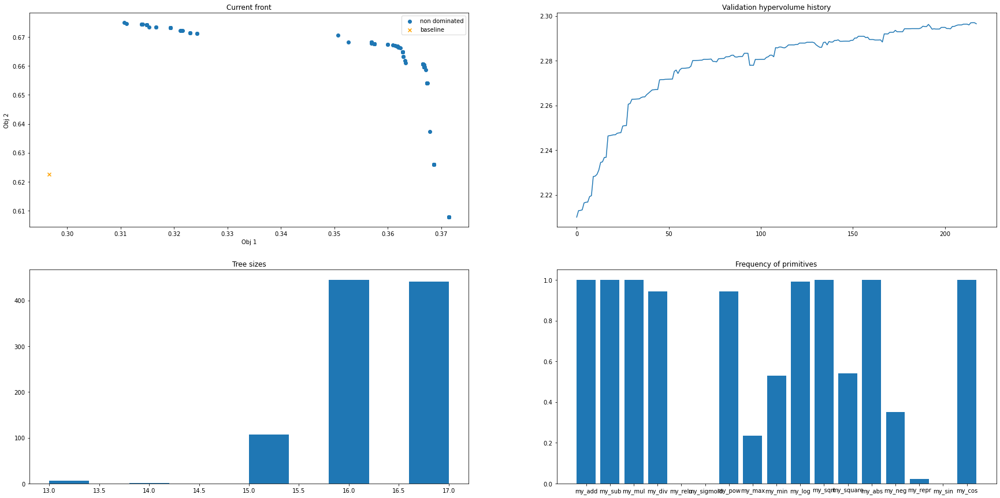

-- Generation 218 --
Training   set hypervolume: 2.3245265591442434
Validation set hypervolume: 2.296475694473809


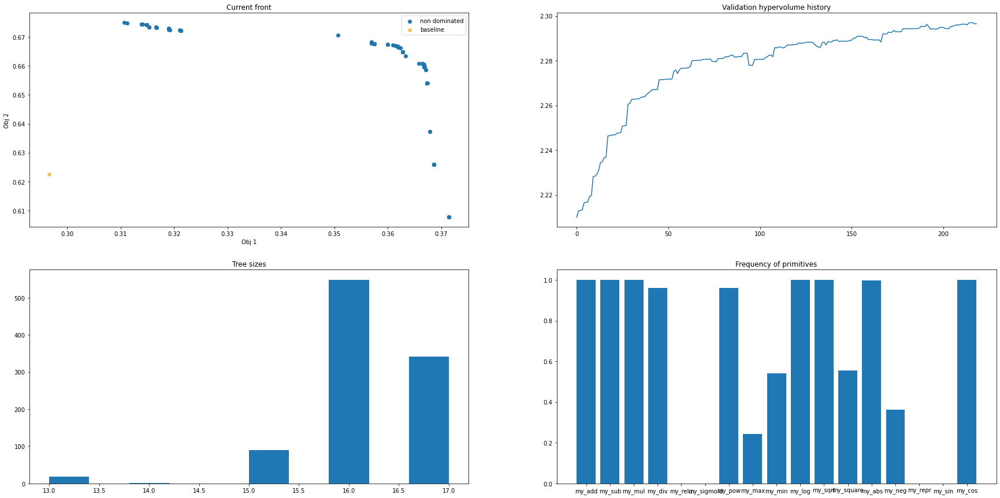

-- Generation 219 --
Training   set hypervolume: 2.3000721638999444
Validation set hypervolume: 2.2966171552274326


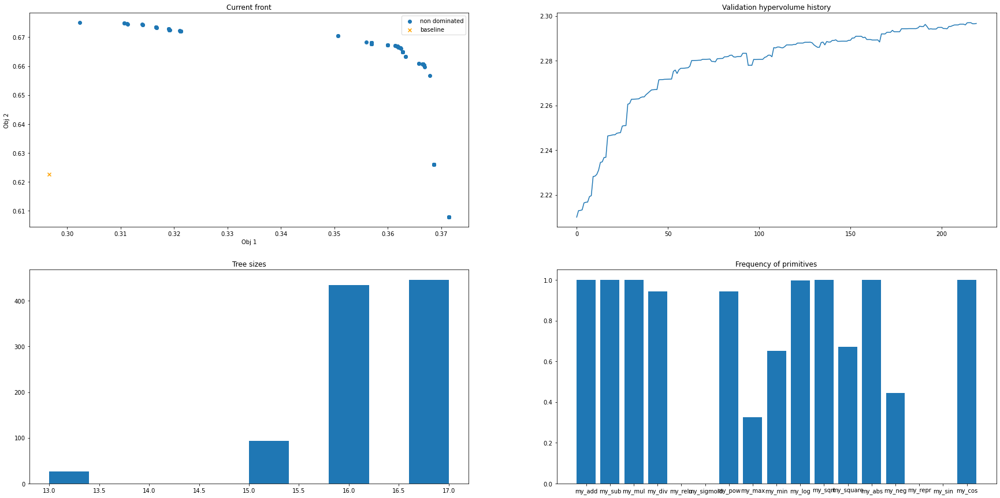

-- Generation 220 --
Training   set hypervolume: 2.338718032126709
Validation set hypervolume: 2.2966066733004693


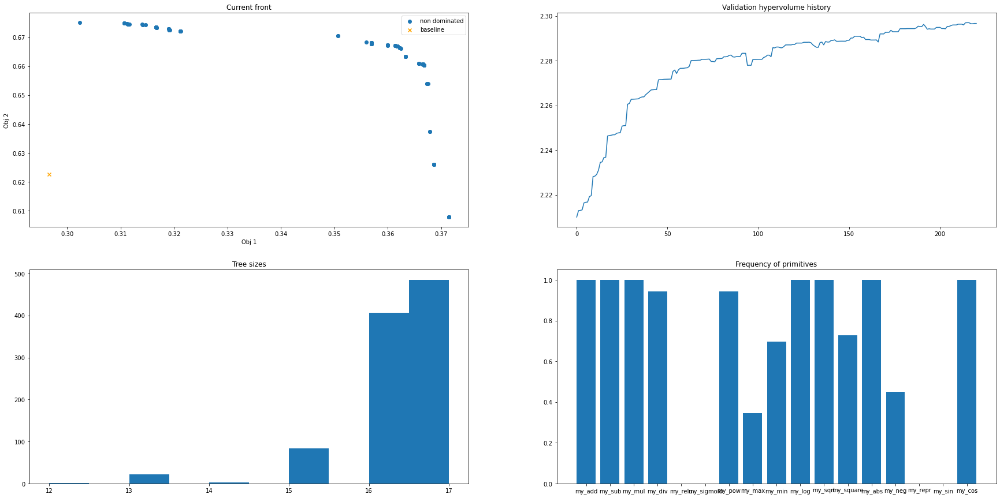

-- Generation 221 --
Training   set hypervolume: 2.283214356414911
Validation set hypervolume: 2.2964778511665416


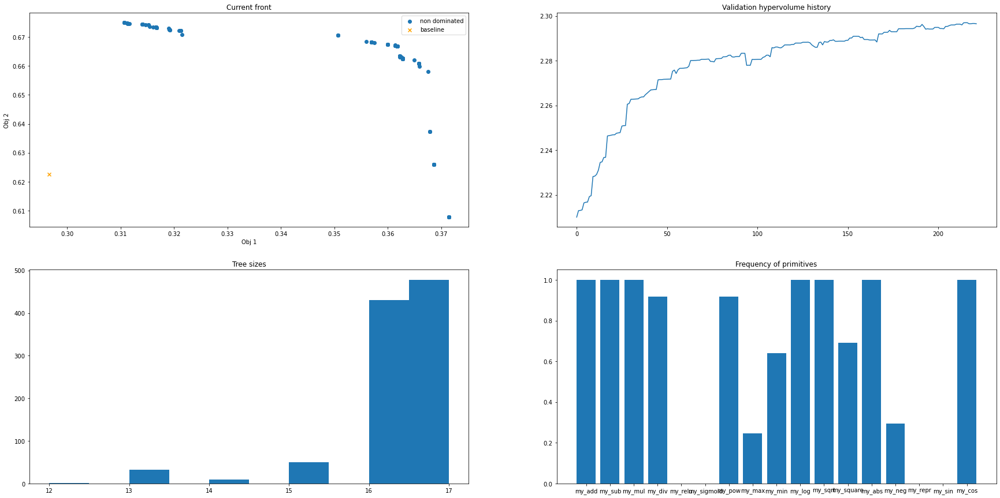

-- Generation 222 --
Training   set hypervolume: 2.289846567095766
Validation set hypervolume: 2.29715630231415


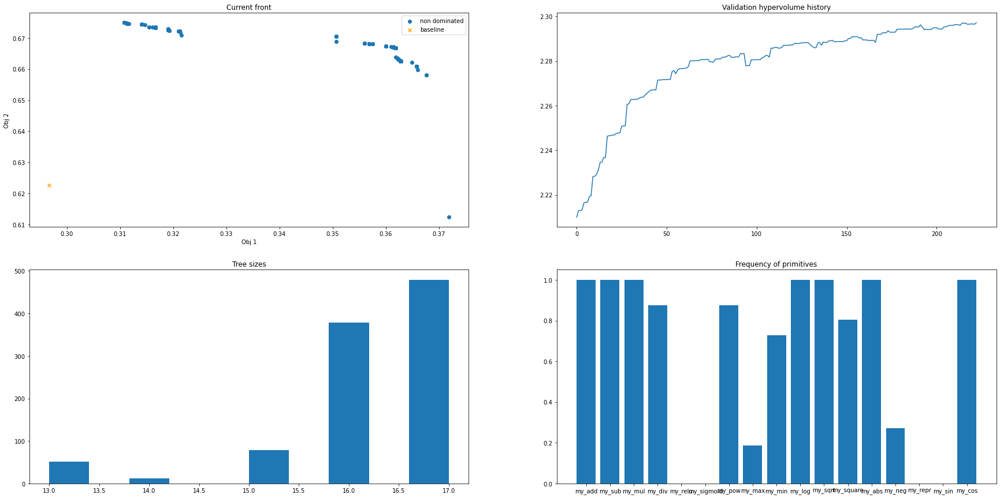

-- Generation 223 --
Training   set hypervolume: 2.2820987327674214
Validation set hypervolume: 2.297665164364937


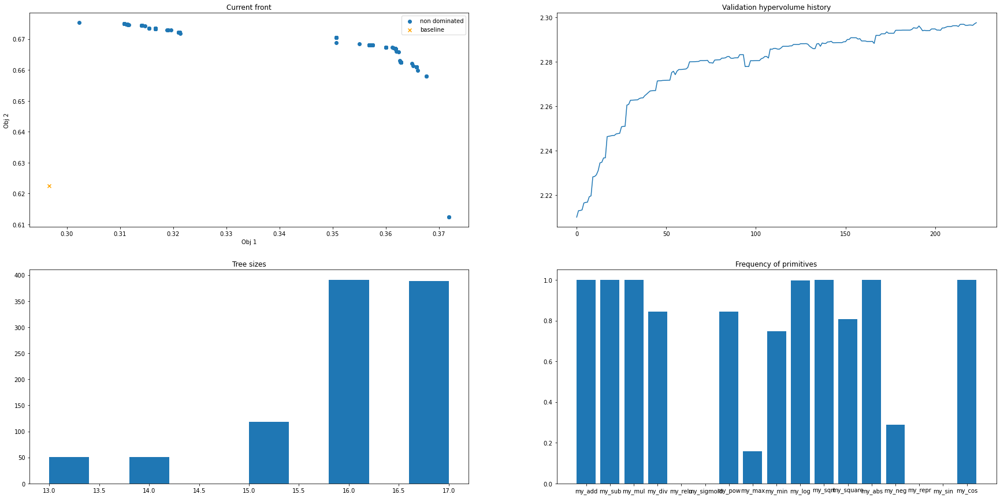

-- Generation 224 --
Training   set hypervolume: 2.323472561824745
Validation set hypervolume: 2.297691673794792


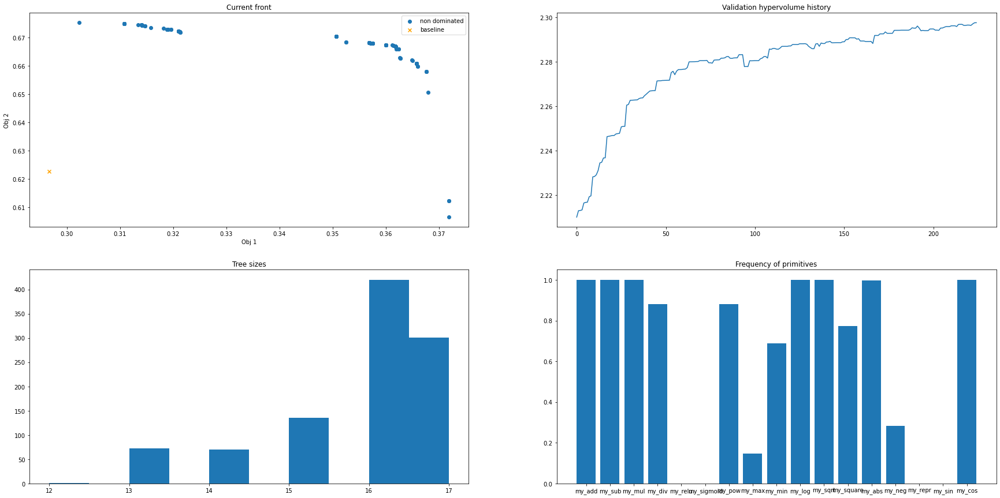

-- Generation 225 --
Training   set hypervolume: 2.2845166535720747
Validation set hypervolume: 2.297687152096365


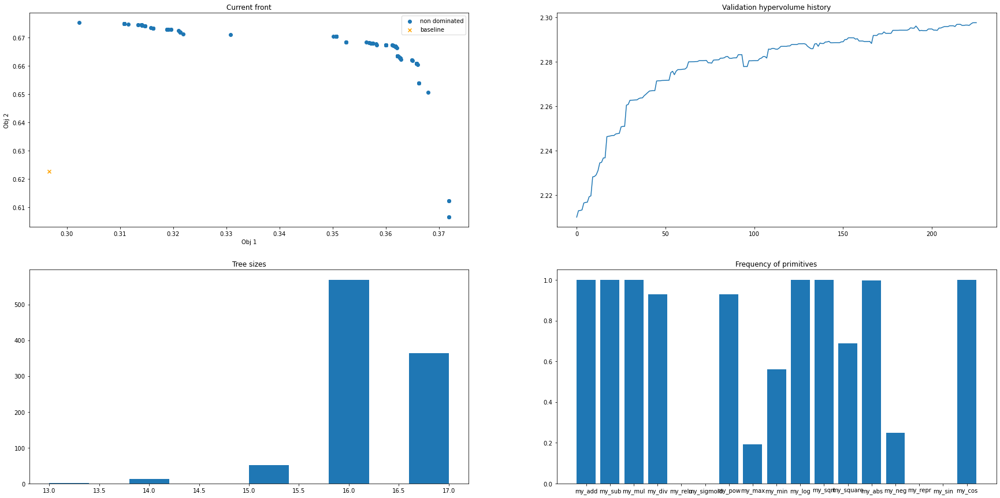

-- Generation 226 --


In [ ]:
if remove_fully_different:
    path_string = 'common'
else:
    path_string = 'all'
    
    
num_iterations = 1 # how many times to execute the genetic algorithm. For instance, for tuning purposes, the algorihm might be run several times for each parameter combination so to obtain statistally meaningful results.




 
# Run the genetic algorithm



# Lists that keep track of various things that happen during the generations
all_list_training_hypervolume = []
all_list_validation_hypervolume = []
all_list_pareto_fronts = []
all_list_height_distribution = [] 
all_list_used_primitives = [] 




from tqdm.notebook import tqdm
pbar_progress = tqdm(total = num_iterations)

for i in range(num_iterations):

    print(">>>> Iteration:", i)

    random.seed(i) 

    list_training_hypervolume, list_validation_hypervolume, list_pareto_fronts, list_height_distribution, list_used_primitives, means_baseline = main_genetic_function(num_generations, i) 

    all_list_training_hypervolume.append(list_training_hypervolume)
    all_list_validation_hypervolume.append(list_validation_hypervolume)
    all_list_pareto_fronts.append(list_pareto_fronts)
    all_list_height_distribution.append(list_height_distribution)
    all_list_used_primitives.append(list_used_primitives)

    best_valid_hv = np.max([max(x) for x in all_list_validation_hypervolume])

    pbar_progress.update(1)




    # Now I plot the graphs regarding the execution of the algorithm

    which_iteration_to_plot = np.argmax([max(x) for x in all_list_validation_hypervolume])
    #print("Best iteration with seed:", which_iteration_to_plot)

    best_valid_fit = max(all_list_validation_hypervolume[which_iteration_to_plot])
    num_gen_best = np.argmax(all_list_validation_hypervolume[which_iteration_to_plot])
    #print("Maximum validation hypervolume:", best_valid_fit, "at generation number", num_gen_best, "of iteration with seed", which_iteration_to_plot)

    
    
    
    
    fig = plt.figure(figsize=(30, 10))

    ax = fig.add_subplot(121)
    ax.plot(range(len(all_list_training_hypervolume[which_iteration_to_plot])), all_list_training_hypervolume[which_iteration_to_plot], label='Max training hypervolume')

    yhat = all_list_training_hypervolume[which_iteration_to_plot]
    ax.plot(range(len(all_list_training_hypervolume[which_iteration_to_plot])), yhat, color='green', linestyle='--')
    ax.plot(range(len(all_list_validation_hypervolume[which_iteration_to_plot])), all_list_validation_hypervolume[which_iteration_to_plot], label='Max validation hypervolume')
    ax.legend()
    ax.set_xlabel('Generations')
    ax.set_ylabel('Hypervolume')
    ax.axvline(np.argmax(all_list_validation_hypervolume[which_iteration_to_plot]), color='red')

    if len(distance_thresholds) <= 3:
        if len(distance_thresholds) == 3:
            top_front = all_list_pareto_fronts[which_iteration_to_plot][num_gen_best]
            ax = fig.add_subplot(122, projection='3d')
            ax.scatter([x[1][0] for x in top_front], [x[1][1] for x in top_front], [x[1][2] for x in top_front])
            ax.scatter(means_baseline[0], means_baseline[1], means_baseline[2])
            ax.set_xlabel("Average Pearson")
            ax.set_ylabel("Stddev Pearson")
        elif len(distance_thresholds) == 2:
            top_front = all_list_pareto_fronts[which_iteration_to_plot][num_gen_best]
            ax = fig.add_subplot(122)
            ax.scatter([x[1][0] for x in top_front], [x[1][1] for x in top_front])
            ax.scatter(means_baseline[0], means_baseline[1])
            ax.set_xlabel("Average Pearson")
            ax.set_ylabel("Stddev Pearson")            

    
    #plt.savefig('./genetic_results/' + path_string + '/plots/' + dataset + "_" + str(max_samp_per_set) +  '/' + 'evolution_statistics_' + cut_and_keep + "_" + str(i) + '.jpeg')

    file = open('./lists_genetic_results', 'wb')
    pickle.dump([all_list_training_hypervolume, all_list_validation_hypervolume, all_list_pareto_fronts, all_list_height_distribution, all_list_used_primitives, means_baseline], file)
    file.close()


pbar_progress.close()




In [ ]:
'''
# Combine the Pareto fronts: this cell is only needed if more than one iteration of the genetic algorithm is performed

load_from_disk = False

if remove_fully_different:
    string_temp = 'common'
else:
    string_temp = 'all'


# Putting all fronts together
merged_fronts = []
for iteration_front in all_list_pareto_fronts:
    for generation_iteration_front in iteration_front:
        merged_fronts.extend(generation_iteration_front)



# Extract the final function
# Extracting distinct elements according to their fitness
distinct_elements = {} # for each (pearson_avg, pearson_std) I keep a map of (#tree_nodes)
for ind, x in enumerate(merged_fronts):
    dim_tree = len(x[0])
    fitness_tree = (x[1][0], x[1][1]) # pearson average, pearson stddev
    if fitness_tree in distinct_elements:
        if dim_tree in distinct_elements[fitness_tree]:
            distinct_elements[fitness_tree][dim_tree].append(ind)
        else:
            distinct_elements[fitness_tree][dim_tree] = [ind]
    else:
        distinct_elements[fitness_tree] = {}
        distinct_elements[fitness_tree][dim_tree] = [ind]


# Removing dominated solutions
all_fitness_couples =  list(distinct_elements.keys())

p = Pool(num_parallel_evals)
is_dom_list = p.map(parallel_extract_all_front, zip(all_fitness_couples, [all_fitness_couples]*len(all_fitness_couples)))
p.close()
p.join()

all_fitness_couples = np.asarray(all_fitness_couples)[np.logical_not(is_dom_list)]

# Plotting the final front

all_fitness_couples = [x for x in all_fitness_couples if x[0] >= mean_down and x[1] >= mean_up]



print("Final front size:", len(all_fitness_couples))
print("Baseline", mean_down, mean_up)



plt.figure(figsize=(10, 7))
plt.scatter([x[0] for x in all_fitness_couples], [x[1] for x in all_fitness_couples])
plt.scatter(mean_down, mean_up)
for i, fc in enumerate(all_fitness_couples):
    plt.annotate(i, fc)
plt.xlabel("Obj 1")
plt.ylabel("Obj 2")





# Selecting the solution that has the highest hypervolume among those strictly better than the baseline
from pygmo import hypervolume as pyhv

mins = np.min(all_fitness_couples, axis=0)

hypervolumes = []
for sol in all_fitness_couples:
    x, y = sol
    hv = pyhv([(-x, -y)])
    hypervolumes.append(hv.compute([1, 1]))
    
hypervolumes = np.asarray(hypervolumes)

print(hypervolumes)

index_selected_from_pareto = np.argmax(hypervolumes)

print(index_selected_from_pareto)

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111)
ax.scatter([x[0] for x in all_fitness_couples], [x[1] for x in all_fitness_couples])
ax.scatter(mean_down, mean_up)
ax.scatter(all_fitness_couples[index_selected_from_pareto][0], all_fitness_couples[index_selected_from_pareto][1], color='red', s=50)
print(all_fitness_couples[index_selected_from_pareto][0], all_fitness_couples[index_selected_from_pareto][1])
for i, fc in enumerate(all_fitness_couples):
    ax.text(fc[0], fc[1], i)
ax.set_xlabel("Obj 1")
ax.set_ylabel("Obj 2")
plt.show()






selected_fitness = all_fitness_couples[index_selected_from_pareto]
selected_size = list(np.min(distinct_elements[(selected_fitness[0], selected_fitness[1])].keys()))[0]
selected_index = distinct_elements[(selected_fitness[0], selected_fitness[1])][selected_size][0]

top_solution = merged_fronts[selected_index]
print(top_solution[1])
print("Height:", top_solution[0].height, "nodes:", len(top_solution[0]))
print(top_solution[0])

genetic_function = toolbox.compile(expr=top_solution[0])
'''

Filtered final front size: 977
Baseline [0.29664256417686996, 0.622585904745369]
[2.28340953 2.28773324 2.28142314 2.27143596 2.28056852 2.28784429
 2.2839135  2.28788182 2.28024742 2.23220649 2.28655674 2.28751076
 2.28749551 2.28774107 2.28039467 2.28819801 2.28730007 2.28024742
 2.28788182 2.28774107 2.28655674 2.27143596 2.28142314 2.28819801
 2.28039467 2.28730007 2.28340953 2.28784429 2.28054101 2.28751076
 2.28774107 2.28142314 2.28784429 2.28751076 2.28788182 2.28655674
 2.27143596 2.28340953 2.28039467 2.28819801 2.28730007 2.28054101
 2.28024742 2.28142314 2.28774107 2.28039467 2.28751076 2.28730007
 2.28788182 2.28340953 2.28655674 2.28024742 2.28784429 2.28819801
 2.28054101 2.28784429 2.28024742 2.28730007 2.28774107 2.28655674
 2.28788182 2.28340953 2.28819801 2.28039467 2.28142314 2.28054101
 2.28751076 2.28655674 2.28784429 2.28819801 2.28774107 2.28142314
 2.28039467 2.28024742 2.28340953 2.28730007 2.28788182 2.28054101
 2.28784429 2.28142314 2.28819801 2.28039467 2.2

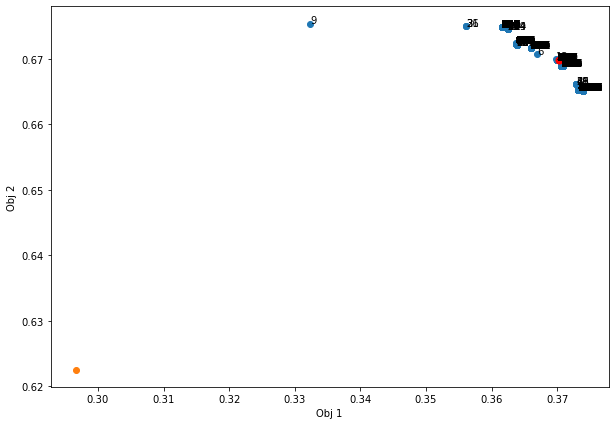

[0.3703117282627213, 0.6698375747957365]
Height: 17 nodes: 128
my_add(my_sub(my_add(my_square(my_min(my_sqrt(my_sqrt(my_mul(my_cos(my_min(my_log(my_log(ARG1)), ARG1)), my_mul(ARG0, ARG1)))), ARG1)), my_log(ARG0)), my_sqrt(my_sub(my_add(my_mul(ARG1, my_square(my_min(ARG1, my_mul(my_min(my_sub(my_add(my_sqrt(my_sub(my_add(ARG1, my_sub(4.981938059055867, ARG0)), ARG0)), my_sub(my_add(ARG1, ARG2), ARG0)), ARG0), my_sub(my_pow(my_div(3.0, my_add(ARG1, ARG2)), my_add(my_cos(ARG0), ARG2)), my_square(my_log(ARG1)))), 1.0)))), ARG2), my_sqrt(my_cos(my_mul(my_log(my_abs(ARG0)), my_sub(my_add(my_min(ARG1, my_sub(my_pow(my_div(3.0, my_add(ARG1, ARG2)), my_sqrt(my_sub(my_add(ARG1, my_sub(4.981938059055867, ARG0)), ARG0))), my_square(my_log(ARG1)))), my_sub(ARG0, my_cos(my_mul(my_log(my_mul(my_sqrt(my_sub(my_add(ARG1, ARG2), ARG0)), my_square(my_log(ARG1)))), ARG1)))), my_sqrt(my_sub(my_add(ARG1, ARG2), ARG0))))))))), my_sub(my_sqrt(ARG1), my_cos(my_mul(my_log(my_log(ARG1)), my_sqrt(my_sqrt(my_sub(m

In [21]:
# To be used when there is just a single run of the genetic algorithm and I want to keep the last population as the final front


# Reload the results provided by the genetic algorithm

file = open('./lists_genetic_results', 'rb')
all_list_training_hypervolume, all_list_validation_hypervolume, all_list_pareto_fronts, all_list_height_distribution, all_list_used_primitives, means_baseline = pickle.load(file)
file.close()




best_gen_hypervol = np.argmax(all_list_validation_hypervolume[0])
final_front = all_list_pareto_fronts[0][best_gen_hypervol]
keep_sols = []
for x in final_front:
    keep_sol = True
    for i in range(len(x[1])):
        if not(x[1][i] >= means_baseline[i]):
            keep_sol = False
    keep_sols.append(keep_sol)
        
final_front = [x for i, x in enumerate(final_front) if keep_sols[i]]

print("Filtered final front size:", len(final_front))
print("Baseline", means_baseline)



# Selecting the solution that has the highest hypervolume among those strictly better than the baseline provided by cosine
from pygmo import hypervolume as pyhv
fitnesses = [x[1] for x in final_front]

hypervolumes = []
for sol in fitnesses:
    hv = pyhv([np.negative(np.asarray(sol))])
    hypervolumes.append(hv.compute([1,]*len(distance_thresholds)))
    
    
hypervolumes = np.asarray(hypervolumes)
print(hypervolumes)


index_selected_from_pareto = np.argmax(hypervolumes)
print(index_selected_from_pareto)



if len(distance_thresholds) == 2:
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111)
    ax.scatter([x[0] for x in fitnesses], [x[1] for x in fitnesses])
    ax.scatter(means_baseline[0], means_baseline[1])
    ax.scatter(fitnesses[index_selected_from_pareto][0], fitnesses[index_selected_from_pareto][1], color='red', s=50)
    print(fitnesses[index_selected_from_pareto][0], fitnesses[index_selected_from_pareto][1])
    for i, fc in enumerate(final_front):
        ax.text(fc[1][0], fc[1][1], i)
    ax.set_xlabel("Obj 1")
    ax.set_ylabel("Obj 2")
    plt.show()
elif len(distance_thresholds) == 3:
    fig = plt.figure(figsize=(16, 14))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter([x[0] for x in fitnesses], [x[1] for x in fitnesses], [x[2] for x in fitnesses])
    ax.scatter(means_baseline[0], means_baseline[1], means_baseline[2])
    ax.scatter(fitnesses[index_selected_from_pareto][0], fitnesses[index_selected_from_pareto][1], fitnesses[index_selected_from_pareto][2], color='red', s=50)
    print(fitnesses[index_selected_from_pareto][0], fitnesses[index_selected_from_pareto][1], fitnesses[index_selected_from_pareto][2])
    for i, fc in enumerate(fitnesses):
        ax.text(fc[0], fc[1], fc[2], i)
    ax.set_xlabel("Obj 1")
    ax.set_ylabel("Obj 2")
    ax.set_zlabel("Obj 3")
    plt.show()



top_solution = final_front[index_selected_from_pareto]
print(top_solution[1])
print("Height:", top_solution[0].height, "nodes:", len(top_solution[0]))
print(top_solution[0])

genetic_function = toolbox.compile(expr=top_solution[0])


In [22]:
# Function that allows us to use the meta-distance generated by the genetich algorithm

def genetic_metric(param_1, param_2, param_3):
    out_result = genetic_function(param_1.reshape(-1, 1), param_2.reshape(-1, 1), param_3.reshape(-1, 1)).flatten()
    return out_result
    

In [23]:
# Possibly, load ML models to provide a baseline

list_metrics = functions_list.copy()


load_ml_models = True

if load_ml_models:
    
    file = open('./lr_metric_model', 'rb')
    lr_metric_model = pickle.load(file)
    file.close()
    
    file = open('./xgb_metric_model', 'rb')
    rf_metric_model = pickle.load(file)
    file.close()
    
    
    def lr_metric(param_1, param_2, param_3):
        out_result = lr_metric_model.predict(np.asarray([param_1.flatten(), param_2.flatten(), param_3.flatten()]).T).flatten()
        return out_result
    
    def rf_metric(param_1, param_2, param_3):
        out_result = rf_metric_model.predict(np.asarray([param_1.flatten(), param_2.flatten(), param_3.flatten()]).T).flatten()
        return out_result

    
    list_metrics.append(lr_metric)
    list_metrics.append(rf_metric)
    
    

In [24]:
# Evaluating results, following the same approach as that of the paper: "What you sense is not where you are: On the relationships between fingerprints and spatial knowledge in indoor positioning"

num_run = 100 # number of runs to consider
num_samp_per_run = 400 # number of points to sample for each run
keep_only_common = False # whether to keep only pairs of fingerprints that have at least one access point in common


list_metrics.append(genetic_metric)

list_norm_funcs = [normalize_zero_to_one]

map_to_macro_block = {'False_False': {}, 'True_False':{}, 'False_True':{}} # rappresenta combinazioni [only_same_building]_[only_same_building_floor]


if keep_only_common:
    path_string = 'common'
else:
    path_string = 'all'

    
list_metrics

[<function __main__.spat_dist_3D(df)>,
 <function __main__.euclidean_fp(df)>,
 <function __main__.cosine(df)>,
 <function __main__.matusita(df)>,
 <function __main__.lr_metric(param_1, param_2, param_3)>,
 <function __main__.rf_metric(param_1, param_2, param_3)>,
 <function __main__.genetic_metric(param_1, param_2, param_3)>]

In [25]:




# IN THE FOLLOWING, THERE IS THE EVALUATION PART OF THE GENETIC ALGORITHM, WHICH CAN BE PERFORMED ON ANY OF THE DATASETS #





In [26]:
dataset = 'UJI1'


file = open('./dataset_processati/dataset_' + dataset + '.pickle', 'rb')

dataframe = pickle.load(file)
file.close()

# Remove possible rows with no received access points
dataframe.drop(dataframe.loc[dataframe[[s for s in dataframe.columns if "WAP" in s]].apply(np.sum, axis=1) == len([s for s in dataframe.columns if "WAP" in s])*100].index, axis=0, inplace=True)
dataframe['floor_id'] = dataframe['floor_id'].astype('int8')
dataframe['building_id'] = dataframe['building_id'].astype('int8')
dataframe['coord_z'] = dataframe['coord_z'].astype('float32')
for col in [x for x in dataframe.columns if 'WAP' in x]:
    dataframe[col] = dataframe[col].astype('int16')

dataframe_test = dataframe[dataframe['set'] == 'test'].drop(columns=['set']) 





filter_floors = True  # remove floors having a too low number of points
lower_threshold_test = 10

# Remove floors that have an insufficient number of points
if filter_floors:
    # Test
    print("Original floors (test)", len(np.unique(dataframe_test['building_id'].astype('str') + '_' + dataframe_test['floor_id'].astype('str'))))
    points_per_floor = dataframe_test.groupby(['building_id', 'coord_z'])['coord_x'].count()
    print("Floors that have less points than the desired threshold (test):", points_per_floor[points_per_floor < lower_threshold_test])
    buildings_floors_to_keep = pd.DataFrame(np.asarray([[x, y] for x, y in points_per_floor[points_per_floor >= lower_threshold_test].index.values]), columns=['building_id', 'coord_z'])
    buildings_floors_to_keep['building_id'] = buildings_floors_to_keep['building_id'].astype('int64')
    dataframe_test = pd.merge(dataframe_test, buildings_floors_to_keep)
    print("Remaining floors (test)", len(np.unique(dataframe_test['building_id'].astype('str') + '_' + dataframe_test['floor_id'].astype('str'))))


# First of all, let us normalize the datasets
dataframe_test_normalized = normalize_zero_to_one(dataframe_test, min_value=110)

Original floors (test) 13
Floors that have less points than the desired threshold (test): Series([], Name: coord_x, dtype: int64)
Remaining floors (test) 13


In [27]:


# MAKE SURE THAT THERE IS THE SAME ORDER of the metrics BOTH IN list_metrics AND INSIDE evaluate_metrics!!!



In [28]:
def evaluate_metrics(num_run, num_samp_per_run, only_same_building, only_same_building_floor, norm_func, list_metrics, pbar_progress):
    dataframe_normalized = dataframe_test_normalized

    # correlation values between spatial and fingerprint distances for each run
    map_corrs_3D = {}
    for metr_name in list_metrics:
        if 'spat_dist' not in str(metr_name):
            map_corrs_3D[str(metr_name)] = []
            
    # statistics calculated over each run: average and standard deviation of the considered distance metrics (for the spatial or fingerprint domains)
    map_means = {}
    map_stds = {}
    for metr_name in list_metrics:
        map_means[str(metr_name)] = []
        map_stds[str(metr_name)] = []
        

    # execute the runs
    run_details = []
    for i in range(num_run):
        if only_same_building:
            granularity_level = 'building'
            b_id = random.choice(list(np.unique(dataframe_normalized['building_id'].values)))
            num_samples = min(num_samp_per_run, len(dataframe_normalized[dataframe_normalized['building_id']==b_id]))
            random_samples = random.sample(range(dataframe_normalized[dataframe_normalized['building_id']==b_id].shape[0]), num_samples)
            merged_df = cartesian_product_basic(dataframe_normalized[dataframe_normalized['building_id']==b_id].iloc[random_samples].reset_index(), 
                                                dataframe_normalized[dataframe_normalized['building_id']==b_id].iloc[random_samples].reset_index())
        elif only_same_building_floor:
            granularity_level = 'floor'
            b_id = random.choice(list(np.unique(dataframe_normalized['building_id'].values)))
            f_id = random.choice(list(np.unique(dataframe_normalized[dataframe_normalized['building_id']==b_id]['floor_id'].values)))
            num_samples = min(num_samp_per_run, len(dataframe_normalized[(dataframe_normalized['building_id']==b_id) & (dataframe_normalized['floor_id']==f_id)]))
            random_samples = random.sample(range(dataframe_normalized[(dataframe_normalized['building_id']==b_id) & (dataframe_normalized['floor_id']==f_id)].shape[0]), num_samples)
            merged_df = cartesian_product_basic(dataframe_normalized[(dataframe_normalized['building_id']==b_id) & (dataframe_normalized['floor_id']==f_id)].iloc[random_samples].reset_index(), 
                                                dataframe_normalized[(dataframe_normalized['building_id']==b_id) & (dataframe_normalized['floor_id']==f_id)].iloc[random_samples].reset_index())
        else:
            granularity_level = 'whole'
            num_samples = min(num_samp_per_run, len(dataframe_normalized))
            random_samples = random.sample(range(dataframe_normalized.shape[0]), num_samples)
            merged_df = cartesian_product_basic(dataframe_normalized.iloc[random_samples].reset_index(), 
                                                dataframe_normalized.iloc[random_samples].reset_index())
        
        
        if keep_only_common:
            df = merged_df.copy()
            temp = np.concatenate((np.expand_dims(np.asarray(df[fnmatch.filter(df.columns, 'WAP*a')]), axis=1), 
                           np.expand_dims(np.asarray(df[fnmatch.filter(df.columns, 'WAP*b')]), axis=1)), 
                           axis=1)
            temp = np.argwhere(np.sum(np.prod(temp, axis=1), axis=1)).flatten()
            merged_df = merged_df.iloc[list(temp)]
            
           
        # remove the comparisons between an element and itself
        len_before = len(merged_df)
        merged_df = merged_df[merged_df['index_a'] < merged_df['index_b']] # "strictly less than" allows us to remove duplicates
            
            
        p = Pool(num_parallel_evals)
        lista_risultati = p.starmap(call_function_on_df, [(metr_name, merged_df) for metr_name in list_metrics if 'genetic' not in str(metr_name) and 'lr_' not in str(metr_name) and 'rf_' not in str(metr_name)]) 
        p.close()
        p.join()
        # Calculate the ML and genetic results
        lista_risultati.append(lr_metric(lista_risultati[1], lista_risultati[2], lista_risultati[3]))
        lista_risultati.append(rf_metric(lista_risultati[1], lista_risultati[2], lista_risultati[3]))
        lista_risultati.append(genetic_metric(lista_risultati[1], lista_risultati[2], lista_risultati[3]))

                
        global prova
        prova = lista_risultati
        
        
        for metr_ind, metr_name in enumerate(list_metrics):
            merged_df[str(metr_name)] = lista_risultati[metr_ind]
        
        
        # keeping just the columns with the results of the metrics
        merged_df = merged_df[[str(x) for x in list_metrics]]

        for key in map_corrs_3D.keys():
            correlation = merged_df[str(list_metrics[0])].corr(merged_df[key])
            map_corrs_3D[key].append(correlation)

        for key in map_means.keys():
            map_means[key].append(merged_df[key].mean())
            map_stds[key].append(merged_df[key].std())
            
            
        # save results to disk
        file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) +  '/run/' + str(only_same_building) + '_' + str(only_same_building_floor) + '_' + str(norm_func).split("function ")[1].split(" at")[0] + '_run_' + str(i), 'wb')
        bld = -1
        flr = -1
        if granularity_level == 'building':
            bld = b_id
        if granularity_level == 'floor':
            bld = b_id
            flr = f_id
        pickle.dump([merged_df, bld, flr], file)
        file.close()
        
                
        pbar_progress.update(1)
            
        run_details.append(merged_df.copy())
        
    del merged_df
    
    return (map_corrs_3D, map_means, map_stds, run_details)    


In [29]:
import distutils
from distutils import util
import os
import shutil

if not os.path.exists('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) +  '/run/'):
    os.makedirs('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) +  '/run/')
else:
    shutil.rmtree('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) +  '/run/')
    os.makedirs('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) +  '/run/')

    
pbar_progress = tqdm(total = len(map_to_macro_block) * len(list_norm_funcs) * num_run)    
for key in map_to_macro_block.keys(): 
    print("\n> Macroblock:", key)
    for norm_func in list_norm_funcs:
        random.seed(42) 
        only_same_building = bool(util.strtobool(key.split("_")[0]))
        only_same_building_floor = bool(util.strtobool(key.split("_")[1]))
        map_to_macro_block[key][str(norm_func)] = evaluate_metrics(num_run, num_samp_per_run, only_same_building, only_same_building_floor, norm_func, list_metrics, pbar_progress)
        
pbar_progress.close()


file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + "/map_to_macro_block", "wb")
pickle.dump(map_to_macro_block, file)
file.close()

  0%|          | 0/300 [00:00<?, ?it/s]


> Macroblock: False_False

> Macroblock: True_False

> Macroblock: False_True


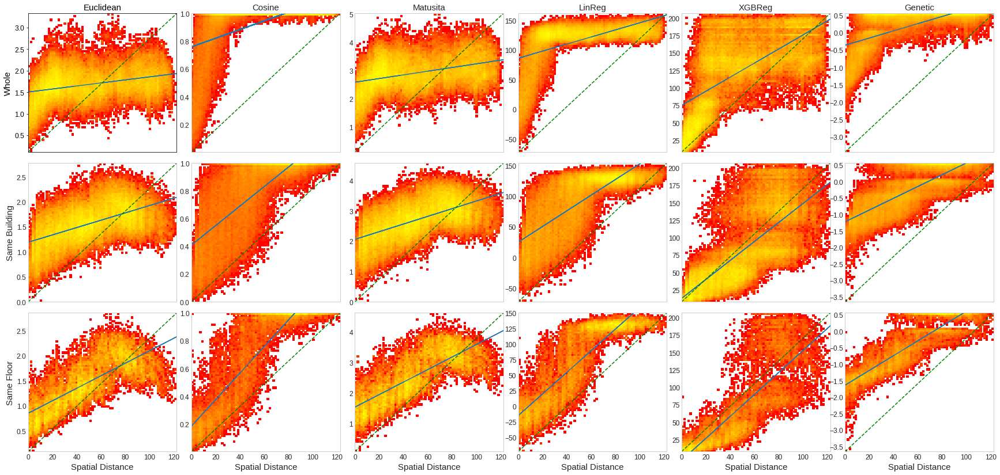

In [30]:
# Plots of the distance metrics with respect to 3D distance, considereing a representative run


which_run = 1


import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from matplotlib import colors

if not os.path.exists('./genetic_results/' + path_string + '/plots/' + dataset + "_" + str(num_samp_per_run) +  '/'):
    os.makedirs('./genetic_results/' + path_string + '/plots/' + dataset + "_" + str(num_samp_per_run) +  '/')



import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import matplotlib 

matplotlib.rc('xtick', labelsize=25) 
matplotlib.rc('ytick', labelsize=25) 
label_sizes = 15
first_block = map_to_macro_block[list(map_to_macro_block.keys())[0]]
map_corrs_first_block_norm, _, _, _ = first_block[list(first_block.keys())[0]]
num_metrics = len(map_corrs_first_block_norm) 

image_width = 30
image_height = 14


plt.figure(figsize=(image_width, image_height))
y_labels = ['Whole', 'Same Building', 'Same Floor']
for row, key in enumerate(map_to_macro_block.keys()):
    norm_func = list(map_to_macro_block[key].keys())[0]
    map_corrs, map_means, map_stds, merged_dfs = map_to_macro_block[key][norm_func]
    merged_df = merged_dfs[which_run]
    for col, _ in enumerate(map_corrs.keys()):
        plt.subplot(len(map_to_macro_block.keys()), num_metrics, num_metrics * row + col + 1)
        column_1 = merged_df[str(list_metrics[0])]
        column_2 = merged_df[list(map_corrs.keys())[col]]
        correlation = pearsonr(column_1, column_2)
        correlation = correlation[0]
        
        plt.style.use('seaborn-whitegrid')
        plt.hist2d(column_1, column_2, bins=75, cmap=plt.cm.autumn, norm=colors.LogNorm())
        m, b = np.polyfit(column_1, column_2, 1)
        plt.plot(column_1, m*column_1 + b)
        plt.plot([column_1.min(), column_1.max()],[column_2.min(), column_2.max()], color='green', linestyle='--')
        plt.xlim(0,column_1.max())
        plt.ylim(column_2.min(),column_2.max())
        if row == 0:
            title = str(list(map_corrs.keys())[col]).split('function ')[1].split(' at')[0]
            title = title.replace("euclidean_fp", "Euclidean").replace("cosine", "Cosine").replace("matusita", "Matusita").replace("genetic_metric", "Genetic").replace("lr_metric", "LinReg").replace("rf_metric", "XGBReg")
            plt.title(title, fontsize=label_sizes)
        if col == 0:
            plt.ylabel(y_labels[row], fontsize=label_sizes)
        if row < len(map_to_macro_block.keys())-1:
            plt.xticks([])
        else:
            plt.xlabel("Spatial Distance", fontsize=label_sizes)
        plt.tick_params(axis='both', which='major', labelsize=12)
plt.subplots_adjust(hspace=0.08, wspace=0.1)
plt.savefig('./genetic_results/' + path_string + '/plots/' + dataset + "_" + str(num_samp_per_run) +  '/' + 'paper_without_fully_diff_3D.pdf')
plt.show()


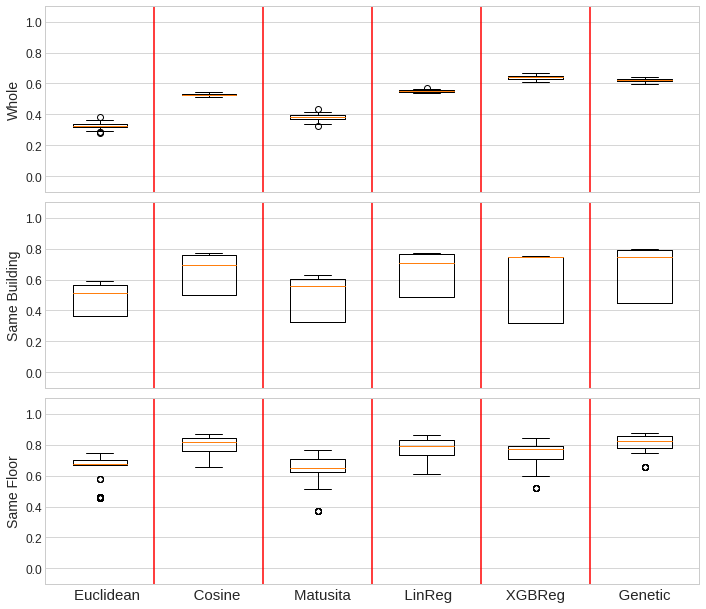



Genetic: 0.6209022476353748
Euclidean: 0.3262796734864833 0.0
Cosine: 0.5268452986266081 0.0
Matusita: 0.38155135812822366 0.0
Linear Regression: 0.5509697138385505 0.0
XGB Regression: 0.6409792710831292 1.0


Genetic: 0.7489477716321479
Euclidean: 0.5099847801798182 0.0
Cosine: 0.6939930893657593 0.018
Matusita: 0.5585957950970707 0.0
Linear Regression: 0.7064138260365748 0.0087
XGB Regression: 0.7436789399091687 0.0011


Genetic: 0.8240566476382385
Euclidean: 0.6782948121830669 0.0
Cosine: 0.81670071506751 0.1806
Matusita: 0.6485556783294064 0.0
Linear Regression: 0.7925512718035634 0.0014
XGB Regression: 0.7760596552065999 0.0


In [32]:
# Summary boxplots


full_val_boxplots = []

first_block = map_to_macro_block[list(map_to_macro_block.keys())[0]]
map_corrs_first_block_norm , _, _, _ = first_block[list(first_block.keys())[0]]
num_metrics = len(map_corrs_first_block_norm) 

image_width = 30
image_height = (image_width / (len(list_norm_funcs) + 1)) * (num_metrics + 1)

for key in map_to_macro_block.keys():
    
    val_boxplots = np.zeros((num_metrics, len(map_to_macro_block[key].keys()), num_run)) # serve per plottare i boxplot
    val_corr_plots = np.zeros((num_metrics, len(map_to_macro_block[key].keys())))
    
    for col, norm_func in enumerate(map_to_macro_block[key].keys()):
        map_corrs, map_means, map_stds, merged_dfs = map_to_macro_block[key][norm_func]
        merged_df = merged_dfs[-1]

        for row in range(num_metrics):
            
            column_1 = merged_df[str(list_metrics[0])]
            column_2 = merged_df[list(map_corrs.keys())[row]]
            correlation = pearsonr(column_1, column_2)
            correlation = correlation[0]

            assert round(correlation, 4) == round(map_corrs[list(map_corrs.keys())[row]][-1], 4)

            val_boxplots[row, col, :] = map_corrs[list(map_corrs.keys())[row]]
            val_corr_plots[row, col] = correlation
    

    full_val_boxplots.append(list(val_boxplots.reshape(1, -1, num_run)[0]))




    

image_width = 10
image_height = 15

plt.style.use('seaborn-whitegrid')

plt.figure(figsize=(image_width, image_height / (num_metrics + 1) * 4))

import matplotlib 
matplotlib.rc('xtick', labelsize=12) 
matplotlib.rc('ytick', labelsize=12) 


y_labels = ['Whole', 'Same Building', 'Same Floor']

for row, full_bPlot in enumerate(full_val_boxplots):
    plt.subplot(len(full_val_boxplots), 1, row+1)
    plt.boxplot(full_bPlot) 
    plt.xticks([], [], rotation=90)
    plt.ylim(-0.1, 1.1)
    for i in range(1, num_metrics):
        plt.axvline(i*len(list_norm_funcs) + 0.5, color="red")
    second_level_label = ""
    if row == len(full_val_boxplots) - 1:
        for lab in [str(x).split("function ")[1].split(" at")[0].replace("minkosky", "minkowksy") for x in map_corrs.keys()]:
            second_level_label = second_level_label + " " + lab
        second_level_label = second_level_label[1:].replace(" ", " "*int(image_width/len(map_corrs.keys()))*13).replace("_metric", "").replace("lr", "LinReg").replace("rf", "XGBReg").replace("_fp", "")
        second_level_label = second_level_label.replace("euclidean", "Euclidean").replace("cosine", "Cosine").replace("matusita", "Matusita").replace("genetic", "Genetic")
        plt.xlabel(second_level_label, fontsize=15)
    plt.ylabel(y_labels[row%len(y_labels)], fontsize=14)    
    
plt.tight_layout()    
plt.savefig('./genetic_results/' + path_string + '/plots/' + dataset + "_" + str(num_samp_per_run) +  '/' + "plottone.pdf")
plt.show()




# https://towardsdatascience.com/how-to-assess-statistical-significance-in-your-data-with-permutation-tests-8bb925b2113d
# we test that i's median is statistically significant higher than j's median
global together 

def permutation_aux(param):
    np.random.seed(param)
    permuted = np.random.permutation(together)
    first = np.median(permuted[:num_run])
    second = np.median(permuted[num_run:])
    return first - second


def calculate_permutation_test(i, j, print_figure=False):
    global together 
    together = np.concatenate([full_bPlot[i], full_bPlot[j]], axis=0)
    gt_diff = np.median(full_bPlot[i]) - np.median(full_bPlot[j])
    random_medians_diffs = []
    
    p = Pool(num_parallel_evals)
    random_medians_diffs = p.map(permutation_aux , list(range(10000)))
    p.close()
    p.join()
    
    if print_figure:
        plt.figure()
        plt.hist(random_medians_diffs)
        plt.axvline(gt_diff, color='red', linestyle='--')
        plt.show()

    return len(np.where(np.asarray(random_medians_diffs) >= gt_diff)[0]) / len(random_medians_diffs)




from scipy.stats import ttest_ind, wilcoxon, mannwhitneyu
from scipy.stats.mstats import kruskalwallis


for row, full_bPlot in enumerate(full_val_boxplots):
    print("\n")
    print("Genetic:", np.median(full_bPlot[5])) 
    print("Euclidean:", np.median(full_bPlot[0]), calculate_permutation_test(5, 0)) # less  | two-sided
    print("Cosine:", np.median(full_bPlot[1]), calculate_permutation_test(5, 1)) 
    print("Matusita:", np.median(full_bPlot[2]), calculate_permutation_test(5, 2)) 
    print("Linear Regression:", np.median(full_bPlot[3]), calculate_permutation_test(5, 3)) 
    print("XGB Regression:", np.median(full_bPlot[4]), calculate_permutation_test(5, 4)) 
    

  0%|          | 0/5 [00:00<?, ?it/s]

[412.11585446 412.11585446 412.11585446 412.11585446 412.11585446]
[412.11585446 412.11585446 412.11585446 412.11585446 412.11585446]
[412.11585446 412.11585446 412.11585446 412.11585446 412.11585446]
[412.11585446 412.11585446 412.11585446 412.11585446 412.11585446]
[412.11585446 412.11585446 412.11585446 412.11585446 412.11585446]
[412.11585446 412.11585446 412.11585446 412.11585446 412.11585446]
euclidean_fp area = 151.9131546824878
cosine area = 244.69766642537002
matusita area = 164.8637135866631
lr_metric area = 244.54157641150414
rf_metric area = 256.8959517346577
genetic_metric area = 266.52862763356455


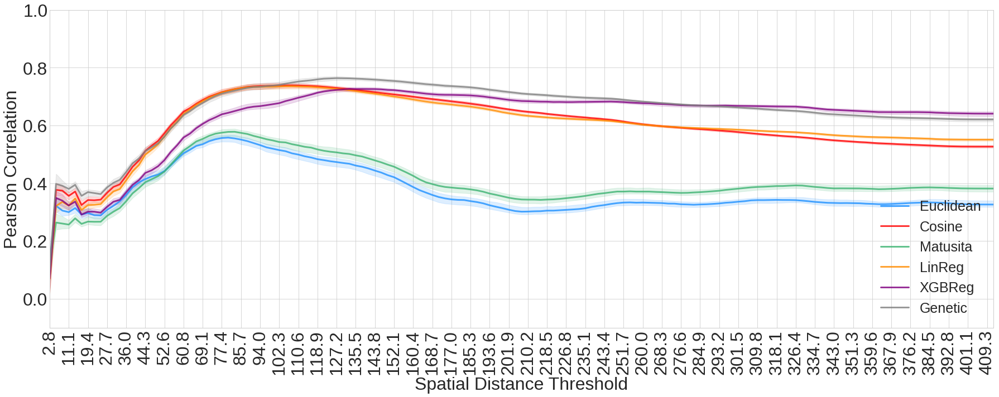

  0%|          | 0/5 [00:00<?, ?it/s]

[164.57568627 164.57568627 164.57568627 164.57568627 164.57568627]
[164.57568627 164.57568627 164.57568627 164.57568627 164.57568627]
[164.57568627 164.57568627 164.57568627 164.57568627 164.57568627]
[164.57568627 164.57568627 164.57568627 164.57568627 164.57568627]
[164.57568627 164.57568627 164.57568627 164.57568627 164.57568627]
[164.57568627 164.57568627 164.57568627 164.57568627 164.57568627]
euclidean_fp area = 72.2787706859563
cosine area = 99.97952191050568
matusita area = 76.32760009780309
lr_metric area = 99.49798385474867
rf_metric area = 95.04456741984889
genetic_metric area = 102.64937425356263


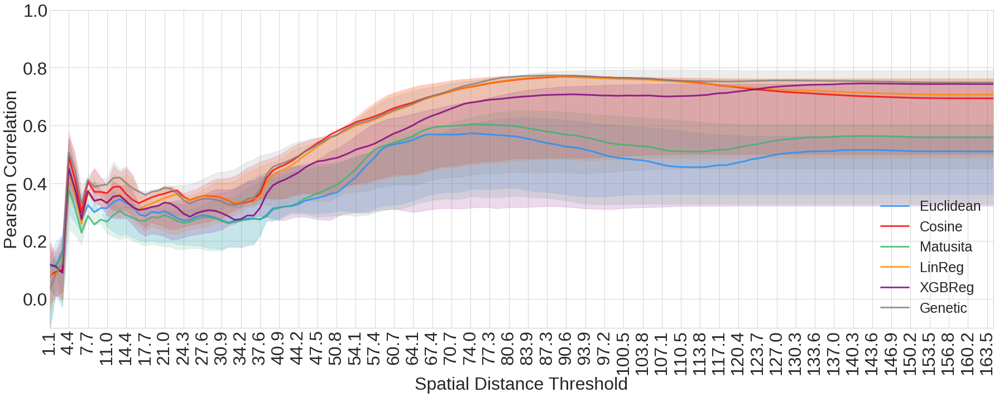

  0%|          | 0/5 [00:00<?, ?it/s]

[164.57568627 164.57568627 164.57568627 164.57568627 164.57568627]
[164.57568627 164.57568627 164.57568627 164.57568627 164.57568627]
[164.57568627 164.57568627 164.57568627 164.57568627 164.57568627]
[164.57568627 164.57568627 164.57568627 164.57568627 164.57568627]
[164.57568627 164.57568627 164.57568627 164.57568627 164.57568627]
[164.57568627 164.57568627 164.57568627 164.57568627 164.57568627]
euclidean_fp area = 91.01888538568494
cosine area = 109.17717459917685
matusita area = 84.90749005955698
lr_metric area = 105.13026125510403
rf_metric area = 98.96872956315055
genetic_metric area = 110.66829653186723


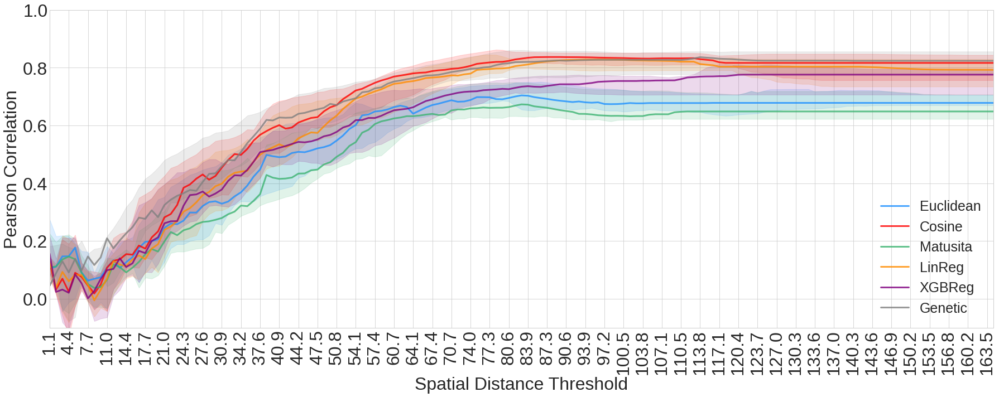

In [33]:
# PEARSON

# Correlations at various spatial distance thresholds

from os import listdir
from scipy.stats import iqr
import random
from numpy import trapz


metric_names = ['Euclidean', 'Cosine', 'Matusita', 'LinReg', 'XGBReg', 'Genetic']



def equalObs(x, nbin):
    nlen = len(x)
    return np.interp(np.linspace(0, nlen, nbin + 1),
                     np.arange(nlen),
                     np.sort(x))




import matplotlib 
matplotlib.rc('xtick', labelsize=12) 
matplotlib.rc('ytick', labelsize=12) 

    
    


def check_nan_consistency(arr):
    if len(arr) > 0:
        if np.sum(arr) > 0:
            assert arr[0]
            check_nan_consistency(arr[1:])


n_cuts = 150 # how many values to consider for the spatial distance threshold


for which_macroblock in map_to_macro_block.keys():
    
    for which_spatial_distance in ['spat_dist_3D']:

        values_to_plot = np.full((len(list_metrics)-1, len(list_norm_funcs), n_cuts, 4), -1.)

        pbar = tqdm(total = (len(list_norm_funcs))*(len(list_metrics)-2))
        for i_norm, which_normalization in enumerate([str(x).split('function ')[1].split(' at')[0] for x in list_norm_funcs if 'bis' not in str(x)]):
            run_files = [x for x in os.listdir('./genetic_results/' + path_string + "/pickle/" + dataset + "_" + str(num_samp_per_run) +  '/run/') if which_macroblock in x and which_normalization in x and 'bis' not in str(x)]
            assert len(run_files) == num_run, str(len(run_files)) + " " + which_normalization

            for i_metric, metric in enumerate([str(x) for x in list_metrics if 'spat_dist' not in str(x)]):

                run_values = np.full((len(run_files), 2, int(num_samp_per_run*num_samp_per_run-num_samp_per_run-(num_samp_per_run*num_samp_per_run-num_samp_per_run)/2)), -1.)

                for i_run, run_file in enumerate(run_files):   
                    file = open('./genetic_results/' + path_string + "/pickle/" + dataset + "_" + str(num_samp_per_run) +  '/run/' + run_file, 'rb')
                    merged_df, b, f = pickle.load(file)
                    file.close()

                    if which_spatial_distance == 'spat_dist_3D':
                        column_1 = merged_df[[x for x in merged_df.columns if which_spatial_distance in str(x)]].values.flatten()
                    else:
                        column_1 = merged_df[[x for x in merged_df.columns if which_spatial_distance in str(x) and not '3D' in str(x)]].values.flatten()
                    column_2 = merged_df[metric].values.flatten()

                    run_values[i_run, 0, :column_1.shape[0]] = column_1
                    run_values[i_run, 1, :column_2.shape[0]] = column_2

                max_eucl_dist = np.max(run_values[:, 0])
                print(np.sort(run_values[:, 0].flatten())[-5:])
                
                cuts = np.linspace(0, max_eucl_dist, n_cuts)
                
                
                for i_cut, cut in enumerate(cuts):
                    corr_vals = []
                    for i_run in range(len(run_values)):
                        to_keep = run_values[i_run, 0] <= cut 
                       
                        to_keep_bis = run_values[i_run, 0] != -1.
                        to_keep = np.logical_and(to_keep, to_keep_bis)
                        if to_keep.sum() >= 10:
                            corr_vals.append(pearsonr(run_values[i_run, 0, :][to_keep], run_values[i_run, 1, :][to_keep])[0])
                    corr_vals = np.asarray(corr_vals)
                    if len(corr_vals) < 10:
                        print("Estimating with just ", len(corr_vals), " observations considering the threshold ", cut)
                    
                    values_to_plot[i_metric, i_norm, i_cut, 0] = cut
                    if len(corr_vals) == 0:
                        print("No observations for the threshold ", cut)
                        values_to_plot[i_metric, i_norm, i_cut, 1] = np.nan
                        values_to_plot[i_metric, i_norm, i_cut, 2] = np.nan
                        values_to_plot[i_metric, i_norm, i_cut, 3] = np.nan
                    else:
                        values_to_plot[i_metric, i_norm, i_cut, 1] = np.median(corr_vals)
                        values_to_plot[i_metric, i_norm, i_cut, 2] = np.percentile(corr_vals, 25)
                        values_to_plot[i_metric, i_norm, i_cut, 3] = np.percentile(corr_vals, 75)
                pbar.update(1)
        pbar.close() 
    

        i_norm = 0
        non_nan_values = np.logical_not(np.isnan(values_to_plot[i_metric, i_norm, :, 1]))
        check_nan_consistency(np.isnan(values_to_plot[i_metric, i_norm, :, 1]))
        normalization_colors = ['dodgerblue', 'red', 'mediumseagreen', 'darkorange', 'purple', 'grey']
        plt.figure(figsize=(25, 10))
        plt.tick_params(axis = 'both', which = 'major', labelsize = 32)
        plt.tick_params(axis = 'both', which = 'minor', labelsize = 27)
        for i_metric, metric in enumerate([str (x) for x in list_metrics if 'spat_dist' not in str(x)]):
            #plt.title(which_macroblock)
            plt.xlabel("Spatial Distance Threshold", fontsize=32)
            plt.ylabel("Pearson Correlation", fontsize=32)
            plt.xticks(values_to_plot[i_metric, 0, :, 0][non_nan_values][0::3], rotation=90)
            plt.xlim(min(values_to_plot[i_metric, 0, :, 0][non_nan_values]), max(values_to_plot[i_metric, 0, :, 0][non_nan_values]))
            plt.ylim(-0.1, 1)
            which_metric = str(metric).split('function ')[1].split(' at')[0].replace("minkosky", "minkowksy")
            plt.plot(values_to_plot[i_metric, i_norm, :, 0][non_nan_values], values_to_plot[i_metric, i_norm, :, 1][non_nan_values], label=metric_names[i_metric], color=normalization_colors[i_metric], linewidth=3, alpha=0.8)
            plt.fill_between(values_to_plot[i_metric, i_norm, :, 0][non_nan_values], values_to_plot[i_metric, i_norm, :, 2][non_nan_values], values_to_plot[i_metric, i_norm, :, 3][non_nan_values], alpha=0.15, color=normalization_colors[i_metric])
            plt.legend(prop={'size': 25}, loc='lower right')
            area = trapz(values_to_plot[i_metric, i_norm, :, 1][non_nan_values], dx=max_eucl_dist/n_cuts)
            print(which_metric, "area =", area)#, area_sx)
        plt.tight_layout()    
        plt.savefig('./genetic_results/' + path_string + '/plots/' + dataset + "_" + str(num_samp_per_run) + "/thresholds-" + which_macroblock + "-" + which_spatial_distance +".pdf")
        plt.show()     





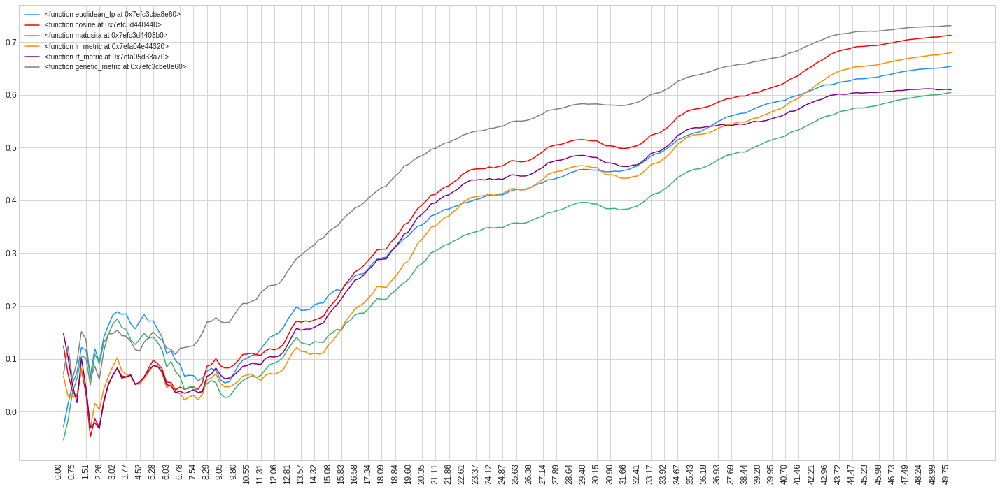

In [34]:

# Now I want to build the correlation curves for each distinct building/floor combination


cuts = np.linspace(0, 50, 200)


# This array will contain, for each metric, a triple (spatial_distance, metric_distance, building_id, floor_id)
run_values = np.full((len(run_files), int(num_samp_per_run*num_samp_per_run-num_samp_per_run-(num_samp_per_run*num_samp_per_run-num_samp_per_run)/2), 6, 4), -1.)

run_files = [x for x in os.listdir('./genetic_results/' + path_string + "/pickle/" + dataset + "_" + str(num_samp_per_run) +  '/run/') if which_macroblock in x and 'False_True' in x and 'bis' not in str(x)]
for i_run, run_file in enumerate(run_files):   
    file = open('./genetic_results/' + path_string + "/pickle/" + dataset + "_" + str(num_samp_per_run) +  '/run/' + run_file, 'rb')
    merged_df, bld, flr = pickle.load(file)
    file.close()
    for i_metric, metric in enumerate([str(x) for x in list_metrics if 'spat_dist' not in str(x)]):
        column_1 = merged_df[[x for x in merged_df.columns if which_spatial_distance in str(x)]].values.flatten()
        column_2 = merged_df[metric].values.flatten()
        run_values[i_run, :column_1.shape[0], i_metric, 0] = column_1
        run_values[i_run, :column_2.shape[0], i_metric, 1] = column_2
        run_values[i_run, :column_2.shape[0], i_metric, 2] = bld
        run_values[i_run, :column_2.shape[0], i_metric, 3] = flr
        
run_values = run_values.reshape(run_values.shape[0] * run_values.shape[1], 6, 4)
non_null_indexes = np.where(run_values[:, 0, 0] != -1)[0]
run_values = run_values[non_null_indexes]

# Map that keeps track of the correlation curves of the different metrics values for each building/floor combination
bldflr_map_curve = {}
prova = run_values[:, 0, [2,3]]
sorted_idx = np.lexsort(prova.T)
sorted_data = prova[sorted_idx,:]
row_mask = np.append([True],np.any(np.diff(sorted_data,axis=0),1))
unique_bldflr = sorted_data[row_mask]
for i in range(len(unique_bldflr)):
    temp_map = {}
    ref_bld = unique_bldflr[i, 0]
    ref_flr = unique_bldflr[i, 1]
    for i_metric, metric in enumerate([str(x) for x in list_metrics if 'spat_dist' not in str(x)]):
        temp_vals = run_values[(run_values[:, i_metric, 2] == ref_bld) & (run_values[:, i_metric, 3] == ref_flr)]
        temp_vals_0 = temp_vals[:, i_metric, 0]
        temp_vals_1 = temp_vals[:, i_metric, 1]
        sorted_idxs = np.argsort(temp_vals_0)
        temp_vals_0 = temp_vals_0[sorted_idxs]
        temp_vals_1 = temp_vals_1[sorted_idxs]   
        corr_vals = []
        for i_cut, cut in enumerate(cuts):
            to_keep = temp_vals_0 <= cut
            if to_keep.sum() >= 10:
                corr_vals.append(pearsonr(temp_vals_0[to_keep], temp_vals_1[to_keep])[0])
            else:
                corr_vals.append(np.nan)
        assert len(corr_vals) == len(cuts)
        temp_map[i_metric] = [cuts, np.asarray(corr_vals)]   
    bldflr_map_curve[(ref_bld, ref_flr)] = temp_map
    

    
# Print, for instance, the correlation curves for building_id=0 and floor_id=1

plt.figure(figsize=(25, 12))
for i_metric, metric in enumerate([str(x) for x in list_metrics if 'spat_dist' not in str(x)]):
    temp = bldflr_map_curve[(0,1)][i_metric]
    non_nans = np.where(np.logical_not(np.isnan(temp[1])))[0]
    temp_x = temp[0][non_nans]
    temp_y = temp[1][non_nans]
    plt.plot(temp_x, temp_y, label=metric, color=normalization_colors[i_metric])
    plt.xticks([x for i, x in enumerate(temp[0]) if i%3 == 0], rotation=90)
    plt.legend()
plt.show()


In [35]:
import gc
gc.collect()

115792

In [36]:
# 3-NN error according to the different metrics


from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from scipy.spatial.distance import cosine
from sklearn.metrics import mean_squared_error
from sklearn.metrics.pairwise import euclidean_distances, cosine_distances
from sklearn.utils.extmath import weighted_mode


if not os.path.exists('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) +  '/KNN/'):
    os.makedirs('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) +  '/KNN/')
else:
    shutil.rmtree('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) +  '/KNN/')
    os.makedirs('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) +  '/KNN/')
    
    



metrics = ['euclidean', 'cosine', 'matusita', 'lr', 'xgb', 'genetic'] 





col_preds = [x for x in dataframe_train_normalized.columns if 'WAP' in x]
X_data_train = dataframe_train_normalized[col_preds]
X_data_test = dataframe_test_normalized[col_preds]



def euclidean_knn(X_in, Y_in=None):
    if Y_in is None:
        return euclidean_distances(X_in)
    else:
        return euclidean_distances(Y_in, X_in)
    
def cosine_knn(X_in, Y_in=None):
    if Y_in is None:
        return cosine_distances(X_in)
    else:
        return cosine_distances(Y_in, X_in)
    
def matusita_knn(X_in, Y_in=None):
    if Y_in is None:
        return euclidean_distances(np.sqrt(X_in))
    else:
        return euclidean_distances(np.sqrt(Y_in), np.sqrt(X_in))
    
    
    
    
load_from_disk = False
save_to_disk = False



# For each test instance, determine the indexes corresponding to training instances with a different building and/or floor
train_refs = dataframe_train_normalized[['building_id', 'floor_id']].values
def determine_masks(refs):
    if len(refs.shape) == 2:
        matrix_mask = np.zeros((len(dataframe_test_normalized), len(dataframe_train_normalized))).astype('int8')
        for i in range(len(dataframe_test_normalized)):
            matrix_mask[i,:] = ((refs[i,0] != train_refs[:,0]) | (refs[i,1] != train_refs[:,1])).astype('int8')
        matrix_mask = matrix_mask.astype('bool')
    else:
        matrix_mask = np.zeros((len(dataframe_test_normalized), len(dataframe_train_normalized))).astype('int8')
        for i in range(len(dataframe_test_normalized)):
            matrix_mask[i,:] = (refs[i] != train_refs[:,0]).astype('int8')
        matrix_mask = matrix_mask.astype('bool')
    return matrix_mask




if load_from_disk:
    
    print("Loading from disk...")
    
    file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/euclidean_matrix_train', 'rb')
    euclidean_matrix_train = pickle.load(file)
    file.close()
    file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/euclidean_matrix_test', 'rb')
    euclidean_matrix_test = pickle.load(file)
    file.close()

    file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/cosine_matrix_train', 'rb')
    cosine_matrix_train = pickle.load(file)
    file.close()
    file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/cosine_matrix_test', 'rb')
    cosine_matrix_test = pickle.load(file)
    file.close()

    file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/matusita_matrix_train', 'rb')
    matusita_matrix_train = pickle.load(file)
    file.close()
    file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/matusita_matrix_test', 'rb')
    matusita_matrix_test = pickle.load(file)
    file.close()

    file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/lr_matrix_train', 'rb')
    lr_matrix_train = pickle.load(file)
    file.close()
    file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/lr_matrix_test', 'rb')
    lr_matrix_test = pickle.load(file)
    file.close()

    file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/rf_matrix_train', 'rb')
    rf_matrix_train = pickle.load(file)
    file.close()
    file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/rf_matrix_test', 'rb')
    rf_matrix_test = pickle.load(file)
    file.close()

else:   
    
    # Calculate the distance matrixes and set to 9999 the distances between test instances and training instances belonging to a different building and/or floor
    print("Calculating Euclidean matrix...")    
    euclidean_matrix_train = euclidean_knn(X_data_train)
    euclidean_matrix_test = euclidean_knn(X_data_train, X_data_test)    

    print("Calculating Cosine matrix...")    
    cosine_matrix_train = cosine_knn(X_data_train)
    cosine_matrix_test = cosine_knn(X_data_train, X_data_test)

    print("Calculating Matusita matrix...")    
    matusita_matrix_train = matusita_knn(X_data_train)
    matusita_matrix_test = matusita_knn(X_data_train, X_data_test)

    print("Calculating LR matrix...")    
    lr_matrix_train = lr_metric(euclidean_matrix_train.astype('float32').flatten(), cosine_matrix_train.astype('float32').flatten(), matusita_matrix_train.astype('float32').flatten()).reshape(cosine_matrix_train.shape)
    lr_matrix_test = lr_metric(euclidean_matrix_test.astype('float32').flatten(), cosine_matrix_test.astype('float32').flatten(), matusita_matrix_test.astype('float32').flatten()).reshape(cosine_matrix_test.shape)
    min_train_val = np.min(lr_matrix_train)
    lr_matrix_train = lr_matrix_train + 100 #abs(min_train_val)
    lr_matrix_test = lr_matrix_test + 100 #abs(min_train_val)

    print("Calculating XGB matrix...")    
    rf_matrix_train = rf_metric(euclidean_matrix_train.astype('float32').flatten(), cosine_matrix_train.astype('float32').flatten(), matusita_matrix_train.astype('float32').flatten()).reshape(cosine_matrix_train.shape)
    rf_matrix_test = rf_metric(euclidean_matrix_test.astype('float32').flatten(), cosine_matrix_test.astype('float32').flatten(), matusita_matrix_test.astype('float32').flatten()).reshape(cosine_matrix_test.shape)
    min_train_val = np.min(lr_matrix_train)
    rf_matrix_train = rf_matrix_train + 100 #abs(min_train_val)
    rf_matrix_test = rf_matrix_test + 100 #abs(min_train_val)
    
    if save_to_disk:
        file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/euclidean_matrix_train', 'wb')
        pickle.dump(euclidean_matrix_train, file)
        file.close()
        file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/euclidean_matrix_test', 'wb')
        pickle.dump(euclidean_matrix_test, file)
        file.close()

        file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/cosine_matrix_train', 'wb')
        pickle.dump(cosine_matrix_train, file)
        file.close()
        file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/cosine_matrix_test', 'wb')
        pickle.dump(cosine_matrix_test, file)
        file.close()

        file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/matusita_matrix_train', 'wb')
        pickle.dump(matusita_matrix_train, file)
        file.close()
        file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/matusita_matrix_test', 'wb')
        pickle.dump(matusita_matrix_test, file)
        file.close()

        file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/lr_matrix_train', 'wb')
        pickle.dump(lr_matrix_train, file)
        file.close()
        file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/lr_matrix_test', 'wb')
        pickle.dump(lr_matrix_test, file)
        file.close()

        file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/rf_matrix_train', 'wb')
        pickle.dump(rf_matrix_train, file)
        file.close()
        file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + '/rf_matrix_test', 'wb')
        pickle.dump(rf_matrix_test, file)
        file.close()

     
        
print("Calculating Genetic matrix...")    
genetic_matrix_train = genetic_metric(euclidean_matrix_train.astype('float32').flatten(), cosine_matrix_train.astype('float32').flatten(), matusita_matrix_train.astype('float32').flatten()).reshape(cosine_matrix_train.shape)
genetic_matrix_test = genetic_metric(euclidean_matrix_test.astype('float32').flatten(), cosine_matrix_test.astype('float32').flatten(), matusita_matrix_test.astype('float32').flatten()).reshape(cosine_matrix_test.shape)
min_train_val = np.min(genetic_matrix_train)
genetic_matrix_train = genetic_matrix_train + 100 #abs(min_train_val)
genetic_matrix_test = genetic_matrix_test + 100 #abs(min_train_val)
     
    
    
print("Performing KNN...")
results = []
perrs = []
for metric in metrics:
    print("\n Metric", metric)
    
    # Model to predict building
    y_data_train = dataframe_train_normalized['building_id'].values
    y_data_test_building = dataframe_test_normalized['building_id'].values
    neigh = KNeighborsClassifier(n_neighbors=3, n_jobs=num_parallel_evals, weights='distance', metric='precomputed')
    if metric == 'matusita':
        neigh.fit(matusita_matrix_train, y_data_train)
        preds_building = neigh.predict(matusita_matrix_test)
    elif metric == 'euclidean':
        neigh.fit(euclidean_matrix_train, y_data_train)
        preds_building = neigh.predict(euclidean_matrix_test)
    elif metric == 'cosine':
        neigh.fit(cosine_matrix_train, y_data_train)
        preds_building = neigh.predict(cosine_matrix_test) 
    elif metric == 'genetic':
        neigh.fit(genetic_matrix_train, y_data_train)
        preds_building = neigh.predict(genetic_matrix_test)  
    elif metric == 'lr':
        neigh.fit(lr_matrix_train, y_data_train)
        preds_building = neigh.predict(lr_matrix_test)  
    elif metric == 'xgb':
        neigh.fit(rf_matrix_train, y_data_train)
        preds_building = neigh.predict(rf_matrix_test)  


    # Model to predict floor
    matrix_mask = determine_masks(preds_building)
    y_data_train = dataframe_train_normalized['floor_id'].values
    y_data_test_floor = dataframe_test_normalized['floor_id'].values
    neigh = KNeighborsClassifier(n_neighbors=3, n_jobs=num_parallel_evals, weights='distance', metric='precomputed')
    if metric == 'matusita':
        neigh.fit(matusita_matrix_train, y_data_train)
        tmp = matusita_matrix_test.copy()
        tmp[matrix_mask] = 9999.   
        preds_floor = neigh.predict(tmp)
    elif metric == 'euclidean':
        neigh.fit(euclidean_matrix_train, y_data_train)
        tmp = euclidean_matrix_test.copy()
        tmp[matrix_mask] = 9999. 
        preds_floor = neigh.predict(tmp)
    elif metric == 'cosine':
        neigh.fit(cosine_matrix_train, y_data_train)
        tmp = cosine_matrix_test.copy()
        tmp[matrix_mask] = 9999. 
        preds_floor = neigh.predict(tmp) 
    elif metric == 'genetic':
        neigh.fit(genetic_matrix_train, y_data_train)
        tmp = genetic_matrix_test.copy()
        tmp[matrix_mask] = 9999. 
        preds_floor = neigh.predict(tmp) 
    elif metric == 'lr':
        neigh.fit(lr_matrix_train, y_data_train)
        tmp = lr_matrix_test.copy()
        tmp[matrix_mask] = 9999. 
        preds_floor = neigh.predict(tmp)  
    elif metric == 'xgb':
        neigh.fit(rf_matrix_train, y_data_train)
        tmp = rf_matrix_test.copy()
        tmp[matrix_mask] = 9999. 
        preds_floor = neigh.predict(tmp)  
    
    okbuilding = np.sum((y_data_test_building == preds_building)) / len(X_data_test)
    successful_instances = (y_data_test_building == preds_building) & (y_data_test_floor == preds_floor)
    srate = np.sum(successful_instances) / len(X_data_test)
    print("Success rate:", srate)
    
    # Among the correctly classified instances, evaluate the positioning error (RMSE)
    matrix_mask = determine_masks(np.concatenate([preds_building.reshape(-1,1), preds_floor.reshape(-1,1)], axis=1))
        
    col_targets = [x for x in dataframe_train_normalized.columns if 'coord_' in x]
    y_data_train = dataframe_train_normalized[col_targets].values
    y_data_test = dataframe_test_normalized[col_targets].values
    neigh = KNeighborsRegressor(n_neighbors=3, n_jobs=num_parallel_evals, weights='distance', metric='precomputed')
    if metric == 'matusita':
        neigh.fit(matusita_matrix_train, y_data_train)
        tmp = matusita_matrix_test.copy()
        tmp[matrix_mask] = 9999.   
        preds = neigh.predict(tmp)
    elif metric == 'euclidean':
        neigh.fit(euclidean_matrix_train, y_data_train)
        tmp = euclidean_matrix_test.copy()
        tmp[matrix_mask] = 9999.   
        preds = neigh.predict(tmp)
    elif metric == 'cosine':
        neigh.fit(cosine_matrix_train, y_data_train)
        tmp = cosine_matrix_test.copy()
        tmp[matrix_mask] = 9999.   
        preds = neigh.predict(tmp)  
    elif metric == 'genetic':
        neigh.fit(genetic_matrix_train, y_data_train)
        tmp = genetic_matrix_test.copy()
        tmp[matrix_mask] = 9999.   
        preds = neigh.predict(tmp)  
    elif metric == 'lr':
        neigh.fit(lr_matrix_train, y_data_train)
        tmp = lr_matrix_test.copy()
        tmp[matrix_mask] = 9999. 
        preds = neigh.predict(tmp)  
    elif metric == 'xgb':
        neigh.fit(rf_matrix_train, y_data_train)
        tmp = rf_matrix_test.copy()
        tmp[matrix_mask] = 9999. 
        preds = neigh.predict(tmp)  

    perr = np.linalg.norm(y_data_test[successful_instances] - preds[successful_instances], axis=1)
    perrs.append(perr)
    rmse = np.sqrt(mean_squared_error(y_data_test[successful_instances], preds[successful_instances]))
    print('Pos error', np.mean(perr), np.std(perr))

    results.append([metric, okbuilding, srate, np.mean(perr), np.std(perr), rmse])
    
    
    if metric == 'genetic':
        matrix_mask_genetic = matrix_mask.copy()
        successful_instances_genetic = successful_instances.copy()
    elif metric == 'cosine':
        matrix_mask_cosine = matrix_mask.copy()
        successful_instances_cosine = successful_instances.copy()
    elif metric == 'euclidean':
        matrix_mask_euclidean = matrix_mask.copy()
        successful_instances_euclidean = successful_instances.copy()
    elif metric == 'matusita':
        matrix_mask_matusita = matrix_mask.copy()
        successful_instances_matusita = successful_instances.copy()        
    elif metric == 'lr':
        matrix_mask_lr = matrix_mask.copy()
        successful_instances_lr = successful_instances.copy()  
    elif metric == 'xgb':
        matrix_mask_rf = matrix_mask.copy()
        successful_instances_rf = successful_instances.copy()  
    
    
results = pd.DataFrame(results, columns=['metric', 'ok_building', 'success_rate', 'average_positioning_error', 'stddev_positioning_error', 'rmse_positioning'])


print("\n")

display(results)


file = open('./genetic_results/' + path_string + '/pickle/' + dataset + "_" + str(num_samp_per_run) + '/KNN' + "/positioning_performances", 'wb')
pickle.dump(results, file)
file.close()

Calculating Euclidean matrix...
Calculating Cosine matrix...
Calculating Matusita matrix...
Calculating LR matrix...
Calculating XGB matrix...
Calculating Genetic matrix...
Performing KNN...

 Metric euclidean
Success rate: 0.8883888388838884
Pos error 7.785596260435435 8.122409768393032

 Metric cosine
Success rate: 0.9198919891989199
Pos error 7.560081248435751 7.468721692356219

 Metric matusita
Success rate: 0.8325832583258326
Pos error 9.00348211460905 8.363847633421207

 Metric lr
Success rate: 0.8703870387038704
Pos error 9.220588913885035 7.922043154294267

 Metric xgb
Success rate: 0.9171917191719172
Pos error 7.75752546901608 7.5474391552795135

 Metric genetic
Success rate: 0.9234923492349235
Pos error 6.699282927333037 7.260552063433881




,metric,ok_building,success_rate,average_positioning_error,stddev_positioning_error,rmse_positioning
0,euclidean,0.9973,0.888389,7.785596,8.122410,6.495872
1,cosine,1.0000,0.919892,7.560081,7.468722,6.135596
2,matusita,0.9964,0.832583,9.003482,8.363848,7.094990
3,lr,0.9991,0.870387,9.220589,7.922043,7.018500
4,xgb,0.9991,0.917192,7.757525,7.547439,6.248814
5,genetic,0.9991,0.923492,6.699283,7.260552,5.703683


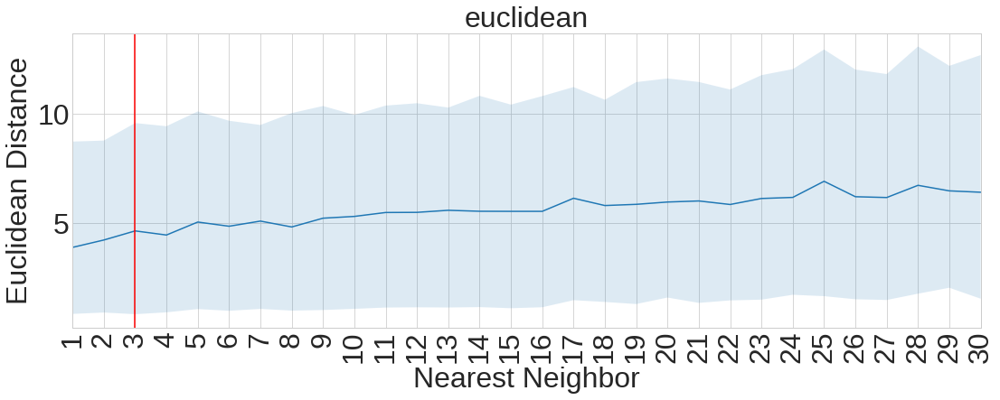

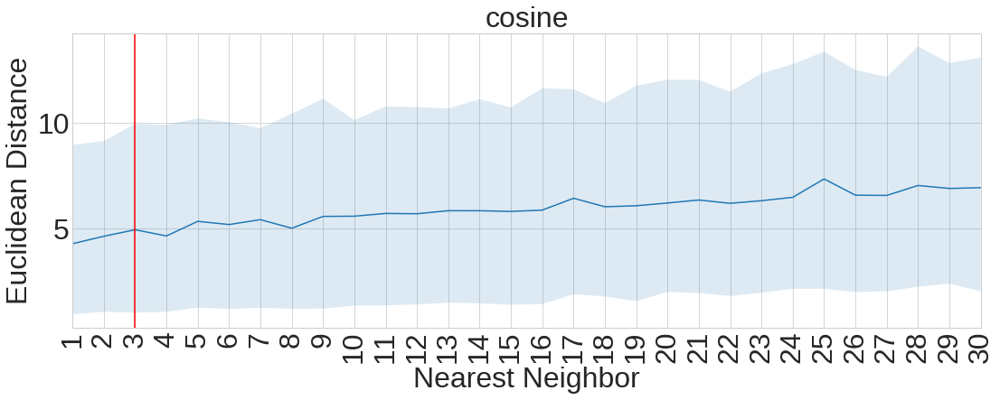

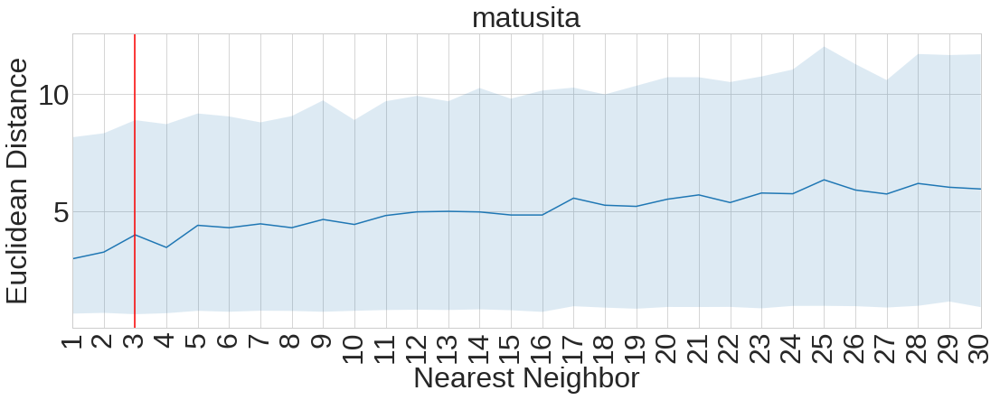

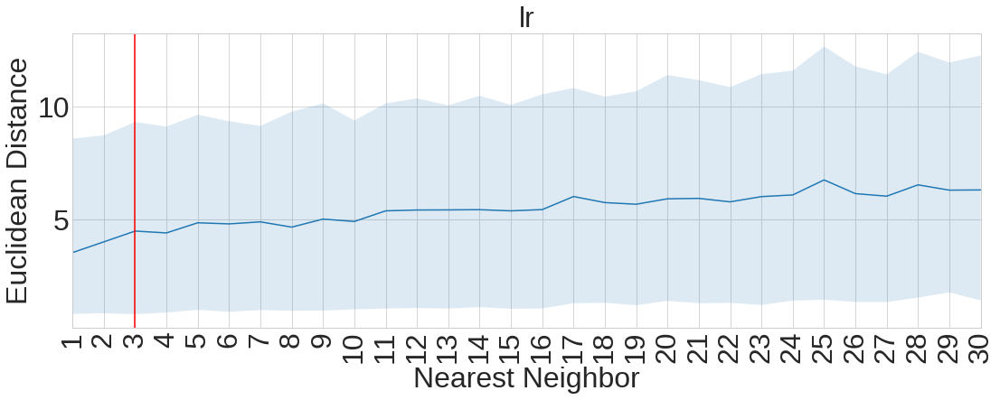

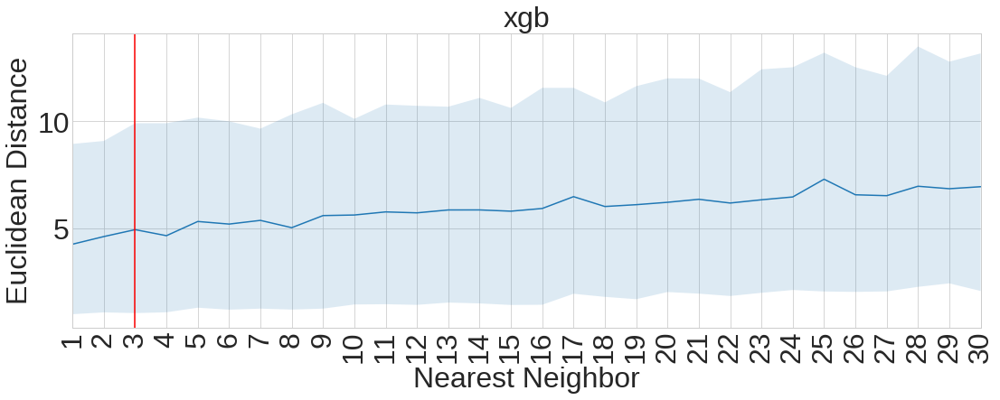

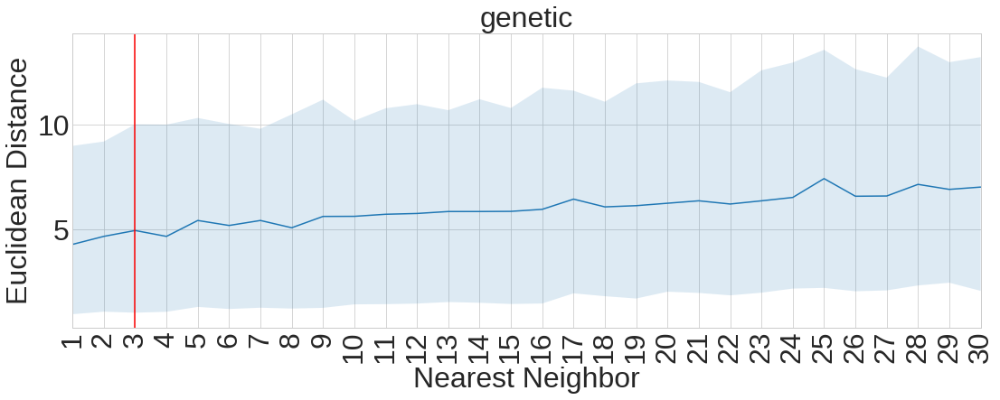

Selected threshold for the area calculations: 21.87819757218762


In [37]:

# How long are the distances from each test point to its neighbors belonging to the training set in the Euclidean space (only considering those with same building and floor)?
# Here the KNN is based on the Genetic fingerprint distance

from sklearn.neighbors import NearestNeighbors

prova_k = 30

all_3rd_neigh_distances = []
for metric in metrics:
    
    if metric == 'genetic':
        matrix_mask = matrix_mask_genetic 
        successful_instances = successful_instances_genetic
    elif metric == 'cosine':
        matrix_mask = matrix_mask_cosine
        successful_instances = successful_instances_cosine
    elif metric == 'euclidean':
        matrix_mask = matrix_mask_euclidean
        successful_instances = successful_instances_euclidean
    elif metric == 'matusita':
        matrix_mask = matrix_mask_matusita
        successful_instances = successful_instances_matusita        
    elif metric == 'lr':
        matrix_mask = matrix_mask_lr
        successful_instances = successful_instances_lr  
    elif metric == 'xgb':
        matrix_mask = matrix_mask_rf
        successful_instances = successful_instances_rf  
    

    neigh = NearestNeighbors(n_neighbors=prova_k, n_jobs=num_parallel_evals, metric='precomputed')
    neigh.fit(genetic_matrix_train)
    tmp = genetic_matrix_test.copy()
    tmp[matrix_mask] = 9999.   
    preds = neigh.kneighbors(tmp, return_distance=False)
    preds = np.asarray(preds)


    neigh_dists = np.zeros((len(preds), prova_k))
    for i in range(len(preds)):
        if not successful_instances[i]:
            continue 
        test_inst_coords = dataframe_test_normalized[['coord_x', 'coord_y', 'coord_z']].iloc[i].values
        temp_dists = []
        for j in range(prova_k):
            temp_dists.append(np.linalg.norm(test_inst_coords - dataframe_train_normalized[['coord_x', 'coord_y', 'coord_z']].iloc[preds[i,j]].values))
        temp_dists = np.asarray(temp_dists)
        neigh_dists[i] = temp_dists


    all_3rd_neigh_distances.extend(neigh_dists[:,3-1])
    
    plt.figure(figsize=(18, 6))
    plt.title(metric, fontsize=32)
    plt.tick_params(axis = 'both', which = 'major', labelsize = 32)
    plt.tick_params(axis = 'both', which = 'minor', labelsize = 27)
    plt.plot([np.median(neigh_dists[:,i]) for i in range(prova_k)])
    plt.fill_between(range(prova_k), [np.percentile(neigh_dists[:,i], 25) for i in range(prova_k)], [np.percentile(neigh_dists[:,i], 75) for i in range(prova_k)], alpha=0.15)
    plt.ylabel("Euclidean Distance", fontsize=32)
    plt.xlabel("Nearest Neighbor", fontsize=32)
    plt.xlim(0, prova_k-1)
    plt.axvline(3-1, color='red')
    plt.xticks(range(prova_k), np.asarray(list(range(prova_k)))+1, rotation=90)
    plt.savefig('./genetic_results/' + path_string + '/plots/' + dataset + "_" + str(num_samp_per_run) + "/knn_dists.png")
    plt.show()

    

dist_thresh_area = np.percentile(all_3rd_neigh_distances, 95)    
print("Selected threshold for the area calculations:", dist_thresh_area)


In [39]:
dist_thresh_area = np.percentile(all_3rd_neigh_distances, 95)    
print("Selected threshold for the area calculations:", dist_thresh_area)


Selected threshold for the area calculations: 21.87819757218762


In [40]:

# Let us calculate, for each metric, its average positioning error on each possible building/floor combination.
# Then, let us calculate its the area under the curve, on the left of dist_thresh_area.
# Are the rankings of the metric given by the positioning error similar to those given by the area, over the different building/floor combinations?
from scipy.signal import savgol_filter


# The map stores, for each metric, its average positioning error and area under the curve for each building/floor combination
metric_map_bldflr_res = {}

# Matrix that keeps, for each metric, its correlation value at the different spatial distances (till the threshold) for each bld/flr combo
arr_corr_per_threshold = np.full((len(metrics), len(bldflr_map_curve.keys()), np.sum(bldflr_map_curve[(0,0)][0][0] <= dist_thresh_area)), -100.)

for i_metric, metric in enumerate(metrics):
    print("\n Metric", metric)
    
    # Model to predict building
    y_data_train = dataframe_train_normalized['building_id'].values
    y_data_test_building = dataframe_test_normalized['building_id'].values
    neigh = KNeighborsClassifier(n_neighbors=3, n_jobs=num_parallel_evals, weights='distance', metric='precomputed')
    if metric == 'matusita':
        neigh.fit(matusita_matrix_train, y_data_train)
        preds_building = neigh.predict(matusita_matrix_test)
    elif metric == 'euclidean':
        neigh.fit(euclidean_matrix_train, y_data_train)
        preds_building = neigh.predict(euclidean_matrix_test)
    elif metric == 'cosine':
        neigh.fit(cosine_matrix_train, y_data_train)
        preds_building = neigh.predict(cosine_matrix_test) 
    elif metric == 'genetic':
        neigh.fit(genetic_matrix_train, y_data_train)
        preds_building = neigh.predict(genetic_matrix_test)  
    elif metric == 'lr':
        neigh.fit(lr_matrix_train, y_data_train)
        preds_building = neigh.predict(lr_matrix_test)  
    elif metric == 'xgb':
        neigh.fit(rf_matrix_train, y_data_train)
        preds_building = neigh.predict(rf_matrix_test)  


    # Model to predict floor
    matrix_mask = determine_masks(preds_building)
    y_data_train = dataframe_train_normalized['floor_id'].values
    y_data_test_floor = dataframe_test_normalized['floor_id'].values
    neigh = KNeighborsClassifier(n_neighbors=3, n_jobs=num_parallel_evals, weights='distance', metric='precomputed')
    if metric == 'matusita':
        neigh.fit(matusita_matrix_train, y_data_train)
        tmp = matusita_matrix_test.copy()
        tmp[matrix_mask] = 9999.   
        preds_floor = neigh.predict(tmp)
    elif metric == 'euclidean':
        neigh.fit(euclidean_matrix_train, y_data_train)
        tmp = euclidean_matrix_test.copy()
        tmp[matrix_mask] = 9999. 
        preds_floor = neigh.predict(tmp)
    elif metric == 'cosine':
        neigh.fit(cosine_matrix_train, y_data_train)
        tmp = cosine_matrix_test.copy()
        tmp[matrix_mask] = 9999. 
        preds_floor = neigh.predict(tmp) 
    elif metric == 'genetic':
        neigh.fit(genetic_matrix_train, y_data_train)
        tmp = genetic_matrix_test.copy()
        tmp[matrix_mask] = 9999. 
        preds_floor = neigh.predict(tmp) 
    elif metric == 'lr':
        neigh.fit(lr_matrix_train, y_data_train)
        tmp = lr_matrix_test.copy()
        tmp[matrix_mask] = 9999. 
        preds_floor = neigh.predict(tmp)  
    elif metric == 'xgb':
        neigh.fit(rf_matrix_train, y_data_train)
        tmp = rf_matrix_test.copy()
        tmp[matrix_mask] = 9999. 
        preds_floor = neigh.predict(tmp)  
    
    okbuilding = np.sum((y_data_test_building == preds_building)) / len(X_data_test)
    successful_instances = (y_data_test_building == preds_building) & (y_data_test_floor == preds_floor)
    srate = np.sum(successful_instances) / len(X_data_test)
    print("Success rate:", srate)
    
    
    
    # Among the correctly classified instances, evaluate the positioning error (RMSE) over the different building/floor combinations
    temp_map = {}
    for bldflr in unique_bldflr:
        correct_insts_bldflr = (preds_building == bldflr[0]) & (preds_floor == bldflr[1]) & (successful_instances)
        
        matrix_mask = determine_masks(np.concatenate([preds_building.reshape(-1,1), preds_floor.reshape(-1,1)], axis=1))

        col_targets = [x for x in dataframe_train_normalized.columns if 'coord_' in x]
        y_data_train = dataframe_train_normalized[col_targets].values
        y_data_test = dataframe_test_normalized[col_targets].values
        neigh = KNeighborsRegressor(n_neighbors=3, n_jobs=num_parallel_evals, weights='distance', metric='precomputed')
        
        if metric == 'matusita':
            neigh.fit(matusita_matrix_train, y_data_train)
            tmp = matusita_matrix_test.copy()
            tmp[matrix_mask] = 9999.   
            preds = neigh.predict(tmp)
        elif metric == 'euclidean':
            neigh.fit(euclidean_matrix_train, y_data_train)
            tmp = euclidean_matrix_test.copy()
            tmp[matrix_mask] = 9999.   
            preds = neigh.predict(tmp)
        elif metric == 'cosine':
            neigh.fit(cosine_matrix_train, y_data_train)
            tmp = cosine_matrix_test.copy()
            tmp[matrix_mask] = 9999.   
            preds = neigh.predict(tmp)  
        elif metric == 'genetic':
            neigh.fit(genetic_matrix_train, y_data_train)
            tmp = genetic_matrix_test.copy()
            tmp[matrix_mask] = 9999.   
            preds = neigh.predict(tmp)  
        elif metric == 'lr':
            neigh.fit(lr_matrix_train, y_data_train)
            tmp = lr_matrix_test.copy()
            tmp[matrix_mask] = 9999. 
            preds = neigh.predict(tmp)  
        elif metric == 'xgb':
            neigh.fit(rf_matrix_train, y_data_train)
            tmp = rf_matrix_test.copy()
            tmp[matrix_mask] = 9999. 
            preds = neigh.predict(tmp)  
 
        avg_perr = np.mean(np.linalg.norm(y_data_test[correct_insts_bldflr] - preds[correct_insts_bldflr], axis=1))
        

        x_vals_raw, y_vals_raw = bldflr_map_curve[tuple(bldflr)][i_metric]
        non_nans = np.logical_not(np.isnan(y_vals_raw))
        
        nan_ixds_check = np.where(np.isnan(y_vals_raw))[0]
        for i_v, v in enumerate(nan_ixds_check):
            assert i_v == v
        
        x_vals = x_vals_raw.copy()[non_nans]
        y_vals = y_vals_raw.copy()[non_nans]
        
        
        # AUC till the cutting threshold
        assert np.sum(np.isnan(y_vals)) == 0
        assert len(x_vals_raw) == len(cuts)
        assert len(y_vals_raw) == len(cuts)
        area = trapz([-1] + list(y_vals[np.where(x_vals <= dist_thresh_area)[0]]), dx=max_eucl_dist/n_cuts) 
        
        # Correlation value at the cutting threshold
        corr_cut = y_vals[np.where(x_vals <= dist_thresh_area)[0][-1]] 

        # Keep track of all correlation values till the threshold
        arr_corr_per_threshold[i_metric, [tuple(x) for x in list(unique_bldflr)].index(tuple(bldflr)),:] = y_vals_raw[x_vals_raw <= dist_thresh_area] 
        
        
        tmp = area # choose whether to consider the area (area) or the just point corresponding to the threshold (corr_cut)
        
        assert not np.isnan(area) and not np.isnan(avg_perr)

        temp_map[tuple(bldflr)] = [avg_perr, tmp]
    metric_map_bldflr_res[i_metric] = temp_map



 Metric euclidean
Success rate: 0.8883888388838884

 Metric cosine
Success rate: 0.9198919891989199

 Metric matusita
Success rate: 0.8325832583258326

 Metric lr
Success rate: 0.8703870387038704

 Metric xgb
Success rate: 0.9171917191719172

 Metric genetic
Success rate: 0.9234923492349235


In [ ]:

from scipy.stats import kendalltau
from scipy.stats import spearmanr
from collections import defaultdict

metric_map_bldflr_res_flipped = defaultdict(dict)
for key, val in metric_map_bldflr_res.items():
    for subkey, subval in val.items():
        metric_map_bldflr_res_flipped[subkey][key] = subval

corr_results = []
for bf in metric_map_bldflr_res_flipped.keys():
    bfmap = metric_map_bldflr_res_flipped[bf]
    avg_perrs = []
    areas = []
    for m in bfmap:
        avg_perr, area = bfmap[m]
        avg_perrs.append(avg_perr)
        areas.append(area)
    avg_perrs = np.asarray(avg_perrs)
    areas = -np.asarray(areas)
    corr_results.append(spearmanr(avg_perrs, areas)[0])
    
plt.figure(figsize=(16, 12))
plt.boxplot(corr_results)
plt.ylabel("Spearman Correlation", fontsize=32)
plt.tick_params(axis = 'both', which = 'major', labelsize = 32)
plt.tick_params(axis = 'both', which = 'minor', labelsize = 27)
plt.xticks([])
plt.tight_layout()
plt.savefig('./genetic_results/' + path_string + '/plots/' + dataset + "_" + str(num_samp_per_run) + "/corrtasks.pdf")
plt.show()
